In [1]:
import importlib
import xarray as xr
import numpy as np
import sys
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib import colors
import pandas as pd
from math import nan
import math
from glob import glob
import datetime as dt

from CASutils import mapplot_utils as maps
from CASutils import filter_utils as filt 

from cmocean import cm as cmo
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import seaborn as sns

%matplotlib inline
sns.set_style("whitegrid")

importlib.reload(maps)
importlib.reload(filt)

<module 'CASutils.filter_utils' from '/home/dhruv/CASanalysis/CASutils/filter_utils.py'>

In [2]:
datdir="/home/data/FLUXNET2015/"
outdir="/home/dhruv/fluxnet/"
stations = glob(outdir+"*.nc")

In [3]:
NH_stations = []

for i in stations:
    temp = xr.open_dataset(i)
    lat, lon = temp.lat.item(), temp.lon.item()
    if (lon > -135 and lon < -60) and (lat > 23 and lat < 70):
        NH_stations.append(i)
        print(i)

/home/dhruv/fluxnet/US-WCr.nc
/home/dhruv/fluxnet/US-Var.nc
/home/dhruv/fluxnet/US-UMB.nc
/home/dhruv/fluxnet/US-Ha1.nc
/home/dhruv/fluxnet/US-Ne3.nc
/home/dhruv/fluxnet/US-GLE.nc
/home/dhruv/fluxnet/US-Blo.nc
/home/dhruv/fluxnet/CA-Man.nc
/home/dhruv/fluxnet/US-NR1.nc
/home/dhruv/fluxnet/US-SRM.nc
/home/dhruv/fluxnet/US-Syv.nc
/home/dhruv/fluxnet/CA-Oas.nc
/home/dhruv/fluxnet/CA-Gro.nc
/home/dhruv/fluxnet/CA-TP4.nc
/home/dhruv/fluxnet/CA-TP1.nc
/home/dhruv/fluxnet/US-Me2.nc
/home/dhruv/fluxnet/US-Oho.nc
/home/dhruv/fluxnet/US-Los.nc
/home/dhruv/fluxnet/CA-Obs.nc
/home/dhruv/fluxnet/US-MMS.nc
/home/dhruv/fluxnet/US-Ne2.nc
/home/dhruv/fluxnet/US-Wkg.nc
/home/dhruv/fluxnet/US-ARM.nc
/home/dhruv/fluxnet/CA-TP3.nc
/home/dhruv/fluxnet/US-Ton.nc


In [4]:
def jja_std_anoms(data):
    data = data.sel(time=~((data.time.dt.month==2) & (data.time.dt.day == 29)))
    daystr = xr.DataArray(data.indexes['time'].strftime('%m-%d'), coords = data.time.coords, name="daystr")
    datseason = data.groupby(daystr).mean('time')
    harmonics = filt.calc_season_nharm(datseason, 4, dimtime=0)
    anoms = data.groupby(daystr)-harmonics
    jja_std = anoms.sel(time=anoms['time.season']=='JJA').std()
    std_anoms = anoms/jja_std
    return std_anoms

In [5]:
# def bootstrap_ci(data, sz, num_iter=100):
#     sample_means = []
#     for i in num_iter:
#         sample = np.random.choice(data, size=sz*len(data))
        
    
# np.random.choice(srm.tas, size=int(0.6*len(srm.tas)))

def lc_bootstrap(heatwave_days, anoms, sz=0.6, num_iter=100):
    lower_bounds, upper_bounds = [], []
    for i in range(-30, 8):
        sample_means = []
        for i in range(num_iter):
            sample = np.random.choice(heatwave_days, int(sz*len(heatwave_days)))
            vals = []
            for day in sample:
                try:
                    prev = day + pd.Timedelta(days=i)
                    vals.append(anoms.sel(time=prev).item())
                except:
                    pass
            sample_means.append(np.mean(vals))
        lower_bounds.append(np.quantile(sample_means, 0.1))
        upper_bounds.append(np.quantile(sample_means, 0.9))
    return lower_bounds, upper_bounds

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:ylabel='Density'>

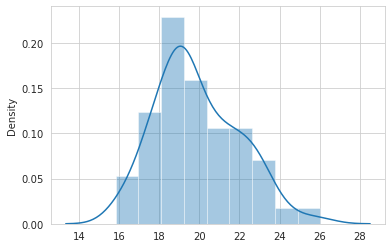

In [7]:
jja_srm_tas = srm.tas.sel(time=srm['time.season']=='JJA')
srm_heatwave_days = jja_srm_tas[jja_srm_tas>=jja_srm_tas.quantile(0.90)].time.values

sample_means = []
for i in range(100):
    sample = np.random.choice(srm_heatwave_days, int(0.6*len(srm_heatwave_days)))
    sample_means.append(srm.slhf.sel(time=sample).mean())
sns.distplot(sample_means)

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


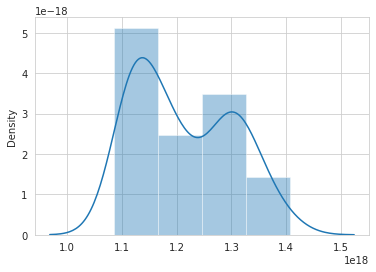

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


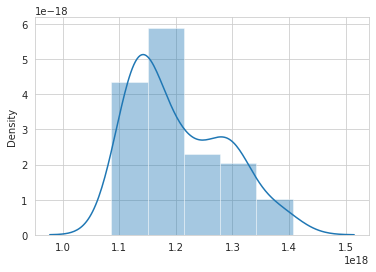

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


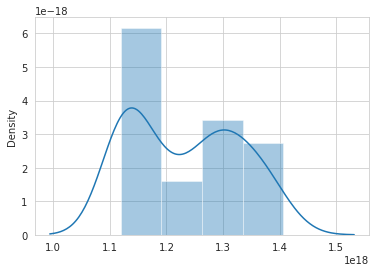

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


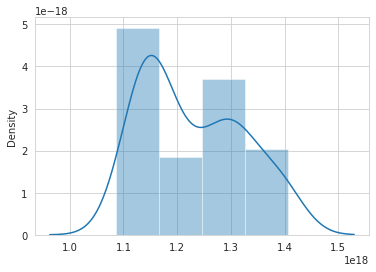

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


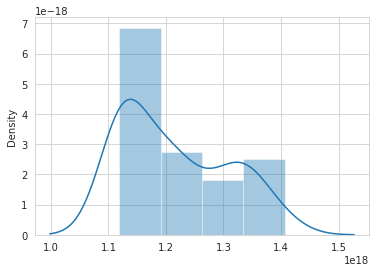

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


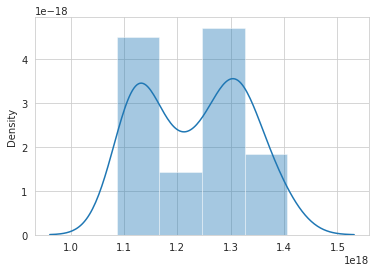

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


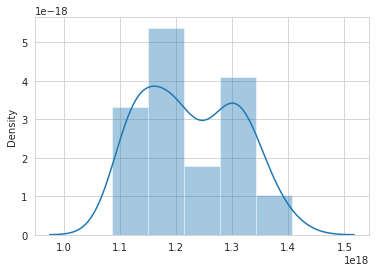

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


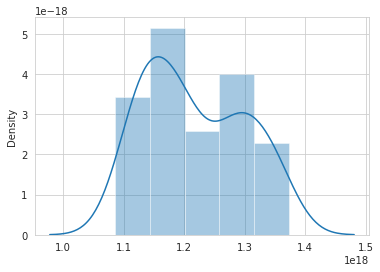

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


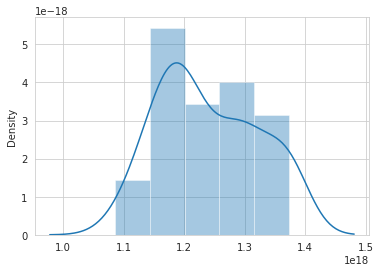

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


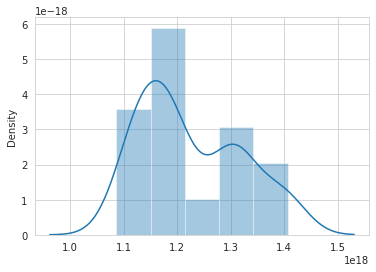

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


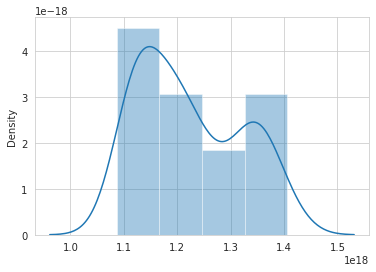

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


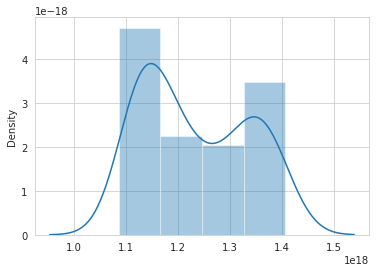

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


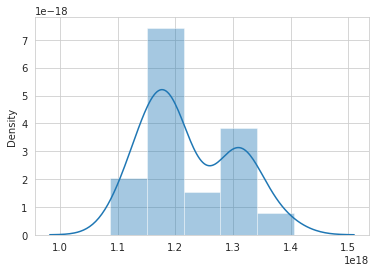

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


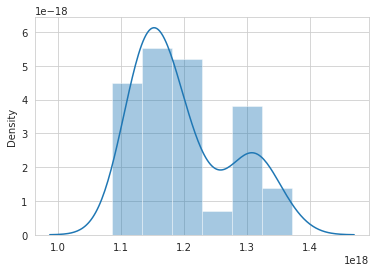

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


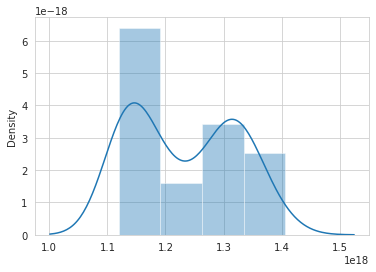

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


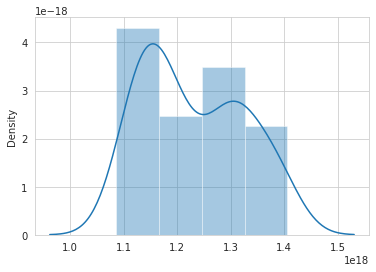

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


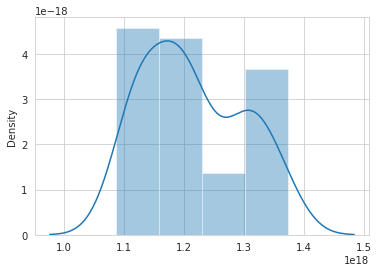

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


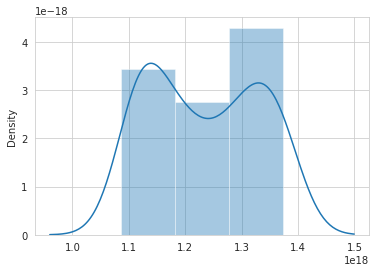

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


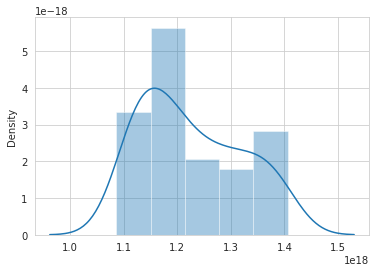

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


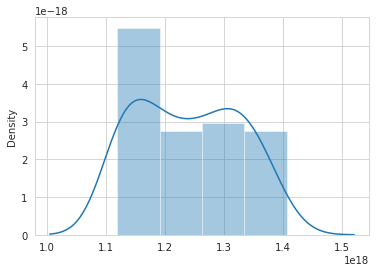

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


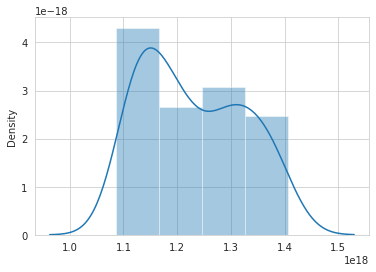

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


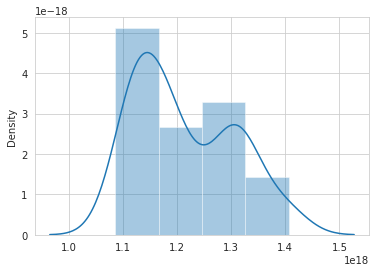

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


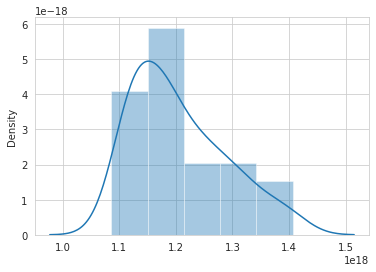

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


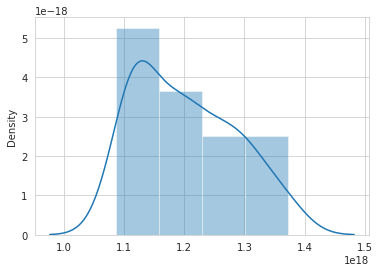

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


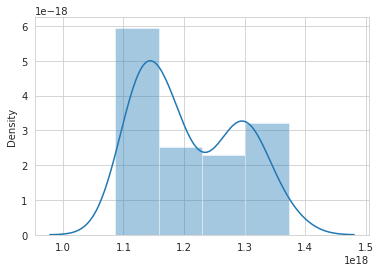

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


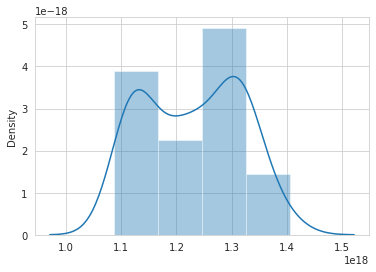

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


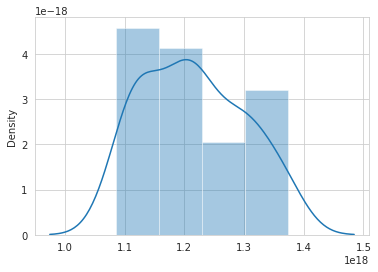

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


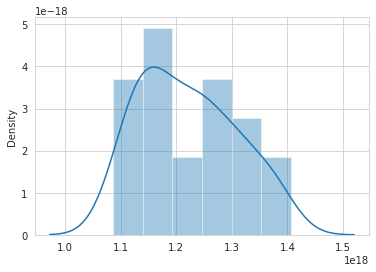

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


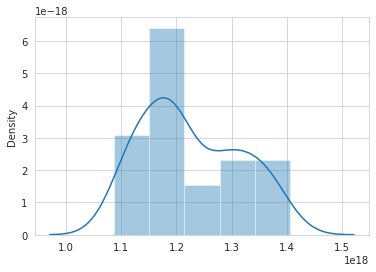

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


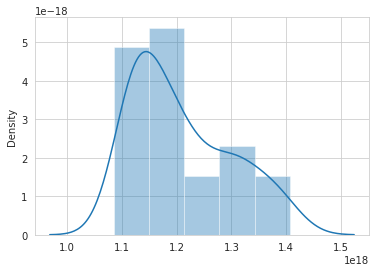

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


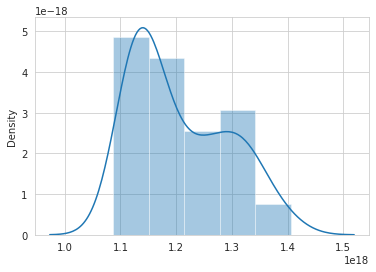

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


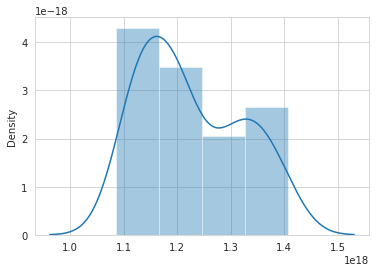

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


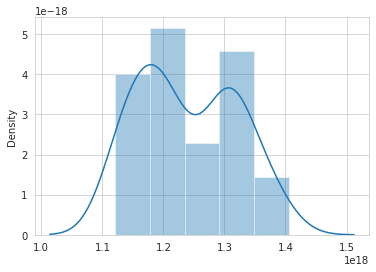

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


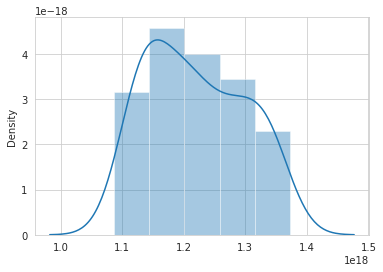

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


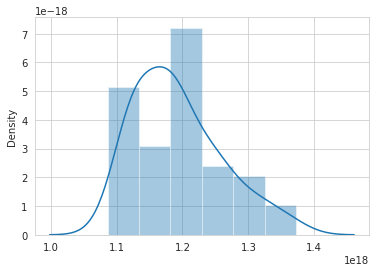

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


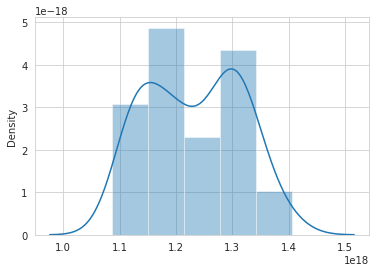

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


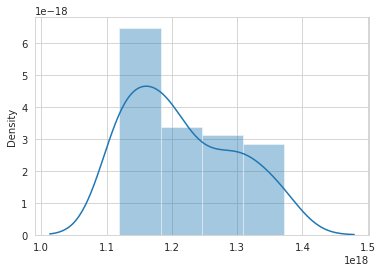

/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


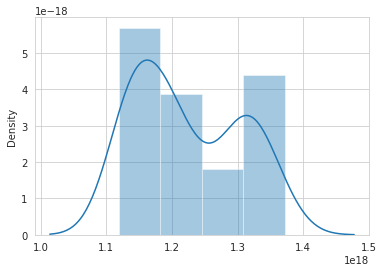

In [8]:
anoms = jja_std_anoms(srm.tas)
for i in range(-30, 8):
    sample_means = []
    for i in range(100):
        sample = np.random.choice(srm_heatwave_days, int(0.6*len(srm_heatwave_days)))
        vals = []
        for day in sample:
            try:
                prev = day + pd.Timedelta(days=i)
                vals.append(anoms.sel(time=prev).item())
            except:
                pass
        sample_means.append(np.mean(vals))
    sns.distplot(sample)
    plt.show()

In [18]:
def lc_helper(heatwave_days, anoms):
    means = []
    for i in range(-30, 8):
        vals = []
        for day in heatwave_days:
            try:
                prev = day + pd.Timedelta(days=i)
                vals.append(anoms.sel(time=prev).item())
            except:
                pass
        means.append(np.mean(vals))
    return means

In [10]:
srm = xr.open_dataset(outdir+"US-SRM.nc")
me2 = xr.open_dataset(outdir+"US-Me2.nc")
tp3 = xr.open_dataset(outdir+"CA-TP3.nc")
ha1 = xr.open_dataset(outdir+"US-Ha1.nc")

In [6]:
srm.tas

<xarray.DataArray 'tas' (time: 4018)>
array([10.039, 10.445,  9.455, ...,  6.183, 11.841,  9.029])
Coordinates:
  * time     (time) datetime64[ns] 2004-01-01 2004-01-02 ... 2014-12-31

In [30]:
jja_std_anoms(srm.tas)

<xarray.DataArray (time: 4015)>
array([ 0.28096951,  0.45050128,  0.0412512 , ..., -1.32909386,
        1.016761  , -0.14003822])
Coordinates:
  * time     (time) datetime64[ns] 2004-01-01 2004-01-02 ... 2014-12-31
    daystr   (time) <U5 '01-01' '01-02' '01-03' ... '12-29' '12-30' '12-31'

In [15]:
def lag_composite(var, long_name=""):
    srm_anoms = jja_std_anoms(srm[var])
#     srm_tas_anoms = jja_std_anoms(srm.tas)
#     jja_srm_tas_anoms = srm_tas_anoms.sel(time=srm_tas_anoms['time.season']=="JJA")
    jja_srm_tas = srm.tas.sel(time=srm['time.season']=='JJA')
    srm_heatwave_days = jja_srm_tas[jja_srm_tas>=jja_srm_tas.quantile(0.90)].time.values
#     srm_heatwave_days = jja_srm_tas_anoms[jja_srm_tas_anoms>=jja_srm_tas_anoms.quantile(0.90)].time.values
    
    me2_anoms = jja_std_anoms(me2[var])
#     me2_tas_anoms = jja_std_anoms(me2.tas)
    jja_me2_tas = me2.tas.sel(time=me2['time.season']=='JJA')
    
    me2_heatwave_days = jja_me2_tas[jja_me2_tas>=jja_me2_tas.quantile(0.90)].time.values

#     me2_heatwave_days = me2.tas[me2.tas>=me2.tas.quantile(0.95)].time.values
    
#     tp3_anoms = jja_std_anoms(tp3[var])
#     jja_tp3_tas = tp3.tas.sel(time=tp3['time.season']=='JJA')
    
#     tp3_heatwave_days = jja_tp3_tas[jja_tp3_tas>=jja_tp3_tas.quantile(0.90)].time.values
    
    ha1_anoms = jja_std_anoms(ha1[var])
    jja_ha1_tas = ha1.tas.sel(time=ha1['time.season']=='JJA')
    
    ha1_heatwave_days = jja_ha1_tas[jja_ha1_tas>=jja_ha1_tas.quantile(0.90)].time.values

#     tp3_heatwave_days = tp3.tas[tp3.tas>=tp3.tas.quantile(0.95)].time.values

#     anoms = remove_seasonality(data)
#     heatwave_days = data[data>=data.quantile(0.95)].time.values
    
    srm_means = lc_helper(srm_heatwave_days, srm_anoms)
    
    srm_ci_l, srm_ci_u = lc_bootstrap(srm_heatwave_days, srm_anoms)
    
    me2_means = lc_helper(me2_heatwave_days, me2_anoms)
    ha1_means = lc_helper(ha1_heatwave_days, ha1_anoms)
    
    days = range(-30, 8)
    fig, ax = plt.subplots(figsize=(12,8))
    
    plt.plot(days, srm_means, '-r')
    plt.fill_between(days, srm_ci_l, srm_ci_u, color='r', alpha=0.1)
    plt.plot(days, me2_means, '-b')
    plt.plot(days, ha1_means, '-g')
    
    custom_lines = [Line2D([0], [0], color='r', lw=4),
                Line2D([0], [0], color='b', lw=4),
                Line2D([0], [0], color='g', lw=4)]

    ax.legend(custom_lines, ['US-SRM (AZ)', 'US-Me2 (OR)', 'US-Ha1 (MA)'])
    
    ax.set_xlabel("num days before/after heatwave")
    ax.set_ylabel("standardized anomalies")
    
    plt.title(long_name)
    plt.show()
        
#     sns.lineplot(x=range(-30, 8), y=means)

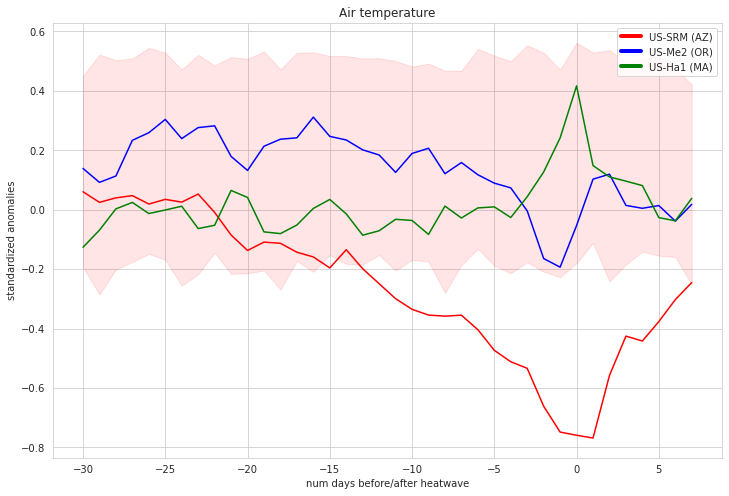

In [17]:
lag_composite("slhf", "Air temperature")

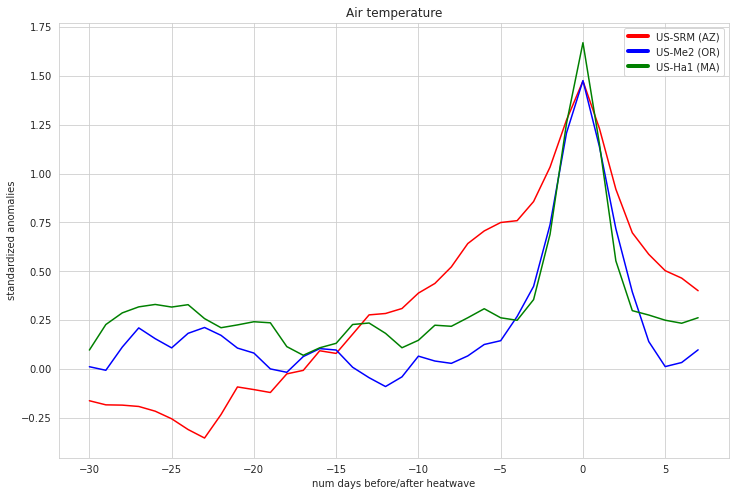

In [59]:
lag_composite("tas", "Air temperature")

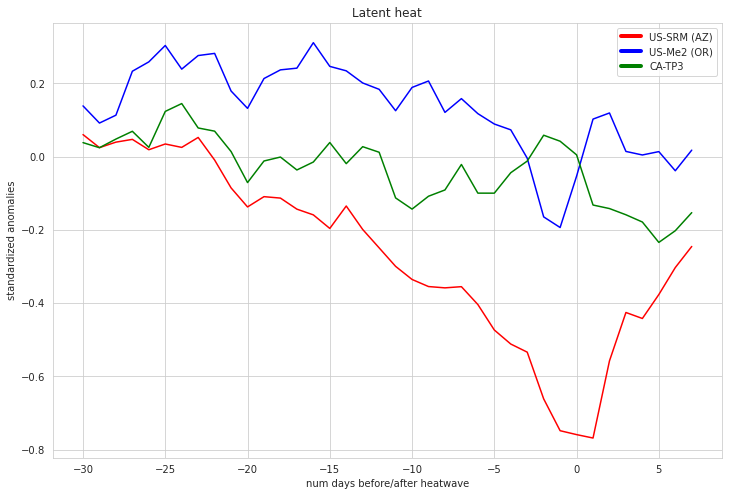

In [54]:
lag_composite("slhf", "Latent heat")

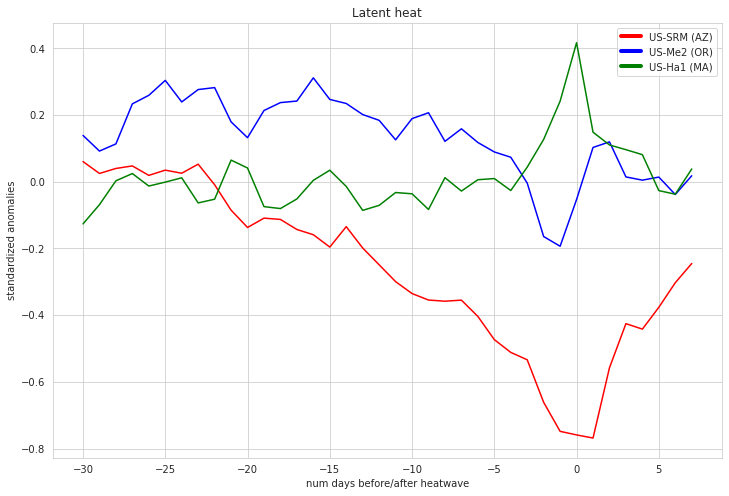

In [58]:
lag_composite("slhf", "Latent heat")

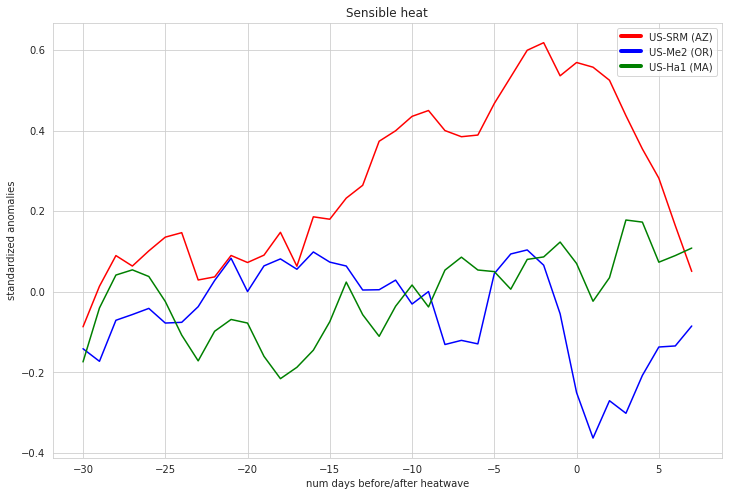

In [60]:
lag_composite("shflx", "Sensible heat")

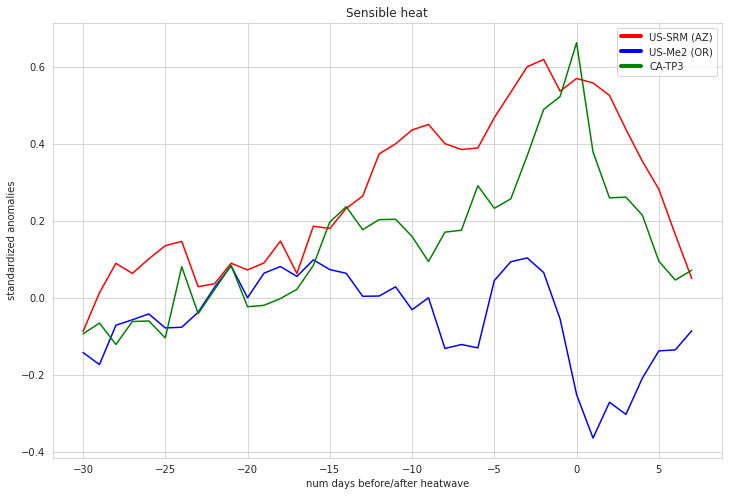

In [53]:
lag_composite("shflx", "Sensible heat")

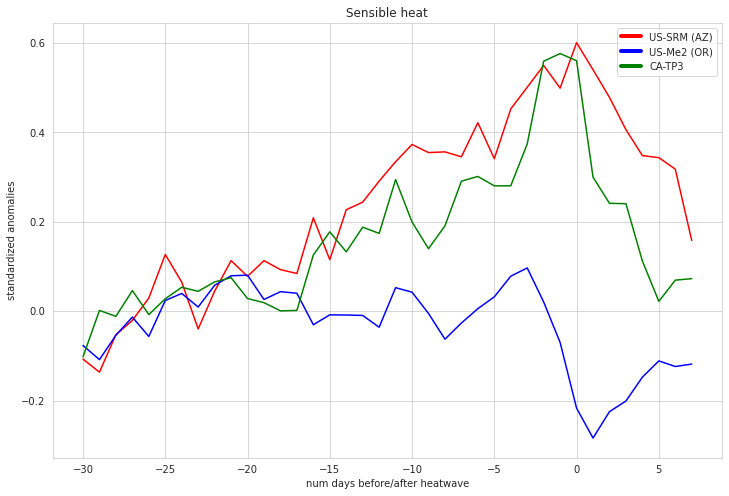

In [8]:
# anoms standardized using whole year instead of jja
lag_composite("shflx", "Sensible heat")

In [5]:
def bootstrap_plot(var):
    for station in NH_stations:
        data = xr.open_dataset(station)
        jja_tas = data.tas.sel(time=data['time.season']=='JJA')
        heatwave_days = jja_tas[jja_tas>=jja_tas.quantile(0.90)].time.values
        sample_means = []
        for i in range(100):
            sample = np.random.choice(heatwave_days, int(0.6*len(heatwave_days)))
            anoms = jja_std_anoms(data[var])
            sample_means.append(anoms.sel(time=sample).mean())
        print(station)
        sns.distplot(sample_means)
        plt.show()

/home/dhruv/fluxnet/US-WCr.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


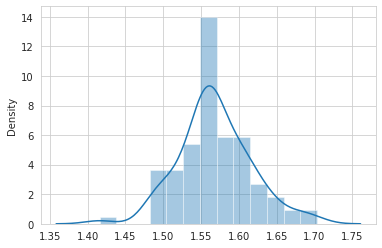

/home/dhruv/fluxnet/US-Var.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


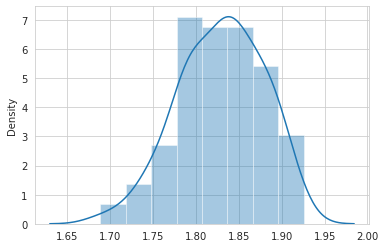

/home/dhruv/fluxnet/US-UMB.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


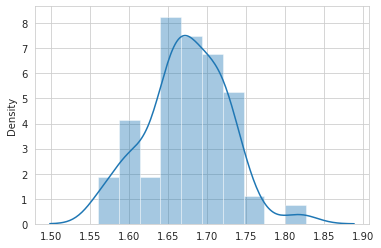

/home/dhruv/fluxnet/US-Ha1.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


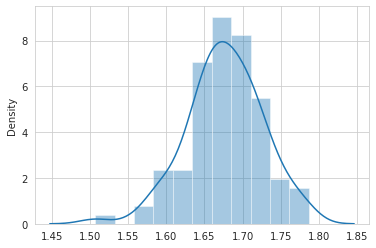

/home/dhruv/fluxnet/US-Ne3.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


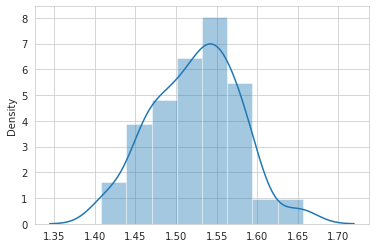

/home/dhruv/fluxnet/US-GLE.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


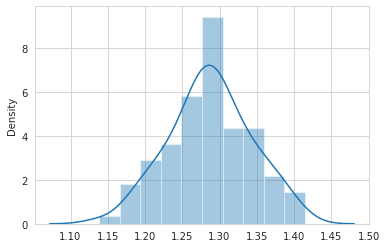

/home/dhruv/fluxnet/US-Blo.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


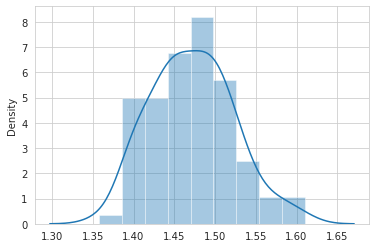

/home/dhruv/fluxnet/CA-Man.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


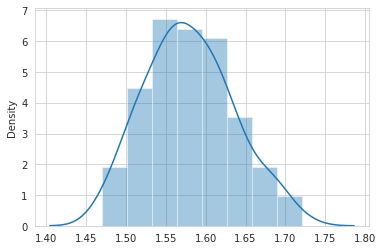

/home/dhruv/fluxnet/US-NR1.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


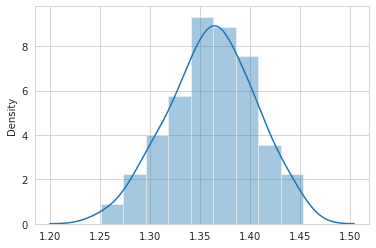

/home/dhruv/fluxnet/US-SRM.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


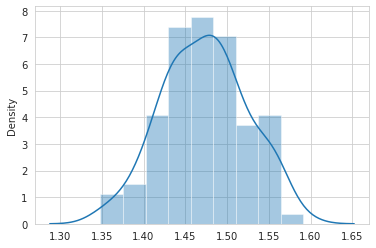

/home/dhruv/fluxnet/US-Syv.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


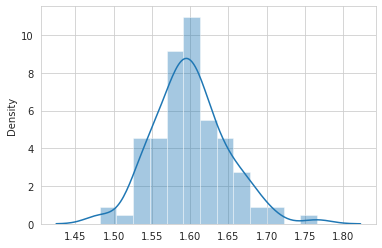

/home/dhruv/fluxnet/CA-Oas.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


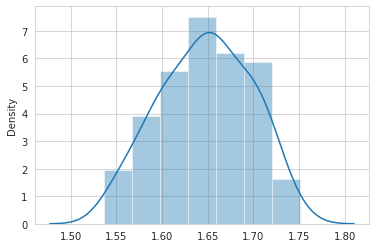

/home/dhruv/fluxnet/CA-Gro.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


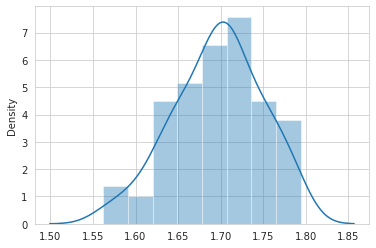

/home/dhruv/fluxnet/CA-TP4.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


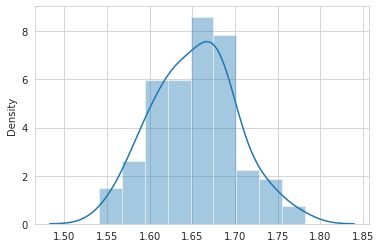

/home/dhruv/fluxnet/CA-TP1.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


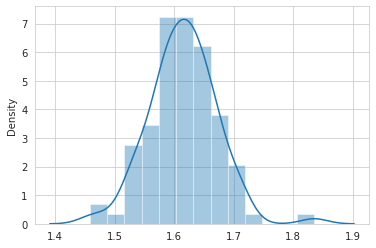

/home/dhruv/fluxnet/US-Me2.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


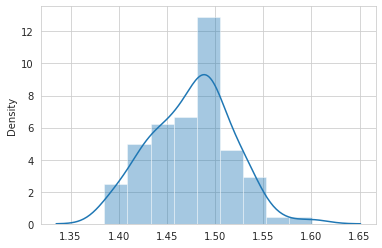

/home/dhruv/fluxnet/US-Oho.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


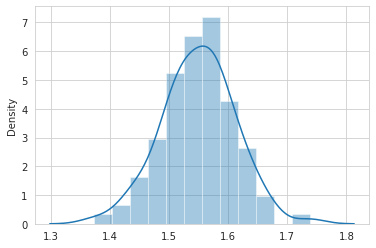

/home/dhruv/fluxnet/US-Los.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


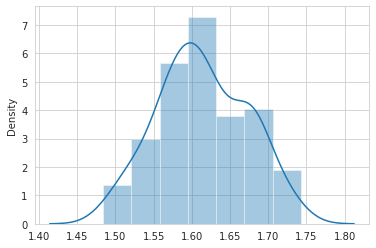

/home/dhruv/fluxnet/CA-Obs.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


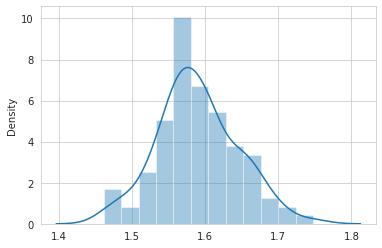

/home/dhruv/fluxnet/US-MMS.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


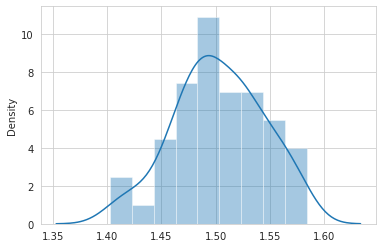

/home/dhruv/fluxnet/US-Ne2.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


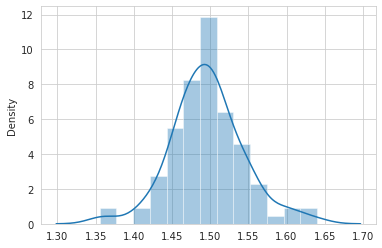

/home/dhruv/fluxnet/US-Wkg.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


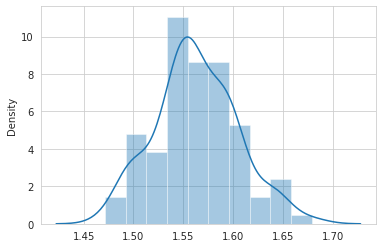

/home/dhruv/fluxnet/US-ARM.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


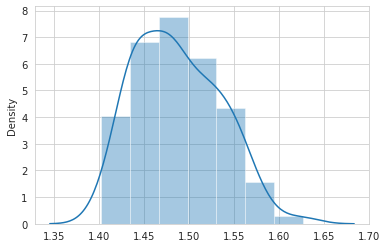

/home/dhruv/fluxnet/CA-TP3.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


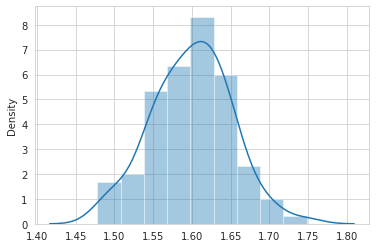

/home/dhruv/fluxnet/US-Ton.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


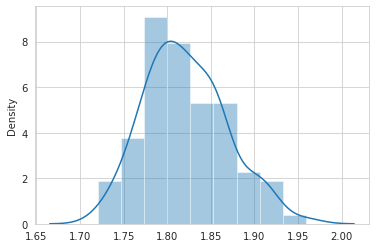

In [6]:
bootstrap_plot("tas")

/home/dhruv/fluxnet/US-WCr.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


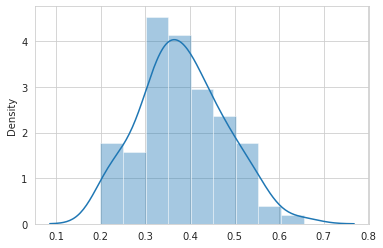

/home/dhruv/fluxnet/US-Var.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


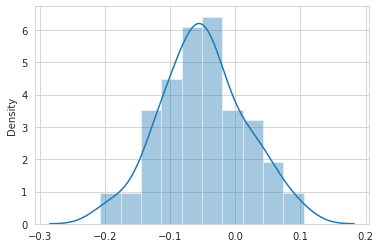

/home/dhruv/fluxnet/US-UMB.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


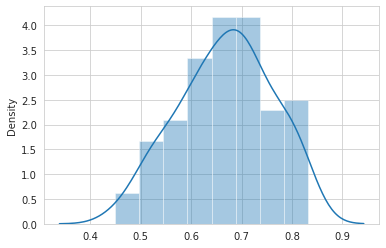

/home/dhruv/fluxnet/US-Ha1.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


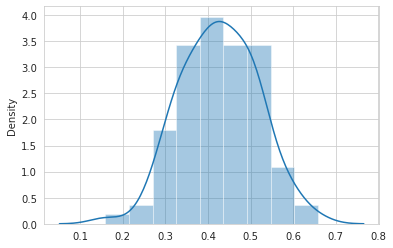

/home/dhruv/fluxnet/US-Ne3.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


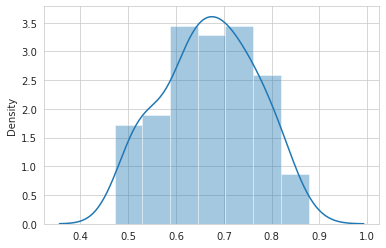

/home/dhruv/fluxnet/US-GLE.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


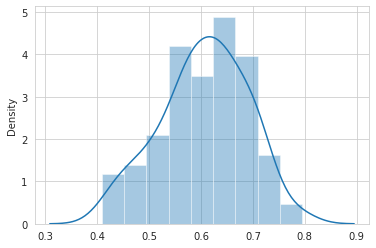

/home/dhruv/fluxnet/US-Blo.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


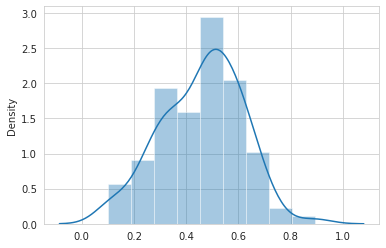

/home/dhruv/fluxnet/CA-Man.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


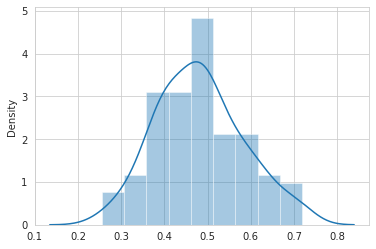

/home/dhruv/fluxnet/US-NR1.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


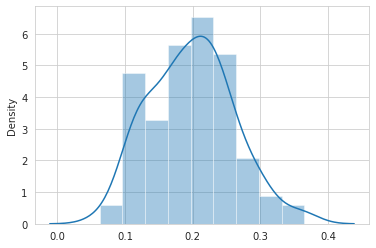

/home/dhruv/fluxnet/US-SRM.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


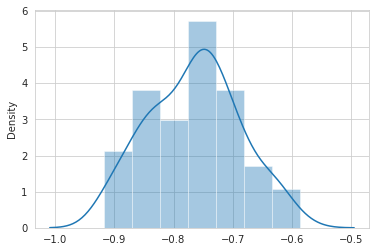

/home/dhruv/fluxnet/US-Syv.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


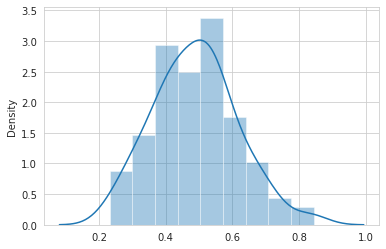

/home/dhruv/fluxnet/CA-Oas.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


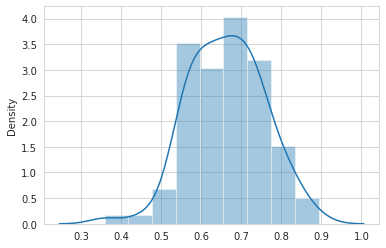

/home/dhruv/fluxnet/CA-Gro.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


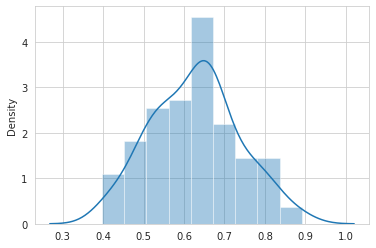

/home/dhruv/fluxnet/CA-TP4.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


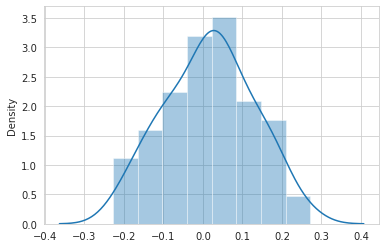

/home/dhruv/fluxnet/CA-TP1.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


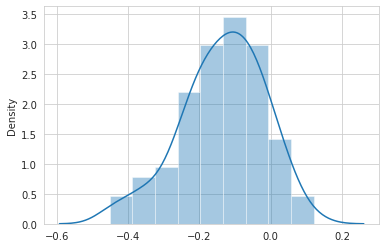

/home/dhruv/fluxnet/US-Me2.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


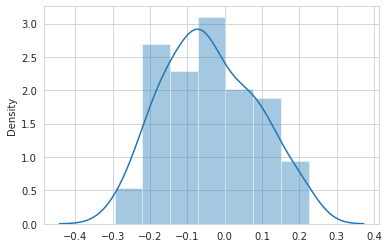

/home/dhruv/fluxnet/US-Oho.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


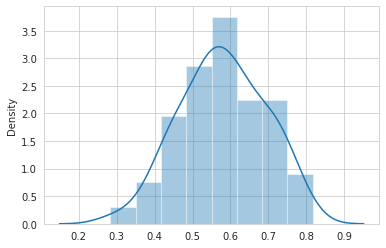

/home/dhruv/fluxnet/US-Los.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


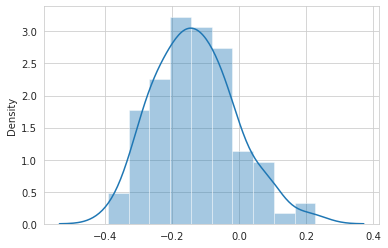

/home/dhruv/fluxnet/CA-Obs.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


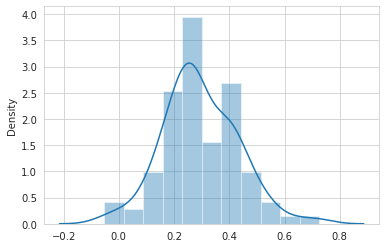

/home/dhruv/fluxnet/US-MMS.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


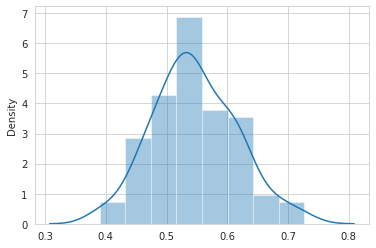

/home/dhruv/fluxnet/US-Ne2.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


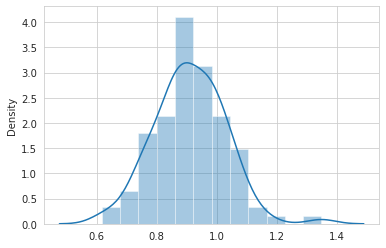

/home/dhruv/fluxnet/US-Wkg.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


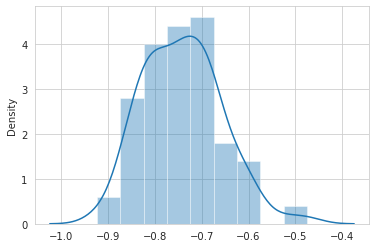

/home/dhruv/fluxnet/US-ARM.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


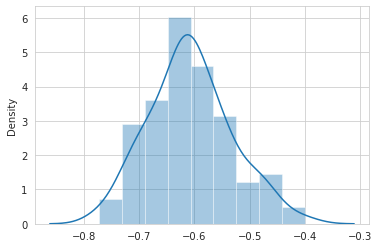

/home/dhruv/fluxnet/CA-TP3.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


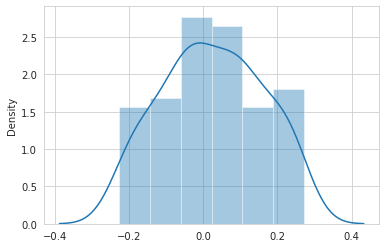

/home/dhruv/fluxnet/US-Ton.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


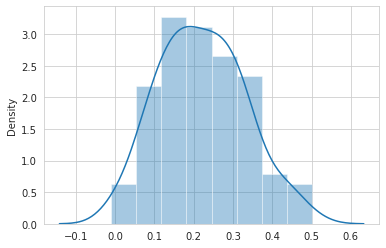

In [7]:
bootstrap_plot("slhf")

/home/dhruv/fluxnet/US-WCr.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


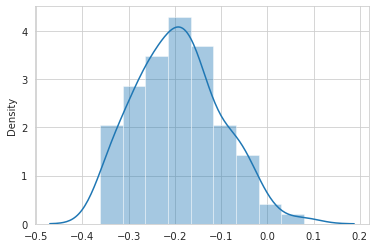

/home/dhruv/fluxnet/US-Var.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


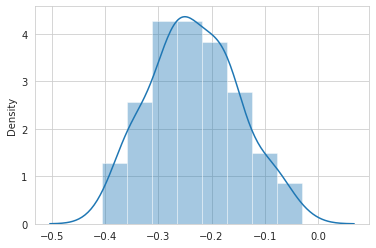

/home/dhruv/fluxnet/US-UMB.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


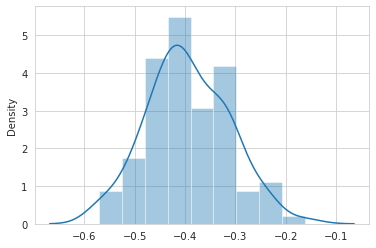

/home/dhruv/fluxnet/US-Ha1.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


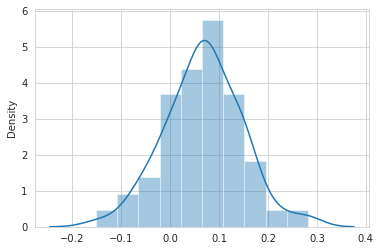

/home/dhruv/fluxnet/US-Ne3.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


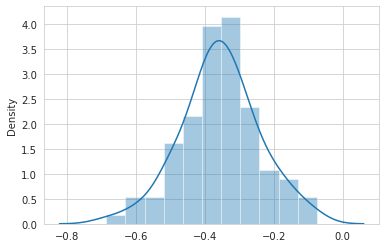

/home/dhruv/fluxnet/US-GLE.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


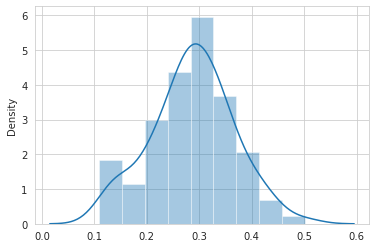

/home/dhruv/fluxnet/US-Blo.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


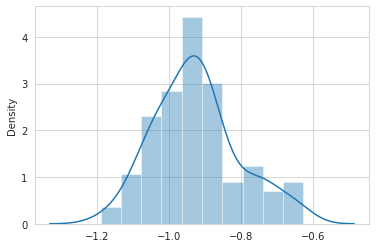

/home/dhruv/fluxnet/CA-Man.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


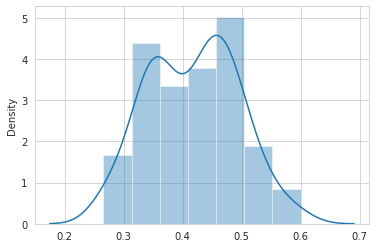

/home/dhruv/fluxnet/US-NR1.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


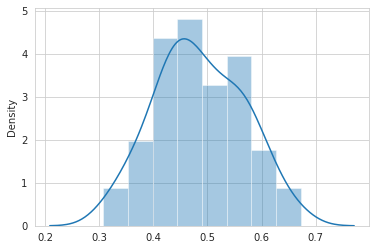

/home/dhruv/fluxnet/US-SRM.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


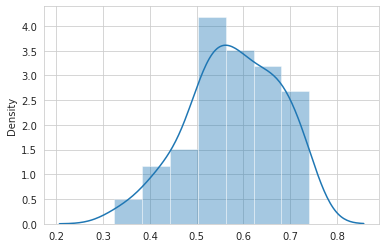

/home/dhruv/fluxnet/US-Syv.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


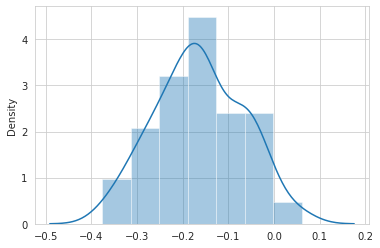

/home/dhruv/fluxnet/CA-Oas.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


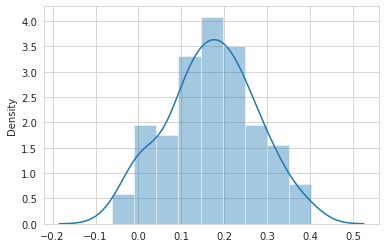

/home/dhruv/fluxnet/CA-Gro.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


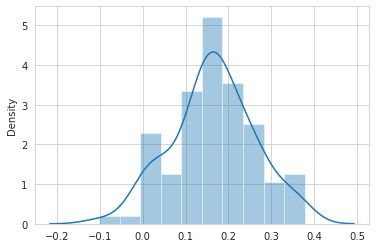

/home/dhruv/fluxnet/CA-TP4.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


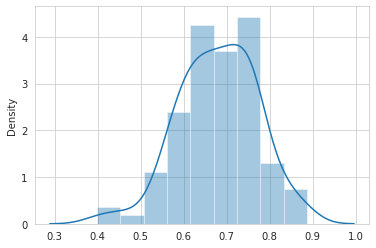

/home/dhruv/fluxnet/CA-TP1.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


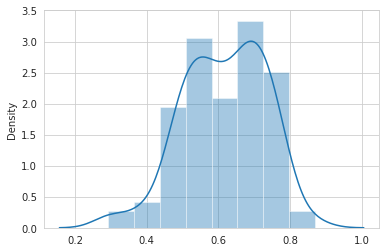

/home/dhruv/fluxnet/US-Me2.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


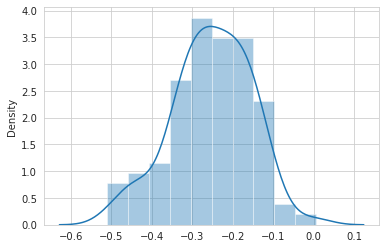

/home/dhruv/fluxnet/US-Oho.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


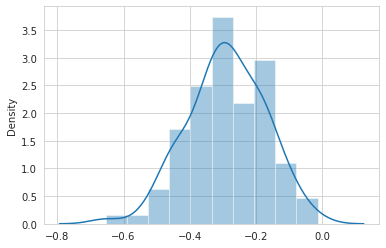

/home/dhruv/fluxnet/US-Los.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


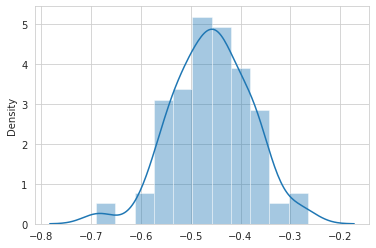

/home/dhruv/fluxnet/CA-Obs.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


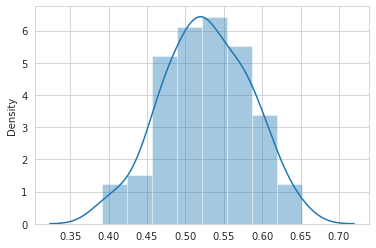

/home/dhruv/fluxnet/US-MMS.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


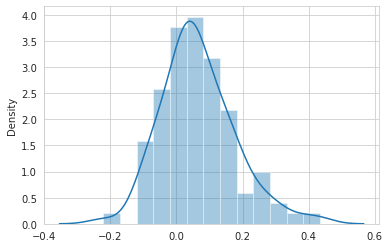

/home/dhruv/fluxnet/US-Ne2.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


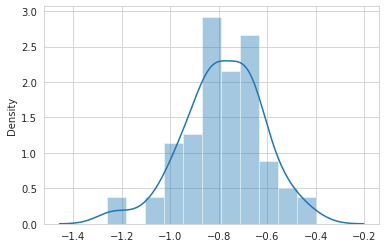

/home/dhruv/fluxnet/US-Wkg.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


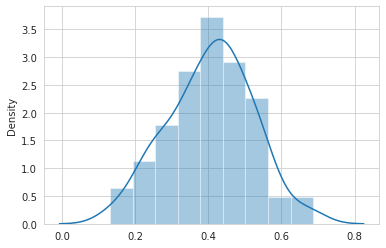

/home/dhruv/fluxnet/US-ARM.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


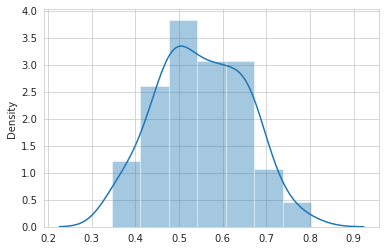

/home/dhruv/fluxnet/CA-TP3.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


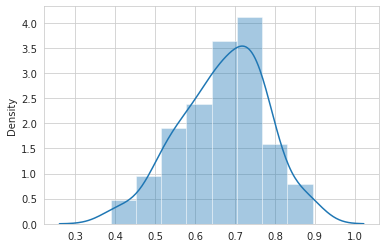

/home/dhruv/fluxnet/US-Ton.nc


/home/dhruv/my_venv/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


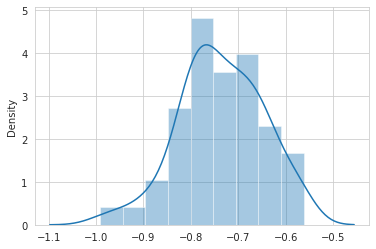

In [8]:
bootstrap_plot("shflx")

In [54]:
def calc_heatwave_anoms(var):
    lats, lons, hw_anoms = [], [], []
#     for i in NH_stations:
    for i in stations:
        data = xr.open_dataset(i)
        try:
            anoms = jja_std_anoms(data[var])
            tas_anoms = jja_std_anoms(data.tas)
            jja_tas_anoms = tas_anoms.sel(time=tas_anoms['time.season']=='JJA')
            heatwave_days = jja_tas_anoms[jja_tas_anoms>=jja_tas_anoms.quantile(0.90)].time.values
            hw_anom = anoms.sel(time=heatwave_days).mean().item()
            lats.append(data.lat.item())
            lons.append(data.lon.item())
            hw_anoms.append(hw_anom)
        except:
            pass
    return pd.DataFrame(data={'lat':lats, 'lon':lons, 'hw_anom':hw_anoms})

In [48]:
extent = [-135, -60, 23, 70]

def plot_stations(var="tas",mn=0,mx=100,lvn=10,cmap=cmo.thermal, long_name=""):
    fig = plt.figure(figsize=(12, 6))
    ax = fig.add_subplot(1,1,1,projection=ccrs.PlateCarree())

    ax.set_extent(extent, crs=ccrs.PlateCarree())
#     plt.contourf(dat.lon, dat.lat, md_avg, cmap = cmap,
#                  vmin = mn, vmax = mx,levels = np.linspace(mn,mx,lvn+1),extend = 'both')
    
    
    df = calc_heatwave_anoms(var)
    plt.scatter(x = df.lon, y = df.lat, c = df.hw_anom,
               cmap = cmap,s=150, alpha=.8, linewidths=1.5,
               edgecolors='white' ,transform=ccrs.PlateCarree(),
               vmin = mn, vmax = mx,zorder = 5)
    plt.colorbar(shrink = 0.5)

    ax.add_feature(cfeature.OCEAN, zorder=100, edgecolor='k')
    ax.add_feature(cfeature.LAKES, edgecolor='black')

    plt.title("standardized anomalies of "+long_name + " during heatwave days")
        
    plt.show()

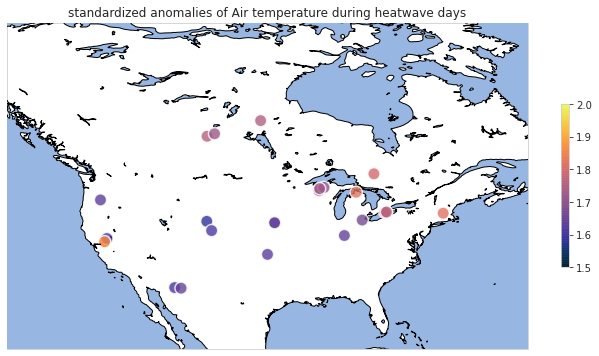

In [52]:
plot_stations("tas", mn=1.5, mx=2, long_name="Air temperature")

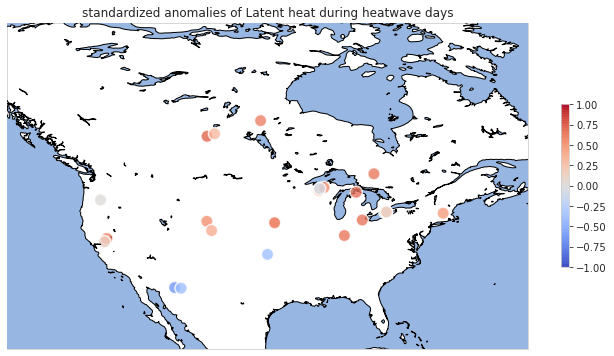

In [50]:
plot_stations("slhf", mn=-1, mx=1, cmap="coolwarm", long_name="Latent heat")

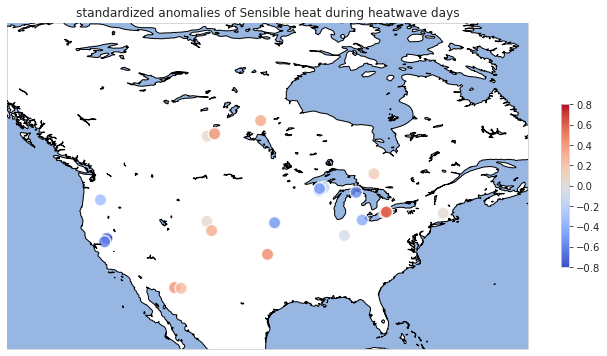

In [51]:
plot_stations("shflx", mn=-0.8, mx=0.8, cmap="coolwarm", long_name="Sensible heat")

In [46]:
def calc_heatwave_bootstrap(var):
    lats, lons, hw_anoms_l, hw_anoms_u = [], [], [], []
    for i in NH_stations:
        data = xr.open_dataset(i)
#         try:
        anoms = jja_std_anoms(data[var])
        tas_anoms = jja_std_anoms(data.tas)
        jja_tas_anoms = tas_anoms.sel(time=tas_anoms['time.season']=='JJA')
        heatwave_days = jja_tas_anoms[jja_tas_anoms>=jja_tas_anoms.quantile(0.90)].time.values
        sample_means = []
        for i in range(100):
            sample = np.random.choice(heatwave_days, int(0.6*len(heatwave_days)))
            sample_means.append(anoms.sel(time=sample).mean().item())
        lats.append(data.lat.item())
        lons.append(data.lon.item())
        hw_anoms_l.append(np.quantile(sample_means, 0.1))
        hw_anoms_u.append(np.quantile(sample_means, 0.9))
#         except:
#             pass
    return pd.DataFrame(data={'lat':lats, 'lon':lons, 'hw_anom_l':hw_anoms_l, 'hw_anom_u':hw_anoms_u})

In [45]:
calc_heatwave_anoms("tas")

,lat,lon,hw_anom
0,45.805900,-90.079900,1.705787
1,38.413300,-120.950700,1.887001
2,45.559800,-84.713800,1.821648
3,42.537800,-72.171500,1.818282
4,41.179670,-96.439650,1.656123
5,41.366530,-106.239900,1.587294
6,38.895300,-120.632800,1.608867
7,55.879620,-98.480810,1.750089
8,40.032900,-105.546400,1.616099
9,31.821400,-110.866100,1.611563


In [47]:
calc_heatwave_bootstrap("tas")

,lat,lon,hw_anom_l,hw_anom_u
0,45.805900,-90.079900,1.662383,1.754416
1,38.413300,-120.950700,1.835398,1.943140
2,45.559800,-84.713800,1.763552,1.868369
3,42.537800,-72.171500,1.768346,1.875617
4,41.179670,-96.439650,1.611041,1.706413
5,41.366530,-106.239900,1.553651,1.637468
6,38.895300,-120.632800,1.543857,1.689407
7,55.879620,-98.480810,1.697920,1.813617
8,40.032900,-105.546400,1.560253,1.664034
9,31.821400,-110.866100,1.566900,1.654708


In [12]:
extent = [-135, -60, 23, 70]

def plot_stations_l(var="tas",mn=0,mx=100,lvn=10,cmap=cmo.thermal, long_name=""):
    fig = plt.figure(figsize=(12, 6))
    ax = fig.add_subplot(1,1,1,projection=ccrs.PlateCarree())

    ax.set_extent(extent, crs=ccrs.PlateCarree())
#     plt.contourf(dat.lon, dat.lat, md_avg, cmap = cmap,
#                  vmin = mn, vmax = mx,levels = np.linspace(mn,mx,lvn+1),extend = 'both')
    
    
    df = calc_heatwave_bootstrap(var)
    plt.scatter(x = df.lon, y = df.lat, c = df.hw_anom_l,
               cmap = cmap,s=150, alpha=.8, linewidths=1.5,
               edgecolors='white' ,transform=ccrs.PlateCarree(),
               vmin = mn, vmax = mx,zorder = 5)
    plt.colorbar(shrink = 0.5)

    ax.add_feature(cfeature.OCEAN, zorder=100, edgecolor='k')
    ax.add_feature(cfeature.LAKES, edgecolor='black')

    plt.title("bootstrapped 10 percentile standardized anomalies of "+long_name + " during heatwave days")
        
    plt.show()
    
def plot_stations_u(var="tas",mn=0,mx=100,lvn=10,cmap=cmo.thermal, long_name=""):
    fig = plt.figure(figsize=(12, 6))
    ax = fig.add_subplot(1,1,1,projection=ccrs.PlateCarree())

    ax.set_extent(extent, crs=ccrs.PlateCarree())
#     plt.contourf(dat.lon, dat.lat, md_avg, cmap = cmap,
#                  vmin = mn, vmax = mx,levels = np.linspace(mn,mx,lvn+1),extend = 'both')
    
    
    df = calc_heatwave_bootstrap(var)
    plt.scatter(x = df.lon, y = df.lat, c = df.hw_anom_u,
               cmap = cmap,s=150, alpha=.8, linewidths=1.5,
               edgecolors='white' ,transform=ccrs.PlateCarree(),
               vmin = mn, vmax = mx,zorder = 5)
    plt.colorbar(shrink = 0.5)

    ax.add_feature(cfeature.OCEAN, zorder=100, edgecolor='k')
    ax.add_feature(cfeature.LAKES, edgecolor='black')

    plt.title("bootstrapped 90 percentile standardized anomalies of "+long_name + " during heatwave days")
        
    plt.show()

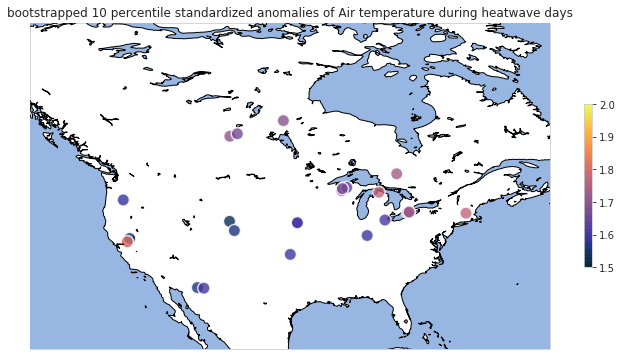

In [58]:
plot_stations_l("tas", mn=1.5, mx=2, long_name="Air temperature")

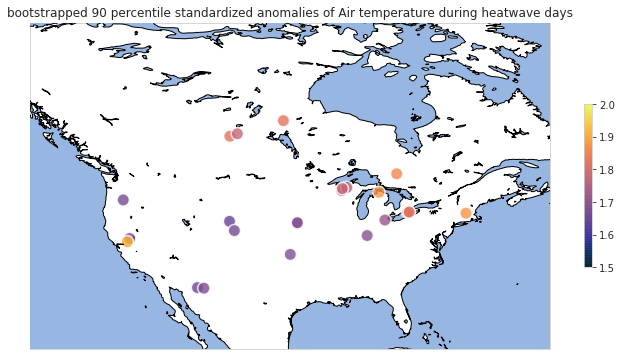

In [60]:
plot_stations_u("tas", mn=1.5, mx=2, long_name="Air temperature")

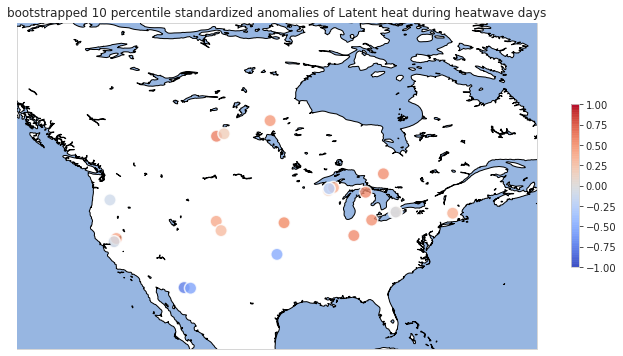

In [53]:
plot_stations_l("slhf", mn=-1, mx=1, cmap="coolwarm", long_name="Latent heat")

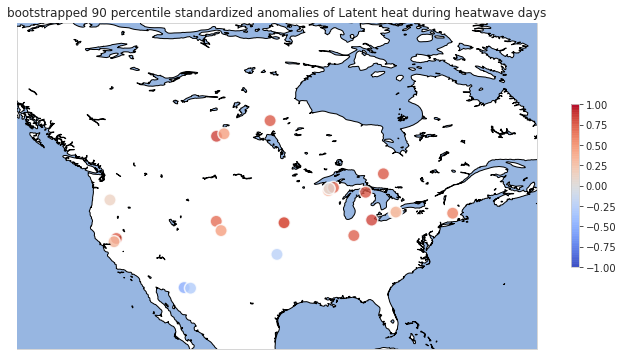

In [59]:
plot_stations_u("slhf", mn=-1, mx=1, cmap="coolwarm", long_name="Latent heat")

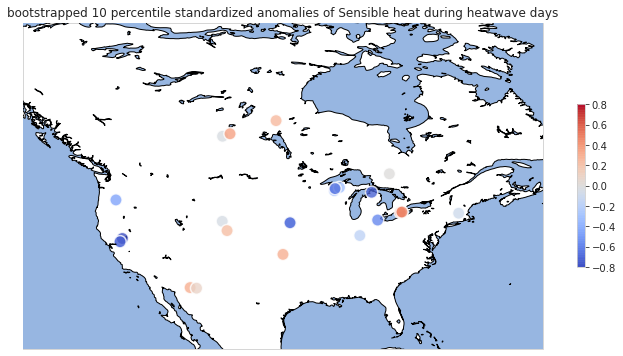

In [55]:
plot_stations_l("shflx", mn=-0.8, mx=0.8, cmap="coolwarm", long_name="Sensible heat")

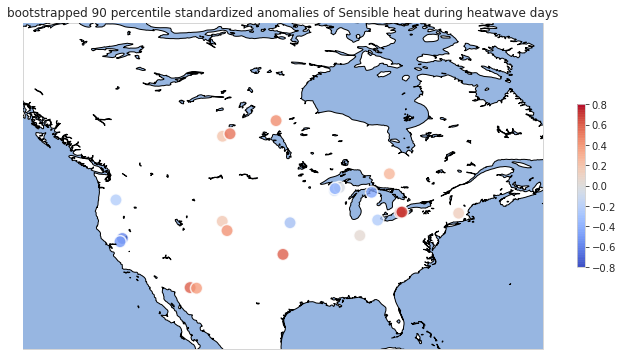

In [56]:
plot_stations_u("shflx", mn=-0.8, mx=0.8, cmap="coolwarm", long_name="Sensible heat")

In [65]:
def lag_composite_vars(data, long_name=""):
    tas_anoms = jja_std_anoms(data["tas"])
    slhf_anoms = jja_std_anoms(data["slhf"])
    shflx_anoms = jja_std_anoms(data["shflx"])
    
    jja_tas_anoms = tas_anoms.sel(time=tas_anoms['time.season']=='JJA')
    heatwave_days = jja_tas_anoms[jja_tas_anoms>=jja_tas_anoms.quantile(0.90)].time.values
    
    try:
        swc_anoms = jja_std_anoms(data["swc"])
    except:
        pass
    
    tas_means = lc_helper(heatwave_days, tas_anoms)
    slhf_means = lc_helper(heatwave_days, slhf_anoms)
    shflx_means = lc_helper(heatwave_days, shflx_anoms)
    try:
        swc_means = lc_helper(heatwave_days, swc_anoms)
    except:
        pass
    
    days = range(-30, 8)
    fig, ax = plt.subplots(figsize=(12,8))
    
    plt.plot(days, tas_means, '-r')
    plt.plot(days, slhf_means, '-b')
    plt.plot(days, shflx_means, '-g')
    try:
        plt.plot(days, swc_means, '-y')
    except:
        pass
    
    custom_lines = [Line2D([0], [0], color='r', lw=4),
                Line2D([0], [0], color='b', lw=4),
                Line2D([0], [0], color='g', lw=4),
                Line2D([0], [0], color='y', lw=4)]

    ax.legend(custom_lines, ['TAS', 'SLHF', 'SSHF', 'SWC'])
    
    ax.set_xlabel("num days before/after heatwave")
    ax.set_ylabel("standardized anomalies")
    
    plt.title(long_name + "; lat: " + str(data.lat.item()) + ", lon: " + str(data.lon.item()))
    plt.show()

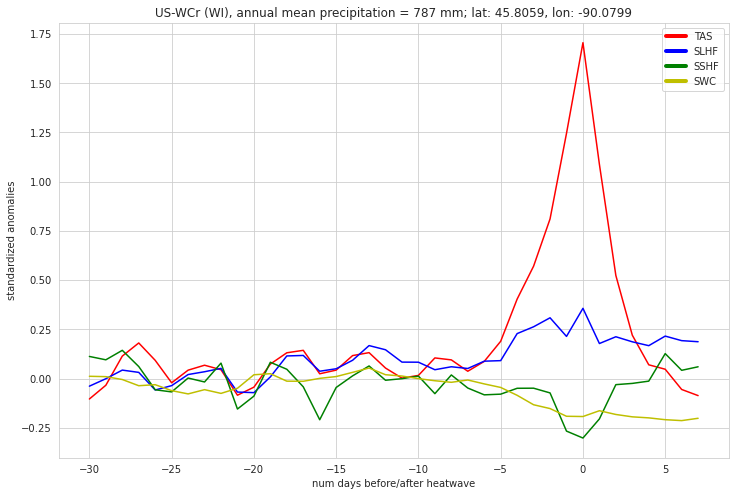

In [66]:
lag_composite_vars(xr.open_dataset(outdir+"US-WCr.nc"), "US-WCr (WI), annual mean precipitation = 787 mm")

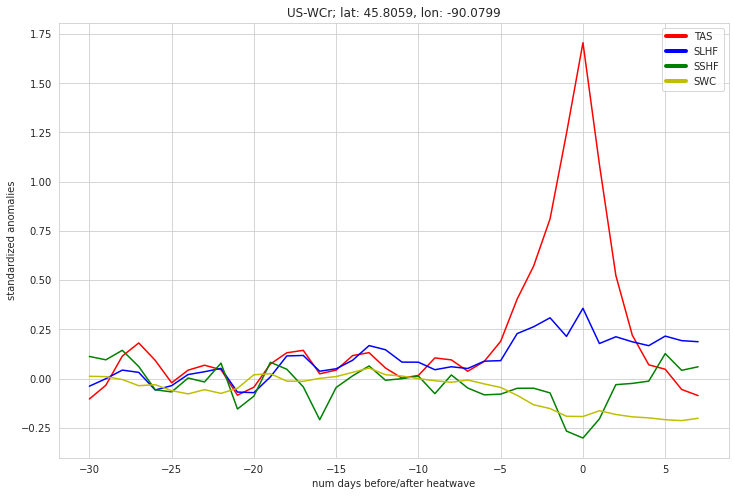

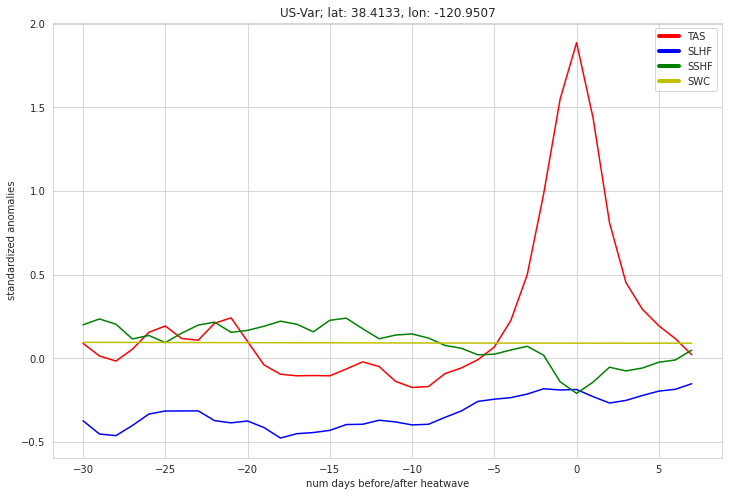

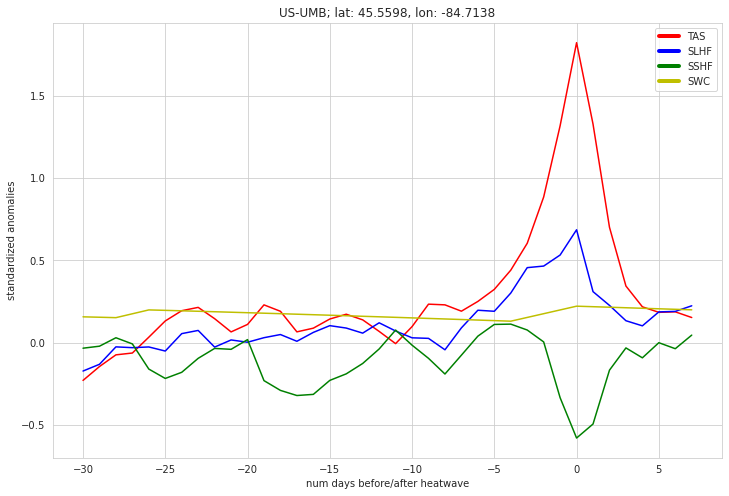

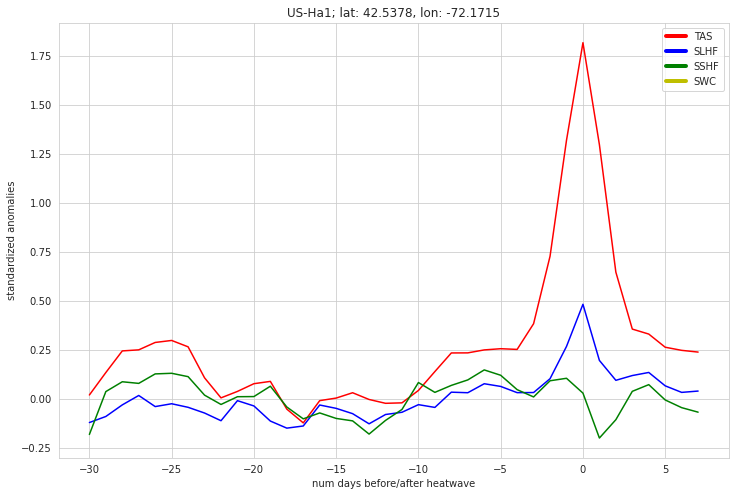

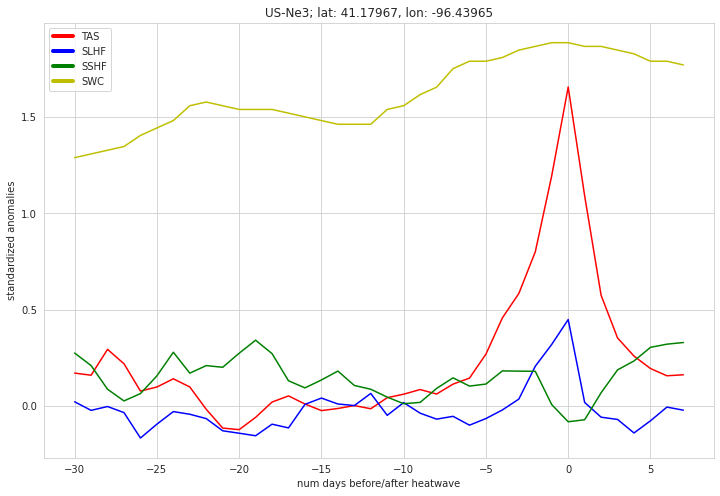

...

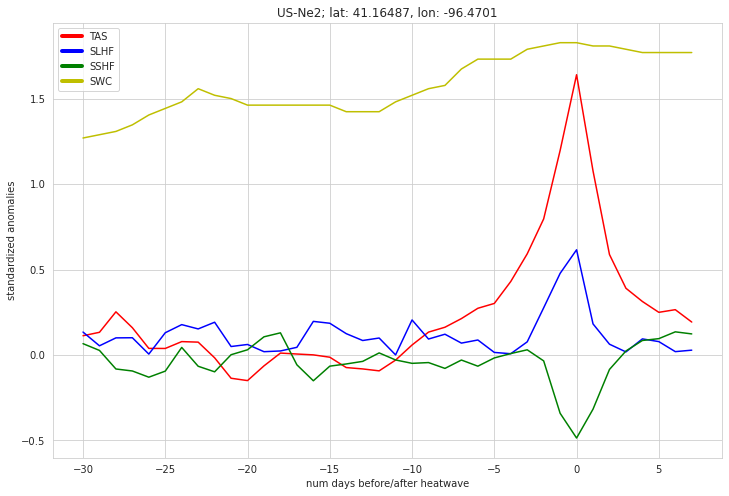

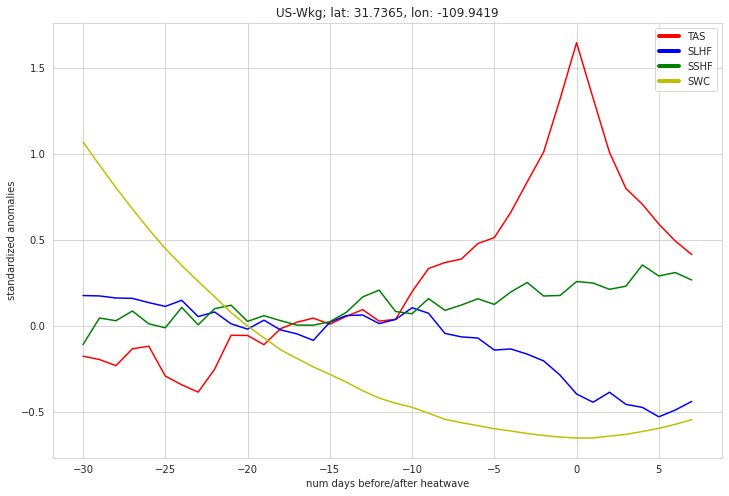

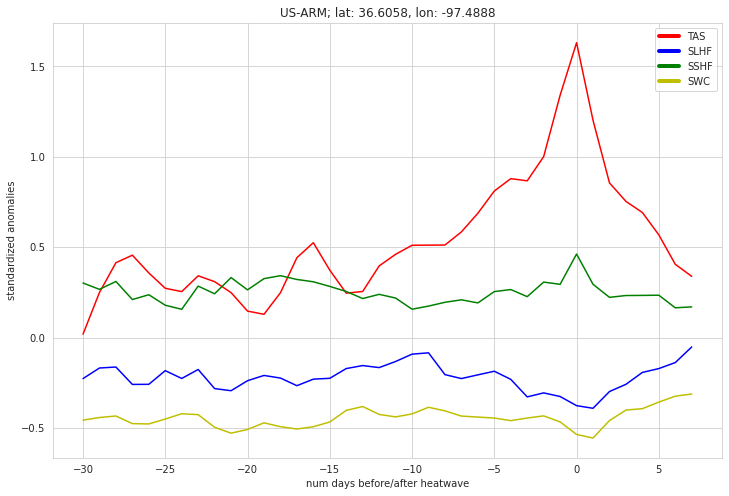

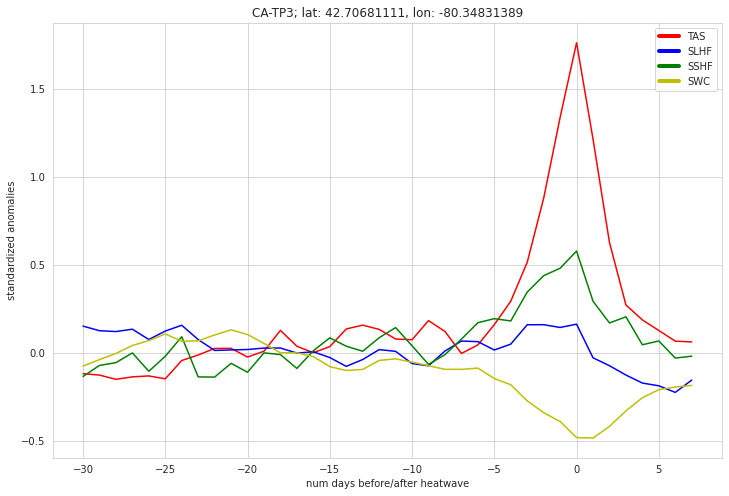

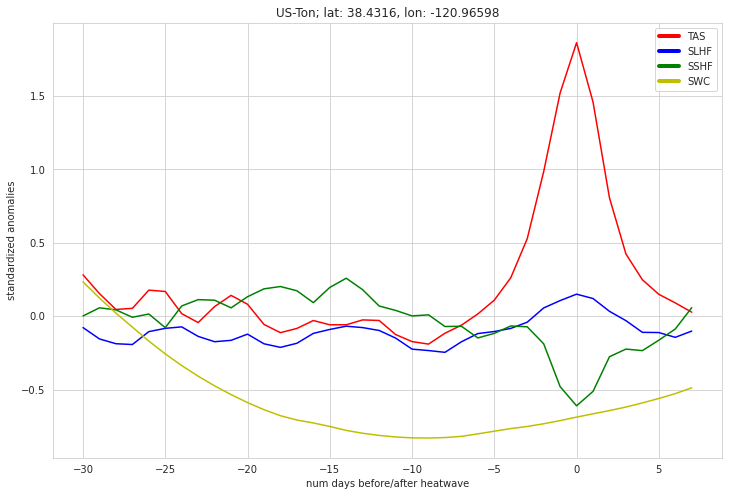

In [76]:
for i in NH_stations:
    name = i[-9:-3]
    lag_composite_vars(xr.open_dataset(i), name)

In [77]:
len(NH_stations)

25

In [14]:
t2m_files = ["/home/data/ERA5/day/T2m_day/t2m_{}.nc".format(i) for i in range(1979, 2020)]
t2m = xr.open_mfdataset(t2m_files).load()

lhflx_files = ["/home/data/ERA5/day/LHFLX_day/lhflx_{}.nc".format(i) for i in range(1979, 2020)]
lhflx = xr.open_mfdataset(lhflx_files).load()

shflx_files = ["/home/data/ERA5/day/SHFLX_day/shflx_{}.nc".format(i) for i in range(1979, 2020)]
shflx = xr.open_mfdataset(shflx_files).load()

In [13]:
str_files = glob("/home/data/ERA5/STR_day/str_*.nc")
lwrad = xr.open_mfdataset(str_files).load()

ssr_files = glob("/home/data/ERA5/SSR_day/ssr_*.nc")
swrad = xr.open_mfdataset(ssr_files).load()

In [15]:
lhflx['lhflx'] = -1*lhflx.lhflx
shflx['shflx'] = -1*shflx.shflx
lwrad['STR'] = -1*lwrad.STR
# swrad['SSR'] = -1*swrad.SSR

In [8]:
def remove_time_mean(x):
    return(x - x.mean(dim='time'))

def remove_annual_cycle(x):
#     return((x-x.groupby('time.month').mean()).drop('month'))
    return x.groupby('time.year').map(remove_time_mean)

In [26]:
def era_lag_composite(station, long_name=""):
    c_lat, c_lon = 1.25, 1.4
    lat, lon = station.lat.item(), (station.lon.item()+360)
    
#     t2m_data = t2m.t2m.loc[dict(lat=slice(lat-c_lat, lat+c_lat), lon=slice(lon-c_lon, lon+c_lon))].mean(('lat','lon'))
#     lhflx_data = lhflx.lhflx.loc[dict(lat=slice(lat-c_lat, lat+c_lat), lon=slice(lon-c_lon, lon+c_lon))].mean(('lat','lon'))
#     shflx_data = shflx.shflx.loc[dict(lat=slice(lat-c_lat, lat+c_lat), lon=slice(lon-c_lon, lon+c_lon))].mean(('lat','lon'))
    
    t2m_data = t2m.t2m.sel(dict(lat=lat, lon=lon), method='nearest')
    lhflx_data = lhflx.lhflx.sel(dict(lat=lat, lon=lon), method='nearest')
    shflx_data = shflx.shflx.sel(dict(lat=lat, lon=lon), method='nearest')
    lwrad_data = lwrad.STR.sel(dict(lat=lat, lon=lon), method='nearest')
    swrad_data = swrad.SSR.sel(dict(lat=lat, lon=lon), method='nearest')

    t2m_anoms = remove_annual_cycle(jja_std_anoms(t2m_data))
    lhflx_anoms = remove_annual_cycle(jja_std_anoms(lhflx_data))
    shflx_anoms = remove_annual_cycle(jja_std_anoms(shflx_data))
    lwrad_anoms = remove_annual_cycle(jja_std_anoms(lwrad_data))
    swrad_anoms = remove_annual_cycle(jja_std_anoms(swrad_data))
    
    jja_t2m_anoms = t2m_anoms.sel(time=t2m_anoms['time.season']=='JJA')
    heatwave_days = jja_t2m_anoms[jja_t2m_anoms>=jja_t2m_anoms.quantile(0.90)].time.values
    
    tas_means = lc_helper(heatwave_days, t2m_anoms)
    slhf_means = lc_helper(heatwave_days, lhflx_anoms)
    shflx_means = lc_helper(heatwave_days, shflx_anoms)
    lwrad_means = lc_helper(heatwave_days, lwrad_anoms)
    swrad_means = lc_helper(heatwave_days, swrad_anoms)
    
    f = np.add(np.multiply(swrad_means,-1), lwrad_means)
    f = np.add(f, slhf_means)
    f = np.add(f, shflx_means)
    
    days = range(-30, 8)
    fig, ax = plt.subplots(figsize=(12,8))
    
    plt.plot(days, tas_means, 'red')
    plt.plot(days, slhf_means, 'blue')
    plt.plot(days, shflx_means, 'green')
    plt.plot(days, lwrad_means, 'orange')
    plt.plot(days, swrad_means, 'pink')
    plt.plot(days, f, 'cyan')
    
    custom_lines = [Line2D([0], [0], color='red', lw=4),
                Line2D([0], [0], color='blue', lw=4),
                Line2D([0], [0], color='green', lw=4),
                Line2D([0], [0], color='orange', lw=4),
                Line2D([0], [0], color='pink', lw=4),
                Line2D([0], [0], color='cyan', lw=4)]

    ax.legend(custom_lines, ['T2M', 'LHFLX', 'SHFLX', 'Net LWRAD', 'Net SWRAD', 'F = SH+LH+LW-SW'])
    
    ax.set_xlabel("num days before/after heatwave")
    ax.set_ylabel("standardized anomalies")
    
    plt.title("ERA5 at " + long_name + "; lat: " + str(lat) + ", lon: " + str(lon))
    plt.show()

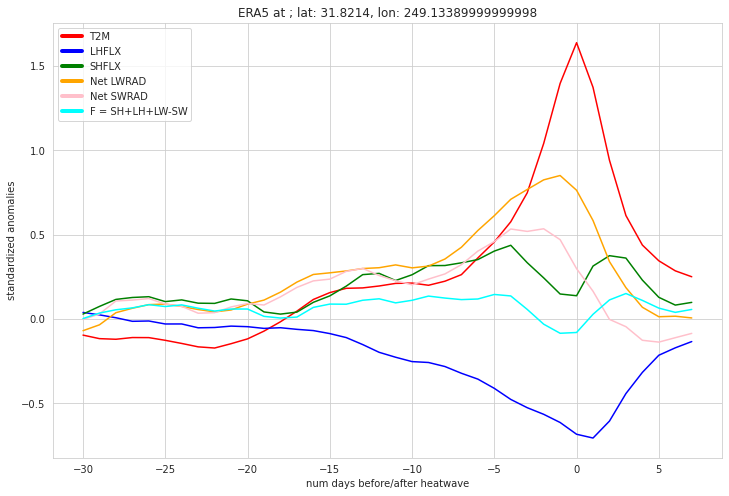

In [27]:
era_lag_composite(srm)

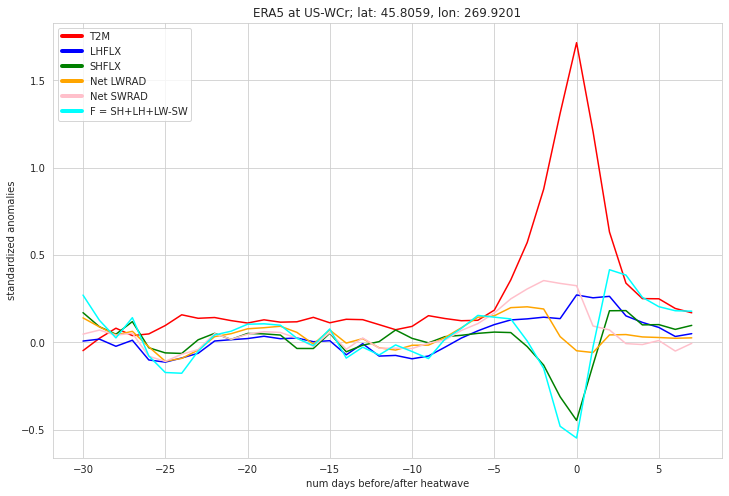

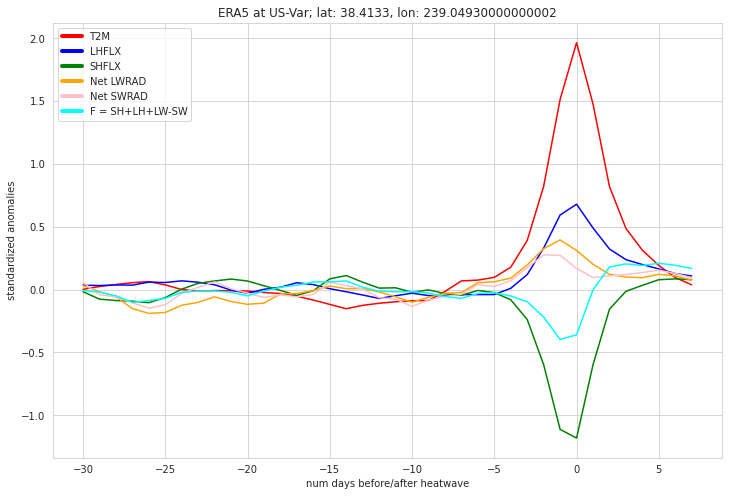

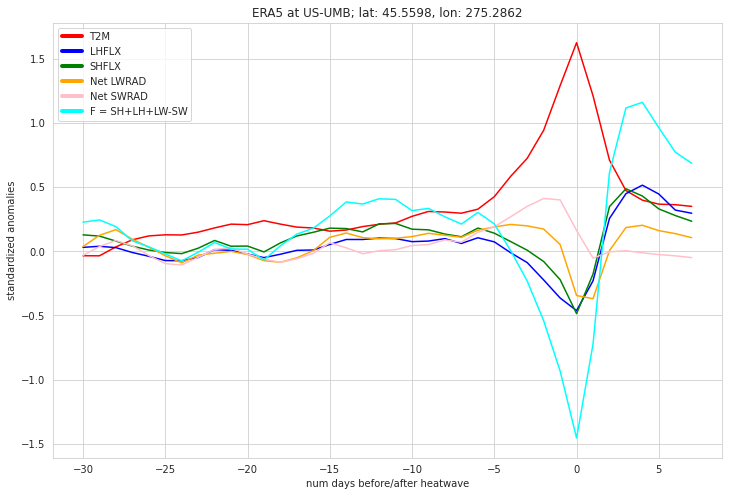

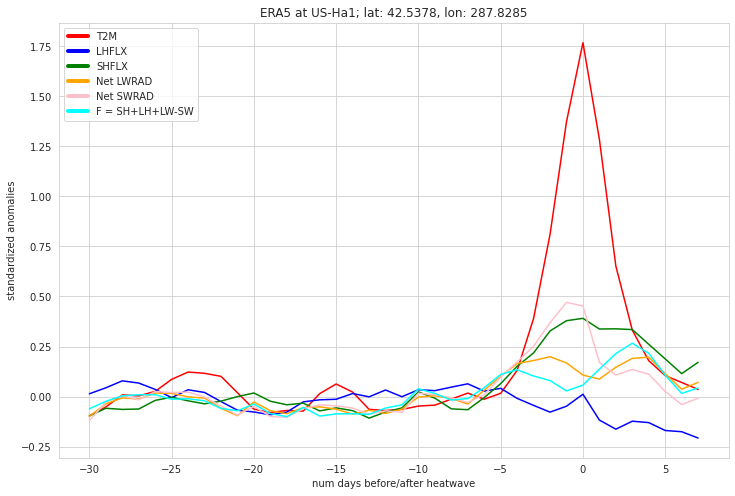

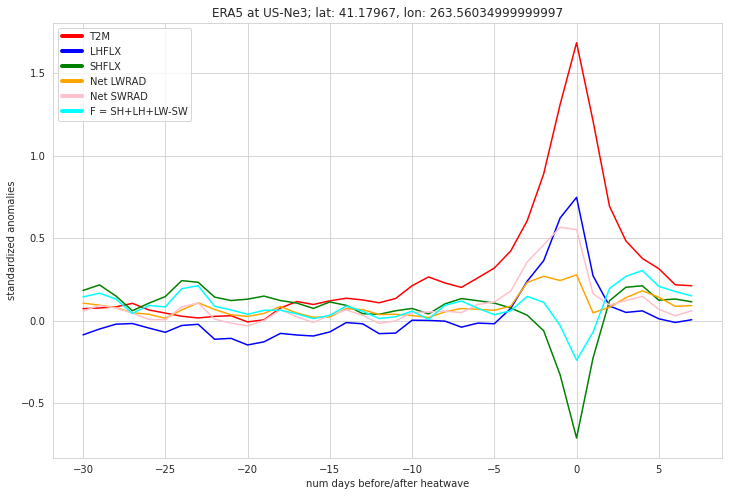

...

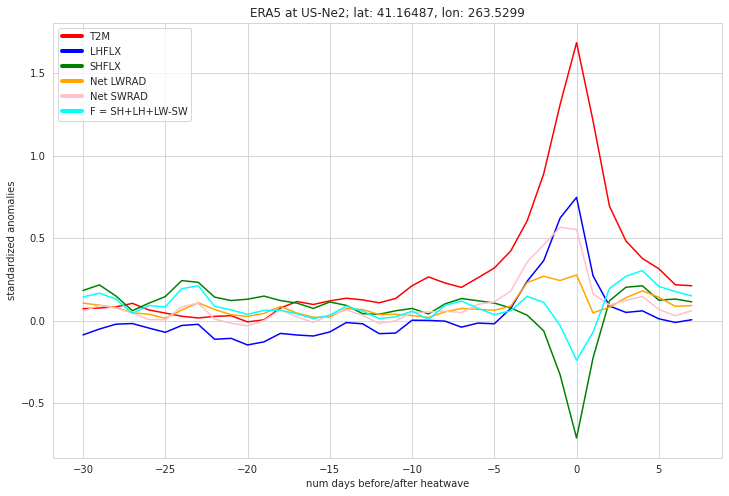

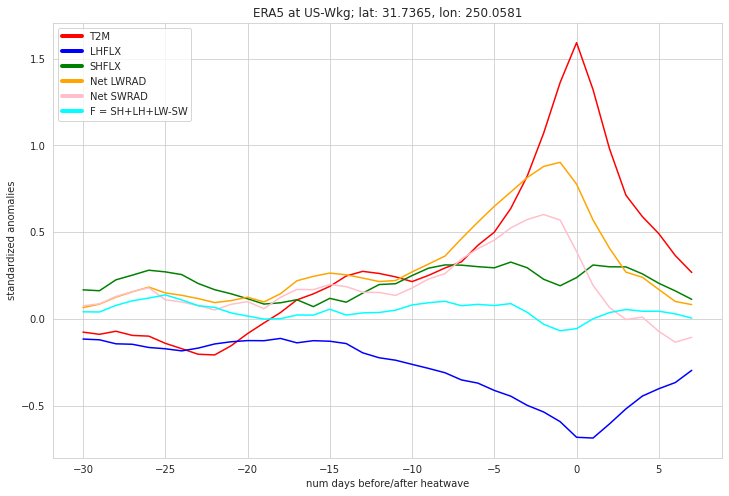

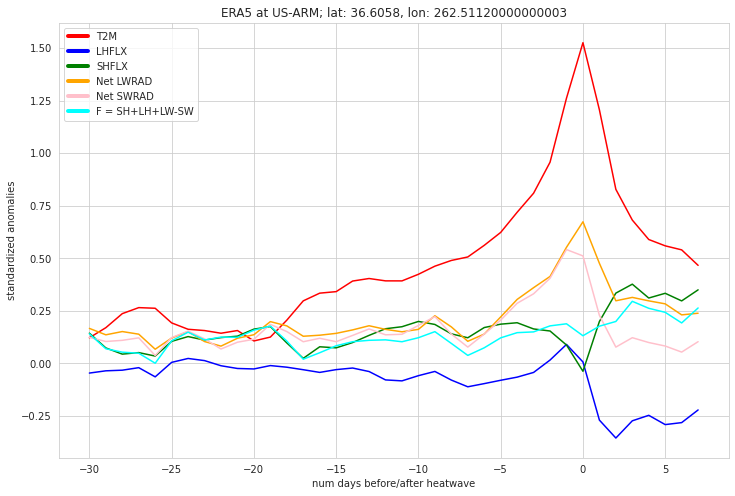

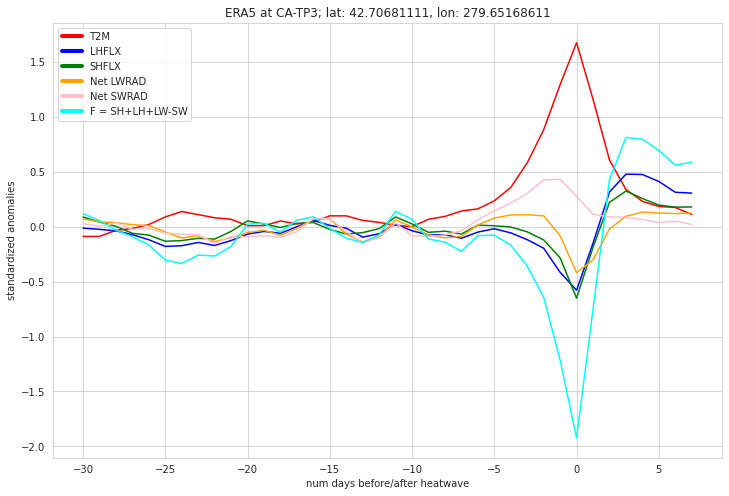

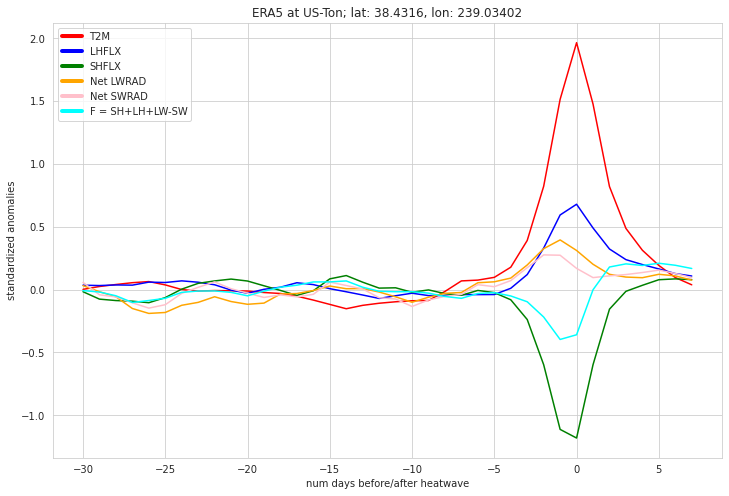

In [28]:
for i in NH_stations:
    name = i[-9:-3]
    era_lag_composite(xr.open_dataset(i), name)

In [17]:
all_lats = t2m.lat.values
all_lons = t2m.lon.values

extent = [-135, -60, 23, 70]
extent_lats, extent_lons = [], []

for lat in all_lats:
    if lat >= 23 and lat <= 70:
        print(lat)
        extent_lats.append(lat)
        
for lon in all_lons:
    if lon >= (-135+360) and lon <= (-60+360):
        print(lon)
        extent_lons.append(lon)

23.089005235602087
24.031413612565444
24.9738219895288
25.916230366492144
26.8586387434555
27.801047120418843
28.7434554973822
29.685863874345543
30.6282722513089
31.570680628272257
32.5130890052356
33.455497382198956
34.3979057591623
35.340314136125656
36.282722513089
37.225130890052355
38.16753926701571
39.10994764397907
40.0523560209424
40.994764397905755
41.93717277486911
42.87958115183247
43.8219895287958
44.764397905759154
45.70680628272251
46.64921465968587
47.591623036649224
48.53403141361255
49.47643979057591
50.41884816753927
51.36125654450262
52.30366492146598
53.24607329842931
54.188481675392666
55.13089005235602
56.07329842931938
57.01570680628271
57.958115183246065
58.90052356020942
59.84293193717278
60.785340314136135
61.727748691099464
62.67015706806282
63.61256544502618
64.55497382198953
65.49738219895289
66.43979057591622
67.38219895287958
68.32460732984293
69.26701570680629
125.0
126.25
127.5
128.75
130.0
131.25
132.5
133.75
135.0
136.25
137.5
138.75
140.0
141.25
142

In [18]:
lat=[]
lon=[]
std_anoms_shflx = []
std_anoms_lhflx = []
#std_anoms_sfmc = []
#std_anoms_t2m = []

for latitude in extent_lats:
    for longitude in extent_lons:
        print(latitude, longitude)
        
        s_t2m = t2m.t2m.sel(lat=latitude,lon=longitude)
        s_lhflx = lhflx.lhflx.sel(lat=latitude,lon=longitude)
        s_shflx = shflx.shflx.sel(lat=latitude,lon=longitude)
        
       # subset_anoms_sfmc = std_anoms(subset['SFMC'])
        subset_anoms_shflx = remove_annual_cycle(jja_std_anoms(s_shflx)) # the anomalies, standardized by JJA sd
        subset_anoms_lhflx = remove_annual_cycle(jja_std_anoms(s_lhflx))
       
      #  subset_anoms_t2m = std_anoms(subset['T2MMEAN'])
        t = remove_annual_cycle(jja_std_anoms(s_t2m))   # anomalies, not standardized, just JJA
        t = t.sel({'time':t['time.season']=='JJA'})
        heatwave_days = t[t>=t.quantile(0.9)].time.values
        
        std_anoms_shflx.append(subset_anoms_shflx.sel(time=heatwave_days).mean().item())
        std_anoms_lhflx.append(subset_anoms_lhflx.sel(time=heatwave_days).mean().item())
       # std_anom_sfmc.append(subset_anoms_sfmc.sel(time=heatwave_days).mean().item())
       # std_anom_t2m.append(subset_anoms_t2m.sel(time=heatwave_days).mean().item())
        lat.append(latitude)
        lon.append(longitude)
        
df_2 = pd.DataFrame({'lat':lat,'lon':lon,'std_anoms_shflx':std_anoms_shflx,'std_anoms_lhflx':std_anoms_lhflx})
                   # 'std_anoms_sfmc':std_anoms_sfmc, 'std_anoms_t2m':std_anoms_t2m})

23.089005235602087 125.0
23.089005235602087 126.25
23.089005235602087 127.5
23.089005235602087 128.75
23.089005235602087 130.0
23.089005235602087 131.25
23.089005235602087 132.5
23.089005235602087 133.75
23.089005235602087 135.0
23.089005235602087 136.25
23.089005235602087 137.5
23.089005235602087 138.75
23.089005235602087 140.0
23.089005235602087 141.25
23.089005235602087 142.5
23.089005235602087 143.75
23.089005235602087 145.0
23.089005235602087 146.25
23.089005235602087 147.5
23.089005235602087 148.75
23.089005235602087 150.0
23.089005235602087 151.25
23.089005235602087 152.5
23.089005235602087 153.75
23.089005235602087 155.0
23.089005235602087 156.25
23.089005235602087 157.5
23.089005235602087 158.75
23.089005235602087 160.0
23.089005235602087 161.25
23.089005235602087 162.5
23.089005235602087 163.75
23.089005235602087 165.0
23.089005235602087 166.25
23.089005235602087 167.5
23.089005235602087 168.75
23.089005235602087 170.0
23.089005235602087 171.25
23.089005235602087 172.5
23.089

24.9738219895288 178.75
24.9738219895288 180.0
24.9738219895288 181.25
24.9738219895288 182.5
24.9738219895288 183.75
24.9738219895288 185.0
24.9738219895288 186.25
24.9738219895288 187.5
24.9738219895288 188.75
24.9738219895288 190.0
24.9738219895288 191.25
24.9738219895288 192.5
24.9738219895288 193.75
24.9738219895288 195.0
24.9738219895288 196.25
24.9738219895288 197.5
24.9738219895288 198.75
24.9738219895288 200.0
24.9738219895288 201.25
24.9738219895288 202.5
24.9738219895288 203.75
24.9738219895288 205.0
24.9738219895288 206.25
24.9738219895288 207.5
24.9738219895288 208.75
24.9738219895288 210.0
24.9738219895288 211.25
24.9738219895288 212.5
24.9738219895288 213.75
24.9738219895288 215.0
24.9738219895288 216.25
24.9738219895288 217.5
24.9738219895288 218.75
24.9738219895288 220.0
24.9738219895288 221.25
24.9738219895288 222.5
24.9738219895288 223.75
24.9738219895288 225.0
24.9738219895288 226.25
24.9738219895288 227.5
24.9738219895288 228.75
24.9738219895288 230.0
24.9738219895

26.8586387434555 247.5
26.8586387434555 248.75
26.8586387434555 250.0
26.8586387434555 251.25
26.8586387434555 252.5
26.8586387434555 253.75
26.8586387434555 255.0
26.8586387434555 256.25
26.8586387434555 257.5
26.8586387434555 258.75
26.8586387434555 260.0
26.8586387434555 261.25
26.8586387434555 262.5
26.8586387434555 263.75
26.8586387434555 265.0
26.8586387434555 266.25
26.8586387434555 267.5
26.8586387434555 268.75
26.8586387434555 270.0
26.8586387434555 271.25
26.8586387434555 272.5
26.8586387434555 273.75
26.8586387434555 275.0
26.8586387434555 276.25
26.8586387434555 277.5
26.8586387434555 278.75
26.8586387434555 280.0
26.8586387434555 281.25
26.8586387434555 282.5
26.8586387434555 283.75
26.8586387434555 285.0
26.8586387434555 286.25
26.8586387434555 287.5
26.8586387434555 288.75
26.8586387434555 290.0
26.8586387434555 291.25
26.8586387434555 292.5
26.8586387434555 293.75
26.8586387434555 295.0
26.8586387434555 296.25
26.8586387434555 297.5
26.8586387434555 298.75
26.8586387434

29.685863874345543 138.75
29.685863874345543 140.0
29.685863874345543 141.25
29.685863874345543 142.5
29.685863874345543 143.75
29.685863874345543 145.0
29.685863874345543 146.25
29.685863874345543 147.5
29.685863874345543 148.75
29.685863874345543 150.0
29.685863874345543 151.25
29.685863874345543 152.5
29.685863874345543 153.75
29.685863874345543 155.0
29.685863874345543 156.25
29.685863874345543 157.5
29.685863874345543 158.75
29.685863874345543 160.0
29.685863874345543 161.25
29.685863874345543 162.5
29.685863874345543 163.75
29.685863874345543 165.0
29.685863874345543 166.25
29.685863874345543 167.5
29.685863874345543 168.75
29.685863874345543 170.0
29.685863874345543 171.25
29.685863874345543 172.5
29.685863874345543 173.75
29.685863874345543 175.0
29.685863874345543 176.25
29.685863874345543 177.5
29.685863874345543 178.75
29.685863874345543 180.0
29.685863874345543 181.25
29.685863874345543 182.5
29.685863874345543 183.75
29.685863874345543 185.0
29.685863874345543 186.25
29.68

31.570680628272257 202.5
31.570680628272257 203.75
31.570680628272257 205.0
31.570680628272257 206.25
31.570680628272257 207.5
31.570680628272257 208.75
31.570680628272257 210.0
31.570680628272257 211.25
31.570680628272257 212.5
31.570680628272257 213.75
31.570680628272257 215.0
31.570680628272257 216.25
31.570680628272257 217.5
31.570680628272257 218.75
31.570680628272257 220.0
31.570680628272257 221.25
31.570680628272257 222.5
31.570680628272257 223.75
31.570680628272257 225.0
31.570680628272257 226.25
31.570680628272257 227.5
31.570680628272257 228.75
31.570680628272257 230.0
31.570680628272257 231.25
31.570680628272257 232.5
31.570680628272257 233.75
31.570680628272257 235.0
31.570680628272257 236.25
31.570680628272257 237.5
31.570680628272257 238.75
31.570680628272257 240.0
31.570680628272257 241.25
31.570680628272257 242.5
31.570680628272257 243.75
31.570680628272257 245.0
31.570680628272257 246.25
31.570680628272257 247.5
31.570680628272257 248.75
31.570680628272257 250.0
31.570

33.455497382198956 266.25
33.455497382198956 267.5
33.455497382198956 268.75
33.455497382198956 270.0
33.455497382198956 271.25
33.455497382198956 272.5
33.455497382198956 273.75
33.455497382198956 275.0
33.455497382198956 276.25
33.455497382198956 277.5
33.455497382198956 278.75
33.455497382198956 280.0
33.455497382198956 281.25
33.455497382198956 282.5
33.455497382198956 283.75
33.455497382198956 285.0
33.455497382198956 286.25
33.455497382198956 287.5
33.455497382198956 288.75
33.455497382198956 290.0
33.455497382198956 291.25
33.455497382198956 292.5
33.455497382198956 293.75
33.455497382198956 295.0
33.455497382198956 296.25
33.455497382198956 297.5
33.455497382198956 298.75
33.455497382198956 300.0
34.3979057591623 125.0
34.3979057591623 126.25
34.3979057591623 127.5
34.3979057591623 128.75
34.3979057591623 130.0
34.3979057591623 131.25
34.3979057591623 132.5
34.3979057591623 133.75
34.3979057591623 135.0
34.3979057591623 136.25
34.3979057591623 137.5
34.3979057591623 138.75
34.3

36.282722513089 157.5
36.282722513089 158.75
36.282722513089 160.0
36.282722513089 161.25
36.282722513089 162.5
36.282722513089 163.75
36.282722513089 165.0
36.282722513089 166.25
36.282722513089 167.5
36.282722513089 168.75
36.282722513089 170.0
36.282722513089 171.25
36.282722513089 172.5
36.282722513089 173.75
36.282722513089 175.0
36.282722513089 176.25
36.282722513089 177.5
36.282722513089 178.75
36.282722513089 180.0
36.282722513089 181.25
36.282722513089 182.5
36.282722513089 183.75
36.282722513089 185.0
36.282722513089 186.25
36.282722513089 187.5
36.282722513089 188.75
36.282722513089 190.0
36.282722513089 191.25
36.282722513089 192.5
36.282722513089 193.75
36.282722513089 195.0
36.282722513089 196.25
36.282722513089 197.5
36.282722513089 198.75
36.282722513089 200.0
36.282722513089 201.25
36.282722513089 202.5
36.282722513089 203.75
36.282722513089 205.0
36.282722513089 206.25
36.282722513089 207.5
36.282722513089 208.75
36.282722513089 210.0
36.282722513089 211.25
36.2827225

38.16753926701571 228.75
38.16753926701571 230.0
38.16753926701571 231.25
38.16753926701571 232.5
38.16753926701571 233.75
38.16753926701571 235.0
38.16753926701571 236.25
38.16753926701571 237.5
38.16753926701571 238.75
38.16753926701571 240.0
38.16753926701571 241.25
38.16753926701571 242.5
38.16753926701571 243.75
38.16753926701571 245.0
38.16753926701571 246.25
38.16753926701571 247.5
38.16753926701571 248.75
38.16753926701571 250.0
38.16753926701571 251.25
38.16753926701571 252.5
38.16753926701571 253.75
38.16753926701571 255.0
38.16753926701571 256.25
38.16753926701571 257.5
38.16753926701571 258.75
38.16753926701571 260.0
38.16753926701571 261.25
38.16753926701571 262.5
38.16753926701571 263.75
38.16753926701571 265.0
38.16753926701571 266.25
38.16753926701571 267.5
38.16753926701571 268.75
38.16753926701571 270.0
38.16753926701571 271.25
38.16753926701571 272.5
38.16753926701571 273.75
38.16753926701571 275.0
38.16753926701571 276.25
38.16753926701571 277.5
38.16753926701571 27

40.994764397905755 126.25
40.994764397905755 127.5
40.994764397905755 128.75
40.994764397905755 130.0
40.994764397905755 131.25
40.994764397905755 132.5
40.994764397905755 133.75
40.994764397905755 135.0
40.994764397905755 136.25
40.994764397905755 137.5
40.994764397905755 138.75
40.994764397905755 140.0
40.994764397905755 141.25
40.994764397905755 142.5
40.994764397905755 143.75
40.994764397905755 145.0
40.994764397905755 146.25
40.994764397905755 147.5
40.994764397905755 148.75
40.994764397905755 150.0
40.994764397905755 151.25
40.994764397905755 152.5
40.994764397905755 153.75
40.994764397905755 155.0
40.994764397905755 156.25
40.994764397905755 157.5
40.994764397905755 158.75
40.994764397905755 160.0
40.994764397905755 161.25
40.994764397905755 162.5
40.994764397905755 163.75
40.994764397905755 165.0
40.994764397905755 166.25
40.994764397905755 167.5
40.994764397905755 168.75
40.994764397905755 170.0
40.994764397905755 171.25
40.994764397905755 172.5
40.994764397905755 173.75
40.99

42.87958115183247 185.0
42.87958115183247 186.25
42.87958115183247 187.5
42.87958115183247 188.75
42.87958115183247 190.0
42.87958115183247 191.25
42.87958115183247 192.5
42.87958115183247 193.75
42.87958115183247 195.0
42.87958115183247 196.25
42.87958115183247 197.5
42.87958115183247 198.75
42.87958115183247 200.0
42.87958115183247 201.25
42.87958115183247 202.5
42.87958115183247 203.75
42.87958115183247 205.0
42.87958115183247 206.25
42.87958115183247 207.5
42.87958115183247 208.75
42.87958115183247 210.0
42.87958115183247 211.25
42.87958115183247 212.5
42.87958115183247 213.75
42.87958115183247 215.0
42.87958115183247 216.25
42.87958115183247 217.5
42.87958115183247 218.75
42.87958115183247 220.0
42.87958115183247 221.25
42.87958115183247 222.5
42.87958115183247 223.75
42.87958115183247 225.0
42.87958115183247 226.25
42.87958115183247 227.5
42.87958115183247 228.75
42.87958115183247 230.0
42.87958115183247 231.25
42.87958115183247 232.5
42.87958115183247 233.75
42.87958115183247 23

44.764397905759154 253.75
44.764397905759154 255.0
44.764397905759154 256.25
44.764397905759154 257.5
44.764397905759154 258.75
44.764397905759154 260.0
44.764397905759154 261.25
44.764397905759154 262.5
44.764397905759154 263.75
44.764397905759154 265.0
44.764397905759154 266.25
44.764397905759154 267.5
44.764397905759154 268.75
44.764397905759154 270.0
44.764397905759154 271.25
44.764397905759154 272.5
44.764397905759154 273.75
44.764397905759154 275.0
44.764397905759154 276.25
44.764397905759154 277.5
44.764397905759154 278.75
44.764397905759154 280.0
44.764397905759154 281.25
44.764397905759154 282.5
44.764397905759154 283.75
44.764397905759154 285.0
44.764397905759154 286.25
44.764397905759154 287.5
44.764397905759154 288.75
44.764397905759154 290.0
44.764397905759154 291.25
44.764397905759154 292.5
44.764397905759154 293.75
44.764397905759154 295.0
44.764397905759154 296.25
44.764397905759154 297.5
44.764397905759154 298.75
44.764397905759154 300.0
45.70680628272251 125.0
45.7068

47.591623036649224 141.25
47.591623036649224 142.5
47.591623036649224 143.75
47.591623036649224 145.0
47.591623036649224 146.25
47.591623036649224 147.5
47.591623036649224 148.75
47.591623036649224 150.0
47.591623036649224 151.25
47.591623036649224 152.5
47.591623036649224 153.75
47.591623036649224 155.0
47.591623036649224 156.25
47.591623036649224 157.5
47.591623036649224 158.75
47.591623036649224 160.0
47.591623036649224 161.25
47.591623036649224 162.5
47.591623036649224 163.75
47.591623036649224 165.0
47.591623036649224 166.25
47.591623036649224 167.5
47.591623036649224 168.75
47.591623036649224 170.0
47.591623036649224 171.25
47.591623036649224 172.5
47.591623036649224 173.75
47.591623036649224 175.0
47.591623036649224 176.25
47.591623036649224 177.5
47.591623036649224 178.75
47.591623036649224 180.0
47.591623036649224 181.25
47.591623036649224 182.5
47.591623036649224 183.75
47.591623036649224 185.0
47.591623036649224 186.25
47.591623036649224 187.5
47.591623036649224 188.75
47.59

49.47643979057591 201.25
49.47643979057591 202.5
49.47643979057591 203.75
49.47643979057591 205.0
49.47643979057591 206.25
49.47643979057591 207.5
49.47643979057591 208.75
49.47643979057591 210.0
49.47643979057591 211.25
49.47643979057591 212.5
49.47643979057591 213.75
49.47643979057591 215.0
49.47643979057591 216.25
49.47643979057591 217.5
49.47643979057591 218.75
49.47643979057591 220.0
49.47643979057591 221.25
49.47643979057591 222.5
49.47643979057591 223.75
49.47643979057591 225.0
49.47643979057591 226.25
49.47643979057591 227.5
49.47643979057591 228.75
49.47643979057591 230.0
49.47643979057591 231.25
49.47643979057591 232.5
49.47643979057591 233.75
49.47643979057591 235.0
49.47643979057591 236.25
49.47643979057591 237.5
49.47643979057591 238.75
49.47643979057591 240.0
49.47643979057591 241.25
49.47643979057591 242.5
49.47643979057591 243.75
49.47643979057591 245.0
49.47643979057591 246.25
49.47643979057591 247.5
49.47643979057591 248.75
49.47643979057591 250.0
49.47643979057591 25

51.36125654450262 267.5
51.36125654450262 268.75
51.36125654450262 270.0
51.36125654450262 271.25
51.36125654450262 272.5
51.36125654450262 273.75
51.36125654450262 275.0
51.36125654450262 276.25
51.36125654450262 277.5
51.36125654450262 278.75
51.36125654450262 280.0
51.36125654450262 281.25
51.36125654450262 282.5
51.36125654450262 283.75
51.36125654450262 285.0
51.36125654450262 286.25
51.36125654450262 287.5
51.36125654450262 288.75
51.36125654450262 290.0
51.36125654450262 291.25
51.36125654450262 292.5
51.36125654450262 293.75
51.36125654450262 295.0
51.36125654450262 296.25
51.36125654450262 297.5
51.36125654450262 298.75
51.36125654450262 300.0
52.30366492146598 125.0
52.30366492146598 126.25
52.30366492146598 127.5
52.30366492146598 128.75
52.30366492146598 130.0
52.30366492146598 131.25
52.30366492146598 132.5
52.30366492146598 133.75
52.30366492146598 135.0
52.30366492146598 136.25
52.30366492146598 137.5
52.30366492146598 138.75
52.30366492146598 140.0
52.30366492146598 141

54.188481675392666 156.25
54.188481675392666 157.5
54.188481675392666 158.75
54.188481675392666 160.0
54.188481675392666 161.25
54.188481675392666 162.5
54.188481675392666 163.75
54.188481675392666 165.0
54.188481675392666 166.25
54.188481675392666 167.5
54.188481675392666 168.75
54.188481675392666 170.0
54.188481675392666 171.25
54.188481675392666 172.5
54.188481675392666 173.75
54.188481675392666 175.0
54.188481675392666 176.25
54.188481675392666 177.5
54.188481675392666 178.75
54.188481675392666 180.0
54.188481675392666 181.25
54.188481675392666 182.5
54.188481675392666 183.75
54.188481675392666 185.0
54.188481675392666 186.25
54.188481675392666 187.5
54.188481675392666 188.75
54.188481675392666 190.0
54.188481675392666 191.25
54.188481675392666 192.5
54.188481675392666 193.75
54.188481675392666 195.0
54.188481675392666 196.25
54.188481675392666 197.5
54.188481675392666 198.75
54.188481675392666 200.0
54.188481675392666 201.25
54.188481675392666 202.5
54.188481675392666 203.75
54.18

56.07329842931938 216.25
56.07329842931938 217.5
56.07329842931938 218.75
56.07329842931938 220.0
56.07329842931938 221.25
56.07329842931938 222.5
56.07329842931938 223.75
56.07329842931938 225.0
56.07329842931938 226.25
56.07329842931938 227.5
56.07329842931938 228.75
56.07329842931938 230.0
56.07329842931938 231.25
56.07329842931938 232.5
56.07329842931938 233.75
56.07329842931938 235.0
56.07329842931938 236.25
56.07329842931938 237.5
56.07329842931938 238.75
56.07329842931938 240.0
56.07329842931938 241.25
56.07329842931938 242.5
56.07329842931938 243.75
56.07329842931938 245.0
56.07329842931938 246.25
56.07329842931938 247.5
56.07329842931938 248.75
56.07329842931938 250.0
56.07329842931938 251.25
56.07329842931938 252.5
56.07329842931938 253.75
56.07329842931938 255.0
56.07329842931938 256.25
56.07329842931938 257.5
56.07329842931938 258.75
56.07329842931938 260.0
56.07329842931938 261.25
56.07329842931938 262.5
56.07329842931938 263.75
56.07329842931938 265.0
56.07329842931938 26

57.958115183246065 276.25
57.958115183246065 277.5
57.958115183246065 278.75
57.958115183246065 280.0
57.958115183246065 281.25
57.958115183246065 282.5
57.958115183246065 283.75
57.958115183246065 285.0
57.958115183246065 286.25
57.958115183246065 287.5
57.958115183246065 288.75
57.958115183246065 290.0
57.958115183246065 291.25
57.958115183246065 292.5
57.958115183246065 293.75
57.958115183246065 295.0
57.958115183246065 296.25
57.958115183246065 297.5
57.958115183246065 298.75
57.958115183246065 300.0
58.90052356020942 125.0
58.90052356020942 126.25
58.90052356020942 127.5
58.90052356020942 128.75
58.90052356020942 130.0
58.90052356020942 131.25
58.90052356020942 132.5
58.90052356020942 133.75
58.90052356020942 135.0
58.90052356020942 136.25
58.90052356020942 137.5
58.90052356020942 138.75
58.90052356020942 140.0
58.90052356020942 141.25
58.90052356020942 142.5
58.90052356020942 143.75
58.90052356020942 145.0
58.90052356020942 146.25
58.90052356020942 147.5
58.90052356020942 148.75


60.785340314136135 163.75
60.785340314136135 165.0
60.785340314136135 166.25
60.785340314136135 167.5
60.785340314136135 168.75
60.785340314136135 170.0
60.785340314136135 171.25
60.785340314136135 172.5
60.785340314136135 173.75
60.785340314136135 175.0
60.785340314136135 176.25
60.785340314136135 177.5
60.785340314136135 178.75
60.785340314136135 180.0
60.785340314136135 181.25
60.785340314136135 182.5
60.785340314136135 183.75
60.785340314136135 185.0
60.785340314136135 186.25
60.785340314136135 187.5
60.785340314136135 188.75
60.785340314136135 190.0
60.785340314136135 191.25
60.785340314136135 192.5
60.785340314136135 193.75
60.785340314136135 195.0
60.785340314136135 196.25
60.785340314136135 197.5
60.785340314136135 198.75
60.785340314136135 200.0
60.785340314136135 201.25
60.785340314136135 202.5
60.785340314136135 203.75
60.785340314136135 205.0
60.785340314136135 206.25
60.785340314136135 207.5
60.785340314136135 208.75
60.785340314136135 210.0
60.785340314136135 211.25
60.78

62.67015706806282 217.5
62.67015706806282 218.75
62.67015706806282 220.0
62.67015706806282 221.25
62.67015706806282 222.5
62.67015706806282 223.75
62.67015706806282 225.0
62.67015706806282 226.25
62.67015706806282 227.5
62.67015706806282 228.75
62.67015706806282 230.0
62.67015706806282 231.25
62.67015706806282 232.5
62.67015706806282 233.75
62.67015706806282 235.0
62.67015706806282 236.25
62.67015706806282 237.5
62.67015706806282 238.75
62.67015706806282 240.0
62.67015706806282 241.25
62.67015706806282 242.5
62.67015706806282 243.75
62.67015706806282 245.0
62.67015706806282 246.25
62.67015706806282 247.5
62.67015706806282 248.75
62.67015706806282 250.0
62.67015706806282 251.25
62.67015706806282 252.5
62.67015706806282 253.75
62.67015706806282 255.0
62.67015706806282 256.25
62.67015706806282 257.5
62.67015706806282 258.75
62.67015706806282 260.0
62.67015706806282 261.25
62.67015706806282 262.5
62.67015706806282 263.75
62.67015706806282 265.0
62.67015706806282 266.25
62.67015706806282 26

64.55497382198953 283.75
64.55497382198953 285.0
64.55497382198953 286.25
64.55497382198953 287.5
64.55497382198953 288.75
64.55497382198953 290.0
64.55497382198953 291.25
64.55497382198953 292.5
64.55497382198953 293.75
64.55497382198953 295.0
64.55497382198953 296.25
64.55497382198953 297.5
64.55497382198953 298.75
64.55497382198953 300.0
65.49738219895289 125.0
65.49738219895289 126.25
65.49738219895289 127.5
65.49738219895289 128.75
65.49738219895289 130.0
65.49738219895289 131.25
65.49738219895289 132.5
65.49738219895289 133.75
65.49738219895289 135.0
65.49738219895289 136.25
65.49738219895289 137.5
65.49738219895289 138.75
65.49738219895289 140.0
65.49738219895289 141.25
65.49738219895289 142.5
65.49738219895289 143.75
65.49738219895289 145.0
65.49738219895289 146.25
65.49738219895289 147.5
65.49738219895289 148.75
65.49738219895289 150.0
65.49738219895289 151.25
65.49738219895289 152.5
65.49738219895289 153.75
65.49738219895289 155.0
65.49738219895289 156.25
65.49738219895289 15

67.38219895287958 173.75
67.38219895287958 175.0
67.38219895287958 176.25
67.38219895287958 177.5
67.38219895287958 178.75
67.38219895287958 180.0
67.38219895287958 181.25
67.38219895287958 182.5
67.38219895287958 183.75
67.38219895287958 185.0
67.38219895287958 186.25
67.38219895287958 187.5
67.38219895287958 188.75
67.38219895287958 190.0
67.38219895287958 191.25
67.38219895287958 192.5
67.38219895287958 193.75
67.38219895287958 195.0
67.38219895287958 196.25
67.38219895287958 197.5
67.38219895287958 198.75
67.38219895287958 200.0
67.38219895287958 201.25
67.38219895287958 202.5
67.38219895287958 203.75
67.38219895287958 205.0
67.38219895287958 206.25
67.38219895287958 207.5
67.38219895287958 208.75
67.38219895287958 210.0
67.38219895287958 211.25
67.38219895287958 212.5
67.38219895287958 213.75
67.38219895287958 215.0
67.38219895287958 216.25
67.38219895287958 217.5
67.38219895287958 218.75
67.38219895287958 220.0
67.38219895287958 221.25
67.38219895287958 222.5
67.38219895287958 22

69.26701570680629 240.0
69.26701570680629 241.25
69.26701570680629 242.5
69.26701570680629 243.75
69.26701570680629 245.0
69.26701570680629 246.25
69.26701570680629 247.5
69.26701570680629 248.75
69.26701570680629 250.0
69.26701570680629 251.25
69.26701570680629 252.5
69.26701570680629 253.75
69.26701570680629 255.0
69.26701570680629 256.25
69.26701570680629 257.5
69.26701570680629 258.75
69.26701570680629 260.0
69.26701570680629 261.25
69.26701570680629 262.5
69.26701570680629 263.75
69.26701570680629 265.0
69.26701570680629 266.25
69.26701570680629 267.5
69.26701570680629 268.75
69.26701570680629 270.0
69.26701570680629 271.25
69.26701570680629 272.5
69.26701570680629 273.75
69.26701570680629 275.0
69.26701570680629 276.25
69.26701570680629 277.5
69.26701570680629 278.75
69.26701570680629 280.0
69.26701570680629 281.25
69.26701570680629 282.5
69.26701570680629 283.75
69.26701570680629 285.0
69.26701570680629 286.25
69.26701570680629 287.5
69.26701570680629 288.75
69.26701570680629 29

In [19]:
df_2 = df_2.set_index(['lat', 'lon']).to_xarray()

In [35]:
extent = [-130, -65, 20, 60.5]

def plt_anoms(data,cmap='coolwarm'):
    fig = plt.figure(figsize=(12, 6))
    ax = fig.add_subplot(1,1,1,projection=ccrs.PlateCarree())

    ax.set_extent(extent, crs=ccrs.PlateCarree())
    plt.contourf(data.lon, data.lat, data.std_anoms_shflx, cmap = cmap, levels = 12)
    plt.colorbar(shrink = 0.5)
    

    ax.add_feature(cfeature.OCEAN, zorder=100, edgecolor='k')
    ax.add_feature(cfeature.LAKES, edgecolor='black')
    plt.title('ERA5 Sensible heat anomalies'
             '\n Days selected from top 10% of heatwave anomalies')
        
    plt.show()

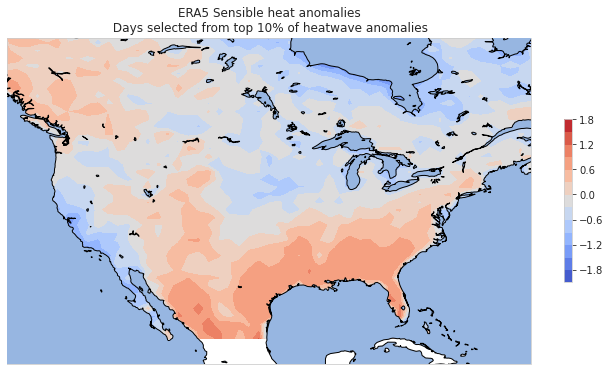

In [36]:
plt_anoms(df_2)

In [22]:
extent = [-130, -65, 20, 60.5]

def plt_anoms(data,cmap='coolwarm'):
    fig = plt.figure(figsize=(12, 6))
    ax = fig.add_subplot(1,1,1,projection=ccrs.PlateCarree())

    ax.set_extent(extent, crs=ccrs.PlateCarree())
    plt.contourf(data.lon, data.lat, data.std_anoms_lhflx, cmap = cmap, levels=10)
    plt.colorbar(shrink = 0.5)
    

    ax.add_feature(cfeature.OCEAN, zorder=100, edgecolor='k')
    ax.add_feature(cfeature.LAKES, edgecolor='black')
    plt.title('ERA5 Latent heat anomalies'
             '\n Days selected from top 10% of heatwave anomalies')
        
    plt.show()

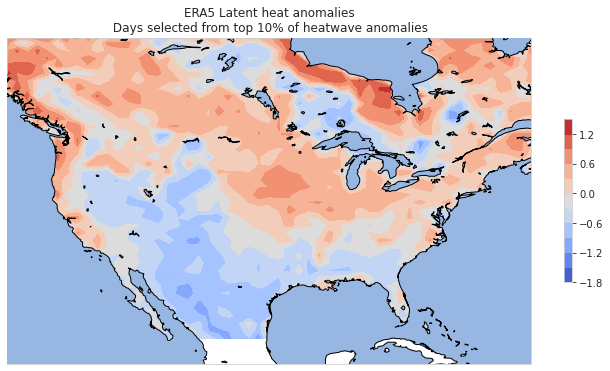

In [23]:
plt_anoms(df_2)

In [37]:
lats = []
lons = []
corr = [] # 'a' =  ++ , 'b' = '+-' , 'c' ='-+' , d='--' (assum shflx first)
for lat in extent_lats:
    for lon in extent_lons:
        if(df_2.std_anoms_shflx.sel({'lat':lat, 'lon':lon}).data.item()>0):
            if(df_2.std_anoms_lhflx.sel({'lat':lat, 'lon':lon}).data.item()>0):
                corr.append(1)
            else:
                corr.append(.5)
        if(df_2.std_anoms_shflx.sel({'lat':lat, 'lon':lon}).data.item()<0):
            if(df_2.std_anoms_lhflx.sel({'lat':lat, 'lon':lon}).data.item()>0):
                corr.append(-.5)
            else:
                corr.append(-1)
        lats.append(lat)
        lons.append(lon)

corr_df = pd.DataFrame({'lats':lats, 'lons':lons, 'corrs':corr})

Text(0.5, 1.0, 'ERA5 quadrant map: red (++), salmon (shflx +), l blue (lhflx +), d blue (--)')

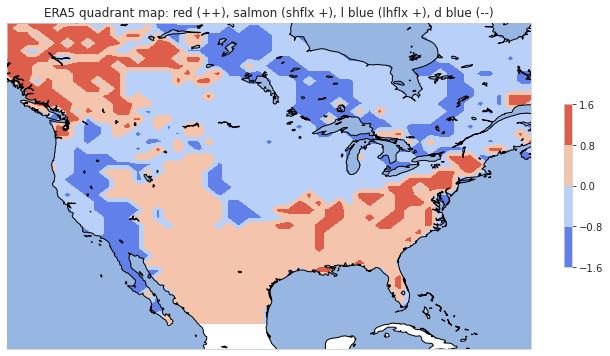

In [38]:
corr_xr = corr_df.set_index(['lats', 'lons']).to_xarray()

extent = [-130, -65, 20, 60.5]
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(1,1,1,projection=ccrs.PlateCarree())

ax.set_extent(extent, crs=ccrs.PlateCarree())
plt.contourf(corr_xr.lons, corr_xr.lats,corr_xr.corrs,cmap='coolwarm',levels=2)
plt.colorbar(shrink = 0.5)
    

ax.add_feature(cfeature.OCEAN, zorder=100, edgecolor='k')
ax.add_feature(cfeature.LAKES, edgecolor='black')

plt.title("ERA5 quadrant map: red (++), salmon (shflx +), l blue (lhflx +), d blue (--)")

Europe:

In [11]:
all_lats = t2m.lat.values
all_lons = t2m.lon.values

extent = [-25, 60, 35, 72]
extent_lats, extent_lons = [], []

for lat in all_lats:
    if lat >= 35 and lat <= 72:
        print(lat)
        extent_lats.append(lat)
        
for lon in all_lons:
    if lon >= (-25+360) or lon <= 60:
        print(lon)
        extent_lons.append(lon)

35.340314136125656
36.282722513089
37.225130890052355
38.16753926701571
39.10994764397907
40.0523560209424
40.994764397905755
41.93717277486911
42.87958115183247
43.8219895287958
44.764397905759154
45.70680628272251
46.64921465968587
47.591623036649224
48.53403141361255
49.47643979057591
50.41884816753927
51.36125654450262
52.30366492146598
53.24607329842931
54.188481675392666
55.13089005235602
56.07329842931938
57.01570680628271
57.958115183246065
58.90052356020942
59.84293193717278
60.785340314136135
61.727748691099464
62.67015706806282
63.61256544502618
64.55497382198953
65.49738219895289
66.43979057591622
67.38219895287958
68.32460732984293
69.26701570680629
70.20942408376962
71.15183246073298
0.0
1.25
2.5
3.75
5.0
6.25
7.5
8.75
10.0
11.25
12.5
13.75
15.0
16.25
17.5
18.75
20.0
21.25
22.5
23.75
25.0
26.25
27.5
28.75
30.0
31.25
32.5
33.75
35.0
36.25
37.5
38.75
40.0
41.25
42.5
43.75
45.0
46.25
47.5
48.75
50.0
51.25
52.5
53.75
55.0
56.25
57.5
58.75
60.0
335.0
336.25
337.5
338.75
340.0


In [12]:
lat=[]
lon=[]
std_anoms_shflx = []
std_anoms_lhflx = []
#std_anoms_sfmc = []
#std_anoms_t2m = []

for latitude in extent_lats:
    for longitude in extent_lons:
        print(latitude, longitude)
        
        s_t2m = t2m.t2m.sel(lat=latitude,lon=longitude)
        s_lhflx = lhflx.lhflx.sel(lat=latitude,lon=longitude)
        s_shflx = shflx.shflx.sel(lat=latitude,lon=longitude)
        
       # subset_anoms_sfmc = std_anoms(subset['SFMC'])
        subset_anoms_shflx = remove_annual_cycle(jja_std_anoms(s_shflx)) # the anomalies, standardized by JJA sd
        subset_anoms_lhflx = remove_annual_cycle(jja_std_anoms(s_lhflx))
       
      #  subset_anoms_t2m = std_anoms(subset['T2MMEAN'])
        t = remove_annual_cycle(jja_std_anoms(s_t2m))   # anomalies, not standardized, just JJA
        t = t.sel({'time':t['time.season']=='JJA'})
        heatwave_days = t[t>=t.quantile(0.9)].time.values
        
        std_anoms_shflx.append(subset_anoms_shflx.sel(time=heatwave_days).mean().item())
        std_anoms_lhflx.append(subset_anoms_lhflx.sel(time=heatwave_days).mean().item())
       # std_anom_sfmc.append(subset_anoms_sfmc.sel(time=heatwave_days).mean().item())
       # std_anom_t2m.append(subset_anoms_t2m.sel(time=heatwave_days).mean().item())
        lat.append(latitude)
        lon.append(longitude)
        
df_2 = pd.DataFrame({'lat':lat,'lon':lon,'std_anoms_shflx':std_anoms_shflx,'std_anoms_lhflx':std_anoms_lhflx})
                   # 'std_anoms_sfmc':std_anoms_sfmc, 'std_anoms_t2m':std_anoms_t2m})

35.340314136125656 0.0
35.340314136125656 1.25
35.340314136125656 2.5
35.340314136125656 3.75
35.340314136125656 5.0
35.340314136125656 6.25
35.340314136125656 7.5
35.340314136125656 8.75
35.340314136125656 10.0
35.340314136125656 11.25
35.340314136125656 12.5
35.340314136125656 13.75
35.340314136125656 15.0
35.340314136125656 16.25
35.340314136125656 17.5
35.340314136125656 18.75
35.340314136125656 20.0
35.340314136125656 21.25
35.340314136125656 22.5
35.340314136125656 23.75
35.340314136125656 25.0
35.340314136125656 26.25
35.340314136125656 27.5
35.340314136125656 28.75
35.340314136125656 30.0
35.340314136125656 31.25
35.340314136125656 32.5
35.340314136125656 33.75
35.340314136125656 35.0
35.340314136125656 36.25
35.340314136125656 37.5
35.340314136125656 38.75
35.340314136125656 40.0
35.340314136125656 41.25
35.340314136125656 42.5
35.340314136125656 43.75
35.340314136125656 45.0
35.340314136125656 46.25
35.340314136125656 47.5
35.340314136125656 48.75
35.340314136125656 50.0
35.3

40.0523560209424 2.5
40.0523560209424 3.75
40.0523560209424 5.0
40.0523560209424 6.25
40.0523560209424 7.5
40.0523560209424 8.75
40.0523560209424 10.0
40.0523560209424 11.25
40.0523560209424 12.5
40.0523560209424 13.75
40.0523560209424 15.0
40.0523560209424 16.25
40.0523560209424 17.5
40.0523560209424 18.75
40.0523560209424 20.0
40.0523560209424 21.25
40.0523560209424 22.5
40.0523560209424 23.75
40.0523560209424 25.0
40.0523560209424 26.25
40.0523560209424 27.5
40.0523560209424 28.75
40.0523560209424 30.0
40.0523560209424 31.25
40.0523560209424 32.5
40.0523560209424 33.75
40.0523560209424 35.0
40.0523560209424 36.25
40.0523560209424 37.5
40.0523560209424 38.75
40.0523560209424 40.0
40.0523560209424 41.25
40.0523560209424 42.5
40.0523560209424 43.75
40.0523560209424 45.0
40.0523560209424 46.25
40.0523560209424 47.5
40.0523560209424 48.75
40.0523560209424 50.0
40.0523560209424 51.25
40.0523560209424 52.5
40.0523560209424 53.75
40.0523560209424 55.0
40.0523560209424 56.25
40.0523560209424

44.764397905759154 7.5
44.764397905759154 8.75
44.764397905759154 10.0
44.764397905759154 11.25
44.764397905759154 12.5
44.764397905759154 13.75
44.764397905759154 15.0
44.764397905759154 16.25
44.764397905759154 17.5
44.764397905759154 18.75
44.764397905759154 20.0
44.764397905759154 21.25
44.764397905759154 22.5
44.764397905759154 23.75
44.764397905759154 25.0
44.764397905759154 26.25
44.764397905759154 27.5
44.764397905759154 28.75
44.764397905759154 30.0
44.764397905759154 31.25
44.764397905759154 32.5
44.764397905759154 33.75
44.764397905759154 35.0
44.764397905759154 36.25
44.764397905759154 37.5
44.764397905759154 38.75
44.764397905759154 40.0
44.764397905759154 41.25
44.764397905759154 42.5
44.764397905759154 43.75
44.764397905759154 45.0
44.764397905759154 46.25
44.764397905759154 47.5
44.764397905759154 48.75
44.764397905759154 50.0
44.764397905759154 51.25
44.764397905759154 52.5
44.764397905759154 53.75
44.764397905759154 55.0
44.764397905759154 56.25
44.764397905759154 57.

49.47643979057591 2.5
49.47643979057591 3.75
49.47643979057591 5.0
49.47643979057591 6.25
49.47643979057591 7.5
49.47643979057591 8.75
49.47643979057591 10.0
49.47643979057591 11.25
49.47643979057591 12.5
49.47643979057591 13.75
49.47643979057591 15.0
49.47643979057591 16.25
49.47643979057591 17.5
49.47643979057591 18.75
49.47643979057591 20.0
49.47643979057591 21.25
49.47643979057591 22.5
49.47643979057591 23.75
49.47643979057591 25.0
49.47643979057591 26.25
49.47643979057591 27.5
49.47643979057591 28.75
49.47643979057591 30.0
49.47643979057591 31.25
49.47643979057591 32.5
49.47643979057591 33.75
49.47643979057591 35.0
49.47643979057591 36.25
49.47643979057591 37.5
49.47643979057591 38.75
49.47643979057591 40.0
49.47643979057591 41.25
49.47643979057591 42.5
49.47643979057591 43.75
49.47643979057591 45.0
49.47643979057591 46.25
49.47643979057591 47.5
49.47643979057591 48.75
49.47643979057591 50.0
49.47643979057591 51.25
49.47643979057591 52.5
49.47643979057591 53.75
49.47643979057591 5

54.188481675392666 5.0
54.188481675392666 6.25
54.188481675392666 7.5
54.188481675392666 8.75
54.188481675392666 10.0
54.188481675392666 11.25
54.188481675392666 12.5
54.188481675392666 13.75
54.188481675392666 15.0
54.188481675392666 16.25
54.188481675392666 17.5
54.188481675392666 18.75
54.188481675392666 20.0
54.188481675392666 21.25
54.188481675392666 22.5
54.188481675392666 23.75
54.188481675392666 25.0
54.188481675392666 26.25
54.188481675392666 27.5
54.188481675392666 28.75
54.188481675392666 30.0
54.188481675392666 31.25
54.188481675392666 32.5
54.188481675392666 33.75
54.188481675392666 35.0
54.188481675392666 36.25
54.188481675392666 37.5
54.188481675392666 38.75
54.188481675392666 40.0
54.188481675392666 41.25
54.188481675392666 42.5
54.188481675392666 43.75
54.188481675392666 45.0
54.188481675392666 46.25
54.188481675392666 47.5
54.188481675392666 48.75
54.188481675392666 50.0
54.188481675392666 51.25
54.188481675392666 52.5
54.188481675392666 53.75
54.188481675392666 55.0


58.90052356020942 0.0
58.90052356020942 1.25
58.90052356020942 2.5
58.90052356020942 3.75
58.90052356020942 5.0
58.90052356020942 6.25
58.90052356020942 7.5
58.90052356020942 8.75
58.90052356020942 10.0
58.90052356020942 11.25
58.90052356020942 12.5
58.90052356020942 13.75
58.90052356020942 15.0
58.90052356020942 16.25
58.90052356020942 17.5
58.90052356020942 18.75
58.90052356020942 20.0
58.90052356020942 21.25
58.90052356020942 22.5
58.90052356020942 23.75
58.90052356020942 25.0
58.90052356020942 26.25
58.90052356020942 27.5
58.90052356020942 28.75
58.90052356020942 30.0
58.90052356020942 31.25
58.90052356020942 32.5
58.90052356020942 33.75
58.90052356020942 35.0
58.90052356020942 36.25
58.90052356020942 37.5
58.90052356020942 38.75
58.90052356020942 40.0
58.90052356020942 41.25
58.90052356020942 42.5
58.90052356020942 43.75
58.90052356020942 45.0
58.90052356020942 46.25
58.90052356020942 47.5
58.90052356020942 48.75
58.90052356020942 50.0
58.90052356020942 51.25
58.90052356020942 52.

62.67015706806282 355.0
62.67015706806282 356.25
62.67015706806282 357.5
62.67015706806282 358.75
63.61256544502618 0.0
63.61256544502618 1.25
63.61256544502618 2.5
63.61256544502618 3.75
63.61256544502618 5.0
63.61256544502618 6.25
63.61256544502618 7.5
63.61256544502618 8.75
63.61256544502618 10.0
63.61256544502618 11.25
63.61256544502618 12.5
63.61256544502618 13.75
63.61256544502618 15.0
63.61256544502618 16.25
63.61256544502618 17.5
63.61256544502618 18.75
63.61256544502618 20.0
63.61256544502618 21.25
63.61256544502618 22.5
63.61256544502618 23.75
63.61256544502618 25.0
63.61256544502618 26.25
63.61256544502618 27.5
63.61256544502618 28.75
63.61256544502618 30.0
63.61256544502618 31.25
63.61256544502618 32.5
63.61256544502618 33.75
63.61256544502618 35.0
63.61256544502618 36.25
63.61256544502618 37.5
63.61256544502618 38.75
63.61256544502618 40.0
63.61256544502618 41.25
63.61256544502618 42.5
63.61256544502618 43.75
63.61256544502618 45.0
63.61256544502618 46.25
63.61256544502618

67.38219895287958 357.5
67.38219895287958 358.75
68.32460732984293 0.0
68.32460732984293 1.25
68.32460732984293 2.5
68.32460732984293 3.75
68.32460732984293 5.0
68.32460732984293 6.25
68.32460732984293 7.5
68.32460732984293 8.75
68.32460732984293 10.0
68.32460732984293 11.25
68.32460732984293 12.5
68.32460732984293 13.75
68.32460732984293 15.0
68.32460732984293 16.25
68.32460732984293 17.5
68.32460732984293 18.75
68.32460732984293 20.0
68.32460732984293 21.25
68.32460732984293 22.5
68.32460732984293 23.75
68.32460732984293 25.0
68.32460732984293 26.25
68.32460732984293 27.5
68.32460732984293 28.75
68.32460732984293 30.0
68.32460732984293 31.25
68.32460732984293 32.5
68.32460732984293 33.75
68.32460732984293 35.0
68.32460732984293 36.25
68.32460732984293 37.5
68.32460732984293 38.75
68.32460732984293 40.0
68.32460732984293 41.25
68.32460732984293 42.5
68.32460732984293 43.75
68.32460732984293 45.0
68.32460732984293 46.25
68.32460732984293 47.5
68.32460732984293 48.75
68.32460732984293 5

In [7]:
all_lats = t2m.lat.values
all_lons = t2m.lon.values

lat=[]
lon=[]
std_anoms_shflx = []
std_anoms_lhflx = []
#std_anoms_sfmc = []
#std_anoms_t2m = []

for latitude in all_lats:
    for longitude in all_lons:
        print(latitude, longitude)
        
        s_t2m = t2m.t2m.sel(lat=latitude,lon=longitude)
        s_lhflx = lhflx.lhflx.sel(lat=latitude,lon=longitude)
        s_shflx = shflx.shflx.sel(lat=latitude,lon=longitude)
        
       # subset_anoms_sfmc = std_anoms(subset['SFMC'])
        subset_anoms_shflx = remove_annual_cycle(jja_std_anoms(s_shflx)) # the anomalies, standardized by JJA sd
        subset_anoms_lhflx = remove_annual_cycle(jja_std_anoms(s_lhflx))
       
      #  subset_anoms_t2m = std_anoms(subset['T2MMEAN'])
        t = remove_annual_cycle(jja_std_anoms(s_t2m))   # anomalies, not standardized, just JJA
        t = t.sel({'time':t['time.season']=='JJA'})
        heatwave_days = t[t>=t.quantile(0.9)].time.values
        
        std_anoms_shflx.append(subset_anoms_shflx.sel(time=heatwave_days).mean().item())
        std_anoms_lhflx.append(subset_anoms_lhflx.sel(time=heatwave_days).mean().item())
       # std_anom_sfmc.append(subset_anoms_sfmc.sel(time=heatwave_days).mean().item())
       # std_anom_t2m.append(subset_anoms_t2m.sel(time=heatwave_days).mean().item())
        lat.append(latitude)
        lon.append(longitude)
        
df_2 = pd.DataFrame({'lat':lat,'lon':lon,'std_anoms_shflx':std_anoms_shflx,'std_anoms_lhflx':std_anoms_lhflx})
                   # 'std_anoms_sfmc':std_anoms_sfmc, 'std_anoms_t2m':std_anoms_t2m})

-90.0 0.0
-90.0 1.25
-90.0 2.5
-90.0 3.75
-90.0 5.0
-90.0 6.25
-90.0 7.5
-90.0 8.75
-90.0 10.0
-90.0 11.25
-90.0 12.5
-90.0 13.75
-90.0 15.0
-90.0 16.25
-90.0 17.5
-90.0 18.75
-90.0 20.0
-90.0 21.25
-90.0 22.5
-90.0 23.75
-90.0 25.0
-90.0 26.25
-90.0 27.5
-90.0 28.75
-90.0 30.0
-90.0 31.25
-90.0 32.5
-90.0 33.75
-90.0 35.0
-90.0 36.25
-90.0 37.5
-90.0 38.75
-90.0 40.0
-90.0 41.25
-90.0 42.5
-90.0 43.75
-90.0 45.0
-90.0 46.25
-90.0 47.5
-90.0 48.75
-90.0 50.0
-90.0 51.25
-90.0 52.5
-90.0 53.75
-90.0 55.0
-90.0 56.25
-90.0 57.5
-90.0 58.75
-90.0 60.0
-90.0 61.25
-90.0 62.5
-90.0 63.75
-90.0 65.0
-90.0 66.25
-90.0 67.5
-90.0 68.75
-90.0 70.0
-90.0 71.25
-90.0 72.5
-90.0 73.75
-90.0 75.0
-90.0 76.25
-90.0 77.5
-90.0 78.75
-90.0 80.0
-90.0 81.25
-90.0 82.5
-90.0 83.75
-90.0 85.0
-90.0 86.25
-90.0 87.5
-90.0 88.75
-90.0 90.0
-90.0 91.25
-90.0 92.5
-90.0 93.75
-90.0 95.0
-90.0 96.25
-90.0 97.5
-90.0 98.75
-90.0 100.0
-90.0 101.25
-90.0 102.5
-90.0 103.75
-90.0 105.0
-90.0 106.25
-90.0 107.5
-

-89.05759162303664 235.0
-89.05759162303664 236.25
-89.05759162303664 237.5
-89.05759162303664 238.75
-89.05759162303664 240.0
-89.05759162303664 241.25
-89.05759162303664 242.5
-89.05759162303664 243.75
-89.05759162303664 245.0
-89.05759162303664 246.25
-89.05759162303664 247.5
-89.05759162303664 248.75
-89.05759162303664 250.0
-89.05759162303664 251.25
-89.05759162303664 252.5
-89.05759162303664 253.75
-89.05759162303664 255.0
-89.05759162303664 256.25
-89.05759162303664 257.5
-89.05759162303664 258.75
-89.05759162303664 260.0
-89.05759162303664 261.25
-89.05759162303664 262.5
-89.05759162303664 263.75
-89.05759162303664 265.0
-89.05759162303664 266.25
-89.05759162303664 267.5
-89.05759162303664 268.75
-89.05759162303664 270.0
-89.05759162303664 271.25
-89.05759162303664 272.5
-89.05759162303664 273.75
-89.05759162303664 275.0
-89.05759162303664 276.25
-89.05759162303664 277.5
-89.05759162303664 278.75
-89.05759162303664 280.0
-89.05759162303664 281.25
-89.05759162303664 282.5
-89.05

-88.1151832460733 292.5
-88.1151832460733 293.75
-88.1151832460733 295.0
-88.1151832460733 296.25
-88.1151832460733 297.5
-88.1151832460733 298.75
-88.1151832460733 300.0
-88.1151832460733 301.25
-88.1151832460733 302.5
-88.1151832460733 303.75
-88.1151832460733 305.0
-88.1151832460733 306.25
-88.1151832460733 307.5
-88.1151832460733 308.75
-88.1151832460733 310.0
-88.1151832460733 311.25
-88.1151832460733 312.5
-88.1151832460733 313.75
-88.1151832460733 315.0
-88.1151832460733 316.25
-88.1151832460733 317.5
-88.1151832460733 318.75
-88.1151832460733 320.0
-88.1151832460733 321.25
-88.1151832460733 322.5
-88.1151832460733 323.75
-88.1151832460733 325.0
-88.1151832460733 326.25
-88.1151832460733 327.5
-88.1151832460733 328.75
-88.1151832460733 330.0
-88.1151832460733 331.25
-88.1151832460733 332.5
-88.1151832460733 333.75
-88.1151832460733 335.0
-88.1151832460733 336.25
-88.1151832460733 337.5
-88.1151832460733 338.75
-88.1151832460733 340.0
-88.1151832460733 341.25
-88.1151832460733 34

-87.17277486910994 341.25
-87.17277486910994 342.5
-87.17277486910994 343.75
-87.17277486910994 345.0
-87.17277486910994 346.25
-87.17277486910994 347.5
-87.17277486910994 348.75
-87.17277486910994 350.0
-87.17277486910994 351.25
-87.17277486910994 352.5
-87.17277486910994 353.75
-87.17277486910994 355.0
-87.17277486910994 356.25
-87.17277486910994 357.5
-87.17277486910994 358.75
-86.2303664921466 0.0
-86.2303664921466 1.25
-86.2303664921466 2.5
-86.2303664921466 3.75
-86.2303664921466 5.0
-86.2303664921466 6.25
-86.2303664921466 7.5
-86.2303664921466 8.75
-86.2303664921466 10.0
-86.2303664921466 11.25
-86.2303664921466 12.5
-86.2303664921466 13.75
-86.2303664921466 15.0
-86.2303664921466 16.25
-86.2303664921466 17.5
-86.2303664921466 18.75
-86.2303664921466 20.0
-86.2303664921466 21.25
-86.2303664921466 22.5
-86.2303664921466 23.75
-86.2303664921466 25.0
-86.2303664921466 26.25
-86.2303664921466 27.5
-86.2303664921466 28.75
-86.2303664921466 30.0
-86.2303664921466 31.25
-86.2303664921

-85.28795811518324 43.75
-85.28795811518324 45.0
-85.28795811518324 46.25
-85.28795811518324 47.5
-85.28795811518324 48.75
-85.28795811518324 50.0
-85.28795811518324 51.25
-85.28795811518324 52.5
-85.28795811518324 53.75
-85.28795811518324 55.0
-85.28795811518324 56.25
-85.28795811518324 57.5
-85.28795811518324 58.75
-85.28795811518324 60.0
-85.28795811518324 61.25
-85.28795811518324 62.5
-85.28795811518324 63.75
-85.28795811518324 65.0
-85.28795811518324 66.25
-85.28795811518324 67.5
-85.28795811518324 68.75
-85.28795811518324 70.0
-85.28795811518324 71.25
-85.28795811518324 72.5
-85.28795811518324 73.75
-85.28795811518324 75.0
-85.28795811518324 76.25
-85.28795811518324 77.5
-85.28795811518324 78.75
-85.28795811518324 80.0
-85.28795811518324 81.25
-85.28795811518324 82.5
-85.28795811518324 83.75
-85.28795811518324 85.0
-85.28795811518324 86.25
-85.28795811518324 87.5
-85.28795811518324 88.75
-85.28795811518324 90.0
-85.28795811518324 91.25
-85.28795811518324 92.5
-85.28795811518324 9

-84.3455497382199 96.25
-84.3455497382199 97.5
-84.3455497382199 98.75
-84.3455497382199 100.0
-84.3455497382199 101.25
-84.3455497382199 102.5
-84.3455497382199 103.75
-84.3455497382199 105.0
-84.3455497382199 106.25
-84.3455497382199 107.5
-84.3455497382199 108.75
-84.3455497382199 110.0
-84.3455497382199 111.25
-84.3455497382199 112.5
-84.3455497382199 113.75
-84.3455497382199 115.0
-84.3455497382199 116.25
-84.3455497382199 117.5
-84.3455497382199 118.75
-84.3455497382199 120.0
-84.3455497382199 121.25
-84.3455497382199 122.5
-84.3455497382199 123.75
-84.3455497382199 125.0
-84.3455497382199 126.25
-84.3455497382199 127.5
-84.3455497382199 128.75
-84.3455497382199 130.0
-84.3455497382199 131.25
-84.3455497382199 132.5
-84.3455497382199 133.75
-84.3455497382199 135.0
-84.3455497382199 136.25
-84.3455497382199 137.5
-84.3455497382199 138.75
-84.3455497382199 140.0
-84.3455497382199 141.25
-84.3455497382199 142.5
-84.3455497382199 143.75
-84.3455497382199 145.0
-84.3455497382199 146.2

-83.40314136125654 153.75
-83.40314136125654 155.0
-83.40314136125654 156.25
-83.40314136125654 157.5
-83.40314136125654 158.75
-83.40314136125654 160.0
-83.40314136125654 161.25
-83.40314136125654 162.5
-83.40314136125654 163.75
-83.40314136125654 165.0
-83.40314136125654 166.25
-83.40314136125654 167.5
-83.40314136125654 168.75
-83.40314136125654 170.0
-83.40314136125654 171.25
-83.40314136125654 172.5
-83.40314136125654 173.75
-83.40314136125654 175.0
-83.40314136125654 176.25
-83.40314136125654 177.5
-83.40314136125654 178.75
-83.40314136125654 180.0
-83.40314136125654 181.25
-83.40314136125654 182.5
-83.40314136125654 183.75
-83.40314136125654 185.0
-83.40314136125654 186.25
-83.40314136125654 187.5
-83.40314136125654 188.75
-83.40314136125654 190.0
-83.40314136125654 191.25
-83.40314136125654 192.5
-83.40314136125654 193.75
-83.40314136125654 195.0
-83.40314136125654 196.25
-83.40314136125654 197.5
-83.40314136125654 198.75
-83.40314136125654 200.0
-83.40314136125654 201.25
-83.4

-82.46073298429319 200.0
-82.46073298429319 201.25
-82.46073298429319 202.5
-82.46073298429319 203.75
-82.46073298429319 205.0
-82.46073298429319 206.25
-82.46073298429319 207.5
-82.46073298429319 208.75
-82.46073298429319 210.0
-82.46073298429319 211.25
-82.46073298429319 212.5
-82.46073298429319 213.75
-82.46073298429319 215.0
-82.46073298429319 216.25
-82.46073298429319 217.5
-82.46073298429319 218.75
-82.46073298429319 220.0
-82.46073298429319 221.25
-82.46073298429319 222.5
-82.46073298429319 223.75
-82.46073298429319 225.0
-82.46073298429319 226.25
-82.46073298429319 227.5
-82.46073298429319 228.75
-82.46073298429319 230.0
-82.46073298429319 231.25
-82.46073298429319 232.5
-82.46073298429319 233.75
-82.46073298429319 235.0
-82.46073298429319 236.25
-82.46073298429319 237.5
-82.46073298429319 238.75
-82.46073298429319 240.0
-82.46073298429319 241.25
-82.46073298429319 242.5
-82.46073298429319 243.75
-82.46073298429319 245.0
-82.46073298429319 246.25
-82.46073298429319 247.5
-82.46

-81.51832460732984 246.25
-81.51832460732984 247.5
-81.51832460732984 248.75
-81.51832460732984 250.0
-81.51832460732984 251.25
-81.51832460732984 252.5
-81.51832460732984 253.75
-81.51832460732984 255.0
-81.51832460732984 256.25
-81.51832460732984 257.5
-81.51832460732984 258.75
-81.51832460732984 260.0
-81.51832460732984 261.25
-81.51832460732984 262.5
-81.51832460732984 263.75
-81.51832460732984 265.0
-81.51832460732984 266.25
-81.51832460732984 267.5
-81.51832460732984 268.75
-81.51832460732984 270.0
-81.51832460732984 271.25
-81.51832460732984 272.5
-81.51832460732984 273.75
-81.51832460732984 275.0
-81.51832460732984 276.25
-81.51832460732984 277.5
-81.51832460732984 278.75
-81.51832460732984 280.0
-81.51832460732984 281.25
-81.51832460732984 282.5
-81.51832460732984 283.75
-81.51832460732984 285.0
-81.51832460732984 286.25
-81.51832460732984 287.5
-81.51832460732984 288.75
-81.51832460732984 290.0
-81.51832460732984 291.25
-81.51832460732984 292.5
-81.51832460732984 293.75
-81.5

-80.57591623036649 292.5
-80.57591623036649 293.75
-80.57591623036649 295.0
-80.57591623036649 296.25
-80.57591623036649 297.5
-80.57591623036649 298.75
-80.57591623036649 300.0
-80.57591623036649 301.25
-80.57591623036649 302.5
-80.57591623036649 303.75
-80.57591623036649 305.0
-80.57591623036649 306.25
-80.57591623036649 307.5
-80.57591623036649 308.75
-80.57591623036649 310.0
-80.57591623036649 311.25
-80.57591623036649 312.5
-80.57591623036649 313.75
-80.57591623036649 315.0
-80.57591623036649 316.25
-80.57591623036649 317.5
-80.57591623036649 318.75
-80.57591623036649 320.0
-80.57591623036649 321.25
-80.57591623036649 322.5
-80.57591623036649 323.75
-80.57591623036649 325.0
-80.57591623036649 326.25
-80.57591623036649 327.5
-80.57591623036649 328.75
-80.57591623036649 330.0
-80.57591623036649 331.25
-80.57591623036649 332.5
-80.57591623036649 333.75
-80.57591623036649 335.0
-80.57591623036649 336.25
-80.57591623036649 337.5
-80.57591623036649 338.75
-80.57591623036649 340.0
-80.57

-79.63350785340315 338.75
-79.63350785340315 340.0
-79.63350785340315 341.25
-79.63350785340315 342.5
-79.63350785340315 343.75
-79.63350785340315 345.0
-79.63350785340315 346.25
-79.63350785340315 347.5
-79.63350785340315 348.75
-79.63350785340315 350.0
-79.63350785340315 351.25
-79.63350785340315 352.5
-79.63350785340315 353.75
-79.63350785340315 355.0
-79.63350785340315 356.25
-79.63350785340315 357.5
-79.63350785340315 358.75
-78.69109947643979 0.0
-78.69109947643979 1.25
-78.69109947643979 2.5
-78.69109947643979 3.75
-78.69109947643979 5.0
-78.69109947643979 6.25
-78.69109947643979 7.5
-78.69109947643979 8.75
-78.69109947643979 10.0
-78.69109947643979 11.25
-78.69109947643979 12.5
-78.69109947643979 13.75
-78.69109947643979 15.0
-78.69109947643979 16.25
-78.69109947643979 17.5
-78.69109947643979 18.75
-78.69109947643979 20.0
-78.69109947643979 21.25
-78.69109947643979 22.5
-78.69109947643979 23.75
-78.69109947643979 25.0
-78.69109947643979 26.25
-78.69109947643979 27.5
-78.6910994

-77.74869109947645 26.25
-77.74869109947645 27.5
-77.74869109947645 28.75
-77.74869109947645 30.0
-77.74869109947645 31.25
-77.74869109947645 32.5
-77.74869109947645 33.75
-77.74869109947645 35.0
-77.74869109947645 36.25
-77.74869109947645 37.5
-77.74869109947645 38.75
-77.74869109947645 40.0
-77.74869109947645 41.25
-77.74869109947645 42.5
-77.74869109947645 43.75
-77.74869109947645 45.0
-77.74869109947645 46.25
-77.74869109947645 47.5
-77.74869109947645 48.75
-77.74869109947645 50.0
-77.74869109947645 51.25
-77.74869109947645 52.5
-77.74869109947645 53.75
-77.74869109947645 55.0
-77.74869109947645 56.25
-77.74869109947645 57.5
-77.74869109947645 58.75
-77.74869109947645 60.0
-77.74869109947645 61.25
-77.74869109947645 62.5
-77.74869109947645 63.75
-77.74869109947645 65.0
-77.74869109947645 66.25
-77.74869109947645 67.5
-77.74869109947645 68.75
-77.74869109947645 70.0
-77.74869109947645 71.25
-77.74869109947645 72.5
-77.74869109947645 73.75
-77.74869109947645 75.0
-77.74869109947645 7

-76.80628272251309 75.0
-76.80628272251309 76.25
-76.80628272251309 77.5
-76.80628272251309 78.75
-76.80628272251309 80.0
-76.80628272251309 81.25
-76.80628272251309 82.5
-76.80628272251309 83.75
-76.80628272251309 85.0
-76.80628272251309 86.25
-76.80628272251309 87.5
-76.80628272251309 88.75
-76.80628272251309 90.0
-76.80628272251309 91.25
-76.80628272251309 92.5
-76.80628272251309 93.75
-76.80628272251309 95.0
-76.80628272251309 96.25
-76.80628272251309 97.5
-76.80628272251309 98.75
-76.80628272251309 100.0
-76.80628272251309 101.25
-76.80628272251309 102.5
-76.80628272251309 103.75
-76.80628272251309 105.0
-76.80628272251309 106.25
-76.80628272251309 107.5
-76.80628272251309 108.75
-76.80628272251309 110.0
-76.80628272251309 111.25
-76.80628272251309 112.5
-76.80628272251309 113.75
-76.80628272251309 115.0
-76.80628272251309 116.25
-76.80628272251309 117.5
-76.80628272251309 118.75
-76.80628272251309 120.0
-76.80628272251309 121.25
-76.80628272251309 122.5
-76.80628272251309 123.75


-75.86387434554973 122.5
-75.86387434554973 123.75
-75.86387434554973 125.0
-75.86387434554973 126.25
-75.86387434554973 127.5
-75.86387434554973 128.75
-75.86387434554973 130.0
-75.86387434554973 131.25
-75.86387434554973 132.5
-75.86387434554973 133.75
-75.86387434554973 135.0
-75.86387434554973 136.25
-75.86387434554973 137.5
-75.86387434554973 138.75
-75.86387434554973 140.0
-75.86387434554973 141.25
-75.86387434554973 142.5
-75.86387434554973 143.75
-75.86387434554973 145.0
-75.86387434554973 146.25
-75.86387434554973 147.5
-75.86387434554973 148.75
-75.86387434554973 150.0
-75.86387434554973 151.25
-75.86387434554973 152.5
-75.86387434554973 153.75
-75.86387434554973 155.0
-75.86387434554973 156.25
-75.86387434554973 157.5
-75.86387434554973 158.75
-75.86387434554973 160.0
-75.86387434554973 161.25
-75.86387434554973 162.5
-75.86387434554973 163.75
-75.86387434554973 165.0
-75.86387434554973 166.25
-75.86387434554973 167.5
-75.86387434554973 168.75
-75.86387434554973 170.0
-75.86

-74.92146596858639 168.75
-74.92146596858639 170.0
-74.92146596858639 171.25
-74.92146596858639 172.5
-74.92146596858639 173.75
-74.92146596858639 175.0
-74.92146596858639 176.25
-74.92146596858639 177.5
-74.92146596858639 178.75
-74.92146596858639 180.0
-74.92146596858639 181.25
-74.92146596858639 182.5
-74.92146596858639 183.75
-74.92146596858639 185.0
-74.92146596858639 186.25
-74.92146596858639 187.5
-74.92146596858639 188.75
-74.92146596858639 190.0
-74.92146596858639 191.25
-74.92146596858639 192.5
-74.92146596858639 193.75
-74.92146596858639 195.0
-74.92146596858639 196.25
-74.92146596858639 197.5
-74.92146596858639 198.75
-74.92146596858639 200.0
-74.92146596858639 201.25
-74.92146596858639 202.5
-74.92146596858639 203.75
-74.92146596858639 205.0
-74.92146596858639 206.25
-74.92146596858639 207.5
-74.92146596858639 208.75
-74.92146596858639 210.0
-74.92146596858639 211.25
-74.92146596858639 212.5
-74.92146596858639 213.75
-74.92146596858639 215.0
-74.92146596858639 216.25
-74.9

-73.97905759162303 215.0
-73.97905759162303 216.25
-73.97905759162303 217.5
-73.97905759162303 218.75
-73.97905759162303 220.0
-73.97905759162303 221.25
-73.97905759162303 222.5
-73.97905759162303 223.75
-73.97905759162303 225.0
-73.97905759162303 226.25
-73.97905759162303 227.5
-73.97905759162303 228.75
-73.97905759162303 230.0
-73.97905759162303 231.25
-73.97905759162303 232.5
-73.97905759162303 233.75
-73.97905759162303 235.0
-73.97905759162303 236.25
-73.97905759162303 237.5
-73.97905759162303 238.75
-73.97905759162303 240.0
-73.97905759162303 241.25
-73.97905759162303 242.5
-73.97905759162303 243.75
-73.97905759162303 245.0
-73.97905759162303 246.25
-73.97905759162303 247.5
-73.97905759162303 248.75
-73.97905759162303 250.0
-73.97905759162303 251.25
-73.97905759162303 252.5
-73.97905759162303 253.75
-73.97905759162303 255.0
-73.97905759162303 256.25
-73.97905759162303 257.5
-73.97905759162303 258.75
-73.97905759162303 260.0
-73.97905759162303 261.25
-73.97905759162303 262.5
-73.97

-73.03664921465969 261.25
-73.03664921465969 262.5
-73.03664921465969 263.75
-73.03664921465969 265.0
-73.03664921465969 266.25
-73.03664921465969 267.5
-73.03664921465969 268.75
-73.03664921465969 270.0
-73.03664921465969 271.25
-73.03664921465969 272.5
-73.03664921465969 273.75
-73.03664921465969 275.0
-73.03664921465969 276.25
-73.03664921465969 277.5
-73.03664921465969 278.75
-73.03664921465969 280.0
-73.03664921465969 281.25
-73.03664921465969 282.5
-73.03664921465969 283.75
-73.03664921465969 285.0
-73.03664921465969 286.25
-73.03664921465969 287.5
-73.03664921465969 288.75
-73.03664921465969 290.0
-73.03664921465969 291.25
-73.03664921465969 292.5
-73.03664921465969 293.75
-73.03664921465969 295.0
-73.03664921465969 296.25
-73.03664921465969 297.5
-73.03664921465969 298.75
-73.03664921465969 300.0
-73.03664921465969 301.25
-73.03664921465969 302.5
-73.03664921465969 303.75
-73.03664921465969 305.0
-73.03664921465969 306.25
-73.03664921465969 307.5
-73.03664921465969 308.75
-73.0

-72.09424083769633 307.5
-72.09424083769633 308.75
-72.09424083769633 310.0
-72.09424083769633 311.25
-72.09424083769633 312.5
-72.09424083769633 313.75
-72.09424083769633 315.0
-72.09424083769633 316.25
-72.09424083769633 317.5
-72.09424083769633 318.75
-72.09424083769633 320.0
-72.09424083769633 321.25
-72.09424083769633 322.5
-72.09424083769633 323.75
-72.09424083769633 325.0
-72.09424083769633 326.25
-72.09424083769633 327.5
-72.09424083769633 328.75
-72.09424083769633 330.0
-72.09424083769633 331.25
-72.09424083769633 332.5
-72.09424083769633 333.75
-72.09424083769633 335.0
-72.09424083769633 336.25
-72.09424083769633 337.5
-72.09424083769633 338.75
-72.09424083769633 340.0
-72.09424083769633 341.25
-72.09424083769633 342.5
-72.09424083769633 343.75
-72.09424083769633 345.0
-72.09424083769633 346.25
-72.09424083769633 347.5
-72.09424083769633 348.75
-72.09424083769633 350.0
-72.09424083769633 351.25
-72.09424083769633 352.5
-72.09424083769633 353.75
-72.09424083769633 355.0
-72.09

-71.15183246073298 353.75
-71.15183246073298 355.0
-71.15183246073298 356.25
-71.15183246073298 357.5
-71.15183246073298 358.75
-70.20942408376963 0.0
-70.20942408376963 1.25
-70.20942408376963 2.5
-70.20942408376963 3.75
-70.20942408376963 5.0
-70.20942408376963 6.25
-70.20942408376963 7.5
-70.20942408376963 8.75
-70.20942408376963 10.0
-70.20942408376963 11.25
-70.20942408376963 12.5
-70.20942408376963 13.75
-70.20942408376963 15.0
-70.20942408376963 16.25
-70.20942408376963 17.5
-70.20942408376963 18.75
-70.20942408376963 20.0
-70.20942408376963 21.25
-70.20942408376963 22.5
-70.20942408376963 23.75
-70.20942408376963 25.0
-70.20942408376963 26.25
-70.20942408376963 27.5
-70.20942408376963 28.75
-70.20942408376963 30.0
-70.20942408376963 31.25
-70.20942408376963 32.5
-70.20942408376963 33.75
-70.20942408376963 35.0
-70.20942408376963 36.25
-70.20942408376963 37.5
-70.20942408376963 38.75
-70.20942408376963 40.0
-70.20942408376963 41.25
-70.20942408376963 42.5
-70.20942408376963 43.7

-69.26701570680629 42.5
-69.26701570680629 43.75
-69.26701570680629 45.0
-69.26701570680629 46.25
-69.26701570680629 47.5
-69.26701570680629 48.75
-69.26701570680629 50.0
-69.26701570680629 51.25
-69.26701570680629 52.5
-69.26701570680629 53.75
-69.26701570680629 55.0
-69.26701570680629 56.25
-69.26701570680629 57.5
-69.26701570680629 58.75
-69.26701570680629 60.0
-69.26701570680629 61.25
-69.26701570680629 62.5
-69.26701570680629 63.75
-69.26701570680629 65.0
-69.26701570680629 66.25
-69.26701570680629 67.5
-69.26701570680629 68.75
-69.26701570680629 70.0
-69.26701570680629 71.25
-69.26701570680629 72.5
-69.26701570680629 73.75
-69.26701570680629 75.0
-69.26701570680629 76.25
-69.26701570680629 77.5
-69.26701570680629 78.75
-69.26701570680629 80.0
-69.26701570680629 81.25
-69.26701570680629 82.5
-69.26701570680629 83.75
-69.26701570680629 85.0
-69.26701570680629 86.25
-69.26701570680629 87.5
-69.26701570680629 88.75
-69.26701570680629 90.0
-69.26701570680629 91.25
-69.26701570680629 9

-68.32460732984293 91.25
-68.32460732984293 92.5
-68.32460732984293 93.75
-68.32460732984293 95.0
-68.32460732984293 96.25
-68.32460732984293 97.5
-68.32460732984293 98.75
-68.32460732984293 100.0
-68.32460732984293 101.25
-68.32460732984293 102.5
-68.32460732984293 103.75
-68.32460732984293 105.0
-68.32460732984293 106.25
-68.32460732984293 107.5
-68.32460732984293 108.75
-68.32460732984293 110.0
-68.32460732984293 111.25
-68.32460732984293 112.5
-68.32460732984293 113.75
-68.32460732984293 115.0
-68.32460732984293 116.25
-68.32460732984293 117.5
-68.32460732984293 118.75
-68.32460732984293 120.0
-68.32460732984293 121.25
-68.32460732984293 122.5
-68.32460732984293 123.75
-68.32460732984293 125.0
-68.32460732984293 126.25
-68.32460732984293 127.5
-68.32460732984293 128.75
-68.32460732984293 130.0
-68.32460732984293 131.25
-68.32460732984293 132.5
-68.32460732984293 133.75
-68.32460732984293 135.0
-68.32460732984293 136.25
-68.32460732984293 137.5
-68.32460732984293 138.75
-68.32460732

-67.38219895287958 137.5
-67.38219895287958 138.75
-67.38219895287958 140.0
-67.38219895287958 141.25
-67.38219895287958 142.5
-67.38219895287958 143.75
-67.38219895287958 145.0
-67.38219895287958 146.25
-67.38219895287958 147.5
-67.38219895287958 148.75
-67.38219895287958 150.0
-67.38219895287958 151.25
-67.38219895287958 152.5
-67.38219895287958 153.75
-67.38219895287958 155.0
-67.38219895287958 156.25
-67.38219895287958 157.5
-67.38219895287958 158.75
-67.38219895287958 160.0
-67.38219895287958 161.25
-67.38219895287958 162.5
-67.38219895287958 163.75
-67.38219895287958 165.0
-67.38219895287958 166.25
-67.38219895287958 167.5
-67.38219895287958 168.75
-67.38219895287958 170.0
-67.38219895287958 171.25
-67.38219895287958 172.5
-67.38219895287958 173.75
-67.38219895287958 175.0
-67.38219895287958 176.25
-67.38219895287958 177.5
-67.38219895287958 178.75
-67.38219895287958 180.0
-67.38219895287958 181.25
-67.38219895287958 182.5
-67.38219895287958 183.75
-67.38219895287958 185.0
-67.38

-66.43979057591623 183.75
-66.43979057591623 185.0
-66.43979057591623 186.25
-66.43979057591623 187.5
-66.43979057591623 188.75
-66.43979057591623 190.0
-66.43979057591623 191.25
-66.43979057591623 192.5
-66.43979057591623 193.75
-66.43979057591623 195.0
-66.43979057591623 196.25
-66.43979057591623 197.5
-66.43979057591623 198.75
-66.43979057591623 200.0
-66.43979057591623 201.25
-66.43979057591623 202.5
-66.43979057591623 203.75
-66.43979057591623 205.0
-66.43979057591623 206.25
-66.43979057591623 207.5
-66.43979057591623 208.75
-66.43979057591623 210.0
-66.43979057591623 211.25
-66.43979057591623 212.5
-66.43979057591623 213.75
-66.43979057591623 215.0
-66.43979057591623 216.25
-66.43979057591623 217.5
-66.43979057591623 218.75
-66.43979057591623 220.0
-66.43979057591623 221.25
-66.43979057591623 222.5
-66.43979057591623 223.75
-66.43979057591623 225.0
-66.43979057591623 226.25
-66.43979057591623 227.5
-66.43979057591623 228.75
-66.43979057591623 230.0
-66.43979057591623 231.25
-66.4

-65.49738219895288 230.0
-65.49738219895288 231.25
-65.49738219895288 232.5
-65.49738219895288 233.75
-65.49738219895288 235.0
-65.49738219895288 236.25
-65.49738219895288 237.5
-65.49738219895288 238.75
-65.49738219895288 240.0
-65.49738219895288 241.25
-65.49738219895288 242.5
-65.49738219895288 243.75
-65.49738219895288 245.0
-65.49738219895288 246.25
-65.49738219895288 247.5
-65.49738219895288 248.75
-65.49738219895288 250.0
-65.49738219895288 251.25
-65.49738219895288 252.5
-65.49738219895288 253.75
-65.49738219895288 255.0
-65.49738219895288 256.25
-65.49738219895288 257.5
-65.49738219895288 258.75
-65.49738219895288 260.0
-65.49738219895288 261.25
-65.49738219895288 262.5
-65.49738219895288 263.75
-65.49738219895288 265.0
-65.49738219895288 266.25
-65.49738219895288 267.5
-65.49738219895288 268.75
-65.49738219895288 270.0
-65.49738219895288 271.25
-65.49738219895288 272.5
-65.49738219895288 273.75
-65.49738219895288 275.0
-65.49738219895288 276.25
-65.49738219895288 277.5
-65.49

-64.55497382198953 276.25
-64.55497382198953 277.5
-64.55497382198953 278.75
-64.55497382198953 280.0
-64.55497382198953 281.25
-64.55497382198953 282.5
-64.55497382198953 283.75
-64.55497382198953 285.0
-64.55497382198953 286.25
-64.55497382198953 287.5
-64.55497382198953 288.75
-64.55497382198953 290.0
-64.55497382198953 291.25
-64.55497382198953 292.5
-64.55497382198953 293.75
-64.55497382198953 295.0
-64.55497382198953 296.25
-64.55497382198953 297.5
-64.55497382198953 298.75
-64.55497382198953 300.0
-64.55497382198953 301.25
-64.55497382198953 302.5
-64.55497382198953 303.75
-64.55497382198953 305.0
-64.55497382198953 306.25
-64.55497382198953 307.5
-64.55497382198953 308.75
-64.55497382198953 310.0
-64.55497382198953 311.25
-64.55497382198953 312.5
-64.55497382198953 313.75
-64.55497382198953 315.0
-64.55497382198953 316.25
-64.55497382198953 317.5
-64.55497382198953 318.75
-64.55497382198953 320.0
-64.55497382198953 321.25
-64.55497382198953 322.5
-64.55497382198953 323.75
-64.5

-63.61256544502618 322.5
-63.61256544502618 323.75
-63.61256544502618 325.0
-63.61256544502618 326.25
-63.61256544502618 327.5
-63.61256544502618 328.75
-63.61256544502618 330.0
-63.61256544502618 331.25
-63.61256544502618 332.5
-63.61256544502618 333.75
-63.61256544502618 335.0
-63.61256544502618 336.25
-63.61256544502618 337.5
-63.61256544502618 338.75
-63.61256544502618 340.0
-63.61256544502618 341.25
-63.61256544502618 342.5
-63.61256544502618 343.75
-63.61256544502618 345.0
-63.61256544502618 346.25
-63.61256544502618 347.5
-63.61256544502618 348.75
-63.61256544502618 350.0
-63.61256544502618 351.25
-63.61256544502618 352.5
-63.61256544502618 353.75
-63.61256544502618 355.0
-63.61256544502618 356.25
-63.61256544502618 357.5
-63.61256544502618 358.75
-62.67015706806283 0.0
-62.67015706806283 1.25
-62.67015706806283 2.5
-62.67015706806283 3.75
-62.67015706806283 5.0
-62.67015706806283 6.25
-62.67015706806283 7.5
-62.67015706806283 8.75
-62.67015706806283 10.0
-62.67015706806283 11.2

-61.72774869109948 10.0
-61.72774869109948 11.25
-61.72774869109948 12.5
-61.72774869109948 13.75
-61.72774869109948 15.0
-61.72774869109948 16.25
-61.72774869109948 17.5
-61.72774869109948 18.75
-61.72774869109948 20.0
-61.72774869109948 21.25
-61.72774869109948 22.5
-61.72774869109948 23.75
-61.72774869109948 25.0
-61.72774869109948 26.25
-61.72774869109948 27.5
-61.72774869109948 28.75
-61.72774869109948 30.0
-61.72774869109948 31.25
-61.72774869109948 32.5
-61.72774869109948 33.75
-61.72774869109948 35.0
-61.72774869109948 36.25
-61.72774869109948 37.5
-61.72774869109948 38.75
-61.72774869109948 40.0
-61.72774869109948 41.25
-61.72774869109948 42.5
-61.72774869109948 43.75
-61.72774869109948 45.0
-61.72774869109948 46.25
-61.72774869109948 47.5
-61.72774869109948 48.75
-61.72774869109948 50.0
-61.72774869109948 51.25
-61.72774869109948 52.5
-61.72774869109948 53.75
-61.72774869109948 55.0
-61.72774869109948 56.25
-61.72774869109948 57.5
-61.72774869109948 58.75
-61.72774869109948 6

-60.78534031413612 58.75
-60.78534031413612 60.0
-60.78534031413612 61.25
-60.78534031413612 62.5
-60.78534031413612 63.75
-60.78534031413612 65.0
-60.78534031413612 66.25
-60.78534031413612 67.5
-60.78534031413612 68.75
-60.78534031413612 70.0
-60.78534031413612 71.25
-60.78534031413612 72.5
-60.78534031413612 73.75
-60.78534031413612 75.0
-60.78534031413612 76.25
-60.78534031413612 77.5
-60.78534031413612 78.75
-60.78534031413612 80.0
-60.78534031413612 81.25
-60.78534031413612 82.5
-60.78534031413612 83.75
-60.78534031413612 85.0
-60.78534031413612 86.25
-60.78534031413612 87.5
-60.78534031413612 88.75
-60.78534031413612 90.0
-60.78534031413612 91.25
-60.78534031413612 92.5
-60.78534031413612 93.75
-60.78534031413612 95.0
-60.78534031413612 96.25
-60.78534031413612 97.5
-60.78534031413612 98.75
-60.78534031413612 100.0
-60.78534031413612 101.25
-60.78534031413612 102.5
-60.78534031413612 103.75
-60.78534031413612 105.0
-60.78534031413612 106.25
-60.78534031413612 107.5
-60.785340314

-59.84293193717278 107.5
-59.84293193717278 108.75
-59.84293193717278 110.0
-59.84293193717278 111.25
-59.84293193717278 112.5
-59.84293193717278 113.75
-59.84293193717278 115.0
-59.84293193717278 116.25
-59.84293193717278 117.5
-59.84293193717278 118.75
-59.84293193717278 120.0
-59.84293193717278 121.25
-59.84293193717278 122.5
-59.84293193717278 123.75
-59.84293193717278 125.0
-59.84293193717278 126.25
-59.84293193717278 127.5
-59.84293193717278 128.75
-59.84293193717278 130.0
-59.84293193717278 131.25
-59.84293193717278 132.5
-59.84293193717278 133.75
-59.84293193717278 135.0
-59.84293193717278 136.25
-59.84293193717278 137.5
-59.84293193717278 138.75
-59.84293193717278 140.0
-59.84293193717278 141.25
-59.84293193717278 142.5
-59.84293193717278 143.75
-59.84293193717278 145.0
-59.84293193717278 146.25
-59.84293193717278 147.5
-59.84293193717278 148.75
-59.84293193717278 150.0
-59.84293193717278 151.25
-59.84293193717278 152.5
-59.84293193717278 153.75
-59.84293193717278 155.0
-59.84

-58.90052356020942 153.75
-58.90052356020942 155.0
-58.90052356020942 156.25
-58.90052356020942 157.5
-58.90052356020942 158.75
-58.90052356020942 160.0
-58.90052356020942 161.25
-58.90052356020942 162.5
-58.90052356020942 163.75
-58.90052356020942 165.0
-58.90052356020942 166.25
-58.90052356020942 167.5
-58.90052356020942 168.75
-58.90052356020942 170.0
-58.90052356020942 171.25
-58.90052356020942 172.5
-58.90052356020942 173.75
-58.90052356020942 175.0
-58.90052356020942 176.25
-58.90052356020942 177.5
-58.90052356020942 178.75
-58.90052356020942 180.0
-58.90052356020942 181.25
-58.90052356020942 182.5
-58.90052356020942 183.75
-58.90052356020942 185.0
-58.90052356020942 186.25
-58.90052356020942 187.5
-58.90052356020942 188.75
-58.90052356020942 190.0
-58.90052356020942 191.25
-58.90052356020942 192.5
-58.90052356020942 193.75
-58.90052356020942 195.0
-58.90052356020942 196.25
-58.90052356020942 197.5
-58.90052356020942 198.75
-58.90052356020942 200.0
-58.90052356020942 201.25
-58.9

-57.95811518324607 200.0
-57.95811518324607 201.25
-57.95811518324607 202.5
-57.95811518324607 203.75
-57.95811518324607 205.0
-57.95811518324607 206.25
-57.95811518324607 207.5
-57.95811518324607 208.75
-57.95811518324607 210.0
-57.95811518324607 211.25
-57.95811518324607 212.5
-57.95811518324607 213.75
-57.95811518324607 215.0
-57.95811518324607 216.25
-57.95811518324607 217.5
-57.95811518324607 218.75
-57.95811518324607 220.0
-57.95811518324607 221.25
-57.95811518324607 222.5
-57.95811518324607 223.75
-57.95811518324607 225.0
-57.95811518324607 226.25
-57.95811518324607 227.5
-57.95811518324607 228.75
-57.95811518324607 230.0
-57.95811518324607 231.25
-57.95811518324607 232.5
-57.95811518324607 233.75
-57.95811518324607 235.0
-57.95811518324607 236.25
-57.95811518324607 237.5
-57.95811518324607 238.75
-57.95811518324607 240.0
-57.95811518324607 241.25
-57.95811518324607 242.5
-57.95811518324607 243.75
-57.95811518324607 245.0
-57.95811518324607 246.25
-57.95811518324607 247.5
-57.95

-57.01570680628272 246.25
-57.01570680628272 247.5
-57.01570680628272 248.75
-57.01570680628272 250.0
-57.01570680628272 251.25
-57.01570680628272 252.5
-57.01570680628272 253.75
-57.01570680628272 255.0
-57.01570680628272 256.25
-57.01570680628272 257.5
-57.01570680628272 258.75
-57.01570680628272 260.0
-57.01570680628272 261.25
-57.01570680628272 262.5
-57.01570680628272 263.75
-57.01570680628272 265.0
-57.01570680628272 266.25
-57.01570680628272 267.5
-57.01570680628272 268.75
-57.01570680628272 270.0
-57.01570680628272 271.25
-57.01570680628272 272.5
-57.01570680628272 273.75
-57.01570680628272 275.0
-57.01570680628272 276.25
-57.01570680628272 277.5
-57.01570680628272 278.75
-57.01570680628272 280.0
-57.01570680628272 281.25
-57.01570680628272 282.5
-57.01570680628272 283.75
-57.01570680628272 285.0
-57.01570680628272 286.25
-57.01570680628272 287.5
-57.01570680628272 288.75
-57.01570680628272 290.0
-57.01570680628272 291.25
-57.01570680628272 292.5
-57.01570680628272 293.75
-57.0

-56.07329842931937 292.5
-56.07329842931937 293.75
-56.07329842931937 295.0
-56.07329842931937 296.25
-56.07329842931937 297.5
-56.07329842931937 298.75
-56.07329842931937 300.0
-56.07329842931937 301.25
-56.07329842931937 302.5
-56.07329842931937 303.75
-56.07329842931937 305.0
-56.07329842931937 306.25
-56.07329842931937 307.5
-56.07329842931937 308.75
-56.07329842931937 310.0
-56.07329842931937 311.25
-56.07329842931937 312.5
-56.07329842931937 313.75
-56.07329842931937 315.0
-56.07329842931937 316.25
-56.07329842931937 317.5
-56.07329842931937 318.75
-56.07329842931937 320.0
-56.07329842931937 321.25
-56.07329842931937 322.5
-56.07329842931937 323.75
-56.07329842931937 325.0
-56.07329842931937 326.25
-56.07329842931937 327.5
-56.07329842931937 328.75
-56.07329842931937 330.0
-56.07329842931937 331.25
-56.07329842931937 332.5
-56.07329842931937 333.75
-56.07329842931937 335.0
-56.07329842931937 336.25
-56.07329842931937 337.5
-56.07329842931937 338.75
-56.07329842931937 340.0
-56.07

-55.13089005235602 338.75
-55.13089005235602 340.0
-55.13089005235602 341.25
-55.13089005235602 342.5
-55.13089005235602 343.75
-55.13089005235602 345.0
-55.13089005235602 346.25
-55.13089005235602 347.5
-55.13089005235602 348.75
-55.13089005235602 350.0
-55.13089005235602 351.25
-55.13089005235602 352.5
-55.13089005235602 353.75
-55.13089005235602 355.0
-55.13089005235602 356.25
-55.13089005235602 357.5
-55.13089005235602 358.75
-54.18848167539267 0.0
-54.18848167539267 1.25
-54.18848167539267 2.5
-54.18848167539267 3.75
-54.18848167539267 5.0
-54.18848167539267 6.25
-54.18848167539267 7.5
-54.18848167539267 8.75
-54.18848167539267 10.0
-54.18848167539267 11.25
-54.18848167539267 12.5
-54.18848167539267 13.75
-54.18848167539267 15.0
-54.18848167539267 16.25
-54.18848167539267 17.5
-54.18848167539267 18.75
-54.18848167539267 20.0
-54.18848167539267 21.25
-54.18848167539267 22.5
-54.18848167539267 23.75
-54.18848167539267 25.0
-54.18848167539267 26.25
-54.18848167539267 27.5
-54.1884816

-53.24607329842932 26.25
-53.24607329842932 27.5
-53.24607329842932 28.75
-53.24607329842932 30.0
-53.24607329842932 31.25
-53.24607329842932 32.5
-53.24607329842932 33.75
-53.24607329842932 35.0
-53.24607329842932 36.25
-53.24607329842932 37.5
-53.24607329842932 38.75
-53.24607329842932 40.0
-53.24607329842932 41.25
-53.24607329842932 42.5
-53.24607329842932 43.75
-53.24607329842932 45.0
-53.24607329842932 46.25
-53.24607329842932 47.5
-53.24607329842932 48.75
-53.24607329842932 50.0
-53.24607329842932 51.25
-53.24607329842932 52.5
-53.24607329842932 53.75
-53.24607329842932 55.0
-53.24607329842932 56.25
-53.24607329842932 57.5
-53.24607329842932 58.75
-53.24607329842932 60.0
-53.24607329842932 61.25
-53.24607329842932 62.5
-53.24607329842932 63.75
-53.24607329842932 65.0
-53.24607329842932 66.25
-53.24607329842932 67.5
-53.24607329842932 68.75
-53.24607329842932 70.0
-53.24607329842932 71.25
-53.24607329842932 72.5
-53.24607329842932 73.75
-53.24607329842932 75.0
-53.24607329842932 7

-52.303664921465966 71.25
-52.303664921465966 72.5
-52.303664921465966 73.75
-52.303664921465966 75.0
-52.303664921465966 76.25
-52.303664921465966 77.5
-52.303664921465966 78.75
-52.303664921465966 80.0
-52.303664921465966 81.25
-52.303664921465966 82.5
-52.303664921465966 83.75
-52.303664921465966 85.0
-52.303664921465966 86.25
-52.303664921465966 87.5
-52.303664921465966 88.75
-52.303664921465966 90.0
-52.303664921465966 91.25
-52.303664921465966 92.5
-52.303664921465966 93.75
-52.303664921465966 95.0
-52.303664921465966 96.25
-52.303664921465966 97.5
-52.303664921465966 98.75
-52.303664921465966 100.0
-52.303664921465966 101.25
-52.303664921465966 102.5
-52.303664921465966 103.75
-52.303664921465966 105.0
-52.303664921465966 106.25
-52.303664921465966 107.5
-52.303664921465966 108.75
-52.303664921465966 110.0
-52.303664921465966 111.25
-52.303664921465966 112.5
-52.303664921465966 113.75
-52.303664921465966 115.0
-52.303664921465966 116.25
-52.303664921465966 117.5
-52.303664921465

-51.361256544502616 103.75
-51.361256544502616 105.0
-51.361256544502616 106.25
-51.361256544502616 107.5
-51.361256544502616 108.75
-51.361256544502616 110.0
-51.361256544502616 111.25
-51.361256544502616 112.5
-51.361256544502616 113.75
-51.361256544502616 115.0
-51.361256544502616 116.25
-51.361256544502616 117.5
-51.361256544502616 118.75
-51.361256544502616 120.0
-51.361256544502616 121.25
-51.361256544502616 122.5
-51.361256544502616 123.75
-51.361256544502616 125.0
-51.361256544502616 126.25
-51.361256544502616 127.5
-51.361256544502616 128.75
-51.361256544502616 130.0
-51.361256544502616 131.25
-51.361256544502616 132.5
-51.361256544502616 133.75
-51.361256544502616 135.0
-51.361256544502616 136.25
-51.361256544502616 137.5
-51.361256544502616 138.75
-51.361256544502616 140.0
-51.361256544502616 141.25
-51.361256544502616 142.5
-51.361256544502616 143.75
-51.361256544502616 145.0
-51.361256544502616 146.25
-51.361256544502616 147.5
-51.361256544502616 148.75
-51.361256544502616

-50.41884816753927 140.0
-50.41884816753927 141.25
-50.41884816753927 142.5
-50.41884816753927 143.75
-50.41884816753927 145.0
-50.41884816753927 146.25
-50.41884816753927 147.5
-50.41884816753927 148.75
-50.41884816753927 150.0
-50.41884816753927 151.25
-50.41884816753927 152.5
-50.41884816753927 153.75
-50.41884816753927 155.0
-50.41884816753927 156.25
-50.41884816753927 157.5
-50.41884816753927 158.75
-50.41884816753927 160.0
-50.41884816753927 161.25
-50.41884816753927 162.5
-50.41884816753927 163.75
-50.41884816753927 165.0
-50.41884816753927 166.25
-50.41884816753927 167.5
-50.41884816753927 168.75
-50.41884816753927 170.0
-50.41884816753927 171.25
-50.41884816753927 172.5
-50.41884816753927 173.75
-50.41884816753927 175.0
-50.41884816753927 176.25
-50.41884816753927 177.5
-50.41884816753927 178.75
-50.41884816753927 180.0
-50.41884816753927 181.25
-50.41884816753927 182.5
-50.41884816753927 183.75
-50.41884816753927 185.0
-50.41884816753927 186.25
-50.41884816753927 187.5
-50.41

-49.47643979057592 186.25
-49.47643979057592 187.5
-49.47643979057592 188.75
-49.47643979057592 190.0
-49.47643979057592 191.25
-49.47643979057592 192.5
-49.47643979057592 193.75
-49.47643979057592 195.0
-49.47643979057592 196.25
-49.47643979057592 197.5
-49.47643979057592 198.75
-49.47643979057592 200.0
-49.47643979057592 201.25
-49.47643979057592 202.5
-49.47643979057592 203.75
-49.47643979057592 205.0
-49.47643979057592 206.25
-49.47643979057592 207.5
-49.47643979057592 208.75
-49.47643979057592 210.0
-49.47643979057592 211.25
-49.47643979057592 212.5
-49.47643979057592 213.75
-49.47643979057592 215.0
-49.47643979057592 216.25
-49.47643979057592 217.5
-49.47643979057592 218.75
-49.47643979057592 220.0
-49.47643979057592 221.25
-49.47643979057592 222.5
-49.47643979057592 223.75
-49.47643979057592 225.0
-49.47643979057592 226.25
-49.47643979057592 227.5
-49.47643979057592 228.75
-49.47643979057592 230.0
-49.47643979057592 231.25
-49.47643979057592 232.5
-49.47643979057592 233.75
-49.4

-48.53403141361257 232.5
-48.53403141361257 233.75
-48.53403141361257 235.0
-48.53403141361257 236.25
-48.53403141361257 237.5
-48.53403141361257 238.75
-48.53403141361257 240.0
-48.53403141361257 241.25
-48.53403141361257 242.5
-48.53403141361257 243.75
-48.53403141361257 245.0
-48.53403141361257 246.25
-48.53403141361257 247.5
-48.53403141361257 248.75
-48.53403141361257 250.0
-48.53403141361257 251.25
-48.53403141361257 252.5
-48.53403141361257 253.75
-48.53403141361257 255.0
-48.53403141361257 256.25
-48.53403141361257 257.5
-48.53403141361257 258.75
-48.53403141361257 260.0
-48.53403141361257 261.25
-48.53403141361257 262.5
-48.53403141361257 263.75
-48.53403141361257 265.0
-48.53403141361257 266.25
-48.53403141361257 267.5
-48.53403141361257 268.75
-48.53403141361257 270.0
-48.53403141361257 271.25
-48.53403141361257 272.5
-48.53403141361257 273.75
-48.53403141361257 275.0
-48.53403141361257 276.25
-48.53403141361257 277.5
-48.53403141361257 278.75
-48.53403141361257 280.0
-48.53

-47.59162303664922 278.75
-47.59162303664922 280.0
-47.59162303664922 281.25
-47.59162303664922 282.5
-47.59162303664922 283.75
-47.59162303664922 285.0
-47.59162303664922 286.25
-47.59162303664922 287.5
-47.59162303664922 288.75
-47.59162303664922 290.0
-47.59162303664922 291.25
-47.59162303664922 292.5
-47.59162303664922 293.75
-47.59162303664922 295.0
-47.59162303664922 296.25
-47.59162303664922 297.5
-47.59162303664922 298.75
-47.59162303664922 300.0
-47.59162303664922 301.25
-47.59162303664922 302.5
-47.59162303664922 303.75
-47.59162303664922 305.0
-47.59162303664922 306.25
-47.59162303664922 307.5
-47.59162303664922 308.75
-47.59162303664922 310.0
-47.59162303664922 311.25
-47.59162303664922 312.5
-47.59162303664922 313.75
-47.59162303664922 315.0
-47.59162303664922 316.25
-47.59162303664922 317.5
-47.59162303664922 318.75
-47.59162303664922 320.0
-47.59162303664922 321.25
-47.59162303664922 322.5
-47.59162303664922 323.75
-47.59162303664922 325.0
-47.59162303664922 326.25
-47.5

-46.64921465968587 325.0
-46.64921465968587 326.25
-46.64921465968587 327.5
-46.64921465968587 328.75
-46.64921465968587 330.0
-46.64921465968587 331.25
-46.64921465968587 332.5
-46.64921465968587 333.75
-46.64921465968587 335.0
-46.64921465968587 336.25
-46.64921465968587 337.5
-46.64921465968587 338.75
-46.64921465968587 340.0
-46.64921465968587 341.25
-46.64921465968587 342.5
-46.64921465968587 343.75
-46.64921465968587 345.0
-46.64921465968587 346.25
-46.64921465968587 347.5
-46.64921465968587 348.75
-46.64921465968587 350.0
-46.64921465968587 351.25
-46.64921465968587 352.5
-46.64921465968587 353.75
-46.64921465968587 355.0
-46.64921465968587 356.25
-46.64921465968587 357.5
-46.64921465968587 358.75
-45.70680628272251 0.0
-45.70680628272251 1.25
-45.70680628272251 2.5
-45.70680628272251 3.75
-45.70680628272251 5.0
-45.70680628272251 6.25
-45.70680628272251 7.5
-45.70680628272251 8.75
-45.70680628272251 10.0
-45.70680628272251 11.25
-45.70680628272251 12.5
-45.70680628272251 13.75


-44.76439790575916 12.5
-44.76439790575916 13.75
-44.76439790575916 15.0
-44.76439790575916 16.25
-44.76439790575916 17.5
-44.76439790575916 18.75
-44.76439790575916 20.0
-44.76439790575916 21.25
-44.76439790575916 22.5
-44.76439790575916 23.75
-44.76439790575916 25.0
-44.76439790575916 26.25
-44.76439790575916 27.5
-44.76439790575916 28.75
-44.76439790575916 30.0
-44.76439790575916 31.25
-44.76439790575916 32.5
-44.76439790575916 33.75
-44.76439790575916 35.0
-44.76439790575916 36.25
-44.76439790575916 37.5
-44.76439790575916 38.75
-44.76439790575916 40.0
-44.76439790575916 41.25
-44.76439790575916 42.5
-44.76439790575916 43.75
-44.76439790575916 45.0
-44.76439790575916 46.25
-44.76439790575916 47.5
-44.76439790575916 48.75
-44.76439790575916 50.0
-44.76439790575916 51.25
-44.76439790575916 52.5
-44.76439790575916 53.75
-44.76439790575916 55.0
-44.76439790575916 56.25
-44.76439790575916 57.5
-44.76439790575916 58.75
-44.76439790575916 60.0
-44.76439790575916 61.25
-44.76439790575916 6

-43.82198952879581 61.25
-43.82198952879581 62.5
-43.82198952879581 63.75
-43.82198952879581 65.0
-43.82198952879581 66.25
-43.82198952879581 67.5
-43.82198952879581 68.75
-43.82198952879581 70.0
-43.82198952879581 71.25
-43.82198952879581 72.5
-43.82198952879581 73.75
-43.82198952879581 75.0
-43.82198952879581 76.25
-43.82198952879581 77.5
-43.82198952879581 78.75
-43.82198952879581 80.0
-43.82198952879581 81.25
-43.82198952879581 82.5
-43.82198952879581 83.75
-43.82198952879581 85.0
-43.82198952879581 86.25
-43.82198952879581 87.5
-43.82198952879581 88.75
-43.82198952879581 90.0
-43.82198952879581 91.25
-43.82198952879581 92.5
-43.82198952879581 93.75
-43.82198952879581 95.0
-43.82198952879581 96.25
-43.82198952879581 97.5
-43.82198952879581 98.75
-43.82198952879581 100.0
-43.82198952879581 101.25
-43.82198952879581 102.5
-43.82198952879581 103.75
-43.82198952879581 105.0
-43.82198952879581 106.25
-43.82198952879581 107.5
-43.82198952879581 108.75
-43.82198952879581 110.0
-43.8219895

-42.87958115183246 108.75
-42.87958115183246 110.0
-42.87958115183246 111.25
-42.87958115183246 112.5
-42.87958115183246 113.75
-42.87958115183246 115.0
-42.87958115183246 116.25
-42.87958115183246 117.5
-42.87958115183246 118.75
-42.87958115183246 120.0
-42.87958115183246 121.25
-42.87958115183246 122.5
-42.87958115183246 123.75
-42.87958115183246 125.0
-42.87958115183246 126.25
-42.87958115183246 127.5
-42.87958115183246 128.75
-42.87958115183246 130.0
-42.87958115183246 131.25
-42.87958115183246 132.5
-42.87958115183246 133.75
-42.87958115183246 135.0
-42.87958115183246 136.25
-42.87958115183246 137.5
-42.87958115183246 138.75
-42.87958115183246 140.0
-42.87958115183246 141.25
-42.87958115183246 142.5
-42.87958115183246 143.75
-42.87958115183246 145.0
-42.87958115183246 146.25
-42.87958115183246 147.5
-42.87958115183246 148.75
-42.87958115183246 150.0
-42.87958115183246 151.25
-42.87958115183246 152.5
-42.87958115183246 153.75
-42.87958115183246 155.0
-42.87958115183246 156.25
-42.8

-41.93717277486911 155.0
-41.93717277486911 156.25
-41.93717277486911 157.5
-41.93717277486911 158.75
-41.93717277486911 160.0
-41.93717277486911 161.25
-41.93717277486911 162.5
-41.93717277486911 163.75
-41.93717277486911 165.0
-41.93717277486911 166.25
-41.93717277486911 167.5
-41.93717277486911 168.75
-41.93717277486911 170.0
-41.93717277486911 171.25
-41.93717277486911 172.5
-41.93717277486911 173.75
-41.93717277486911 175.0
-41.93717277486911 176.25
-41.93717277486911 177.5
-41.93717277486911 178.75
-41.93717277486911 180.0
-41.93717277486911 181.25
-41.93717277486911 182.5
-41.93717277486911 183.75
-41.93717277486911 185.0
-41.93717277486911 186.25
-41.93717277486911 187.5
-41.93717277486911 188.75
-41.93717277486911 190.0
-41.93717277486911 191.25
-41.93717277486911 192.5
-41.93717277486911 193.75
-41.93717277486911 195.0
-41.93717277486911 196.25
-41.93717277486911 197.5
-41.93717277486911 198.75
-41.93717277486911 200.0
-41.93717277486911 201.25
-41.93717277486911 202.5
-41.93

-40.99476439790576 201.25
-40.99476439790576 202.5
-40.99476439790576 203.75
-40.99476439790576 205.0
-40.99476439790576 206.25
-40.99476439790576 207.5
-40.99476439790576 208.75
-40.99476439790576 210.0
-40.99476439790576 211.25
-40.99476439790576 212.5
-40.99476439790576 213.75
-40.99476439790576 215.0
-40.99476439790576 216.25
-40.99476439790576 217.5
-40.99476439790576 218.75
-40.99476439790576 220.0
-40.99476439790576 221.25
-40.99476439790576 222.5
-40.99476439790576 223.75
-40.99476439790576 225.0
-40.99476439790576 226.25
-40.99476439790576 227.5
-40.99476439790576 228.75
-40.99476439790576 230.0
-40.99476439790576 231.25
-40.99476439790576 232.5
-40.99476439790576 233.75
-40.99476439790576 235.0
-40.99476439790576 236.25
-40.99476439790576 237.5
-40.99476439790576 238.75
-40.99476439790576 240.0
-40.99476439790576 241.25
-40.99476439790576 242.5
-40.99476439790576 243.75
-40.99476439790576 245.0
-40.99476439790576 246.25
-40.99476439790576 247.5
-40.99476439790576 248.75
-40.9

-40.05235602094241 247.5
-40.05235602094241 248.75
-40.05235602094241 250.0
-40.05235602094241 251.25
-40.05235602094241 252.5
-40.05235602094241 253.75
-40.05235602094241 255.0
-40.05235602094241 256.25
-40.05235602094241 257.5
-40.05235602094241 258.75
-40.05235602094241 260.0
-40.05235602094241 261.25
-40.05235602094241 262.5
-40.05235602094241 263.75
-40.05235602094241 265.0
-40.05235602094241 266.25
-40.05235602094241 267.5
-40.05235602094241 268.75
-40.05235602094241 270.0
-40.05235602094241 271.25
-40.05235602094241 272.5
-40.05235602094241 273.75
-40.05235602094241 275.0
-40.05235602094241 276.25
-40.05235602094241 277.5
-40.05235602094241 278.75
-40.05235602094241 280.0
-40.05235602094241 281.25
-40.05235602094241 282.5
-40.05235602094241 283.75
-40.05235602094241 285.0
-40.05235602094241 286.25
-40.05235602094241 287.5
-40.05235602094241 288.75
-40.05235602094241 290.0
-40.05235602094241 291.25
-40.05235602094241 292.5
-40.05235602094241 293.75
-40.05235602094241 295.0
-40.05

-39.109947643979055 282.5
-39.109947643979055 283.75
-39.109947643979055 285.0
-39.109947643979055 286.25
-39.109947643979055 287.5
-39.109947643979055 288.75
-39.109947643979055 290.0
-39.109947643979055 291.25
-39.109947643979055 292.5
-39.109947643979055 293.75
-39.109947643979055 295.0
-39.109947643979055 296.25
-39.109947643979055 297.5
-39.109947643979055 298.75
-39.109947643979055 300.0
-39.109947643979055 301.25
-39.109947643979055 302.5
-39.109947643979055 303.75
-39.109947643979055 305.0
-39.109947643979055 306.25
-39.109947643979055 307.5
-39.109947643979055 308.75
-39.109947643979055 310.0
-39.109947643979055 311.25
-39.109947643979055 312.5
-39.109947643979055 313.75
-39.109947643979055 315.0
-39.109947643979055 316.25
-39.109947643979055 317.5
-39.109947643979055 318.75
-39.109947643979055 320.0
-39.109947643979055 321.25
-39.109947643979055 322.5
-39.109947643979055 323.75
-39.109947643979055 325.0
-39.109947643979055 326.25
-39.109947643979055 327.5
-39.109947643979055 

-38.167539267015705 313.75
-38.167539267015705 315.0
-38.167539267015705 316.25
-38.167539267015705 317.5
-38.167539267015705 318.75
-38.167539267015705 320.0
-38.167539267015705 321.25
-38.167539267015705 322.5
-38.167539267015705 323.75
-38.167539267015705 325.0
-38.167539267015705 326.25
-38.167539267015705 327.5
-38.167539267015705 328.75
-38.167539267015705 330.0
-38.167539267015705 331.25
-38.167539267015705 332.5
-38.167539267015705 333.75
-38.167539267015705 335.0
-38.167539267015705 336.25
-38.167539267015705 337.5
-38.167539267015705 338.75
-38.167539267015705 340.0
-38.167539267015705 341.25
-38.167539267015705 342.5
-38.167539267015705 343.75
-38.167539267015705 345.0
-38.167539267015705 346.25
-38.167539267015705 347.5
-38.167539267015705 348.75
-38.167539267015705 350.0
-38.167539267015705 351.25
-38.167539267015705 352.5
-38.167539267015705 353.75
-38.167539267015705 355.0
-38.167539267015705 356.25
-38.167539267015705 357.5
-38.167539267015705 358.75
-37.225130890052355

-37.225130890052355 345.0
-37.225130890052355 346.25
-37.225130890052355 347.5
-37.225130890052355 348.75
-37.225130890052355 350.0
-37.225130890052355 351.25
-37.225130890052355 352.5
-37.225130890052355 353.75
-37.225130890052355 355.0
-37.225130890052355 356.25
-37.225130890052355 357.5
-37.225130890052355 358.75
-36.282722513089006 0.0
-36.282722513089006 1.25
-36.282722513089006 2.5
-36.282722513089006 3.75
-36.282722513089006 5.0
-36.282722513089006 6.25
-36.282722513089006 7.5
-36.282722513089006 8.75
-36.282722513089006 10.0
-36.282722513089006 11.25
-36.282722513089006 12.5
-36.282722513089006 13.75
-36.282722513089006 15.0
-36.282722513089006 16.25
-36.282722513089006 17.5
-36.282722513089006 18.75
-36.282722513089006 20.0
-36.282722513089006 21.25
-36.282722513089006 22.5
-36.282722513089006 23.75
-36.282722513089006 25.0
-36.282722513089006 26.25
-36.282722513089006 27.5
-36.282722513089006 28.75
-36.282722513089006 30.0
-36.282722513089006 31.25
-36.282722513089006 32.5
-3

-35.340314136125656 17.5
-35.340314136125656 18.75
-35.340314136125656 20.0
-35.340314136125656 21.25
-35.340314136125656 22.5
-35.340314136125656 23.75
-35.340314136125656 25.0
-35.340314136125656 26.25
-35.340314136125656 27.5
-35.340314136125656 28.75
-35.340314136125656 30.0
-35.340314136125656 31.25
-35.340314136125656 32.5
-35.340314136125656 33.75
-35.340314136125656 35.0
-35.340314136125656 36.25
-35.340314136125656 37.5
-35.340314136125656 38.75
-35.340314136125656 40.0
-35.340314136125656 41.25
-35.340314136125656 42.5
-35.340314136125656 43.75
-35.340314136125656 45.0
-35.340314136125656 46.25
-35.340314136125656 47.5
-35.340314136125656 48.75
-35.340314136125656 50.0
-35.340314136125656 51.25
-35.340314136125656 52.5
-35.340314136125656 53.75
-35.340314136125656 55.0
-35.340314136125656 56.25
-35.340314136125656 57.5
-35.340314136125656 58.75
-35.340314136125656 60.0
-35.340314136125656 61.25
-35.340314136125656 62.5
-35.340314136125656 63.75
-35.340314136125656 65.0
-35.34

-34.397905759162306 50.0
-34.397905759162306 51.25
-34.397905759162306 52.5
-34.397905759162306 53.75
-34.397905759162306 55.0
-34.397905759162306 56.25
-34.397905759162306 57.5
-34.397905759162306 58.75
-34.397905759162306 60.0
-34.397905759162306 61.25
-34.397905759162306 62.5
-34.397905759162306 63.75
-34.397905759162306 65.0
-34.397905759162306 66.25
-34.397905759162306 67.5
-34.397905759162306 68.75
-34.397905759162306 70.0
-34.397905759162306 71.25
-34.397905759162306 72.5
-34.397905759162306 73.75
-34.397905759162306 75.0
-34.397905759162306 76.25
-34.397905759162306 77.5
-34.397905759162306 78.75
-34.397905759162306 80.0
-34.397905759162306 81.25
-34.397905759162306 82.5
-34.397905759162306 83.75
-34.397905759162306 85.0
-34.397905759162306 86.25
-34.397905759162306 87.5
-34.397905759162306 88.75
-34.397905759162306 90.0
-34.397905759162306 91.25
-34.397905759162306 92.5
-34.397905759162306 93.75
-34.397905759162306 95.0
-34.397905759162306 96.25
-34.397905759162306 97.5
-34.39

-33.455497382198956 82.5
-33.455497382198956 83.75
-33.455497382198956 85.0
-33.455497382198956 86.25
-33.455497382198956 87.5
-33.455497382198956 88.75
-33.455497382198956 90.0
-33.455497382198956 91.25
-33.455497382198956 92.5
-33.455497382198956 93.75
-33.455497382198956 95.0
-33.455497382198956 96.25
-33.455497382198956 97.5
-33.455497382198956 98.75
-33.455497382198956 100.0
-33.455497382198956 101.25
-33.455497382198956 102.5
-33.455497382198956 103.75
-33.455497382198956 105.0
-33.455497382198956 106.25
-33.455497382198956 107.5
-33.455497382198956 108.75
-33.455497382198956 110.0
-33.455497382198956 111.25
-33.455497382198956 112.5
-33.455497382198956 113.75
-33.455497382198956 115.0
-33.455497382198956 116.25
-33.455497382198956 117.5
-33.455497382198956 118.75
-33.455497382198956 120.0
-33.455497382198956 121.25
-33.455497382198956 122.5
-33.455497382198956 123.75
-33.455497382198956 125.0
-33.455497382198956 126.25
-33.455497382198956 127.5
-33.455497382198956 128.75
-33.455

-32.5130890052356 123.75
-32.5130890052356 125.0
-32.5130890052356 126.25
-32.5130890052356 127.5
-32.5130890052356 128.75
-32.5130890052356 130.0
-32.5130890052356 131.25
-32.5130890052356 132.5
-32.5130890052356 133.75
-32.5130890052356 135.0
-32.5130890052356 136.25
-32.5130890052356 137.5
-32.5130890052356 138.75
-32.5130890052356 140.0
-32.5130890052356 141.25
-32.5130890052356 142.5
-32.5130890052356 143.75
-32.5130890052356 145.0
-32.5130890052356 146.25
-32.5130890052356 147.5
-32.5130890052356 148.75
-32.5130890052356 150.0
-32.5130890052356 151.25
-32.5130890052356 152.5
-32.5130890052356 153.75
-32.5130890052356 155.0
-32.5130890052356 156.25
-32.5130890052356 157.5
-32.5130890052356 158.75
-32.5130890052356 160.0
-32.5130890052356 161.25
-32.5130890052356 162.5
-32.5130890052356 163.75
-32.5130890052356 165.0
-32.5130890052356 166.25
-32.5130890052356 167.5
-32.5130890052356 168.75
-32.5130890052356 170.0
-32.5130890052356 171.25
-32.5130890052356 172.5
-32.5130890052356 17

-31.57068062827225 180.0
-31.57068062827225 181.25
-31.57068062827225 182.5
-31.57068062827225 183.75
-31.57068062827225 185.0
-31.57068062827225 186.25
-31.57068062827225 187.5
-31.57068062827225 188.75
-31.57068062827225 190.0
-31.57068062827225 191.25
-31.57068062827225 192.5
-31.57068062827225 193.75
-31.57068062827225 195.0
-31.57068062827225 196.25
-31.57068062827225 197.5
-31.57068062827225 198.75
-31.57068062827225 200.0
-31.57068062827225 201.25
-31.57068062827225 202.5
-31.57068062827225 203.75
-31.57068062827225 205.0
-31.57068062827225 206.25
-31.57068062827225 207.5
-31.57068062827225 208.75
-31.57068062827225 210.0
-31.57068062827225 211.25
-31.57068062827225 212.5
-31.57068062827225 213.75
-31.57068062827225 215.0
-31.57068062827225 216.25
-31.57068062827225 217.5
-31.57068062827225 218.75
-31.57068062827225 220.0
-31.57068062827225 221.25
-31.57068062827225 222.5
-31.57068062827225 223.75
-31.57068062827225 225.0
-31.57068062827225 226.25
-31.57068062827225 227.5
-31.57

-30.6282722513089 236.25
-30.6282722513089 237.5
-30.6282722513089 238.75
-30.6282722513089 240.0
-30.6282722513089 241.25
-30.6282722513089 242.5
-30.6282722513089 243.75
-30.6282722513089 245.0
-30.6282722513089 246.25
-30.6282722513089 247.5
-30.6282722513089 248.75
-30.6282722513089 250.0
-30.6282722513089 251.25
-30.6282722513089 252.5
-30.6282722513089 253.75
-30.6282722513089 255.0
-30.6282722513089 256.25
-30.6282722513089 257.5
-30.6282722513089 258.75
-30.6282722513089 260.0
-30.6282722513089 261.25
-30.6282722513089 262.5
-30.6282722513089 263.75
-30.6282722513089 265.0
-30.6282722513089 266.25
-30.6282722513089 267.5
-30.6282722513089 268.75
-30.6282722513089 270.0
-30.6282722513089 271.25
-30.6282722513089 272.5
-30.6282722513089 273.75
-30.6282722513089 275.0
-30.6282722513089 276.25
-30.6282722513089 277.5
-30.6282722513089 278.75
-30.6282722513089 280.0
-30.6282722513089 281.25
-30.6282722513089 282.5
-30.6282722513089 283.75
-30.6282722513089 285.0
-30.6282722513089 28

-29.68586387434555 287.5
-29.68586387434555 288.75
-29.68586387434555 290.0
-29.68586387434555 291.25
-29.68586387434555 292.5
-29.68586387434555 293.75
-29.68586387434555 295.0
-29.68586387434555 296.25
-29.68586387434555 297.5
-29.68586387434555 298.75
-29.68586387434555 300.0
-29.68586387434555 301.25
-29.68586387434555 302.5
-29.68586387434555 303.75
-29.68586387434555 305.0
-29.68586387434555 306.25
-29.68586387434555 307.5
-29.68586387434555 308.75
-29.68586387434555 310.0
-29.68586387434555 311.25
-29.68586387434555 312.5
-29.68586387434555 313.75
-29.68586387434555 315.0
-29.68586387434555 316.25
-29.68586387434555 317.5
-29.68586387434555 318.75
-29.68586387434555 320.0
-29.68586387434555 321.25
-29.68586387434555 322.5
-29.68586387434555 323.75
-29.68586387434555 325.0
-29.68586387434555 326.25
-29.68586387434555 327.5
-29.68586387434555 328.75
-29.68586387434555 330.0
-29.68586387434555 331.25
-29.68586387434555 332.5
-29.68586387434555 333.75
-29.68586387434555 335.0
-29.68

-28.7434554973822 347.5
-28.7434554973822 348.75
-28.7434554973822 350.0
-28.7434554973822 351.25
-28.7434554973822 352.5
-28.7434554973822 353.75
-28.7434554973822 355.0
-28.7434554973822 356.25
-28.7434554973822 357.5
-28.7434554973822 358.75
-27.80104712041885 0.0
-27.80104712041885 1.25
-27.80104712041885 2.5
-27.80104712041885 3.75
-27.80104712041885 5.0
-27.80104712041885 6.25
-27.80104712041885 7.5
-27.80104712041885 8.75
-27.80104712041885 10.0
-27.80104712041885 11.25
-27.80104712041885 12.5
-27.80104712041885 13.75
-27.80104712041885 15.0
-27.80104712041885 16.25
-27.80104712041885 17.5
-27.80104712041885 18.75
-27.80104712041885 20.0
-27.80104712041885 21.25
-27.80104712041885 22.5
-27.80104712041885 23.75
-27.80104712041885 25.0
-27.80104712041885 26.25
-27.80104712041885 27.5
-27.80104712041885 28.75
-27.80104712041885 30.0
-27.80104712041885 31.25
-27.80104712041885 32.5
-27.80104712041885 33.75
-27.80104712041885 35.0
-27.80104712041885 36.25
-27.80104712041885 37.5
-27.

-26.8586387434555 37.5
-26.8586387434555 38.75
-26.8586387434555 40.0
-26.8586387434555 41.25
-26.8586387434555 42.5
-26.8586387434555 43.75
-26.8586387434555 45.0
-26.8586387434555 46.25
-26.8586387434555 47.5
-26.8586387434555 48.75
-26.8586387434555 50.0
-26.8586387434555 51.25
-26.8586387434555 52.5
-26.8586387434555 53.75
-26.8586387434555 55.0
-26.8586387434555 56.25
-26.8586387434555 57.5
-26.8586387434555 58.75
-26.8586387434555 60.0
-26.8586387434555 61.25
-26.8586387434555 62.5
-26.8586387434555 63.75
-26.8586387434555 65.0
-26.8586387434555 66.25
-26.8586387434555 67.5
-26.8586387434555 68.75
-26.8586387434555 70.0
-26.8586387434555 71.25
-26.8586387434555 72.5
-26.8586387434555 73.75
-26.8586387434555 75.0
-26.8586387434555 76.25
-26.8586387434555 77.5
-26.8586387434555 78.75
-26.8586387434555 80.0
-26.8586387434555 81.25
-26.8586387434555 82.5
-26.8586387434555 83.75
-26.8586387434555 85.0
-26.8586387434555 86.25
-26.8586387434555 87.5
-26.8586387434555 88.75
-26.858638743

-25.916230366492144 95.0
-25.916230366492144 96.25
-25.916230366492144 97.5
-25.916230366492144 98.75
-25.916230366492144 100.0
-25.916230366492144 101.25
-25.916230366492144 102.5
-25.916230366492144 103.75
-25.916230366492144 105.0
-25.916230366492144 106.25
-25.916230366492144 107.5
-25.916230366492144 108.75
-25.916230366492144 110.0
-25.916230366492144 111.25
-25.916230366492144 112.5
-25.916230366492144 113.75
-25.916230366492144 115.0
-25.916230366492144 116.25
-25.916230366492144 117.5
-25.916230366492144 118.75
-25.916230366492144 120.0
-25.916230366492144 121.25
-25.916230366492144 122.5
-25.916230366492144 123.75
-25.916230366492144 125.0
-25.916230366492144 126.25
-25.916230366492144 127.5
-25.916230366492144 128.75
-25.916230366492144 130.0
-25.916230366492144 131.25
-25.916230366492144 132.5
-25.916230366492144 133.75
-25.916230366492144 135.0
-25.916230366492144 136.25
-25.916230366492144 137.5
-25.916230366492144 138.75
-25.916230366492144 140.0
-25.916230366492144 141.

-24.9738219895288 136.25
-24.9738219895288 137.5
-24.9738219895288 138.75
-24.9738219895288 140.0
-24.9738219895288 141.25
-24.9738219895288 142.5
-24.9738219895288 143.75
-24.9738219895288 145.0
-24.9738219895288 146.25
-24.9738219895288 147.5
-24.9738219895288 148.75
-24.9738219895288 150.0
-24.9738219895288 151.25
-24.9738219895288 152.5
-24.9738219895288 153.75
-24.9738219895288 155.0
-24.9738219895288 156.25
-24.9738219895288 157.5
-24.9738219895288 158.75
-24.9738219895288 160.0
-24.9738219895288 161.25
-24.9738219895288 162.5
-24.9738219895288 163.75
-24.9738219895288 165.0
-24.9738219895288 166.25
-24.9738219895288 167.5
-24.9738219895288 168.75
-24.9738219895288 170.0
-24.9738219895288 171.25
-24.9738219895288 172.5
-24.9738219895288 173.75
-24.9738219895288 175.0
-24.9738219895288 176.25
-24.9738219895288 177.5
-24.9738219895288 178.75
-24.9738219895288 180.0
-24.9738219895288 181.25
-24.9738219895288 182.5
-24.9738219895288 183.75
-24.9738219895288 185.0
-24.9738219895288 18

-24.031413612565444 183.75
-24.031413612565444 185.0
-24.031413612565444 186.25
-24.031413612565444 187.5
-24.031413612565444 188.75
-24.031413612565444 190.0
-24.031413612565444 191.25
-24.031413612565444 192.5
-24.031413612565444 193.75
-24.031413612565444 195.0
-24.031413612565444 196.25
-24.031413612565444 197.5
-24.031413612565444 198.75
-24.031413612565444 200.0
-24.031413612565444 201.25
-24.031413612565444 202.5
-24.031413612565444 203.75
-24.031413612565444 205.0
-24.031413612565444 206.25
-24.031413612565444 207.5
-24.031413612565444 208.75
-24.031413612565444 210.0
-24.031413612565444 211.25
-24.031413612565444 212.5
-24.031413612565444 213.75
-24.031413612565444 215.0
-24.031413612565444 216.25
-24.031413612565444 217.5
-24.031413612565444 218.75
-24.031413612565444 220.0
-24.031413612565444 221.25
-24.031413612565444 222.5
-24.031413612565444 223.75
-24.031413612565444 225.0
-24.031413612565444 226.25
-24.031413612565444 227.5
-24.031413612565444 228.75
-24.031413612565444

-23.0890052356021 232.5
-23.0890052356021 233.75
-23.0890052356021 235.0
-23.0890052356021 236.25
-23.0890052356021 237.5
-23.0890052356021 238.75
-23.0890052356021 240.0
-23.0890052356021 241.25
-23.0890052356021 242.5
-23.0890052356021 243.75
-23.0890052356021 245.0
-23.0890052356021 246.25
-23.0890052356021 247.5
-23.0890052356021 248.75
-23.0890052356021 250.0
-23.0890052356021 251.25
-23.0890052356021 252.5
-23.0890052356021 253.75
-23.0890052356021 255.0
-23.0890052356021 256.25
-23.0890052356021 257.5
-23.0890052356021 258.75
-23.0890052356021 260.0
-23.0890052356021 261.25
-23.0890052356021 262.5
-23.0890052356021 263.75
-23.0890052356021 265.0
-23.0890052356021 266.25
-23.0890052356021 267.5
-23.0890052356021 268.75
-23.0890052356021 270.0
-23.0890052356021 271.25
-23.0890052356021 272.5
-23.0890052356021 273.75
-23.0890052356021 275.0
-23.0890052356021 276.25
-23.0890052356021 277.5
-23.0890052356021 278.75
-23.0890052356021 280.0
-23.0890052356021 281.25
-23.0890052356021 28

-22.146596858638745 273.75
-22.146596858638745 275.0
-22.146596858638745 276.25
-22.146596858638745 277.5
-22.146596858638745 278.75
-22.146596858638745 280.0
-22.146596858638745 281.25
-22.146596858638745 282.5
-22.146596858638745 283.75
-22.146596858638745 285.0
-22.146596858638745 286.25
-22.146596858638745 287.5
-22.146596858638745 288.75
-22.146596858638745 290.0
-22.146596858638745 291.25
-22.146596858638745 292.5
-22.146596858638745 293.75
-22.146596858638745 295.0
-22.146596858638745 296.25
-22.146596858638745 297.5
-22.146596858638745 298.75
-22.146596858638745 300.0
-22.146596858638745 301.25
-22.146596858638745 302.5
-22.146596858638745 303.75
-22.146596858638745 305.0
-22.146596858638745 306.25
-22.146596858638745 307.5
-22.146596858638745 308.75
-22.146596858638745 310.0
-22.146596858638745 311.25
-22.146596858638745 312.5
-22.146596858638745 313.75
-22.146596858638745 315.0
-22.146596858638745 316.25
-22.146596858638745 317.5
-22.146596858638745 318.75
-22.146596858638745

-21.204188481675388 305.0
-21.204188481675388 306.25
-21.204188481675388 307.5
-21.204188481675388 308.75
-21.204188481675388 310.0
-21.204188481675388 311.25
-21.204188481675388 312.5
-21.204188481675388 313.75
-21.204188481675388 315.0
-21.204188481675388 316.25
-21.204188481675388 317.5
-21.204188481675388 318.75
-21.204188481675388 320.0
-21.204188481675388 321.25
-21.204188481675388 322.5
-21.204188481675388 323.75
-21.204188481675388 325.0
-21.204188481675388 326.25
-21.204188481675388 327.5
-21.204188481675388 328.75
-21.204188481675388 330.0
-21.204188481675388 331.25
-21.204188481675388 332.5
-21.204188481675388 333.75
-21.204188481675388 335.0
-21.204188481675388 336.25
-21.204188481675388 337.5
-21.204188481675388 338.75
-21.204188481675388 340.0
-21.204188481675388 341.25
-21.204188481675388 342.5
-21.204188481675388 343.75
-21.204188481675388 345.0
-21.204188481675388 346.25
-21.204188481675388 347.5
-21.204188481675388 348.75
-21.204188481675388 350.0
-21.204188481675388 

-20.261780104712045 336.25
-20.261780104712045 337.5
-20.261780104712045 338.75
-20.261780104712045 340.0
-20.261780104712045 341.25
-20.261780104712045 342.5
-20.261780104712045 343.75
-20.261780104712045 345.0
-20.261780104712045 346.25
-20.261780104712045 347.5
-20.261780104712045 348.75
-20.261780104712045 350.0
-20.261780104712045 351.25
-20.261780104712045 352.5
-20.261780104712045 353.75
-20.261780104712045 355.0
-20.261780104712045 356.25
-20.261780104712045 357.5
-20.261780104712045 358.75
-19.31937172774869 0.0
-19.31937172774869 1.25
-19.31937172774869 2.5
-19.31937172774869 3.75
-19.31937172774869 5.0
-19.31937172774869 6.25
-19.31937172774869 7.5
-19.31937172774869 8.75
-19.31937172774869 10.0
-19.31937172774869 11.25
-19.31937172774869 12.5
-19.31937172774869 13.75
-19.31937172774869 15.0
-19.31937172774869 16.25
-19.31937172774869 17.5
-19.31937172774869 18.75
-19.31937172774869 20.0
-19.31937172774869 21.25
-19.31937172774869 22.5
-19.31937172774869 23.75
-19.3193717277

-18.376963350785346 22.5
-18.376963350785346 23.75
-18.376963350785346 25.0
-18.376963350785346 26.25
-18.376963350785346 27.5
-18.376963350785346 28.75
-18.376963350785346 30.0
-18.376963350785346 31.25
-18.376963350785346 32.5
-18.376963350785346 33.75
-18.376963350785346 35.0
-18.376963350785346 36.25
-18.376963350785346 37.5
-18.376963350785346 38.75
-18.376963350785346 40.0
-18.376963350785346 41.25
-18.376963350785346 42.5
-18.376963350785346 43.75
-18.376963350785346 45.0
-18.376963350785346 46.25
-18.376963350785346 47.5
-18.376963350785346 48.75
-18.376963350785346 50.0
-18.376963350785346 51.25
-18.376963350785346 52.5
-18.376963350785346 53.75
-18.376963350785346 55.0
-18.376963350785346 56.25
-18.376963350785346 57.5
-18.376963350785346 58.75
-18.376963350785346 60.0
-18.376963350785346 61.25
-18.376963350785346 62.5
-18.376963350785346 63.75
-18.376963350785346 65.0
-18.376963350785346 66.25
-18.376963350785346 67.5
-18.376963350785346 68.75
-18.376963350785346 70.0
-18.37

-17.43455497382199 57.5
-17.43455497382199 58.75
-17.43455497382199 60.0
-17.43455497382199 61.25
-17.43455497382199 62.5
-17.43455497382199 63.75
-17.43455497382199 65.0
-17.43455497382199 66.25
-17.43455497382199 67.5
-17.43455497382199 68.75
-17.43455497382199 70.0
-17.43455497382199 71.25
-17.43455497382199 72.5
-17.43455497382199 73.75
-17.43455497382199 75.0
-17.43455497382199 76.25
-17.43455497382199 77.5
-17.43455497382199 78.75
-17.43455497382199 80.0
-17.43455497382199 81.25
-17.43455497382199 82.5
-17.43455497382199 83.75
-17.43455497382199 85.0
-17.43455497382199 86.25
-17.43455497382199 87.5
-17.43455497382199 88.75
-17.43455497382199 90.0
-17.43455497382199 91.25
-17.43455497382199 92.5
-17.43455497382199 93.75
-17.43455497382199 95.0
-17.43455497382199 96.25
-17.43455497382199 97.5
-17.43455497382199 98.75
-17.43455497382199 100.0
-17.43455497382199 101.25
-17.43455497382199 102.5
-17.43455497382199 103.75
-17.43455497382199 105.0
-17.43455497382199 106.25
-17.4345549738

-16.492146596858646 101.25
-16.492146596858646 102.5
-16.492146596858646 103.75
-16.492146596858646 105.0
-16.492146596858646 106.25
-16.492146596858646 107.5
-16.492146596858646 108.75
-16.492146596858646 110.0
-16.492146596858646 111.25
-16.492146596858646 112.5
-16.492146596858646 113.75
-16.492146596858646 115.0
-16.492146596858646 116.25
-16.492146596858646 117.5
-16.492146596858646 118.75
-16.492146596858646 120.0
-16.492146596858646 121.25
-16.492146596858646 122.5
-16.492146596858646 123.75
-16.492146596858646 125.0
-16.492146596858646 126.25
-16.492146596858646 127.5
-16.492146596858646 128.75
-16.492146596858646 130.0
-16.492146596858646 131.25
-16.492146596858646 132.5
-16.492146596858646 133.75
-16.492146596858646 135.0
-16.492146596858646 136.25
-16.492146596858646 137.5
-16.492146596858646 138.75
-16.492146596858646 140.0
-16.492146596858646 141.25
-16.492146596858646 142.5
-16.492146596858646 143.75
-16.492146596858646 145.0
-16.492146596858646 146.25
-16.492146596858646

-15.54973821989529 137.5
-15.54973821989529 138.75
-15.54973821989529 140.0
-15.54973821989529 141.25
-15.54973821989529 142.5
-15.54973821989529 143.75
-15.54973821989529 145.0
-15.54973821989529 146.25
-15.54973821989529 147.5
-15.54973821989529 148.75
-15.54973821989529 150.0
-15.54973821989529 151.25
-15.54973821989529 152.5
-15.54973821989529 153.75
-15.54973821989529 155.0
-15.54973821989529 156.25
-15.54973821989529 157.5
-15.54973821989529 158.75
-15.54973821989529 160.0
-15.54973821989529 161.25
-15.54973821989529 162.5
-15.54973821989529 163.75
-15.54973821989529 165.0
-15.54973821989529 166.25
-15.54973821989529 167.5
-15.54973821989529 168.75
-15.54973821989529 170.0
-15.54973821989529 171.25
-15.54973821989529 172.5
-15.54973821989529 173.75
-15.54973821989529 175.0
-15.54973821989529 176.25
-15.54973821989529 177.5
-15.54973821989529 178.75
-15.54973821989529 180.0
-15.54973821989529 181.25
-15.54973821989529 182.5
-15.54973821989529 183.75
-15.54973821989529 185.0
-15.54

-14.607329842931932 177.5
-14.607329842931932 178.75
-14.607329842931932 180.0
-14.607329842931932 181.25
-14.607329842931932 182.5
-14.607329842931932 183.75
-14.607329842931932 185.0
-14.607329842931932 186.25
-14.607329842931932 187.5
-14.607329842931932 188.75
-14.607329842931932 190.0
-14.607329842931932 191.25
-14.607329842931932 192.5
-14.607329842931932 193.75
-14.607329842931932 195.0
-14.607329842931932 196.25
-14.607329842931932 197.5
-14.607329842931932 198.75
-14.607329842931932 200.0
-14.607329842931932 201.25
-14.607329842931932 202.5
-14.607329842931932 203.75
-14.607329842931932 205.0
-14.607329842931932 206.25
-14.607329842931932 207.5
-14.607329842931932 208.75
-14.607329842931932 210.0
-14.607329842931932 211.25
-14.607329842931932 212.5
-14.607329842931932 213.75
-14.607329842931932 215.0
-14.607329842931932 216.25
-14.607329842931932 217.5
-14.607329842931932 218.75
-14.607329842931932 220.0
-14.607329842931932 221.25
-14.607329842931932 222.5
-14.607329842931932 

-13.66492146596859 217.5
-13.66492146596859 218.75
-13.66492146596859 220.0
-13.66492146596859 221.25
-13.66492146596859 222.5
-13.66492146596859 223.75
-13.66492146596859 225.0
-13.66492146596859 226.25
-13.66492146596859 227.5
-13.66492146596859 228.75
-13.66492146596859 230.0
-13.66492146596859 231.25
-13.66492146596859 232.5
-13.66492146596859 233.75
-13.66492146596859 235.0
-13.66492146596859 236.25
-13.66492146596859 237.5
-13.66492146596859 238.75
-13.66492146596859 240.0
-13.66492146596859 241.25
-13.66492146596859 242.5
-13.66492146596859 243.75
-13.66492146596859 245.0
-13.66492146596859 246.25
-13.66492146596859 247.5
-13.66492146596859 248.75
-13.66492146596859 250.0
-13.66492146596859 251.25
-13.66492146596859 252.5
-13.66492146596859 253.75
-13.66492146596859 255.0
-13.66492146596859 256.25
-13.66492146596859 257.5
-13.66492146596859 258.75
-13.66492146596859 260.0
-13.66492146596859 261.25
-13.66492146596859 262.5
-13.66492146596859 263.75
-13.66492146596859 265.0
-13.66

-12.722513089005233 253.75
-12.722513089005233 255.0
-12.722513089005233 256.25
-12.722513089005233 257.5
-12.722513089005233 258.75
-12.722513089005233 260.0
-12.722513089005233 261.25
-12.722513089005233 262.5
-12.722513089005233 263.75
-12.722513089005233 265.0
-12.722513089005233 266.25
-12.722513089005233 267.5
-12.722513089005233 268.75
-12.722513089005233 270.0
-12.722513089005233 271.25
-12.722513089005233 272.5
-12.722513089005233 273.75
-12.722513089005233 275.0
-12.722513089005233 276.25
-12.722513089005233 277.5
-12.722513089005233 278.75
-12.722513089005233 280.0
-12.722513089005233 281.25
-12.722513089005233 282.5
-12.722513089005233 283.75
-12.722513089005233 285.0
-12.722513089005233 286.25
-12.722513089005233 287.5
-12.722513089005233 288.75
-12.722513089005233 290.0
-12.722513089005233 291.25
-12.722513089005233 292.5
-12.722513089005233 293.75
-12.722513089005233 295.0
-12.722513089005233 296.25
-12.722513089005233 297.5
-12.722513089005233 298.75
-12.722513089005233

-11.78010471204189 296.25
-11.78010471204189 297.5
-11.78010471204189 298.75
-11.78010471204189 300.0
-11.78010471204189 301.25
-11.78010471204189 302.5
-11.78010471204189 303.75
-11.78010471204189 305.0
-11.78010471204189 306.25
-11.78010471204189 307.5
-11.78010471204189 308.75
-11.78010471204189 310.0
-11.78010471204189 311.25
-11.78010471204189 312.5
-11.78010471204189 313.75
-11.78010471204189 315.0
-11.78010471204189 316.25
-11.78010471204189 317.5
-11.78010471204189 318.75
-11.78010471204189 320.0
-11.78010471204189 321.25
-11.78010471204189 322.5
-11.78010471204189 323.75
-11.78010471204189 325.0
-11.78010471204189 326.25
-11.78010471204189 327.5
-11.78010471204189 328.75
-11.78010471204189 330.0
-11.78010471204189 331.25
-11.78010471204189 332.5
-11.78010471204189 333.75
-11.78010471204189 335.0
-11.78010471204189 336.25
-11.78010471204189 337.5
-11.78010471204189 338.75
-11.78010471204189 340.0
-11.78010471204189 341.25
-11.78010471204189 342.5
-11.78010471204189 343.75
-11.7

-10.837696335078533 330.0
-10.837696335078533 331.25
-10.837696335078533 332.5
-10.837696335078533 333.75
-10.837696335078533 335.0
-10.837696335078533 336.25
-10.837696335078533 337.5
-10.837696335078533 338.75
-10.837696335078533 340.0
-10.837696335078533 341.25
-10.837696335078533 342.5
-10.837696335078533 343.75
-10.837696335078533 345.0
-10.837696335078533 346.25
-10.837696335078533 347.5
-10.837696335078533 348.75
-10.837696335078533 350.0
-10.837696335078533 351.25
-10.837696335078533 352.5
-10.837696335078533 353.75
-10.837696335078533 355.0
-10.837696335078533 356.25
-10.837696335078533 357.5
-10.837696335078533 358.75
-9.89528795811519 0.0
-9.89528795811519 1.25
-9.89528795811519 2.5
-9.89528795811519 3.75
-9.89528795811519 5.0
-9.89528795811519 6.25
-9.89528795811519 7.5
-9.89528795811519 8.75
-9.89528795811519 10.0
-9.89528795811519 11.25
-9.89528795811519 12.5
-9.89528795811519 13.75
-9.89528795811519 15.0
-9.89528795811519 16.25
-9.89528795811519 17.5
-9.89528795811519 18

-8.952879581151834 31.25
-8.952879581151834 32.5
-8.952879581151834 33.75
-8.952879581151834 35.0
-8.952879581151834 36.25
-8.952879581151834 37.5
-8.952879581151834 38.75
-8.952879581151834 40.0
-8.952879581151834 41.25
-8.952879581151834 42.5
-8.952879581151834 43.75
-8.952879581151834 45.0
-8.952879581151834 46.25
-8.952879581151834 47.5
-8.952879581151834 48.75
-8.952879581151834 50.0
-8.952879581151834 51.25
-8.952879581151834 52.5
-8.952879581151834 53.75
-8.952879581151834 55.0
-8.952879581151834 56.25
-8.952879581151834 57.5
-8.952879581151834 58.75
-8.952879581151834 60.0
-8.952879581151834 61.25
-8.952879581151834 62.5
-8.952879581151834 63.75
-8.952879581151834 65.0
-8.952879581151834 66.25
-8.952879581151834 67.5
-8.952879581151834 68.75
-8.952879581151834 70.0
-8.952879581151834 71.25
-8.952879581151834 72.5
-8.952879581151834 73.75
-8.952879581151834 75.0
-8.952879581151834 76.25
-8.952879581151834 77.5
-8.952879581151834 78.75
-8.952879581151834 80.0
-8.952879581151834 8

-8.010471204188477 80.0
-8.010471204188477 81.25
-8.010471204188477 82.5
-8.010471204188477 83.75
-8.010471204188477 85.0
-8.010471204188477 86.25
-8.010471204188477 87.5
-8.010471204188477 88.75
-8.010471204188477 90.0
-8.010471204188477 91.25
-8.010471204188477 92.5
-8.010471204188477 93.75
-8.010471204188477 95.0
-8.010471204188477 96.25
-8.010471204188477 97.5
-8.010471204188477 98.75
-8.010471204188477 100.0
-8.010471204188477 101.25
-8.010471204188477 102.5
-8.010471204188477 103.75
-8.010471204188477 105.0
-8.010471204188477 106.25
-8.010471204188477 107.5
-8.010471204188477 108.75
-8.010471204188477 110.0
-8.010471204188477 111.25
-8.010471204188477 112.5
-8.010471204188477 113.75
-8.010471204188477 115.0
-8.010471204188477 116.25
-8.010471204188477 117.5
-8.010471204188477 118.75
-8.010471204188477 120.0
-8.010471204188477 121.25
-8.010471204188477 122.5
-8.010471204188477 123.75
-8.010471204188477 125.0
-8.010471204188477 126.25
-8.010471204188477 127.5
-8.010471204188477 128

-7.068062827225134 127.5
-7.068062827225134 128.75
-7.068062827225134 130.0
-7.068062827225134 131.25
-7.068062827225134 132.5
-7.068062827225134 133.75
-7.068062827225134 135.0
-7.068062827225134 136.25
-7.068062827225134 137.5
-7.068062827225134 138.75
-7.068062827225134 140.0
-7.068062827225134 141.25
-7.068062827225134 142.5
-7.068062827225134 143.75
-7.068062827225134 145.0
-7.068062827225134 146.25
-7.068062827225134 147.5
-7.068062827225134 148.75
-7.068062827225134 150.0
-7.068062827225134 151.25
-7.068062827225134 152.5
-7.068062827225134 153.75
-7.068062827225134 155.0
-7.068062827225134 156.25
-7.068062827225134 157.5
-7.068062827225134 158.75
-7.068062827225134 160.0
-7.068062827225134 161.25
-7.068062827225134 162.5
-7.068062827225134 163.75
-7.068062827225134 165.0
-7.068062827225134 166.25
-7.068062827225134 167.5
-7.068062827225134 168.75
-7.068062827225134 170.0
-7.068062827225134 171.25
-7.068062827225134 172.5
-7.068062827225134 173.75
-7.068062827225134 175.0
-7.068

-6.125654450261777 173.75
-6.125654450261777 175.0
-6.125654450261777 176.25
-6.125654450261777 177.5
-6.125654450261777 178.75
-6.125654450261777 180.0
-6.125654450261777 181.25
-6.125654450261777 182.5
-6.125654450261777 183.75
-6.125654450261777 185.0
-6.125654450261777 186.25
-6.125654450261777 187.5
-6.125654450261777 188.75
-6.125654450261777 190.0
-6.125654450261777 191.25
-6.125654450261777 192.5
-6.125654450261777 193.75
-6.125654450261777 195.0
-6.125654450261777 196.25
-6.125654450261777 197.5
-6.125654450261777 198.75
-6.125654450261777 200.0
-6.125654450261777 201.25
-6.125654450261777 202.5
-6.125654450261777 203.75
-6.125654450261777 205.0
-6.125654450261777 206.25
-6.125654450261777 207.5
-6.125654450261777 208.75
-6.125654450261777 210.0
-6.125654450261777 211.25
-6.125654450261777 212.5
-6.125654450261777 213.75
-6.125654450261777 215.0
-6.125654450261777 216.25
-6.125654450261777 217.5
-6.125654450261777 218.75
-6.125654450261777 220.0
-6.125654450261777 221.25
-6.12

-5.1832460732984345 212.5
-5.1832460732984345 213.75
-5.1832460732984345 215.0
-5.1832460732984345 216.25
-5.1832460732984345 217.5
-5.1832460732984345 218.75
-5.1832460732984345 220.0
-5.1832460732984345 221.25
-5.1832460732984345 222.5
-5.1832460732984345 223.75
-5.1832460732984345 225.0
-5.1832460732984345 226.25
-5.1832460732984345 227.5
-5.1832460732984345 228.75
-5.1832460732984345 230.0
-5.1832460732984345 231.25
-5.1832460732984345 232.5
-5.1832460732984345 233.75
-5.1832460732984345 235.0
-5.1832460732984345 236.25
-5.1832460732984345 237.5
-5.1832460732984345 238.75
-5.1832460732984345 240.0
-5.1832460732984345 241.25
-5.1832460732984345 242.5
-5.1832460732984345 243.75
-5.1832460732984345 245.0
-5.1832460732984345 246.25
-5.1832460732984345 247.5
-5.1832460732984345 248.75
-5.1832460732984345 250.0
-5.1832460732984345 251.25
-5.1832460732984345 252.5
-5.1832460732984345 253.75
-5.1832460732984345 255.0
-5.1832460732984345 256.25
-5.1832460732984345 257.5
-5.1832460732984345 

-4.240837696335078 253.75
-4.240837696335078 255.0
-4.240837696335078 256.25
-4.240837696335078 257.5
-4.240837696335078 258.75
-4.240837696335078 260.0
-4.240837696335078 261.25
-4.240837696335078 262.5
-4.240837696335078 263.75
-4.240837696335078 265.0
-4.240837696335078 266.25
-4.240837696335078 267.5
-4.240837696335078 268.75
-4.240837696335078 270.0
-4.240837696335078 271.25
-4.240837696335078 272.5
-4.240837696335078 273.75
-4.240837696335078 275.0
-4.240837696335078 276.25
-4.240837696335078 277.5
-4.240837696335078 278.75
-4.240837696335078 280.0
-4.240837696335078 281.25
-4.240837696335078 282.5
-4.240837696335078 283.75
-4.240837696335078 285.0
-4.240837696335078 286.25
-4.240837696335078 287.5
-4.240837696335078 288.75
-4.240837696335078 290.0
-4.240837696335078 291.25
-4.240837696335078 292.5
-4.240837696335078 293.75
-4.240837696335078 295.0
-4.240837696335078 296.25
-4.240837696335078 297.5
-4.240837696335078 298.75
-4.240837696335078 300.0
-4.240837696335078 301.25
-4.24

-3.298429319371735 300.0
-3.298429319371735 301.25
-3.298429319371735 302.5
-3.298429319371735 303.75
-3.298429319371735 305.0
-3.298429319371735 306.25
-3.298429319371735 307.5
-3.298429319371735 308.75
-3.298429319371735 310.0
-3.298429319371735 311.25
-3.298429319371735 312.5
-3.298429319371735 313.75
-3.298429319371735 315.0
-3.298429319371735 316.25
-3.298429319371735 317.5
-3.298429319371735 318.75
-3.298429319371735 320.0
-3.298429319371735 321.25
-3.298429319371735 322.5
-3.298429319371735 323.75
-3.298429319371735 325.0
-3.298429319371735 326.25
-3.298429319371735 327.5
-3.298429319371735 328.75
-3.298429319371735 330.0
-3.298429319371735 331.25
-3.298429319371735 332.5
-3.298429319371735 333.75
-3.298429319371735 335.0
-3.298429319371735 336.25
-3.298429319371735 337.5
-3.298429319371735 338.75
-3.298429319371735 340.0
-3.298429319371735 341.25
-3.298429319371735 342.5
-3.298429319371735 343.75
-3.298429319371735 345.0
-3.298429319371735 346.25
-3.298429319371735 347.5
-3.298

-2.356020942408378 346.25
-2.356020942408378 347.5
-2.356020942408378 348.75
-2.356020942408378 350.0
-2.356020942408378 351.25
-2.356020942408378 352.5
-2.356020942408378 353.75
-2.356020942408378 355.0
-2.356020942408378 356.25
-2.356020942408378 357.5
-2.356020942408378 358.75
-1.4136125654450211 0.0
-1.4136125654450211 1.25
-1.4136125654450211 2.5
-1.4136125654450211 3.75
-1.4136125654450211 5.0
-1.4136125654450211 6.25
-1.4136125654450211 7.5
-1.4136125654450211 8.75
-1.4136125654450211 10.0
-1.4136125654450211 11.25
-1.4136125654450211 12.5
-1.4136125654450211 13.75
-1.4136125654450211 15.0
-1.4136125654450211 16.25
-1.4136125654450211 17.5
-1.4136125654450211 18.75
-1.4136125654450211 20.0
-1.4136125654450211 21.25
-1.4136125654450211 22.5
-1.4136125654450211 23.75
-1.4136125654450211 25.0
-1.4136125654450211 26.25
-1.4136125654450211 27.5
-1.4136125654450211 28.75
-1.4136125654450211 30.0
-1.4136125654450211 31.25
-1.4136125654450211 32.5
-1.4136125654450211 33.75
-1.4136125654

-0.47120418848167844 18.75
-0.47120418848167844 20.0
-0.47120418848167844 21.25
-0.47120418848167844 22.5
-0.47120418848167844 23.75
-0.47120418848167844 25.0
-0.47120418848167844 26.25
-0.47120418848167844 27.5
-0.47120418848167844 28.75
-0.47120418848167844 30.0
-0.47120418848167844 31.25
-0.47120418848167844 32.5
-0.47120418848167844 33.75
-0.47120418848167844 35.0
-0.47120418848167844 36.25
-0.47120418848167844 37.5
-0.47120418848167844 38.75
-0.47120418848167844 40.0
-0.47120418848167844 41.25
-0.47120418848167844 42.5
-0.47120418848167844 43.75
-0.47120418848167844 45.0
-0.47120418848167844 46.25
-0.47120418848167844 47.5
-0.47120418848167844 48.75
-0.47120418848167844 50.0
-0.47120418848167844 51.25
-0.47120418848167844 52.5
-0.47120418848167844 53.75
-0.47120418848167844 55.0
-0.47120418848167844 56.25
-0.47120418848167844 57.5
-0.47120418848167844 58.75
-0.47120418848167844 60.0
-0.47120418848167844 61.25
-0.47120418848167844 62.5
-0.47120418848167844 63.75
-0.4712041884816784

0.47120418848167844 37.5
0.47120418848167844 38.75
0.47120418848167844 40.0
0.47120418848167844 41.25
0.47120418848167844 42.5
0.47120418848167844 43.75
0.47120418848167844 45.0
0.47120418848167844 46.25
0.47120418848167844 47.5
0.47120418848167844 48.75
0.47120418848167844 50.0
0.47120418848167844 51.25
0.47120418848167844 52.5
0.47120418848167844 53.75
0.47120418848167844 55.0
0.47120418848167844 56.25
0.47120418848167844 57.5
0.47120418848167844 58.75
0.47120418848167844 60.0
0.47120418848167844 61.25
0.47120418848167844 62.5
0.47120418848167844 63.75
0.47120418848167844 65.0
0.47120418848167844 66.25
0.47120418848167844 67.5
0.47120418848167844 68.75
0.47120418848167844 70.0
0.47120418848167844 71.25
0.47120418848167844 72.5
0.47120418848167844 73.75
0.47120418848167844 75.0
0.47120418848167844 76.25
0.47120418848167844 77.5
0.47120418848167844 78.75
0.47120418848167844 80.0
0.47120418848167844 81.25
0.47120418848167844 82.5
0.47120418848167844 83.75
0.47120418848167844 85.0
0.4712

1.4136125654450211 72.5
1.4136125654450211 73.75
1.4136125654450211 75.0
1.4136125654450211 76.25
1.4136125654450211 77.5
1.4136125654450211 78.75
1.4136125654450211 80.0
1.4136125654450211 81.25
1.4136125654450211 82.5
1.4136125654450211 83.75
1.4136125654450211 85.0
1.4136125654450211 86.25
1.4136125654450211 87.5
1.4136125654450211 88.75
1.4136125654450211 90.0
1.4136125654450211 91.25
1.4136125654450211 92.5
1.4136125654450211 93.75
1.4136125654450211 95.0
1.4136125654450211 96.25
1.4136125654450211 97.5
1.4136125654450211 98.75
1.4136125654450211 100.0
1.4136125654450211 101.25
1.4136125654450211 102.5
1.4136125654450211 103.75
1.4136125654450211 105.0
1.4136125654450211 106.25
1.4136125654450211 107.5
1.4136125654450211 108.75
1.4136125654450211 110.0
1.4136125654450211 111.25
1.4136125654450211 112.5
1.4136125654450211 113.75
1.4136125654450211 115.0
1.4136125654450211 116.25
1.4136125654450211 117.5
1.4136125654450211 118.75
1.4136125654450211 120.0
1.4136125654450211 121.25
1.

2.356020942408378 125.0
2.356020942408378 126.25
2.356020942408378 127.5
2.356020942408378 128.75
2.356020942408378 130.0
2.356020942408378 131.25
2.356020942408378 132.5
2.356020942408378 133.75
2.356020942408378 135.0
2.356020942408378 136.25
2.356020942408378 137.5
2.356020942408378 138.75
2.356020942408378 140.0
2.356020942408378 141.25
2.356020942408378 142.5
2.356020942408378 143.75
2.356020942408378 145.0
2.356020942408378 146.25
2.356020942408378 147.5
2.356020942408378 148.75
2.356020942408378 150.0
2.356020942408378 151.25
2.356020942408378 152.5
2.356020942408378 153.75
2.356020942408378 155.0
2.356020942408378 156.25
2.356020942408378 157.5
2.356020942408378 158.75
2.356020942408378 160.0
2.356020942408378 161.25
2.356020942408378 162.5
2.356020942408378 163.75
2.356020942408378 165.0
2.356020942408378 166.25
2.356020942408378 167.5
2.356020942408378 168.75
2.356020942408378 170.0
2.356020942408378 171.25
2.356020942408378 172.5
2.356020942408378 173.75
2.356020942408378 17

3.2984293193717207 181.25
3.2984293193717207 182.5
3.2984293193717207 183.75
3.2984293193717207 185.0
3.2984293193717207 186.25
3.2984293193717207 187.5
3.2984293193717207 188.75
3.2984293193717207 190.0
3.2984293193717207 191.25
3.2984293193717207 192.5
3.2984293193717207 193.75
3.2984293193717207 195.0
3.2984293193717207 196.25
3.2984293193717207 197.5
3.2984293193717207 198.75
3.2984293193717207 200.0
3.2984293193717207 201.25
3.2984293193717207 202.5
3.2984293193717207 203.75
3.2984293193717207 205.0
3.2984293193717207 206.25
3.2984293193717207 207.5
3.2984293193717207 208.75
3.2984293193717207 210.0
3.2984293193717207 211.25
3.2984293193717207 212.5
3.2984293193717207 213.75
3.2984293193717207 215.0
3.2984293193717207 216.25
3.2984293193717207 217.5
3.2984293193717207 218.75
3.2984293193717207 220.0
3.2984293193717207 221.25
3.2984293193717207 222.5
3.2984293193717207 223.75
3.2984293193717207 225.0
3.2984293193717207 226.25
3.2984293193717207 227.5
3.2984293193717207 228.75
3.298

4.240837696335078 237.5
4.240837696335078 238.75
4.240837696335078 240.0
4.240837696335078 241.25
4.240837696335078 242.5
4.240837696335078 243.75
4.240837696335078 245.0
4.240837696335078 246.25
4.240837696335078 247.5
4.240837696335078 248.75
4.240837696335078 250.0
4.240837696335078 251.25
4.240837696335078 252.5
4.240837696335078 253.75
4.240837696335078 255.0
4.240837696335078 256.25
4.240837696335078 257.5
4.240837696335078 258.75
4.240837696335078 260.0
4.240837696335078 261.25
4.240837696335078 262.5
4.240837696335078 263.75
4.240837696335078 265.0
4.240837696335078 266.25
4.240837696335078 267.5
4.240837696335078 268.75
4.240837696335078 270.0
4.240837696335078 271.25
4.240837696335078 272.5
4.240837696335078 273.75
4.240837696335078 275.0
4.240837696335078 276.25
4.240837696335078 277.5
4.240837696335078 278.75
4.240837696335078 280.0
4.240837696335078 281.25
4.240837696335078 282.5
4.240837696335078 283.75
4.240837696335078 285.0
4.240837696335078 286.25
4.240837696335078 28

5.1832460732984345 288.75
5.1832460732984345 290.0
5.1832460732984345 291.25
5.1832460732984345 292.5
5.1832460732984345 293.75
5.1832460732984345 295.0
5.1832460732984345 296.25
5.1832460732984345 297.5
5.1832460732984345 298.75
5.1832460732984345 300.0
5.1832460732984345 301.25
5.1832460732984345 302.5
5.1832460732984345 303.75
5.1832460732984345 305.0
5.1832460732984345 306.25
5.1832460732984345 307.5
5.1832460732984345 308.75
5.1832460732984345 310.0
5.1832460732984345 311.25
5.1832460732984345 312.5
5.1832460732984345 313.75
5.1832460732984345 315.0
5.1832460732984345 316.25
5.1832460732984345 317.5
5.1832460732984345 318.75
5.1832460732984345 320.0
5.1832460732984345 321.25
5.1832460732984345 322.5
5.1832460732984345 323.75
5.1832460732984345 325.0
5.1832460732984345 326.25
5.1832460732984345 327.5
5.1832460732984345 328.75
5.1832460732984345 330.0
5.1832460732984345 331.25
5.1832460732984345 332.5
5.1832460732984345 333.75
5.1832460732984345 335.0
5.1832460732984345 336.25
5.183

6.125654450261777 348.75
6.125654450261777 350.0
6.125654450261777 351.25
6.125654450261777 352.5
6.125654450261777 353.75
6.125654450261777 355.0
6.125654450261777 356.25
6.125654450261777 357.5
6.125654450261777 358.75
7.068062827225134 0.0
7.068062827225134 1.25
7.068062827225134 2.5
7.068062827225134 3.75
7.068062827225134 5.0
7.068062827225134 6.25
7.068062827225134 7.5
7.068062827225134 8.75
7.068062827225134 10.0
7.068062827225134 11.25
7.068062827225134 12.5
7.068062827225134 13.75
7.068062827225134 15.0
7.068062827225134 16.25
7.068062827225134 17.5
7.068062827225134 18.75
7.068062827225134 20.0
7.068062827225134 21.25
7.068062827225134 22.5
7.068062827225134 23.75
7.068062827225134 25.0
7.068062827225134 26.25
7.068062827225134 27.5
7.068062827225134 28.75
7.068062827225134 30.0
7.068062827225134 31.25
7.068062827225134 32.5
7.068062827225134 33.75
7.068062827225134 35.0
7.068062827225134 36.25
7.068062827225134 37.5
7.068062827225134 38.75
7.068062827225134 40.0
7.0680628272

8.010471204188477 55.0
8.010471204188477 56.25
8.010471204188477 57.5
8.010471204188477 58.75
8.010471204188477 60.0
8.010471204188477 61.25
8.010471204188477 62.5
8.010471204188477 63.75
8.010471204188477 65.0
8.010471204188477 66.25
8.010471204188477 67.5
8.010471204188477 68.75
8.010471204188477 70.0
8.010471204188477 71.25
8.010471204188477 72.5
8.010471204188477 73.75
8.010471204188477 75.0
8.010471204188477 76.25
8.010471204188477 77.5
8.010471204188477 78.75
8.010471204188477 80.0
8.010471204188477 81.25
8.010471204188477 82.5
8.010471204188477 83.75
8.010471204188477 85.0
8.010471204188477 86.25
8.010471204188477 87.5
8.010471204188477 88.75
8.010471204188477 90.0
8.010471204188477 91.25
8.010471204188477 92.5
8.010471204188477 93.75
8.010471204188477 95.0
8.010471204188477 96.25
8.010471204188477 97.5
8.010471204188477 98.75
8.010471204188477 100.0
8.010471204188477 101.25
8.010471204188477 102.5
8.010471204188477 103.75
8.010471204188477 105.0
8.010471204188477 106.25
8.01047

8.952879581151834 120.0
8.952879581151834 121.25
8.952879581151834 122.5
8.952879581151834 123.75
8.952879581151834 125.0
8.952879581151834 126.25
8.952879581151834 127.5
8.952879581151834 128.75
8.952879581151834 130.0
8.952879581151834 131.25
8.952879581151834 132.5
8.952879581151834 133.75
8.952879581151834 135.0
8.952879581151834 136.25
8.952879581151834 137.5
8.952879581151834 138.75
8.952879581151834 140.0
8.952879581151834 141.25
8.952879581151834 142.5
8.952879581151834 143.75
8.952879581151834 145.0
8.952879581151834 146.25
8.952879581151834 147.5
8.952879581151834 148.75
8.952879581151834 150.0
8.952879581151834 151.25
8.952879581151834 152.5
8.952879581151834 153.75
8.952879581151834 155.0
8.952879581151834 156.25
8.952879581151834 157.5
8.952879581151834 158.75
8.952879581151834 160.0
8.952879581151834 161.25
8.952879581151834 162.5
8.952879581151834 163.75
8.952879581151834 165.0
8.952879581151834 166.25
8.952879581151834 167.5
8.952879581151834 168.75
8.952879581151834 17

9.895287958115176 182.5
9.895287958115176 183.75
9.895287958115176 185.0
9.895287958115176 186.25
9.895287958115176 187.5
9.895287958115176 188.75
9.895287958115176 190.0
9.895287958115176 191.25
9.895287958115176 192.5
9.895287958115176 193.75
9.895287958115176 195.0
9.895287958115176 196.25
9.895287958115176 197.5
9.895287958115176 198.75
9.895287958115176 200.0
9.895287958115176 201.25
9.895287958115176 202.5
9.895287958115176 203.75
9.895287958115176 205.0
9.895287958115176 206.25
9.895287958115176 207.5
9.895287958115176 208.75
9.895287958115176 210.0
9.895287958115176 211.25
9.895287958115176 212.5
9.895287958115176 213.75
9.895287958115176 215.0
9.895287958115176 216.25
9.895287958115176 217.5
9.895287958115176 218.75
9.895287958115176 220.0
9.895287958115176 221.25
9.895287958115176 222.5
9.895287958115176 223.75
9.895287958115176 225.0
9.895287958115176 226.25
9.895287958115176 227.5
9.895287958115176 228.75
9.895287958115176 230.0
9.895287958115176 231.25
9.895287958115176 23

10.837696335078533 236.25
10.837696335078533 237.5
10.837696335078533 238.75
10.837696335078533 240.0
10.837696335078533 241.25
10.837696335078533 242.5
10.837696335078533 243.75
10.837696335078533 245.0
10.837696335078533 246.25
10.837696335078533 247.5
10.837696335078533 248.75
10.837696335078533 250.0
10.837696335078533 251.25
10.837696335078533 252.5
10.837696335078533 253.75
10.837696335078533 255.0
10.837696335078533 256.25
10.837696335078533 257.5
10.837696335078533 258.75
10.837696335078533 260.0
10.837696335078533 261.25
10.837696335078533 262.5
10.837696335078533 263.75
10.837696335078533 265.0
10.837696335078533 266.25
10.837696335078533 267.5
10.837696335078533 268.75
10.837696335078533 270.0
10.837696335078533 271.25
10.837696335078533 272.5
10.837696335078533 273.75
10.837696335078533 275.0
10.837696335078533 276.25
10.837696335078533 277.5
10.837696335078533 278.75
10.837696335078533 280.0
10.837696335078533 281.25
10.837696335078533 282.5
10.837696335078533 283.75
10.83

11.78010471204189 293.75
11.78010471204189 295.0
11.78010471204189 296.25
11.78010471204189 297.5
11.78010471204189 298.75
11.78010471204189 300.0
11.78010471204189 301.25
11.78010471204189 302.5
11.78010471204189 303.75
11.78010471204189 305.0
11.78010471204189 306.25
11.78010471204189 307.5
11.78010471204189 308.75
11.78010471204189 310.0
11.78010471204189 311.25
11.78010471204189 312.5
11.78010471204189 313.75
11.78010471204189 315.0
11.78010471204189 316.25
11.78010471204189 317.5
11.78010471204189 318.75
11.78010471204189 320.0
11.78010471204189 321.25
11.78010471204189 322.5
11.78010471204189 323.75
11.78010471204189 325.0
11.78010471204189 326.25
11.78010471204189 327.5
11.78010471204189 328.75
11.78010471204189 330.0
11.78010471204189 331.25
11.78010471204189 332.5
11.78010471204189 333.75
11.78010471204189 335.0
11.78010471204189 336.25
11.78010471204189 337.5
11.78010471204189 338.75
11.78010471204189 340.0
11.78010471204189 341.25
11.78010471204189 342.5
11.78010471204189 34

12.722513089005233 342.5
12.722513089005233 343.75
12.722513089005233 345.0
12.722513089005233 346.25
12.722513089005233 347.5
12.722513089005233 348.75
12.722513089005233 350.0
12.722513089005233 351.25
12.722513089005233 352.5
12.722513089005233 353.75
12.722513089005233 355.0
12.722513089005233 356.25
12.722513089005233 357.5
12.722513089005233 358.75
13.66492146596859 0.0
13.66492146596859 1.25
13.66492146596859 2.5
13.66492146596859 3.75
13.66492146596859 5.0
13.66492146596859 6.25
13.66492146596859 7.5
13.66492146596859 8.75
13.66492146596859 10.0
13.66492146596859 11.25
13.66492146596859 12.5
13.66492146596859 13.75
13.66492146596859 15.0
13.66492146596859 16.25
13.66492146596859 17.5
13.66492146596859 18.75
13.66492146596859 20.0
13.66492146596859 21.25
13.66492146596859 22.5
13.66492146596859 23.75
13.66492146596859 25.0
13.66492146596859 26.25
13.66492146596859 27.5
13.66492146596859 28.75
13.66492146596859 30.0
13.66492146596859 31.25
13.66492146596859 32.5
13.66492146596859

14.607329842931932 45.0
14.607329842931932 46.25
14.607329842931932 47.5
14.607329842931932 48.75
14.607329842931932 50.0
14.607329842931932 51.25
14.607329842931932 52.5
14.607329842931932 53.75
14.607329842931932 55.0
14.607329842931932 56.25
14.607329842931932 57.5
14.607329842931932 58.75
14.607329842931932 60.0
14.607329842931932 61.25
14.607329842931932 62.5
14.607329842931932 63.75
14.607329842931932 65.0
14.607329842931932 66.25
14.607329842931932 67.5
14.607329842931932 68.75
14.607329842931932 70.0
14.607329842931932 71.25
14.607329842931932 72.5
14.607329842931932 73.75
14.607329842931932 75.0
14.607329842931932 76.25
14.607329842931932 77.5
14.607329842931932 78.75
14.607329842931932 80.0
14.607329842931932 81.25
14.607329842931932 82.5
14.607329842931932 83.75
14.607329842931932 85.0
14.607329842931932 86.25
14.607329842931932 87.5
14.607329842931932 88.75
14.607329842931932 90.0
14.607329842931932 91.25
14.607329842931932 92.5
14.607329842931932 93.75
14.607329842931932 9

15.54973821989529 97.5
15.54973821989529 98.75
15.54973821989529 100.0
15.54973821989529 101.25
15.54973821989529 102.5
15.54973821989529 103.75
15.54973821989529 105.0
15.54973821989529 106.25
15.54973821989529 107.5
15.54973821989529 108.75
15.54973821989529 110.0
15.54973821989529 111.25
15.54973821989529 112.5
15.54973821989529 113.75
15.54973821989529 115.0
15.54973821989529 116.25
15.54973821989529 117.5
15.54973821989529 118.75
15.54973821989529 120.0
15.54973821989529 121.25
15.54973821989529 122.5
15.54973821989529 123.75
15.54973821989529 125.0
15.54973821989529 126.25
15.54973821989529 127.5
15.54973821989529 128.75
15.54973821989529 130.0
15.54973821989529 131.25
15.54973821989529 132.5
15.54973821989529 133.75
15.54973821989529 135.0
15.54973821989529 136.25
15.54973821989529 137.5
15.54973821989529 138.75
15.54973821989529 140.0
15.54973821989529 141.25
15.54973821989529 142.5
15.54973821989529 143.75
15.54973821989529 145.0
15.54973821989529 146.25
15.54973821989529 147.

16.492146596858632 155.0
16.492146596858632 156.25
16.492146596858632 157.5
16.492146596858632 158.75
16.492146596858632 160.0
16.492146596858632 161.25
16.492146596858632 162.5
16.492146596858632 163.75
16.492146596858632 165.0
16.492146596858632 166.25
16.492146596858632 167.5
16.492146596858632 168.75
16.492146596858632 170.0
16.492146596858632 171.25
16.492146596858632 172.5
16.492146596858632 173.75
16.492146596858632 175.0
16.492146596858632 176.25
16.492146596858632 177.5
16.492146596858632 178.75
16.492146596858632 180.0
16.492146596858632 181.25
16.492146596858632 182.5
16.492146596858632 183.75
16.492146596858632 185.0
16.492146596858632 186.25
16.492146596858632 187.5
16.492146596858632 188.75
16.492146596858632 190.0
16.492146596858632 191.25
16.492146596858632 192.5
16.492146596858632 193.75
16.492146596858632 195.0
16.492146596858632 196.25
16.492146596858632 197.5
16.492146596858632 198.75
16.492146596858632 200.0
16.492146596858632 201.25
16.492146596858632 202.5
16.492

17.43455497382199 210.0
17.43455497382199 211.25
17.43455497382199 212.5
17.43455497382199 213.75
17.43455497382199 215.0
17.43455497382199 216.25
17.43455497382199 217.5
17.43455497382199 218.75
17.43455497382199 220.0
17.43455497382199 221.25
17.43455497382199 222.5
17.43455497382199 223.75
17.43455497382199 225.0
17.43455497382199 226.25
17.43455497382199 227.5
17.43455497382199 228.75
17.43455497382199 230.0
17.43455497382199 231.25
17.43455497382199 232.5
17.43455497382199 233.75
17.43455497382199 235.0
17.43455497382199 236.25
17.43455497382199 237.5
17.43455497382199 238.75
17.43455497382199 240.0
17.43455497382199 241.25
17.43455497382199 242.5
17.43455497382199 243.75
17.43455497382199 245.0
17.43455497382199 246.25
17.43455497382199 247.5
17.43455497382199 248.75
17.43455497382199 250.0
17.43455497382199 251.25
17.43455497382199 252.5
17.43455497382199 253.75
17.43455497382199 255.0
17.43455497382199 256.25
17.43455497382199 257.5
17.43455497382199 258.75
17.43455497382199 26

18.376963350785346 262.5
18.376963350785346 263.75
18.376963350785346 265.0
18.376963350785346 266.25
18.376963350785346 267.5
18.376963350785346 268.75
18.376963350785346 270.0
18.376963350785346 271.25
18.376963350785346 272.5
18.376963350785346 273.75
18.376963350785346 275.0
18.376963350785346 276.25
18.376963350785346 277.5
18.376963350785346 278.75
18.376963350785346 280.0
18.376963350785346 281.25
18.376963350785346 282.5
18.376963350785346 283.75
18.376963350785346 285.0
18.376963350785346 286.25
18.376963350785346 287.5
18.376963350785346 288.75
18.376963350785346 290.0
18.376963350785346 291.25
18.376963350785346 292.5
18.376963350785346 293.75
18.376963350785346 295.0
18.376963350785346 296.25
18.376963350785346 297.5
18.376963350785346 298.75
18.376963350785346 300.0
18.376963350785346 301.25
18.376963350785346 302.5
18.376963350785346 303.75
18.376963350785346 305.0
18.376963350785346 306.25
18.376963350785346 307.5
18.376963350785346 308.75
18.376963350785346 310.0
18.376

19.31937172774869 321.25
19.31937172774869 322.5
19.31937172774869 323.75
19.31937172774869 325.0
19.31937172774869 326.25
19.31937172774869 327.5
19.31937172774869 328.75
19.31937172774869 330.0
19.31937172774869 331.25
19.31937172774869 332.5
19.31937172774869 333.75
19.31937172774869 335.0
19.31937172774869 336.25
19.31937172774869 337.5
19.31937172774869 338.75
19.31937172774869 340.0
19.31937172774869 341.25
19.31937172774869 342.5
19.31937172774869 343.75
19.31937172774869 345.0
19.31937172774869 346.25
19.31937172774869 347.5
19.31937172774869 348.75
19.31937172774869 350.0
19.31937172774869 351.25
19.31937172774869 352.5
19.31937172774869 353.75
19.31937172774869 355.0
19.31937172774869 356.25
19.31937172774869 357.5
19.31937172774869 358.75
20.261780104712045 0.0
20.261780104712045 1.25
20.261780104712045 2.5
20.261780104712045 3.75
20.261780104712045 5.0
20.261780104712045 6.25
20.261780104712045 7.5
20.261780104712045 8.75
20.261780104712045 10.0
20.261780104712045 11.25
20.

21.204188481675388 10.0
21.204188481675388 11.25
21.204188481675388 12.5
21.204188481675388 13.75
21.204188481675388 15.0
21.204188481675388 16.25
21.204188481675388 17.5
21.204188481675388 18.75
21.204188481675388 20.0
21.204188481675388 21.25
21.204188481675388 22.5
21.204188481675388 23.75
21.204188481675388 25.0
21.204188481675388 26.25
21.204188481675388 27.5
21.204188481675388 28.75
21.204188481675388 30.0
21.204188481675388 31.25
21.204188481675388 32.5
21.204188481675388 33.75
21.204188481675388 35.0
21.204188481675388 36.25
21.204188481675388 37.5
21.204188481675388 38.75
21.204188481675388 40.0
21.204188481675388 41.25
21.204188481675388 42.5
21.204188481675388 43.75
21.204188481675388 45.0
21.204188481675388 46.25
21.204188481675388 47.5
21.204188481675388 48.75
21.204188481675388 50.0
21.204188481675388 51.25
21.204188481675388 52.5
21.204188481675388 53.75
21.204188481675388 55.0
21.204188481675388 56.25
21.204188481675388 57.5
21.204188481675388 58.75
21.204188481675388 6

22.146596858638745 58.75
22.146596858638745 60.0
22.146596858638745 61.25
22.146596858638745 62.5
22.146596858638745 63.75
22.146596858638745 65.0
22.146596858638745 66.25
22.146596858638745 67.5
22.146596858638745 68.75
22.146596858638745 70.0
22.146596858638745 71.25
22.146596858638745 72.5
22.146596858638745 73.75
22.146596858638745 75.0
22.146596858638745 76.25
22.146596858638745 77.5
22.146596858638745 78.75
22.146596858638745 80.0
22.146596858638745 81.25
22.146596858638745 82.5
22.146596858638745 83.75
22.146596858638745 85.0
22.146596858638745 86.25
22.146596858638745 87.5
22.146596858638745 88.75
22.146596858638745 90.0
22.146596858638745 91.25
22.146596858638745 92.5
22.146596858638745 93.75
22.146596858638745 95.0
22.146596858638745 96.25
22.146596858638745 97.5
22.146596858638745 98.75
22.146596858638745 100.0
22.146596858638745 101.25
22.146596858638745 102.5
22.146596858638745 103.75
22.146596858638745 105.0
22.146596858638745 106.25
22.146596858638745 107.5
22.1465968586

23.089005235602087 107.5
23.089005235602087 108.75
23.089005235602087 110.0
23.089005235602087 111.25
23.089005235602087 112.5
23.089005235602087 113.75
23.089005235602087 115.0
23.089005235602087 116.25
23.089005235602087 117.5
23.089005235602087 118.75
23.089005235602087 120.0
23.089005235602087 121.25
23.089005235602087 122.5
23.089005235602087 123.75
23.089005235602087 125.0
23.089005235602087 126.25
23.089005235602087 127.5
23.089005235602087 128.75
23.089005235602087 130.0
23.089005235602087 131.25
23.089005235602087 132.5
23.089005235602087 133.75
23.089005235602087 135.0
23.089005235602087 136.25
23.089005235602087 137.5
23.089005235602087 138.75
23.089005235602087 140.0
23.089005235602087 141.25
23.089005235602087 142.5
23.089005235602087 143.75
23.089005235602087 145.0
23.089005235602087 146.25
23.089005235602087 147.5
23.089005235602087 148.75
23.089005235602087 150.0
23.089005235602087 151.25
23.089005235602087 152.5
23.089005235602087 153.75
23.089005235602087 155.0
23.089

24.031413612565444 153.75
24.031413612565444 155.0
24.031413612565444 156.25
24.031413612565444 157.5
24.031413612565444 158.75
24.031413612565444 160.0
24.031413612565444 161.25
24.031413612565444 162.5
24.031413612565444 163.75
24.031413612565444 165.0
24.031413612565444 166.25
24.031413612565444 167.5
24.031413612565444 168.75
24.031413612565444 170.0
24.031413612565444 171.25
24.031413612565444 172.5
24.031413612565444 173.75
24.031413612565444 175.0
24.031413612565444 176.25
24.031413612565444 177.5
24.031413612565444 178.75
24.031413612565444 180.0
24.031413612565444 181.25
24.031413612565444 182.5
24.031413612565444 183.75
24.031413612565444 185.0
24.031413612565444 186.25
24.031413612565444 187.5
24.031413612565444 188.75
24.031413612565444 190.0
24.031413612565444 191.25
24.031413612565444 192.5
24.031413612565444 193.75
24.031413612565444 195.0
24.031413612565444 196.25
24.031413612565444 197.5
24.031413612565444 198.75
24.031413612565444 200.0
24.031413612565444 201.25
24.03

24.9738219895288 217.5
24.9738219895288 218.75
24.9738219895288 220.0
24.9738219895288 221.25
24.9738219895288 222.5
24.9738219895288 223.75
24.9738219895288 225.0
24.9738219895288 226.25
24.9738219895288 227.5
24.9738219895288 228.75
24.9738219895288 230.0
24.9738219895288 231.25
24.9738219895288 232.5
24.9738219895288 233.75
24.9738219895288 235.0
24.9738219895288 236.25
24.9738219895288 237.5
24.9738219895288 238.75
24.9738219895288 240.0
24.9738219895288 241.25
24.9738219895288 242.5
24.9738219895288 243.75
24.9738219895288 245.0
24.9738219895288 246.25
24.9738219895288 247.5
24.9738219895288 248.75
24.9738219895288 250.0
24.9738219895288 251.25
24.9738219895288 252.5
24.9738219895288 253.75
24.9738219895288 255.0
24.9738219895288 256.25
24.9738219895288 257.5
24.9738219895288 258.75
24.9738219895288 260.0
24.9738219895288 261.25
24.9738219895288 262.5
24.9738219895288 263.75
24.9738219895288 265.0
24.9738219895288 266.25
24.9738219895288 267.5
24.9738219895288 268.75
24.9738219895

25.916230366492144 275.0
25.916230366492144 276.25
25.916230366492144 277.5
25.916230366492144 278.75
25.916230366492144 280.0
25.916230366492144 281.25
25.916230366492144 282.5
25.916230366492144 283.75
25.916230366492144 285.0
25.916230366492144 286.25
25.916230366492144 287.5
25.916230366492144 288.75
25.916230366492144 290.0
25.916230366492144 291.25
25.916230366492144 292.5
25.916230366492144 293.75
25.916230366492144 295.0
25.916230366492144 296.25
25.916230366492144 297.5
25.916230366492144 298.75
25.916230366492144 300.0
25.916230366492144 301.25
25.916230366492144 302.5
25.916230366492144 303.75
25.916230366492144 305.0
25.916230366492144 306.25
25.916230366492144 307.5
25.916230366492144 308.75
25.916230366492144 310.0
25.916230366492144 311.25
25.916230366492144 312.5
25.916230366492144 313.75
25.916230366492144 315.0
25.916230366492144 316.25
25.916230366492144 317.5
25.916230366492144 318.75
25.916230366492144 320.0
25.916230366492144 321.25
25.916230366492144 322.5
25.916

26.8586387434555 348.75
26.8586387434555 350.0
26.8586387434555 351.25
26.8586387434555 352.5
26.8586387434555 353.75
26.8586387434555 355.0
26.8586387434555 356.25
26.8586387434555 357.5
26.8586387434555 358.75
27.801047120418843 0.0
27.801047120418843 1.25
27.801047120418843 2.5
27.801047120418843 3.75
27.801047120418843 5.0
27.801047120418843 6.25
27.801047120418843 7.5
27.801047120418843 8.75
27.801047120418843 10.0
27.801047120418843 11.25
27.801047120418843 12.5
27.801047120418843 13.75
27.801047120418843 15.0
27.801047120418843 16.25
27.801047120418843 17.5
27.801047120418843 18.75
27.801047120418843 20.0
27.801047120418843 21.25
27.801047120418843 22.5
27.801047120418843 23.75
27.801047120418843 25.0
27.801047120418843 26.25
27.801047120418843 27.5
27.801047120418843 28.75
27.801047120418843 30.0
27.801047120418843 31.25
27.801047120418843 32.5
27.801047120418843 33.75
27.801047120418843 35.0
27.801047120418843 36.25
27.801047120418843 37.5
27.801047120418843 38.75
27.801047120

28.7434554973822 41.25
28.7434554973822 42.5
28.7434554973822 43.75
28.7434554973822 45.0
28.7434554973822 46.25
28.7434554973822 47.5
28.7434554973822 48.75
28.7434554973822 50.0
28.7434554973822 51.25
28.7434554973822 52.5
28.7434554973822 53.75
28.7434554973822 55.0
28.7434554973822 56.25
28.7434554973822 57.5
28.7434554973822 58.75
28.7434554973822 60.0
28.7434554973822 61.25
28.7434554973822 62.5
28.7434554973822 63.75
28.7434554973822 65.0
28.7434554973822 66.25
28.7434554973822 67.5
28.7434554973822 68.75
28.7434554973822 70.0
28.7434554973822 71.25
28.7434554973822 72.5
28.7434554973822 73.75
28.7434554973822 75.0
28.7434554973822 76.25
28.7434554973822 77.5
28.7434554973822 78.75
28.7434554973822 80.0
28.7434554973822 81.25
28.7434554973822 82.5
28.7434554973822 83.75
28.7434554973822 85.0
28.7434554973822 86.25
28.7434554973822 87.5
28.7434554973822 88.75
28.7434554973822 90.0
28.7434554973822 91.25
28.7434554973822 92.5
28.7434554973822 93.75
28.7434554973822 95.0
28.7434554

29.685863874345543 115.0
29.685863874345543 116.25
29.685863874345543 117.5
29.685863874345543 118.75
29.685863874345543 120.0
29.685863874345543 121.25
29.685863874345543 122.5
29.685863874345543 123.75
29.685863874345543 125.0
29.685863874345543 126.25
29.685863874345543 127.5
29.685863874345543 128.75
29.685863874345543 130.0
29.685863874345543 131.25
29.685863874345543 132.5
29.685863874345543 133.75
29.685863874345543 135.0
29.685863874345543 136.25
29.685863874345543 137.5
29.685863874345543 138.75
29.685863874345543 140.0
29.685863874345543 141.25
29.685863874345543 142.5
29.685863874345543 143.75
29.685863874345543 145.0
29.685863874345543 146.25
29.685863874345543 147.5
29.685863874345543 148.75
29.685863874345543 150.0
29.685863874345543 151.25
29.685863874345543 152.5
29.685863874345543 153.75
29.685863874345543 155.0
29.685863874345543 156.25
29.685863874345543 157.5
29.685863874345543 158.75
29.685863874345543 160.0
29.685863874345543 161.25
29.685863874345543 162.5
29.685

30.6282722513089 175.0
30.6282722513089 176.25
30.6282722513089 177.5
30.6282722513089 178.75
30.6282722513089 180.0
30.6282722513089 181.25
30.6282722513089 182.5
30.6282722513089 183.75
30.6282722513089 185.0
30.6282722513089 186.25
30.6282722513089 187.5
30.6282722513089 188.75
30.6282722513089 190.0
30.6282722513089 191.25
30.6282722513089 192.5
30.6282722513089 193.75
30.6282722513089 195.0
30.6282722513089 196.25
30.6282722513089 197.5
30.6282722513089 198.75
30.6282722513089 200.0
30.6282722513089 201.25
30.6282722513089 202.5
30.6282722513089 203.75
30.6282722513089 205.0
30.6282722513089 206.25
30.6282722513089 207.5
30.6282722513089 208.75
30.6282722513089 210.0
30.6282722513089 211.25
30.6282722513089 212.5
30.6282722513089 213.75
30.6282722513089 215.0
30.6282722513089 216.25
30.6282722513089 217.5
30.6282722513089 218.75
30.6282722513089 220.0
30.6282722513089 221.25
30.6282722513089 222.5
30.6282722513089 223.75
30.6282722513089 225.0
30.6282722513089 226.25
30.6282722513

31.570680628272257 236.25
31.570680628272257 237.5
31.570680628272257 238.75
31.570680628272257 240.0
31.570680628272257 241.25
31.570680628272257 242.5
31.570680628272257 243.75
31.570680628272257 245.0
31.570680628272257 246.25
31.570680628272257 247.5
31.570680628272257 248.75
31.570680628272257 250.0
31.570680628272257 251.25
31.570680628272257 252.5
31.570680628272257 253.75
31.570680628272257 255.0
31.570680628272257 256.25
31.570680628272257 257.5
31.570680628272257 258.75
31.570680628272257 260.0
31.570680628272257 261.25
31.570680628272257 262.5
31.570680628272257 263.75
31.570680628272257 265.0
31.570680628272257 266.25
31.570680628272257 267.5
31.570680628272257 268.75
31.570680628272257 270.0
31.570680628272257 271.25
31.570680628272257 272.5
31.570680628272257 273.75
31.570680628272257 275.0
31.570680628272257 276.25
31.570680628272257 277.5
31.570680628272257 278.75
31.570680628272257 280.0
31.570680628272257 281.25
31.570680628272257 282.5
31.570680628272257 283.75
31.57

32.5130890052356 306.25
32.5130890052356 307.5
32.5130890052356 308.75
32.5130890052356 310.0
32.5130890052356 311.25
32.5130890052356 312.5
32.5130890052356 313.75
32.5130890052356 315.0
32.5130890052356 316.25
32.5130890052356 317.5
32.5130890052356 318.75
32.5130890052356 320.0
32.5130890052356 321.25
32.5130890052356 322.5
32.5130890052356 323.75
32.5130890052356 325.0
32.5130890052356 326.25
32.5130890052356 327.5
32.5130890052356 328.75
32.5130890052356 330.0
32.5130890052356 331.25
32.5130890052356 332.5
32.5130890052356 333.75
32.5130890052356 335.0
32.5130890052356 336.25
32.5130890052356 337.5
32.5130890052356 338.75
32.5130890052356 340.0
32.5130890052356 341.25
32.5130890052356 342.5
32.5130890052356 343.75
32.5130890052356 345.0
32.5130890052356 346.25
32.5130890052356 347.5
32.5130890052356 348.75
32.5130890052356 350.0
32.5130890052356 351.25
32.5130890052356 352.5
32.5130890052356 353.75
32.5130890052356 355.0
32.5130890052356 356.25
32.5130890052356 357.5
32.5130890052

33.455497382198956 357.5
33.455497382198956 358.75
34.3979057591623 0.0
34.3979057591623 1.25
34.3979057591623 2.5
34.3979057591623 3.75
34.3979057591623 5.0
34.3979057591623 6.25
34.3979057591623 7.5
34.3979057591623 8.75
34.3979057591623 10.0
34.3979057591623 11.25
34.3979057591623 12.5
34.3979057591623 13.75
34.3979057591623 15.0
34.3979057591623 16.25
34.3979057591623 17.5
34.3979057591623 18.75
34.3979057591623 20.0
34.3979057591623 21.25
34.3979057591623 22.5
34.3979057591623 23.75
34.3979057591623 25.0
34.3979057591623 26.25
34.3979057591623 27.5
34.3979057591623 28.75
34.3979057591623 30.0
34.3979057591623 31.25
34.3979057591623 32.5
34.3979057591623 33.75
34.3979057591623 35.0
34.3979057591623 36.25
34.3979057591623 37.5
34.3979057591623 38.75
34.3979057591623 40.0
34.3979057591623 41.25
34.3979057591623 42.5
34.3979057591623 43.75
34.3979057591623 45.0
34.3979057591623 46.25
34.3979057591623 47.5
34.3979057591623 48.75
34.3979057591623 50.0
34.3979057591623 51.25
34.397905759

35.340314136125656 75.0
35.340314136125656 76.25
35.340314136125656 77.5
35.340314136125656 78.75
35.340314136125656 80.0
35.340314136125656 81.25
35.340314136125656 82.5
35.340314136125656 83.75
35.340314136125656 85.0
35.340314136125656 86.25
35.340314136125656 87.5
35.340314136125656 88.75
35.340314136125656 90.0
35.340314136125656 91.25
35.340314136125656 92.5
35.340314136125656 93.75
35.340314136125656 95.0
35.340314136125656 96.25
35.340314136125656 97.5
35.340314136125656 98.75
35.340314136125656 100.0
35.340314136125656 101.25
35.340314136125656 102.5
35.340314136125656 103.75
35.340314136125656 105.0
35.340314136125656 106.25
35.340314136125656 107.5
35.340314136125656 108.75
35.340314136125656 110.0
35.340314136125656 111.25
35.340314136125656 112.5
35.340314136125656 113.75
35.340314136125656 115.0
35.340314136125656 116.25
35.340314136125656 117.5
35.340314136125656 118.75
35.340314136125656 120.0
35.340314136125656 121.25
35.340314136125656 122.5
35.340314136125656 123.75


36.282722513089 138.75
36.282722513089 140.0
36.282722513089 141.25
36.282722513089 142.5
36.282722513089 143.75
36.282722513089 145.0
36.282722513089 146.25
36.282722513089 147.5
36.282722513089 148.75
36.282722513089 150.0
36.282722513089 151.25
36.282722513089 152.5
36.282722513089 153.75
36.282722513089 155.0
36.282722513089 156.25
36.282722513089 157.5
36.282722513089 158.75
36.282722513089 160.0
36.282722513089 161.25
36.282722513089 162.5
36.282722513089 163.75
36.282722513089 165.0
36.282722513089 166.25
36.282722513089 167.5
36.282722513089 168.75
36.282722513089 170.0
36.282722513089 171.25
36.282722513089 172.5
36.282722513089 173.75
36.282722513089 175.0
36.282722513089 176.25
36.282722513089 177.5
36.282722513089 178.75
36.282722513089 180.0
36.282722513089 181.25
36.282722513089 182.5
36.282722513089 183.75
36.282722513089 185.0
36.282722513089 186.25
36.282722513089 187.5
36.282722513089 188.75
36.282722513089 190.0
36.282722513089 191.25
36.282722513089 192.5
36.2827225

37.225130890052355 211.25
37.225130890052355 212.5
37.225130890052355 213.75
37.225130890052355 215.0
37.225130890052355 216.25
37.225130890052355 217.5
37.225130890052355 218.75
37.225130890052355 220.0
37.225130890052355 221.25
37.225130890052355 222.5
37.225130890052355 223.75
37.225130890052355 225.0
37.225130890052355 226.25
37.225130890052355 227.5
37.225130890052355 228.75
37.225130890052355 230.0
37.225130890052355 231.25
37.225130890052355 232.5
37.225130890052355 233.75
37.225130890052355 235.0
37.225130890052355 236.25
37.225130890052355 237.5
37.225130890052355 238.75
37.225130890052355 240.0
37.225130890052355 241.25
37.225130890052355 242.5
37.225130890052355 243.75
37.225130890052355 245.0
37.225130890052355 246.25
37.225130890052355 247.5
37.225130890052355 248.75
37.225130890052355 250.0
37.225130890052355 251.25
37.225130890052355 252.5
37.225130890052355 253.75
37.225130890052355 255.0
37.225130890052355 256.25
37.225130890052355 257.5
37.225130890052355 258.75
37.22

38.16753926701571 268.75
38.16753926701571 270.0
38.16753926701571 271.25
38.16753926701571 272.5
38.16753926701571 273.75
38.16753926701571 275.0
38.16753926701571 276.25
38.16753926701571 277.5
38.16753926701571 278.75
38.16753926701571 280.0
38.16753926701571 281.25
38.16753926701571 282.5
38.16753926701571 283.75
38.16753926701571 285.0
38.16753926701571 286.25
38.16753926701571 287.5
38.16753926701571 288.75
38.16753926701571 290.0
38.16753926701571 291.25
38.16753926701571 292.5
38.16753926701571 293.75
38.16753926701571 295.0
38.16753926701571 296.25
38.16753926701571 297.5
38.16753926701571 298.75
38.16753926701571 300.0
38.16753926701571 301.25
38.16753926701571 302.5
38.16753926701571 303.75
38.16753926701571 305.0
38.16753926701571 306.25
38.16753926701571 307.5
38.16753926701571 308.75
38.16753926701571 310.0
38.16753926701571 311.25
38.16753926701571 312.5
38.16753926701571 313.75
38.16753926701571 315.0
38.16753926701571 316.25
38.16753926701571 317.5
38.16753926701571 31

39.10994764397907 331.25
39.10994764397907 332.5
39.10994764397907 333.75
39.10994764397907 335.0
39.10994764397907 336.25
39.10994764397907 337.5
39.10994764397907 338.75
39.10994764397907 340.0
39.10994764397907 341.25
39.10994764397907 342.5
39.10994764397907 343.75
39.10994764397907 345.0
39.10994764397907 346.25
39.10994764397907 347.5
39.10994764397907 348.75
39.10994764397907 350.0
39.10994764397907 351.25
39.10994764397907 352.5
39.10994764397907 353.75
39.10994764397907 355.0
39.10994764397907 356.25
39.10994764397907 357.5
39.10994764397907 358.75
40.0523560209424 0.0
40.0523560209424 1.25
40.0523560209424 2.5
40.0523560209424 3.75
40.0523560209424 5.0
40.0523560209424 6.25
40.0523560209424 7.5
40.0523560209424 8.75
40.0523560209424 10.0
40.0523560209424 11.25
40.0523560209424 12.5
40.0523560209424 13.75
40.0523560209424 15.0
40.0523560209424 16.25
40.0523560209424 17.5
40.0523560209424 18.75
40.0523560209424 20.0
40.0523560209424 21.25
40.0523560209424 22.5
40.0523560209424 

40.994764397905755 50.0
40.994764397905755 51.25
40.994764397905755 52.5
40.994764397905755 53.75
40.994764397905755 55.0
40.994764397905755 56.25
40.994764397905755 57.5
40.994764397905755 58.75
40.994764397905755 60.0
40.994764397905755 61.25
40.994764397905755 62.5
40.994764397905755 63.75
40.994764397905755 65.0
40.994764397905755 66.25
40.994764397905755 67.5
40.994764397905755 68.75
40.994764397905755 70.0
40.994764397905755 71.25
40.994764397905755 72.5
40.994764397905755 73.75
40.994764397905755 75.0
40.994764397905755 76.25
40.994764397905755 77.5
40.994764397905755 78.75
40.994764397905755 80.0
40.994764397905755 81.25
40.994764397905755 82.5
40.994764397905755 83.75
40.994764397905755 85.0
40.994764397905755 86.25
40.994764397905755 87.5
40.994764397905755 88.75
40.994764397905755 90.0
40.994764397905755 91.25
40.994764397905755 92.5
40.994764397905755 93.75
40.994764397905755 95.0
40.994764397905755 96.25
40.994764397905755 97.5
40.994764397905755 98.75
40.994764397905755 1

41.93717277486911 102.5
41.93717277486911 103.75
41.93717277486911 105.0
41.93717277486911 106.25
41.93717277486911 107.5
41.93717277486911 108.75
41.93717277486911 110.0
41.93717277486911 111.25
41.93717277486911 112.5
41.93717277486911 113.75
41.93717277486911 115.0
41.93717277486911 116.25
41.93717277486911 117.5
41.93717277486911 118.75
41.93717277486911 120.0
41.93717277486911 121.25
41.93717277486911 122.5
41.93717277486911 123.75
41.93717277486911 125.0
41.93717277486911 126.25
41.93717277486911 127.5
41.93717277486911 128.75
41.93717277486911 130.0
41.93717277486911 131.25
41.93717277486911 132.5
41.93717277486911 133.75
41.93717277486911 135.0
41.93717277486911 136.25
41.93717277486911 137.5
41.93717277486911 138.75
41.93717277486911 140.0
41.93717277486911 141.25
41.93717277486911 142.5
41.93717277486911 143.75
41.93717277486911 145.0
41.93717277486911 146.25
41.93717277486911 147.5
41.93717277486911 148.75
41.93717277486911 150.0
41.93717277486911 151.25
41.93717277486911 15

42.87958115183247 165.0
42.87958115183247 166.25
42.87958115183247 167.5
42.87958115183247 168.75
42.87958115183247 170.0
42.87958115183247 171.25
42.87958115183247 172.5
42.87958115183247 173.75
42.87958115183247 175.0
42.87958115183247 176.25
42.87958115183247 177.5
42.87958115183247 178.75
42.87958115183247 180.0
42.87958115183247 181.25
42.87958115183247 182.5
42.87958115183247 183.75
42.87958115183247 185.0
42.87958115183247 186.25
42.87958115183247 187.5
42.87958115183247 188.75
42.87958115183247 190.0
42.87958115183247 191.25
42.87958115183247 192.5
42.87958115183247 193.75
42.87958115183247 195.0
42.87958115183247 196.25
42.87958115183247 197.5
42.87958115183247 198.75
42.87958115183247 200.0
42.87958115183247 201.25
42.87958115183247 202.5
42.87958115183247 203.75
42.87958115183247 205.0
42.87958115183247 206.25
42.87958115183247 207.5
42.87958115183247 208.75
42.87958115183247 210.0
42.87958115183247 211.25
42.87958115183247 212.5
42.87958115183247 213.75
42.87958115183247 21

43.8219895287958 237.5
43.8219895287958 238.75
43.8219895287958 240.0
43.8219895287958 241.25
43.8219895287958 242.5
43.8219895287958 243.75
43.8219895287958 245.0
43.8219895287958 246.25
43.8219895287958 247.5
43.8219895287958 248.75
43.8219895287958 250.0
43.8219895287958 251.25
43.8219895287958 252.5
43.8219895287958 253.75
43.8219895287958 255.0
43.8219895287958 256.25
43.8219895287958 257.5
43.8219895287958 258.75
43.8219895287958 260.0
43.8219895287958 261.25
43.8219895287958 262.5
43.8219895287958 263.75
43.8219895287958 265.0
43.8219895287958 266.25
43.8219895287958 267.5
43.8219895287958 268.75
43.8219895287958 270.0
43.8219895287958 271.25
43.8219895287958 272.5
43.8219895287958 273.75
43.8219895287958 275.0
43.8219895287958 276.25
43.8219895287958 277.5
43.8219895287958 278.75
43.8219895287958 280.0
43.8219895287958 281.25
43.8219895287958 282.5
43.8219895287958 283.75
43.8219895287958 285.0
43.8219895287958 286.25
43.8219895287958 287.5
43.8219895287958 288.75
43.8219895287

44.764397905759154 293.75
44.764397905759154 295.0
44.764397905759154 296.25
44.764397905759154 297.5
44.764397905759154 298.75
44.764397905759154 300.0
44.764397905759154 301.25
44.764397905759154 302.5
44.764397905759154 303.75
44.764397905759154 305.0
44.764397905759154 306.25
44.764397905759154 307.5
44.764397905759154 308.75
44.764397905759154 310.0
44.764397905759154 311.25
44.764397905759154 312.5
44.764397905759154 313.75
44.764397905759154 315.0
44.764397905759154 316.25
44.764397905759154 317.5
44.764397905759154 318.75
44.764397905759154 320.0
44.764397905759154 321.25
44.764397905759154 322.5
44.764397905759154 323.75
44.764397905759154 325.0
44.764397905759154 326.25
44.764397905759154 327.5
44.764397905759154 328.75
44.764397905759154 330.0
44.764397905759154 331.25
44.764397905759154 332.5
44.764397905759154 333.75
44.764397905759154 335.0
44.764397905759154 336.25
44.764397905759154 337.5
44.764397905759154 338.75
44.764397905759154 340.0
44.764397905759154 341.25
44.76

45.70680628272251 353.75
45.70680628272251 355.0
45.70680628272251 356.25
45.70680628272251 357.5
45.70680628272251 358.75
46.64921465968587 0.0
46.64921465968587 1.25
46.64921465968587 2.5
46.64921465968587 3.75
46.64921465968587 5.0
46.64921465968587 6.25
46.64921465968587 7.5
46.64921465968587 8.75
46.64921465968587 10.0
46.64921465968587 11.25
46.64921465968587 12.5
46.64921465968587 13.75
46.64921465968587 15.0
46.64921465968587 16.25
46.64921465968587 17.5
46.64921465968587 18.75
46.64921465968587 20.0
46.64921465968587 21.25
46.64921465968587 22.5
46.64921465968587 23.75
46.64921465968587 25.0
46.64921465968587 26.25
46.64921465968587 27.5
46.64921465968587 28.75
46.64921465968587 30.0
46.64921465968587 31.25
46.64921465968587 32.5
46.64921465968587 33.75
46.64921465968587 35.0
46.64921465968587 36.25
46.64921465968587 37.5
46.64921465968587 38.75
46.64921465968587 40.0
46.64921465968587 41.25
46.64921465968587 42.5
46.64921465968587 43.75
46.64921465968587 45.0
46.6492146596858

47.591623036649224 57.5
47.591623036649224 58.75
47.591623036649224 60.0
47.591623036649224 61.25
47.591623036649224 62.5
47.591623036649224 63.75
47.591623036649224 65.0
47.591623036649224 66.25
47.591623036649224 67.5
47.591623036649224 68.75
47.591623036649224 70.0
47.591623036649224 71.25
47.591623036649224 72.5
47.591623036649224 73.75
47.591623036649224 75.0
47.591623036649224 76.25
47.591623036649224 77.5
47.591623036649224 78.75
47.591623036649224 80.0
47.591623036649224 81.25
47.591623036649224 82.5
47.591623036649224 83.75
47.591623036649224 85.0
47.591623036649224 86.25
47.591623036649224 87.5
47.591623036649224 88.75
47.591623036649224 90.0
47.591623036649224 91.25
47.591623036649224 92.5
47.591623036649224 93.75
47.591623036649224 95.0
47.591623036649224 96.25
47.591623036649224 97.5
47.591623036649224 98.75
47.591623036649224 100.0
47.591623036649224 101.25
47.591623036649224 102.5
47.591623036649224 103.75
47.591623036649224 105.0
47.591623036649224 106.25
47.59162303664

48.53403141361255 110.0
48.53403141361255 111.25
48.53403141361255 112.5
48.53403141361255 113.75
48.53403141361255 115.0
48.53403141361255 116.25
48.53403141361255 117.5
48.53403141361255 118.75
48.53403141361255 120.0
48.53403141361255 121.25
48.53403141361255 122.5
48.53403141361255 123.75
48.53403141361255 125.0
48.53403141361255 126.25
48.53403141361255 127.5
48.53403141361255 128.75
48.53403141361255 130.0
48.53403141361255 131.25
48.53403141361255 132.5
48.53403141361255 133.75
48.53403141361255 135.0
48.53403141361255 136.25
48.53403141361255 137.5
48.53403141361255 138.75
48.53403141361255 140.0
48.53403141361255 141.25
48.53403141361255 142.5
48.53403141361255 143.75
48.53403141361255 145.0
48.53403141361255 146.25
48.53403141361255 147.5
48.53403141361255 148.75
48.53403141361255 150.0
48.53403141361255 151.25
48.53403141361255 152.5
48.53403141361255 153.75
48.53403141361255 155.0
48.53403141361255 156.25
48.53403141361255 157.5
48.53403141361255 158.75
48.53403141361255 16

49.47643979057591 172.5
49.47643979057591 173.75
49.47643979057591 175.0
49.47643979057591 176.25
49.47643979057591 177.5
49.47643979057591 178.75
49.47643979057591 180.0
49.47643979057591 181.25
49.47643979057591 182.5
49.47643979057591 183.75
49.47643979057591 185.0
49.47643979057591 186.25
49.47643979057591 187.5
49.47643979057591 188.75
49.47643979057591 190.0
49.47643979057591 191.25
49.47643979057591 192.5
49.47643979057591 193.75
49.47643979057591 195.0
49.47643979057591 196.25
49.47643979057591 197.5
49.47643979057591 198.75
49.47643979057591 200.0
49.47643979057591 201.25
49.47643979057591 202.5
49.47643979057591 203.75
49.47643979057591 205.0
49.47643979057591 206.25
49.47643979057591 207.5
49.47643979057591 208.75
49.47643979057591 210.0
49.47643979057591 211.25
49.47643979057591 212.5
49.47643979057591 213.75
49.47643979057591 215.0
49.47643979057591 216.25
49.47643979057591 217.5
49.47643979057591 218.75
49.47643979057591 220.0
49.47643979057591 221.25
49.47643979057591 22

50.41884816753927 235.0
50.41884816753927 236.25
50.41884816753927 237.5
50.41884816753927 238.75
50.41884816753927 240.0
50.41884816753927 241.25
50.41884816753927 242.5
50.41884816753927 243.75
50.41884816753927 245.0
50.41884816753927 246.25
50.41884816753927 247.5
50.41884816753927 248.75
50.41884816753927 250.0
50.41884816753927 251.25
50.41884816753927 252.5
50.41884816753927 253.75
50.41884816753927 255.0
50.41884816753927 256.25
50.41884816753927 257.5
50.41884816753927 258.75
50.41884816753927 260.0
50.41884816753927 261.25
50.41884816753927 262.5
50.41884816753927 263.75
50.41884816753927 265.0
50.41884816753927 266.25
50.41884816753927 267.5
50.41884816753927 268.75
50.41884816753927 270.0
50.41884816753927 271.25
50.41884816753927 272.5
50.41884816753927 273.75
50.41884816753927 275.0
50.41884816753927 276.25
50.41884816753927 277.5
50.41884816753927 278.75
50.41884816753927 280.0
50.41884816753927 281.25
50.41884816753927 282.5
50.41884816753927 283.75
50.41884816753927 28

51.36125654450262 297.5
51.36125654450262 298.75
51.36125654450262 300.0
51.36125654450262 301.25
51.36125654450262 302.5
51.36125654450262 303.75
51.36125654450262 305.0
51.36125654450262 306.25
51.36125654450262 307.5
51.36125654450262 308.75
51.36125654450262 310.0
51.36125654450262 311.25
51.36125654450262 312.5
51.36125654450262 313.75
51.36125654450262 315.0
51.36125654450262 316.25
51.36125654450262 317.5
51.36125654450262 318.75
51.36125654450262 320.0
51.36125654450262 321.25
51.36125654450262 322.5
51.36125654450262 323.75
51.36125654450262 325.0
51.36125654450262 326.25
51.36125654450262 327.5
51.36125654450262 328.75
51.36125654450262 330.0
51.36125654450262 331.25
51.36125654450262 332.5
51.36125654450262 333.75
51.36125654450262 335.0
51.36125654450262 336.25
51.36125654450262 337.5
51.36125654450262 338.75
51.36125654450262 340.0
51.36125654450262 341.25
51.36125654450262 342.5
51.36125654450262 343.75
51.36125654450262 345.0
51.36125654450262 346.25
51.36125654450262 34

53.24607329842931 0.0
53.24607329842931 1.25
53.24607329842931 2.5
53.24607329842931 3.75
53.24607329842931 5.0
53.24607329842931 6.25
53.24607329842931 7.5
53.24607329842931 8.75
53.24607329842931 10.0
53.24607329842931 11.25
53.24607329842931 12.5
53.24607329842931 13.75
53.24607329842931 15.0
53.24607329842931 16.25
53.24607329842931 17.5
53.24607329842931 18.75
53.24607329842931 20.0
53.24607329842931 21.25
53.24607329842931 22.5
53.24607329842931 23.75
53.24607329842931 25.0
53.24607329842931 26.25
53.24607329842931 27.5
53.24607329842931 28.75
53.24607329842931 30.0
53.24607329842931 31.25
53.24607329842931 32.5
53.24607329842931 33.75
53.24607329842931 35.0
53.24607329842931 36.25
53.24607329842931 37.5
53.24607329842931 38.75
53.24607329842931 40.0
53.24607329842931 41.25
53.24607329842931 42.5
53.24607329842931 43.75
53.24607329842931 45.0
53.24607329842931 46.25
53.24607329842931 47.5
53.24607329842931 48.75
53.24607329842931 50.0
53.24607329842931 51.25
53.24607329842931 52.

54.188481675392666 63.75
54.188481675392666 65.0
54.188481675392666 66.25
54.188481675392666 67.5
54.188481675392666 68.75
54.188481675392666 70.0
54.188481675392666 71.25
54.188481675392666 72.5
54.188481675392666 73.75
54.188481675392666 75.0
54.188481675392666 76.25
54.188481675392666 77.5
54.188481675392666 78.75
54.188481675392666 80.0
54.188481675392666 81.25
54.188481675392666 82.5
54.188481675392666 83.75
54.188481675392666 85.0
54.188481675392666 86.25
54.188481675392666 87.5
54.188481675392666 88.75
54.188481675392666 90.0
54.188481675392666 91.25
54.188481675392666 92.5
54.188481675392666 93.75
54.188481675392666 95.0
54.188481675392666 96.25
54.188481675392666 97.5
54.188481675392666 98.75
54.188481675392666 100.0
54.188481675392666 101.25
54.188481675392666 102.5
54.188481675392666 103.75
54.188481675392666 105.0
54.188481675392666 106.25
54.188481675392666 107.5
54.188481675392666 108.75
54.188481675392666 110.0
54.188481675392666 111.25
54.188481675392666 112.5
54.188481

55.13089005235602 116.25
55.13089005235602 117.5
55.13089005235602 118.75
55.13089005235602 120.0
55.13089005235602 121.25
55.13089005235602 122.5
55.13089005235602 123.75
55.13089005235602 125.0
55.13089005235602 126.25
55.13089005235602 127.5
55.13089005235602 128.75
55.13089005235602 130.0
55.13089005235602 131.25
55.13089005235602 132.5
55.13089005235602 133.75
55.13089005235602 135.0
55.13089005235602 136.25
55.13089005235602 137.5
55.13089005235602 138.75
55.13089005235602 140.0
55.13089005235602 141.25
55.13089005235602 142.5
55.13089005235602 143.75
55.13089005235602 145.0
55.13089005235602 146.25
55.13089005235602 147.5
55.13089005235602 148.75
55.13089005235602 150.0
55.13089005235602 151.25
55.13089005235602 152.5
55.13089005235602 153.75
55.13089005235602 155.0
55.13089005235602 156.25
55.13089005235602 157.5
55.13089005235602 158.75
55.13089005235602 160.0
55.13089005235602 161.25
55.13089005235602 162.5
55.13089005235602 163.75
55.13089005235602 165.0
55.13089005235602 16

56.07329842931938 178.75
56.07329842931938 180.0
56.07329842931938 181.25
56.07329842931938 182.5
56.07329842931938 183.75
56.07329842931938 185.0
56.07329842931938 186.25
56.07329842931938 187.5
56.07329842931938 188.75
56.07329842931938 190.0
56.07329842931938 191.25
56.07329842931938 192.5
56.07329842931938 193.75
56.07329842931938 195.0
56.07329842931938 196.25
56.07329842931938 197.5
56.07329842931938 198.75
56.07329842931938 200.0
56.07329842931938 201.25
56.07329842931938 202.5
56.07329842931938 203.75
56.07329842931938 205.0
56.07329842931938 206.25
56.07329842931938 207.5
56.07329842931938 208.75
56.07329842931938 210.0
56.07329842931938 211.25
56.07329842931938 212.5
56.07329842931938 213.75
56.07329842931938 215.0
56.07329842931938 216.25
56.07329842931938 217.5
56.07329842931938 218.75
56.07329842931938 220.0
56.07329842931938 221.25
56.07329842931938 222.5
56.07329842931938 223.75
56.07329842931938 225.0
56.07329842931938 226.25
56.07329842931938 227.5
56.07329842931938 22

57.01570680628271 241.25
57.01570680628271 242.5
57.01570680628271 243.75
57.01570680628271 245.0
57.01570680628271 246.25
57.01570680628271 247.5
57.01570680628271 248.75
57.01570680628271 250.0
57.01570680628271 251.25
57.01570680628271 252.5
57.01570680628271 253.75
57.01570680628271 255.0
57.01570680628271 256.25
57.01570680628271 257.5
57.01570680628271 258.75
57.01570680628271 260.0
57.01570680628271 261.25
57.01570680628271 262.5
57.01570680628271 263.75
57.01570680628271 265.0
57.01570680628271 266.25
57.01570680628271 267.5
57.01570680628271 268.75
57.01570680628271 270.0
57.01570680628271 271.25
57.01570680628271 272.5
57.01570680628271 273.75
57.01570680628271 275.0
57.01570680628271 276.25
57.01570680628271 277.5
57.01570680628271 278.75
57.01570680628271 280.0
57.01570680628271 281.25
57.01570680628271 282.5
57.01570680628271 283.75
57.01570680628271 285.0
57.01570680628271 286.25
57.01570680628271 287.5
57.01570680628271 288.75
57.01570680628271 290.0
57.01570680628271 29

57.958115183246065 292.5
57.958115183246065 293.75
57.958115183246065 295.0
57.958115183246065 296.25
57.958115183246065 297.5
57.958115183246065 298.75
57.958115183246065 300.0
57.958115183246065 301.25
57.958115183246065 302.5
57.958115183246065 303.75
57.958115183246065 305.0
57.958115183246065 306.25
57.958115183246065 307.5
57.958115183246065 308.75
57.958115183246065 310.0
57.958115183246065 311.25
57.958115183246065 312.5
57.958115183246065 313.75
57.958115183246065 315.0
57.958115183246065 316.25
57.958115183246065 317.5
57.958115183246065 318.75
57.958115183246065 320.0
57.958115183246065 321.25
57.958115183246065 322.5
57.958115183246065 323.75
57.958115183246065 325.0
57.958115183246065 326.25
57.958115183246065 327.5
57.958115183246065 328.75
57.958115183246065 330.0
57.958115183246065 331.25
57.958115183246065 332.5
57.958115183246065 333.75
57.958115183246065 335.0
57.958115183246065 336.25
57.958115183246065 337.5
57.958115183246065 338.75
57.958115183246065 340.0
57.958

58.90052356020942 352.5
58.90052356020942 353.75
58.90052356020942 355.0
58.90052356020942 356.25
58.90052356020942 357.5
58.90052356020942 358.75
59.84293193717278 0.0
59.84293193717278 1.25
59.84293193717278 2.5
59.84293193717278 3.75
59.84293193717278 5.0
59.84293193717278 6.25
59.84293193717278 7.5
59.84293193717278 8.75
59.84293193717278 10.0
59.84293193717278 11.25
59.84293193717278 12.5
59.84293193717278 13.75
59.84293193717278 15.0
59.84293193717278 16.25
59.84293193717278 17.5
59.84293193717278 18.75
59.84293193717278 20.0
59.84293193717278 21.25
59.84293193717278 22.5
59.84293193717278 23.75
59.84293193717278 25.0
59.84293193717278 26.25
59.84293193717278 27.5
59.84293193717278 28.75
59.84293193717278 30.0
59.84293193717278 31.25
59.84293193717278 32.5
59.84293193717278 33.75
59.84293193717278 35.0
59.84293193717278 36.25
59.84293193717278 37.5
59.84293193717278 38.75
59.84293193717278 40.0
59.84293193717278 41.25
59.84293193717278 42.5
59.84293193717278 43.75
59.842931937172

60.785340314136135 56.25
60.785340314136135 57.5
60.785340314136135 58.75
60.785340314136135 60.0
60.785340314136135 61.25
60.785340314136135 62.5
60.785340314136135 63.75
60.785340314136135 65.0
60.785340314136135 66.25
60.785340314136135 67.5
60.785340314136135 68.75
60.785340314136135 70.0
60.785340314136135 71.25
60.785340314136135 72.5
60.785340314136135 73.75
60.785340314136135 75.0
60.785340314136135 76.25
60.785340314136135 77.5
60.785340314136135 78.75
60.785340314136135 80.0
60.785340314136135 81.25
60.785340314136135 82.5
60.785340314136135 83.75
60.785340314136135 85.0
60.785340314136135 86.25
60.785340314136135 87.5
60.785340314136135 88.75
60.785340314136135 90.0
60.785340314136135 91.25
60.785340314136135 92.5
60.785340314136135 93.75
60.785340314136135 95.0
60.785340314136135 96.25
60.785340314136135 97.5
60.785340314136135 98.75
60.785340314136135 100.0
60.785340314136135 101.25
60.785340314136135 102.5
60.785340314136135 103.75
60.785340314136135 105.0
60.785340314136

61.727748691099464 105.0
61.727748691099464 106.25
61.727748691099464 107.5
61.727748691099464 108.75
61.727748691099464 110.0
61.727748691099464 111.25
61.727748691099464 112.5
61.727748691099464 113.75
61.727748691099464 115.0
61.727748691099464 116.25
61.727748691099464 117.5
61.727748691099464 118.75
61.727748691099464 120.0
61.727748691099464 121.25
61.727748691099464 122.5
61.727748691099464 123.75
61.727748691099464 125.0
61.727748691099464 126.25
61.727748691099464 127.5
61.727748691099464 128.75
61.727748691099464 130.0
61.727748691099464 131.25
61.727748691099464 132.5
61.727748691099464 133.75
61.727748691099464 135.0
61.727748691099464 136.25
61.727748691099464 137.5
61.727748691099464 138.75
61.727748691099464 140.0
61.727748691099464 141.25
61.727748691099464 142.5
61.727748691099464 143.75
61.727748691099464 145.0
61.727748691099464 146.25
61.727748691099464 147.5
61.727748691099464 148.75
61.727748691099464 150.0
61.727748691099464 151.25
61.727748691099464 152.5
61.727

62.67015706806282 157.5
62.67015706806282 158.75
62.67015706806282 160.0
62.67015706806282 161.25
62.67015706806282 162.5
62.67015706806282 163.75
62.67015706806282 165.0
62.67015706806282 166.25
62.67015706806282 167.5
62.67015706806282 168.75
62.67015706806282 170.0
62.67015706806282 171.25
62.67015706806282 172.5
62.67015706806282 173.75
62.67015706806282 175.0
62.67015706806282 176.25
62.67015706806282 177.5
62.67015706806282 178.75
62.67015706806282 180.0
62.67015706806282 181.25
62.67015706806282 182.5
62.67015706806282 183.75
62.67015706806282 185.0
62.67015706806282 186.25
62.67015706806282 187.5
62.67015706806282 188.75
62.67015706806282 190.0
62.67015706806282 191.25
62.67015706806282 192.5
62.67015706806282 193.75
62.67015706806282 195.0
62.67015706806282 196.25
62.67015706806282 197.5
62.67015706806282 198.75
62.67015706806282 200.0
62.67015706806282 201.25
62.67015706806282 202.5
62.67015706806282 203.75
62.67015706806282 205.0
62.67015706806282 206.25
62.67015706806282 20

63.61256544502618 220.0
63.61256544502618 221.25
63.61256544502618 222.5
63.61256544502618 223.75
63.61256544502618 225.0
63.61256544502618 226.25
63.61256544502618 227.5
63.61256544502618 228.75
63.61256544502618 230.0
63.61256544502618 231.25
63.61256544502618 232.5
63.61256544502618 233.75
63.61256544502618 235.0
63.61256544502618 236.25
63.61256544502618 237.5
63.61256544502618 238.75
63.61256544502618 240.0
63.61256544502618 241.25
63.61256544502618 242.5
63.61256544502618 243.75
63.61256544502618 245.0
63.61256544502618 246.25
63.61256544502618 247.5
63.61256544502618 248.75
63.61256544502618 250.0
63.61256544502618 251.25
63.61256544502618 252.5
63.61256544502618 253.75
63.61256544502618 255.0
63.61256544502618 256.25
63.61256544502618 257.5
63.61256544502618 258.75
63.61256544502618 260.0
63.61256544502618 261.25
63.61256544502618 262.5
63.61256544502618 263.75
63.61256544502618 265.0
63.61256544502618 266.25
63.61256544502618 267.5
63.61256544502618 268.75
63.61256544502618 27

64.55497382198953 282.5
64.55497382198953 283.75
64.55497382198953 285.0
64.55497382198953 286.25
64.55497382198953 287.5
64.55497382198953 288.75
64.55497382198953 290.0
64.55497382198953 291.25
64.55497382198953 292.5
64.55497382198953 293.75
64.55497382198953 295.0
64.55497382198953 296.25
64.55497382198953 297.5
64.55497382198953 298.75
64.55497382198953 300.0
64.55497382198953 301.25
64.55497382198953 302.5
64.55497382198953 303.75
64.55497382198953 305.0
64.55497382198953 306.25
64.55497382198953 307.5
64.55497382198953 308.75
64.55497382198953 310.0
64.55497382198953 311.25
64.55497382198953 312.5
64.55497382198953 313.75
64.55497382198953 315.0
64.55497382198953 316.25
64.55497382198953 317.5
64.55497382198953 318.75
64.55497382198953 320.0
64.55497382198953 321.25
64.55497382198953 322.5
64.55497382198953 323.75
64.55497382198953 325.0
64.55497382198953 326.25
64.55497382198953 327.5
64.55497382198953 328.75
64.55497382198953 330.0
64.55497382198953 331.25
64.55497382198953 33

65.49738219895289 345.0
65.49738219895289 346.25
65.49738219895289 347.5
65.49738219895289 348.75
65.49738219895289 350.0
65.49738219895289 351.25
65.49738219895289 352.5
65.49738219895289 353.75
65.49738219895289 355.0
65.49738219895289 356.25
65.49738219895289 357.5
65.49738219895289 358.75
66.43979057591622 0.0
66.43979057591622 1.25
66.43979057591622 2.5
66.43979057591622 3.75
66.43979057591622 5.0
66.43979057591622 6.25
66.43979057591622 7.5
66.43979057591622 8.75
66.43979057591622 10.0
66.43979057591622 11.25
66.43979057591622 12.5
66.43979057591622 13.75
66.43979057591622 15.0
66.43979057591622 16.25
66.43979057591622 17.5
66.43979057591622 18.75
66.43979057591622 20.0
66.43979057591622 21.25
66.43979057591622 22.5
66.43979057591622 23.75
66.43979057591622 25.0
66.43979057591622 26.25
66.43979057591622 27.5
66.43979057591622 28.75
66.43979057591622 30.0
66.43979057591622 31.25
66.43979057591622 32.5
66.43979057591622 33.75
66.43979057591622 35.0
66.43979057591622 36.25
66.439790

67.38219895287958 50.0
67.38219895287958 51.25
67.38219895287958 52.5
67.38219895287958 53.75
67.38219895287958 55.0
67.38219895287958 56.25
67.38219895287958 57.5
67.38219895287958 58.75
67.38219895287958 60.0
67.38219895287958 61.25
67.38219895287958 62.5
67.38219895287958 63.75
67.38219895287958 65.0
67.38219895287958 66.25
67.38219895287958 67.5
67.38219895287958 68.75
67.38219895287958 70.0
67.38219895287958 71.25
67.38219895287958 72.5
67.38219895287958 73.75
67.38219895287958 75.0
67.38219895287958 76.25
67.38219895287958 77.5
67.38219895287958 78.75
67.38219895287958 80.0
67.38219895287958 81.25
67.38219895287958 82.5
67.38219895287958 83.75
67.38219895287958 85.0
67.38219895287958 86.25
67.38219895287958 87.5
67.38219895287958 88.75
67.38219895287958 90.0
67.38219895287958 91.25
67.38219895287958 92.5
67.38219895287958 93.75
67.38219895287958 95.0
67.38219895287958 96.25
67.38219895287958 97.5
67.38219895287958 98.75
67.38219895287958 100.0
67.38219895287958 101.25
67.38219895

68.32460732984293 115.0
68.32460732984293 116.25
68.32460732984293 117.5
68.32460732984293 118.75
68.32460732984293 120.0
68.32460732984293 121.25
68.32460732984293 122.5
68.32460732984293 123.75
68.32460732984293 125.0
68.32460732984293 126.25
68.32460732984293 127.5
68.32460732984293 128.75
68.32460732984293 130.0
68.32460732984293 131.25
68.32460732984293 132.5
68.32460732984293 133.75
68.32460732984293 135.0
68.32460732984293 136.25
68.32460732984293 137.5
68.32460732984293 138.75
68.32460732984293 140.0
68.32460732984293 141.25
68.32460732984293 142.5
68.32460732984293 143.75
68.32460732984293 145.0
68.32460732984293 146.25
68.32460732984293 147.5
68.32460732984293 148.75
68.32460732984293 150.0
68.32460732984293 151.25
68.32460732984293 152.5
68.32460732984293 153.75
68.32460732984293 155.0
68.32460732984293 156.25
68.32460732984293 157.5
68.32460732984293 158.75
68.32460732984293 160.0
68.32460732984293 161.25
68.32460732984293 162.5
68.32460732984293 163.75
68.32460732984293 16

69.26701570680629 177.5
69.26701570680629 178.75
69.26701570680629 180.0
69.26701570680629 181.25
69.26701570680629 182.5
69.26701570680629 183.75
69.26701570680629 185.0
69.26701570680629 186.25
69.26701570680629 187.5
69.26701570680629 188.75
69.26701570680629 190.0
69.26701570680629 191.25
69.26701570680629 192.5
69.26701570680629 193.75
69.26701570680629 195.0
69.26701570680629 196.25
69.26701570680629 197.5
69.26701570680629 198.75
69.26701570680629 200.0
69.26701570680629 201.25
69.26701570680629 202.5
69.26701570680629 203.75
69.26701570680629 205.0
69.26701570680629 206.25
69.26701570680629 207.5
69.26701570680629 208.75
69.26701570680629 210.0
69.26701570680629 211.25
69.26701570680629 212.5
69.26701570680629 213.75
69.26701570680629 215.0
69.26701570680629 216.25
69.26701570680629 217.5
69.26701570680629 218.75
69.26701570680629 220.0
69.26701570680629 221.25
69.26701570680629 222.5
69.26701570680629 223.75
69.26701570680629 225.0
69.26701570680629 226.25
69.26701570680629 22

70.20942408376962 240.0
70.20942408376962 241.25
70.20942408376962 242.5
70.20942408376962 243.75
70.20942408376962 245.0
70.20942408376962 246.25
70.20942408376962 247.5
70.20942408376962 248.75
70.20942408376962 250.0
70.20942408376962 251.25
70.20942408376962 252.5
70.20942408376962 253.75
70.20942408376962 255.0
70.20942408376962 256.25
70.20942408376962 257.5
70.20942408376962 258.75
70.20942408376962 260.0
70.20942408376962 261.25
70.20942408376962 262.5
70.20942408376962 263.75
70.20942408376962 265.0
70.20942408376962 266.25
70.20942408376962 267.5
70.20942408376962 268.75
70.20942408376962 270.0
70.20942408376962 271.25
70.20942408376962 272.5
70.20942408376962 273.75
70.20942408376962 275.0
70.20942408376962 276.25
70.20942408376962 277.5
70.20942408376962 278.75
70.20942408376962 280.0
70.20942408376962 281.25
70.20942408376962 282.5
70.20942408376962 283.75
70.20942408376962 285.0
70.20942408376962 286.25
70.20942408376962 287.5
70.20942408376962 288.75
70.20942408376962 29

71.15183246073298 302.5
71.15183246073298 303.75
71.15183246073298 305.0
71.15183246073298 306.25
71.15183246073298 307.5
71.15183246073298 308.75
71.15183246073298 310.0
71.15183246073298 311.25
71.15183246073298 312.5
71.15183246073298 313.75
71.15183246073298 315.0
71.15183246073298 316.25
71.15183246073298 317.5
71.15183246073298 318.75
71.15183246073298 320.0
71.15183246073298 321.25
71.15183246073298 322.5
71.15183246073298 323.75
71.15183246073298 325.0
71.15183246073298 326.25
71.15183246073298 327.5
71.15183246073298 328.75
71.15183246073298 330.0
71.15183246073298 331.25
71.15183246073298 332.5
71.15183246073298 333.75
71.15183246073298 335.0
71.15183246073298 336.25
71.15183246073298 337.5
71.15183246073298 338.75
71.15183246073298 340.0
71.15183246073298 341.25
71.15183246073298 342.5
71.15183246073298 343.75
71.15183246073298 345.0
71.15183246073298 346.25
71.15183246073298 347.5
71.15183246073298 348.75
71.15183246073298 350.0
71.15183246073298 351.25
71.15183246073298 35

73.03664921465969 6.25
73.03664921465969 7.5
73.03664921465969 8.75
73.03664921465969 10.0
73.03664921465969 11.25
73.03664921465969 12.5
73.03664921465969 13.75
73.03664921465969 15.0
73.03664921465969 16.25
73.03664921465969 17.5
73.03664921465969 18.75
73.03664921465969 20.0
73.03664921465969 21.25
73.03664921465969 22.5
73.03664921465969 23.75
73.03664921465969 25.0
73.03664921465969 26.25
73.03664921465969 27.5
73.03664921465969 28.75
73.03664921465969 30.0
73.03664921465969 31.25
73.03664921465969 32.5
73.03664921465969 33.75
73.03664921465969 35.0
73.03664921465969 36.25
73.03664921465969 37.5
73.03664921465969 38.75
73.03664921465969 40.0
73.03664921465969 41.25
73.03664921465969 42.5
73.03664921465969 43.75
73.03664921465969 45.0
73.03664921465969 46.25
73.03664921465969 47.5
73.03664921465969 48.75
73.03664921465969 50.0
73.03664921465969 51.25
73.03664921465969 52.5
73.03664921465969 53.75
73.03664921465969 55.0
73.03664921465969 56.25
73.03664921465969 57.5
73.0366492146596

73.97905759162305 72.5
73.97905759162305 73.75
73.97905759162305 75.0
73.97905759162305 76.25
73.97905759162305 77.5
73.97905759162305 78.75
73.97905759162305 80.0
73.97905759162305 81.25
73.97905759162305 82.5
73.97905759162305 83.75
73.97905759162305 85.0
73.97905759162305 86.25
73.97905759162305 87.5
73.97905759162305 88.75
73.97905759162305 90.0
73.97905759162305 91.25
73.97905759162305 92.5
73.97905759162305 93.75
73.97905759162305 95.0
73.97905759162305 96.25
73.97905759162305 97.5
73.97905759162305 98.75
73.97905759162305 100.0
73.97905759162305 101.25
73.97905759162305 102.5
73.97905759162305 103.75
73.97905759162305 105.0
73.97905759162305 106.25
73.97905759162305 107.5
73.97905759162305 108.75
73.97905759162305 110.0
73.97905759162305 111.25
73.97905759162305 112.5
73.97905759162305 113.75
73.97905759162305 115.0
73.97905759162305 116.25
73.97905759162305 117.5
73.97905759162305 118.75
73.97905759162305 120.0
73.97905759162305 121.25
73.97905759162305 122.5
73.97905759162305 

74.92146596858638 136.25
74.92146596858638 137.5
74.92146596858638 138.75
74.92146596858638 140.0
74.92146596858638 141.25
74.92146596858638 142.5
74.92146596858638 143.75
74.92146596858638 145.0
74.92146596858638 146.25
74.92146596858638 147.5
74.92146596858638 148.75
74.92146596858638 150.0
74.92146596858638 151.25
74.92146596858638 152.5
74.92146596858638 153.75
74.92146596858638 155.0
74.92146596858638 156.25
74.92146596858638 157.5
74.92146596858638 158.75
74.92146596858638 160.0
74.92146596858638 161.25
74.92146596858638 162.5
74.92146596858638 163.75
74.92146596858638 165.0
74.92146596858638 166.25
74.92146596858638 167.5
74.92146596858638 168.75
74.92146596858638 170.0
74.92146596858638 171.25
74.92146596858638 172.5
74.92146596858638 173.75
74.92146596858638 175.0
74.92146596858638 176.25
74.92146596858638 177.5
74.92146596858638 178.75
74.92146596858638 180.0
74.92146596858638 181.25
74.92146596858638 182.5
74.92146596858638 183.75
74.92146596858638 185.0
74.92146596858638 18

75.86387434554973 198.75
75.86387434554973 200.0
75.86387434554973 201.25
75.86387434554973 202.5
75.86387434554973 203.75
75.86387434554973 205.0
75.86387434554973 206.25
75.86387434554973 207.5
75.86387434554973 208.75
75.86387434554973 210.0
75.86387434554973 211.25
75.86387434554973 212.5
75.86387434554973 213.75
75.86387434554973 215.0
75.86387434554973 216.25
75.86387434554973 217.5
75.86387434554973 218.75
75.86387434554973 220.0
75.86387434554973 221.25
75.86387434554973 222.5
75.86387434554973 223.75
75.86387434554973 225.0
75.86387434554973 226.25
75.86387434554973 227.5
75.86387434554973 228.75
75.86387434554973 230.0
75.86387434554973 231.25
75.86387434554973 232.5
75.86387434554973 233.75
75.86387434554973 235.0
75.86387434554973 236.25
75.86387434554973 237.5
75.86387434554973 238.75
75.86387434554973 240.0
75.86387434554973 241.25
75.86387434554973 242.5
75.86387434554973 243.75
75.86387434554973 245.0
75.86387434554973 246.25
75.86387434554973 247.5
75.86387434554973 24

76.80628272251309 261.25
76.80628272251309 262.5
76.80628272251309 263.75
76.80628272251309 265.0
76.80628272251309 266.25
76.80628272251309 267.5
76.80628272251309 268.75
76.80628272251309 270.0
76.80628272251309 271.25
76.80628272251309 272.5
76.80628272251309 273.75
76.80628272251309 275.0
76.80628272251309 276.25
76.80628272251309 277.5
76.80628272251309 278.75
76.80628272251309 280.0
76.80628272251309 281.25
76.80628272251309 282.5
76.80628272251309 283.75
76.80628272251309 285.0
76.80628272251309 286.25
76.80628272251309 287.5
76.80628272251309 288.75
76.80628272251309 290.0
76.80628272251309 291.25
76.80628272251309 292.5
76.80628272251309 293.75
76.80628272251309 295.0
76.80628272251309 296.25
76.80628272251309 297.5
76.80628272251309 298.75
76.80628272251309 300.0
76.80628272251309 301.25
76.80628272251309 302.5
76.80628272251309 303.75
76.80628272251309 305.0
76.80628272251309 306.25
76.80628272251309 307.5
76.80628272251309 308.75
76.80628272251309 310.0
76.80628272251309 31

77.74869109947645 323.75
77.74869109947645 325.0
77.74869109947645 326.25
77.74869109947645 327.5
77.74869109947645 328.75
77.74869109947645 330.0
77.74869109947645 331.25
77.74869109947645 332.5
77.74869109947645 333.75
77.74869109947645 335.0
77.74869109947645 336.25
77.74869109947645 337.5
77.74869109947645 338.75
77.74869109947645 340.0
77.74869109947645 341.25
77.74869109947645 342.5
77.74869109947645 343.75
77.74869109947645 345.0
77.74869109947645 346.25
77.74869109947645 347.5
77.74869109947645 348.75
77.74869109947645 350.0
77.74869109947645 351.25
77.74869109947645 352.5
77.74869109947645 353.75
77.74869109947645 355.0
77.74869109947645 356.25
77.74869109947645 357.5
77.74869109947645 358.75
78.6910994764398 0.0
78.6910994764398 1.25
78.6910994764398 2.5
78.6910994764398 3.75
78.6910994764398 5.0
78.6910994764398 6.25
78.6910994764398 7.5
78.6910994764398 8.75
78.6910994764398 10.0
78.6910994764398 11.25
78.6910994764398 12.5
78.6910994764398 13.75
78.6910994764398 15.0
78.69

79.63350785340313 43.75
79.63350785340313 45.0
79.63350785340313 46.25
79.63350785340313 47.5
79.63350785340313 48.75
79.63350785340313 50.0
79.63350785340313 51.25
79.63350785340313 52.5
79.63350785340313 53.75
79.63350785340313 55.0
79.63350785340313 56.25
79.63350785340313 57.5
79.63350785340313 58.75
79.63350785340313 60.0
79.63350785340313 61.25
79.63350785340313 62.5
79.63350785340313 63.75
79.63350785340313 65.0
79.63350785340313 66.25
79.63350785340313 67.5
79.63350785340313 68.75
79.63350785340313 70.0
79.63350785340313 71.25
79.63350785340313 72.5
79.63350785340313 73.75
79.63350785340313 75.0
79.63350785340313 76.25
79.63350785340313 77.5
79.63350785340313 78.75
79.63350785340313 80.0
79.63350785340313 81.25
79.63350785340313 82.5
79.63350785340313 83.75
79.63350785340313 85.0
79.63350785340313 86.25
79.63350785340313 87.5
79.63350785340313 88.75
79.63350785340313 90.0
79.63350785340313 91.25
79.63350785340313 92.5
79.63350785340313 93.75
79.63350785340313 95.0
79.6335078534

80.57591623036649 108.75
80.57591623036649 110.0
80.57591623036649 111.25
80.57591623036649 112.5
80.57591623036649 113.75
80.57591623036649 115.0
80.57591623036649 116.25
80.57591623036649 117.5
80.57591623036649 118.75
80.57591623036649 120.0
80.57591623036649 121.25
80.57591623036649 122.5
80.57591623036649 123.75
80.57591623036649 125.0
80.57591623036649 126.25
80.57591623036649 127.5
80.57591623036649 128.75
80.57591623036649 130.0
80.57591623036649 131.25
80.57591623036649 132.5
80.57591623036649 133.75
80.57591623036649 135.0
80.57591623036649 136.25
80.57591623036649 137.5
80.57591623036649 138.75
80.57591623036649 140.0
80.57591623036649 141.25
80.57591623036649 142.5
80.57591623036649 143.75
80.57591623036649 145.0
80.57591623036649 146.25
80.57591623036649 147.5
80.57591623036649 148.75
80.57591623036649 150.0
80.57591623036649 151.25
80.57591623036649 152.5
80.57591623036649 153.75
80.57591623036649 155.0
80.57591623036649 156.25
80.57591623036649 157.5
80.57591623036649 15

81.51832460732984 171.25
81.51832460732984 172.5
81.51832460732984 173.75
81.51832460732984 175.0
81.51832460732984 176.25
81.51832460732984 177.5
81.51832460732984 178.75
81.51832460732984 180.0
81.51832460732984 181.25
81.51832460732984 182.5
81.51832460732984 183.75
81.51832460732984 185.0
81.51832460732984 186.25
81.51832460732984 187.5
81.51832460732984 188.75
81.51832460732984 190.0
81.51832460732984 191.25
81.51832460732984 192.5
81.51832460732984 193.75
81.51832460732984 195.0
81.51832460732984 196.25
81.51832460732984 197.5
81.51832460732984 198.75
81.51832460732984 200.0
81.51832460732984 201.25
81.51832460732984 202.5
81.51832460732984 203.75
81.51832460732984 205.0
81.51832460732984 206.25
81.51832460732984 207.5
81.51832460732984 208.75
81.51832460732984 210.0
81.51832460732984 211.25
81.51832460732984 212.5
81.51832460732984 213.75
81.51832460732984 215.0
81.51832460732984 216.25
81.51832460732984 217.5
81.51832460732984 218.75
81.51832460732984 220.0
81.51832460732984 22

82.4607329842932 243.75
82.4607329842932 245.0
82.4607329842932 246.25
82.4607329842932 247.5
82.4607329842932 248.75
82.4607329842932 250.0
82.4607329842932 251.25
82.4607329842932 252.5
82.4607329842932 253.75
82.4607329842932 255.0
82.4607329842932 256.25
82.4607329842932 257.5
82.4607329842932 258.75
82.4607329842932 260.0
82.4607329842932 261.25
82.4607329842932 262.5
82.4607329842932 263.75
82.4607329842932 265.0
82.4607329842932 266.25
82.4607329842932 267.5
82.4607329842932 268.75
82.4607329842932 270.0
82.4607329842932 271.25
82.4607329842932 272.5
82.4607329842932 273.75
82.4607329842932 275.0
82.4607329842932 276.25
82.4607329842932 277.5
82.4607329842932 278.75
82.4607329842932 280.0
82.4607329842932 281.25
82.4607329842932 282.5
82.4607329842932 283.75
82.4607329842932 285.0
82.4607329842932 286.25
82.4607329842932 287.5
82.4607329842932 288.75
82.4607329842932 290.0
82.4607329842932 291.25
82.4607329842932 292.5
82.4607329842932 293.75
82.4607329842932 295.0
82.4607329842

83.40314136125653 311.25
83.40314136125653 312.5
83.40314136125653 313.75
83.40314136125653 315.0
83.40314136125653 316.25
83.40314136125653 317.5
83.40314136125653 318.75
83.40314136125653 320.0
83.40314136125653 321.25
83.40314136125653 322.5
83.40314136125653 323.75
83.40314136125653 325.0
83.40314136125653 326.25
83.40314136125653 327.5
83.40314136125653 328.75
83.40314136125653 330.0
83.40314136125653 331.25
83.40314136125653 332.5
83.40314136125653 333.75
83.40314136125653 335.0
83.40314136125653 336.25
83.40314136125653 337.5
83.40314136125653 338.75
83.40314136125653 340.0
83.40314136125653 341.25
83.40314136125653 342.5
83.40314136125653 343.75
83.40314136125653 345.0
83.40314136125653 346.25
83.40314136125653 347.5
83.40314136125653 348.75
83.40314136125653 350.0
83.40314136125653 351.25
83.40314136125653 352.5
83.40314136125653 353.75
83.40314136125653 355.0
83.40314136125653 356.25
83.40314136125653 357.5
83.40314136125653 358.75
84.34554973821989 0.0
84.34554973821989 1.25

85.28795811518324 15.0
85.28795811518324 16.25
85.28795811518324 17.5
85.28795811518324 18.75
85.28795811518324 20.0
85.28795811518324 21.25
85.28795811518324 22.5
85.28795811518324 23.75
85.28795811518324 25.0
85.28795811518324 26.25
85.28795811518324 27.5
85.28795811518324 28.75
85.28795811518324 30.0
85.28795811518324 31.25
85.28795811518324 32.5
85.28795811518324 33.75
85.28795811518324 35.0
85.28795811518324 36.25
85.28795811518324 37.5
85.28795811518324 38.75
85.28795811518324 40.0
85.28795811518324 41.25
85.28795811518324 42.5
85.28795811518324 43.75
85.28795811518324 45.0
85.28795811518324 46.25
85.28795811518324 47.5
85.28795811518324 48.75
85.28795811518324 50.0
85.28795811518324 51.25
85.28795811518324 52.5
85.28795811518324 53.75
85.28795811518324 55.0
85.28795811518324 56.25
85.28795811518324 57.5
85.28795811518324 58.75
85.28795811518324 60.0
85.28795811518324 61.25
85.28795811518324 62.5
85.28795811518324 63.75
85.28795811518324 65.0
85.28795811518324 66.25
85.2879581151

86.2303664921466 83.75
86.2303664921466 85.0
86.2303664921466 86.25
86.2303664921466 87.5
86.2303664921466 88.75
86.2303664921466 90.0
86.2303664921466 91.25
86.2303664921466 92.5
86.2303664921466 93.75
86.2303664921466 95.0
86.2303664921466 96.25
86.2303664921466 97.5
86.2303664921466 98.75
86.2303664921466 100.0
86.2303664921466 101.25
86.2303664921466 102.5
86.2303664921466 103.75
86.2303664921466 105.0
86.2303664921466 106.25
86.2303664921466 107.5
86.2303664921466 108.75
86.2303664921466 110.0
86.2303664921466 111.25
86.2303664921466 112.5
86.2303664921466 113.75
86.2303664921466 115.0
86.2303664921466 116.25
86.2303664921466 117.5
86.2303664921466 118.75
86.2303664921466 120.0
86.2303664921466 121.25
86.2303664921466 122.5
86.2303664921466 123.75
86.2303664921466 125.0
86.2303664921466 126.25
86.2303664921466 127.5
86.2303664921466 128.75
86.2303664921466 130.0
86.2303664921466 131.25
86.2303664921466 132.5
86.2303664921466 133.75
86.2303664921466 135.0
86.2303664921466 136.25
86

87.17277486910996 158.75
87.17277486910996 160.0
87.17277486910996 161.25
87.17277486910996 162.5
87.17277486910996 163.75
87.17277486910996 165.0
87.17277486910996 166.25
87.17277486910996 167.5
87.17277486910996 168.75
87.17277486910996 170.0
87.17277486910996 171.25
87.17277486910996 172.5
87.17277486910996 173.75
87.17277486910996 175.0
87.17277486910996 176.25
87.17277486910996 177.5
87.17277486910996 178.75
87.17277486910996 180.0
87.17277486910996 181.25
87.17277486910996 182.5
87.17277486910996 183.75
87.17277486910996 185.0
87.17277486910996 186.25
87.17277486910996 187.5
87.17277486910996 188.75
87.17277486910996 190.0
87.17277486910996 191.25
87.17277486910996 192.5
87.17277486910996 193.75
87.17277486910996 195.0
87.17277486910996 196.25
87.17277486910996 197.5
87.17277486910996 198.75
87.17277486910996 200.0
87.17277486910996 201.25
87.17277486910996 202.5
87.17277486910996 203.75
87.17277486910996 205.0
87.17277486910996 206.25
87.17277486910996 207.5
87.17277486910996 20

88.11518324607329 221.25
88.11518324607329 222.5
88.11518324607329 223.75
88.11518324607329 225.0
88.11518324607329 226.25
88.11518324607329 227.5
88.11518324607329 228.75
88.11518324607329 230.0
88.11518324607329 231.25
88.11518324607329 232.5
88.11518324607329 233.75
88.11518324607329 235.0
88.11518324607329 236.25
88.11518324607329 237.5
88.11518324607329 238.75
88.11518324607329 240.0
88.11518324607329 241.25
88.11518324607329 242.5
88.11518324607329 243.75
88.11518324607329 245.0
88.11518324607329 246.25
88.11518324607329 247.5
88.11518324607329 248.75
88.11518324607329 250.0
88.11518324607329 251.25
88.11518324607329 252.5
88.11518324607329 253.75
88.11518324607329 255.0
88.11518324607329 256.25
88.11518324607329 257.5
88.11518324607329 258.75
88.11518324607329 260.0
88.11518324607329 261.25
88.11518324607329 262.5
88.11518324607329 263.75
88.11518324607329 265.0
88.11518324607329 266.25
88.11518324607329 267.5
88.11518324607329 268.75
88.11518324607329 270.0
88.11518324607329 27

89.05759162303664 283.75
89.05759162303664 285.0
89.05759162303664 286.25
89.05759162303664 287.5
89.05759162303664 288.75
89.05759162303664 290.0
89.05759162303664 291.25
89.05759162303664 292.5
89.05759162303664 293.75
89.05759162303664 295.0
89.05759162303664 296.25
89.05759162303664 297.5
89.05759162303664 298.75
89.05759162303664 300.0
89.05759162303664 301.25
89.05759162303664 302.5
89.05759162303664 303.75
89.05759162303664 305.0
89.05759162303664 306.25
89.05759162303664 307.5
89.05759162303664 308.75
89.05759162303664 310.0
89.05759162303664 311.25
89.05759162303664 312.5
89.05759162303664 313.75
89.05759162303664 315.0
89.05759162303664 316.25
89.05759162303664 317.5
89.05759162303664 318.75
89.05759162303664 320.0
89.05759162303664 321.25
89.05759162303664 322.5
89.05759162303664 323.75
89.05759162303664 325.0
89.05759162303664 326.25
89.05759162303664 327.5
89.05759162303664 328.75
89.05759162303664 330.0
89.05759162303664 331.25
89.05759162303664 332.5
89.05759162303664 33

In [8]:
df_2 = df_2.set_index(['lat', 'lon']).to_xarray()
df_2.to_netcdf("/home/dhruv/data/heatwave_anoms.nc")

In [13]:
extent = [-25, 60, 35, 72]

def plt_anoms(data,cmap='coolwarm'):
    fig = plt.figure(figsize=(12, 6))
    ax = fig.add_subplot(1,1,1,projection=ccrs.PlateCarree())
    
    cmax    = 1.
    cmin    = -1.
    cint    = (cmax - cmin)/10.
    
    ax.set_extent(extent, crs=ccrs.PlateCarree())
    plt.contourf(data.lon, data.lat, data.std_anoms_shflx, cmap = cmap, levels = np.arange(cmin,cmax+cint,cint), extend='both')
    plt.colorbar(shrink = 0.5)
    
    

    ax.add_feature(cfeature.OCEAN, zorder=100, edgecolor='k')
    ax.add_feature(cfeature.LAKES, edgecolor='black')
    plt.title('ERA5 Sensible heat anomalies'
             '\n Days selected from top 10% of heatwave anomalies')
        
    plt.show()

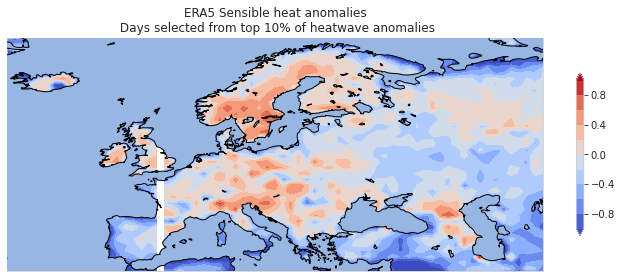

In [14]:
plt_anoms(df_2)

In [33]:
extent = [-25, 60, 35, 72]

def plt_anoms(data,cmap='coolwarm'):
    fig = plt.figure(figsize=(12, 6))
    ax = fig.add_subplot(1,1,1,projection=ccrs.PlateCarree())

    cmax    = 1.5
    cmin    = -1.5
    cint    = (cmax - cmin)/12.
    
    ax.set_extent(extent, crs=ccrs.PlateCarree())
    plt.contourf(data.lon, data.lat, data.std_anoms_lhflx, cmap = cmap, levels = np.arange(cmin,cmax+cint,cint), extend='both')
    plt.colorbar(shrink = 0.5)
    

    ax.add_feature(cfeature.OCEAN, zorder=100, edgecolor='k')
    ax.add_feature(cfeature.LAKES, edgecolor='black')
    plt.title('ERA5 Latent heat anomalies'
             '\n Days selected from top 10% of heatwave anomalies')
        
    plt.show()

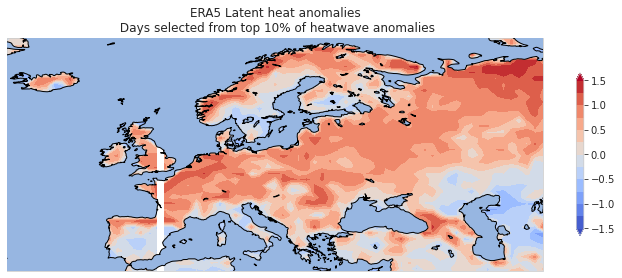

In [34]:
plt_anoms(df_2)

In [17]:
extent = [-130, -65, 20, 60.5]

def plt_anoms(data,cmap='coolwarm'):
    fig = plt.figure(figsize=(12, 6))
    ax = fig.add_subplot(1,1,1,projection=ccrs.PlateCarree())

    ax.set_extent(extent, crs=ccrs.PlateCarree())
    plt.contourf(data.lon, data.lat, data.std_anoms_lhflx, cmap = cmap, levels=10)
    plt.colorbar(shrink = 0.5)
    
    cmax    = 1.
    cmin    = -1.
    cint    = (cmax - cmin)/10.
    
    ax.set_extent(extent, crs=ccrs.PlateCarree())
    plt.contourf(data.lon, data.lat, data.std_anoms_shflx, cmap = cmap, levels = np.arange(cmin,cmax+cint,cint), extend='both')
    

    ax.add_feature(cfeature.OCEAN, zorder=100, edgecolor='k')
    ax.add_feature(cfeature.LAKES, edgecolor='black')
    plt.title('ERA5 Latent heat anomalies'
             '\n Days selected from top 10% of heatwave anomalies')
        
    plt.show()

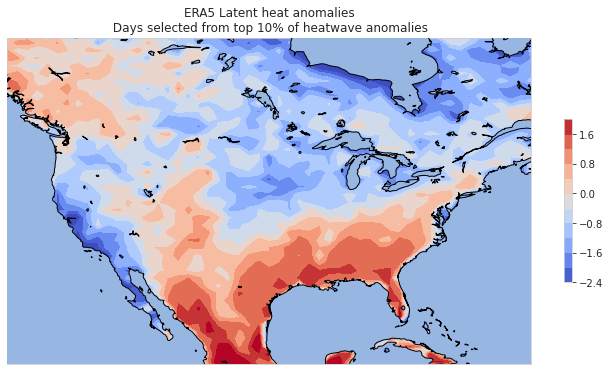

In [18]:
plt_anoms(df_2)

In [20]:
nh_lats = [lat for lat in t2m.lat.values if lat > 0]
all_lons = t2m.lon.values

lat=[]
lon=[]
std_anoms_lwrad = []
std_anoms_swrad = []
#std_anoms_sfmc = []
#std_anoms_t2m = []

for latitude in nh_lats:
    for longitude in all_lons:
        print(latitude, longitude)
        
        s_t2m = t2m.t2m.sel(lat=latitude,lon=longitude)
        s_lwrad = lwrad.STR.sel(lat=latitude,lon=longitude)
        s_swrad = swrad.SSR.sel(lat=latitude,lon=longitude)
        
       # subset_anoms_sfmc = std_anoms(subset['SFMC'])
        subset_anoms_lwrad = remove_annual_cycle(jja_std_anoms(s_lwrad)) # the anomalies, standardized by JJA sd
        subset_anoms_swrad = remove_annual_cycle(jja_std_anoms(s_swrad))
       
      #  subset_anoms_t2m = std_anoms(subset['T2MMEAN'])
        t = remove_annual_cycle(jja_std_anoms(s_t2m))   # anomalies, not standardized, just JJA
        t = t.sel({'time':t['time.season']=='JJA'})
        heatwave_days = t[t>=t.quantile(0.9)].time.values
        
        std_anoms_lwrad.append(subset_anoms_lwrad.sel(time=heatwave_days).mean().item())
        std_anoms_swrad.append(subset_anoms_swrad.sel(time=heatwave_days).mean().item())
       # std_anom_sfmc.append(subset_anoms_sfmc.sel(time=heatwave_days).mean().item())
       # std_anom_t2m.append(subset_anoms_t2m.sel(time=heatwave_days).mean().item())
        lat.append(latitude)
        lon.append(longitude)
        
df_2 = pd.DataFrame({'lat':lat,'lon':lon,'std_anoms_shflx':std_anoms_shflx,'std_anoms_lhflx':std_anoms_lhflx})
                   # 'std_anoms_sfmc':std_anoms_sfmc, 'std_anoms_t2m':std_anoms_t2m})

0.47120418848167844 0.0
0.47120418848167844 1.25
0.47120418848167844 2.5
0.47120418848167844 3.75
0.47120418848167844 5.0
0.47120418848167844 6.25
0.47120418848167844 7.5
0.47120418848167844 8.75
0.47120418848167844 10.0
0.47120418848167844 11.25
0.47120418848167844 12.5
0.47120418848167844 13.75
0.47120418848167844 15.0
0.47120418848167844 16.25
0.47120418848167844 17.5
0.47120418848167844 18.75
0.47120418848167844 20.0
0.47120418848167844 21.25
0.47120418848167844 22.5
0.47120418848167844 23.75
0.47120418848167844 25.0
0.47120418848167844 26.25
0.47120418848167844 27.5
0.47120418848167844 28.75
0.47120418848167844 30.0
0.47120418848167844 31.25
0.47120418848167844 32.5
0.47120418848167844 33.75
0.47120418848167844 35.0
0.47120418848167844 36.25
0.47120418848167844 37.5
0.47120418848167844 38.75
0.47120418848167844 40.0
0.47120418848167844 41.25
0.47120418848167844 42.5
0.47120418848167844 43.75
0.47120418848167844 45.0
0.47120418848167844 46.25
0.47120418848167844 47.5
0.471204188481

1.4136125654450211 33.75
1.4136125654450211 35.0
1.4136125654450211 36.25
1.4136125654450211 37.5
1.4136125654450211 38.75
1.4136125654450211 40.0
1.4136125654450211 41.25
1.4136125654450211 42.5
1.4136125654450211 43.75
1.4136125654450211 45.0
1.4136125654450211 46.25
1.4136125654450211 47.5
1.4136125654450211 48.75
1.4136125654450211 50.0
1.4136125654450211 51.25
1.4136125654450211 52.5
1.4136125654450211 53.75
1.4136125654450211 55.0
1.4136125654450211 56.25
1.4136125654450211 57.5
1.4136125654450211 58.75
1.4136125654450211 60.0
1.4136125654450211 61.25
1.4136125654450211 62.5
1.4136125654450211 63.75
1.4136125654450211 65.0
1.4136125654450211 66.25
1.4136125654450211 67.5
1.4136125654450211 68.75
1.4136125654450211 70.0
1.4136125654450211 71.25
1.4136125654450211 72.5
1.4136125654450211 73.75
1.4136125654450211 75.0
1.4136125654450211 76.25
1.4136125654450211 77.5
1.4136125654450211 78.75
1.4136125654450211 80.0
1.4136125654450211 81.25
1.4136125654450211 82.5
1.4136125654450211 8

2.356020942408378 85.0
2.356020942408378 86.25
2.356020942408378 87.5
2.356020942408378 88.75
2.356020942408378 90.0
2.356020942408378 91.25
2.356020942408378 92.5
2.356020942408378 93.75
2.356020942408378 95.0
2.356020942408378 96.25
2.356020942408378 97.5
2.356020942408378 98.75
2.356020942408378 100.0
2.356020942408378 101.25
2.356020942408378 102.5
2.356020942408378 103.75
2.356020942408378 105.0
2.356020942408378 106.25
2.356020942408378 107.5
2.356020942408378 108.75
2.356020942408378 110.0
2.356020942408378 111.25
2.356020942408378 112.5
2.356020942408378 113.75
2.356020942408378 115.0
2.356020942408378 116.25
2.356020942408378 117.5
2.356020942408378 118.75
2.356020942408378 120.0
2.356020942408378 121.25
2.356020942408378 122.5
2.356020942408378 123.75
2.356020942408378 125.0
2.356020942408378 126.25
2.356020942408378 127.5
2.356020942408378 128.75
2.356020942408378 130.0
2.356020942408378 131.25
2.356020942408378 132.5
2.356020942408378 133.75
2.356020942408378 135.0
2.356020

3.2984293193717207 142.5
3.2984293193717207 143.75
3.2984293193717207 145.0
3.2984293193717207 146.25
3.2984293193717207 147.5
3.2984293193717207 148.75
3.2984293193717207 150.0
3.2984293193717207 151.25
3.2984293193717207 152.5
3.2984293193717207 153.75
3.2984293193717207 155.0
3.2984293193717207 156.25
3.2984293193717207 157.5
3.2984293193717207 158.75
3.2984293193717207 160.0
3.2984293193717207 161.25
3.2984293193717207 162.5
3.2984293193717207 163.75
3.2984293193717207 165.0
3.2984293193717207 166.25
3.2984293193717207 167.5
3.2984293193717207 168.75
3.2984293193717207 170.0
3.2984293193717207 171.25
3.2984293193717207 172.5
3.2984293193717207 173.75
3.2984293193717207 175.0
3.2984293193717207 176.25
3.2984293193717207 177.5
3.2984293193717207 178.75
3.2984293193717207 180.0
3.2984293193717207 181.25
3.2984293193717207 182.5
3.2984293193717207 183.75
3.2984293193717207 185.0
3.2984293193717207 186.25
3.2984293193717207 187.5
3.2984293193717207 188.75
3.2984293193717207 190.0
3.2984

4.240837696335078 196.25
4.240837696335078 197.5
4.240837696335078 198.75
4.240837696335078 200.0
4.240837696335078 201.25
4.240837696335078 202.5
4.240837696335078 203.75
4.240837696335078 205.0
4.240837696335078 206.25
4.240837696335078 207.5
4.240837696335078 208.75
4.240837696335078 210.0
4.240837696335078 211.25
4.240837696335078 212.5
4.240837696335078 213.75
4.240837696335078 215.0
4.240837696335078 216.25
4.240837696335078 217.5
4.240837696335078 218.75
4.240837696335078 220.0
4.240837696335078 221.25
4.240837696335078 222.5
4.240837696335078 223.75
4.240837696335078 225.0
4.240837696335078 226.25
4.240837696335078 227.5
4.240837696335078 228.75
4.240837696335078 230.0
4.240837696335078 231.25
4.240837696335078 232.5
4.240837696335078 233.75
4.240837696335078 235.0
4.240837696335078 236.25
4.240837696335078 237.5
4.240837696335078 238.75
4.240837696335078 240.0
4.240837696335078 241.25
4.240837696335078 242.5
4.240837696335078 243.75
4.240837696335078 245.0
4.240837696335078 24

5.1832460732984345 248.75
5.1832460732984345 250.0
5.1832460732984345 251.25
5.1832460732984345 252.5
5.1832460732984345 253.75
5.1832460732984345 255.0
5.1832460732984345 256.25
5.1832460732984345 257.5
5.1832460732984345 258.75
5.1832460732984345 260.0
5.1832460732984345 261.25
5.1832460732984345 262.5
5.1832460732984345 263.75
5.1832460732984345 265.0
5.1832460732984345 266.25
5.1832460732984345 267.5
5.1832460732984345 268.75
5.1832460732984345 270.0
5.1832460732984345 271.25
5.1832460732984345 272.5
5.1832460732984345 273.75
5.1832460732984345 275.0
5.1832460732984345 276.25
5.1832460732984345 277.5
5.1832460732984345 278.75
5.1832460732984345 280.0
5.1832460732984345 281.25
5.1832460732984345 282.5
5.1832460732984345 283.75
5.1832460732984345 285.0
5.1832460732984345 286.25
5.1832460732984345 287.5
5.1832460732984345 288.75
5.1832460732984345 290.0
5.1832460732984345 291.25
5.1832460732984345 292.5
5.1832460732984345 293.75
5.1832460732984345 295.0
5.1832460732984345 296.25
5.183

6.125654450261777 307.5
6.125654450261777 308.75
6.125654450261777 310.0
6.125654450261777 311.25
6.125654450261777 312.5
6.125654450261777 313.75
6.125654450261777 315.0
6.125654450261777 316.25
6.125654450261777 317.5
6.125654450261777 318.75
6.125654450261777 320.0
6.125654450261777 321.25
6.125654450261777 322.5
6.125654450261777 323.75
6.125654450261777 325.0
6.125654450261777 326.25
6.125654450261777 327.5
6.125654450261777 328.75
6.125654450261777 330.0
6.125654450261777 331.25
6.125654450261777 332.5
6.125654450261777 333.75
6.125654450261777 335.0
6.125654450261777 336.25
6.125654450261777 337.5
6.125654450261777 338.75
6.125654450261777 340.0
6.125654450261777 341.25
6.125654450261777 342.5
6.125654450261777 343.75
6.125654450261777 345.0
6.125654450261777 346.25
6.125654450261777 347.5
6.125654450261777 348.75
6.125654450261777 350.0
6.125654450261777 351.25
6.125654450261777 352.5
6.125654450261777 353.75
6.125654450261777 355.0
6.125654450261777 356.25
6.125654450261777 35

8.010471204188477 11.25
8.010471204188477 12.5
8.010471204188477 13.75
8.010471204188477 15.0
8.010471204188477 16.25
8.010471204188477 17.5
8.010471204188477 18.75
8.010471204188477 20.0
8.010471204188477 21.25
8.010471204188477 22.5
8.010471204188477 23.75
8.010471204188477 25.0
8.010471204188477 26.25
8.010471204188477 27.5
8.010471204188477 28.75
8.010471204188477 30.0
8.010471204188477 31.25
8.010471204188477 32.5
8.010471204188477 33.75
8.010471204188477 35.0
8.010471204188477 36.25
8.010471204188477 37.5
8.010471204188477 38.75
8.010471204188477 40.0
8.010471204188477 41.25
8.010471204188477 42.5
8.010471204188477 43.75
8.010471204188477 45.0
8.010471204188477 46.25
8.010471204188477 47.5
8.010471204188477 48.75
8.010471204188477 50.0
8.010471204188477 51.25
8.010471204188477 52.5
8.010471204188477 53.75
8.010471204188477 55.0
8.010471204188477 56.25
8.010471204188477 57.5
8.010471204188477 58.75
8.010471204188477 60.0
8.010471204188477 61.25
8.010471204188477 62.5
8.01047120418

8.952879581151834 77.5
8.952879581151834 78.75
8.952879581151834 80.0
8.952879581151834 81.25
8.952879581151834 82.5
8.952879581151834 83.75
8.952879581151834 85.0
8.952879581151834 86.25
8.952879581151834 87.5
8.952879581151834 88.75
8.952879581151834 90.0
8.952879581151834 91.25
8.952879581151834 92.5
8.952879581151834 93.75
8.952879581151834 95.0
8.952879581151834 96.25
8.952879581151834 97.5
8.952879581151834 98.75
8.952879581151834 100.0
8.952879581151834 101.25
8.952879581151834 102.5
8.952879581151834 103.75
8.952879581151834 105.0
8.952879581151834 106.25
8.952879581151834 107.5
8.952879581151834 108.75
8.952879581151834 110.0
8.952879581151834 111.25
8.952879581151834 112.5
8.952879581151834 113.75
8.952879581151834 115.0
8.952879581151834 116.25
8.952879581151834 117.5
8.952879581151834 118.75
8.952879581151834 120.0
8.952879581151834 121.25
8.952879581151834 122.5
8.952879581151834 123.75
8.952879581151834 125.0
8.952879581151834 126.25
8.952879581151834 127.5
8.952879581151

9.895287958115176 141.25
9.895287958115176 142.5
9.895287958115176 143.75
9.895287958115176 145.0
9.895287958115176 146.25
9.895287958115176 147.5
9.895287958115176 148.75
9.895287958115176 150.0
9.895287958115176 151.25
9.895287958115176 152.5
9.895287958115176 153.75
9.895287958115176 155.0
9.895287958115176 156.25
9.895287958115176 157.5
9.895287958115176 158.75
9.895287958115176 160.0
9.895287958115176 161.25
9.895287958115176 162.5
9.895287958115176 163.75
9.895287958115176 165.0
9.895287958115176 166.25
9.895287958115176 167.5
9.895287958115176 168.75
9.895287958115176 170.0
9.895287958115176 171.25
9.895287958115176 172.5
9.895287958115176 173.75
9.895287958115176 175.0
9.895287958115176 176.25
9.895287958115176 177.5
9.895287958115176 178.75
9.895287958115176 180.0
9.895287958115176 181.25
9.895287958115176 182.5
9.895287958115176 183.75
9.895287958115176 185.0
9.895287958115176 186.25
9.895287958115176 187.5
9.895287958115176 188.75
9.895287958115176 190.0
9.895287958115176 19

10.837696335078533 196.25
10.837696335078533 197.5
10.837696335078533 198.75
10.837696335078533 200.0
10.837696335078533 201.25
10.837696335078533 202.5
10.837696335078533 203.75
10.837696335078533 205.0
10.837696335078533 206.25
10.837696335078533 207.5
10.837696335078533 208.75
10.837696335078533 210.0
10.837696335078533 211.25
10.837696335078533 212.5
10.837696335078533 213.75
10.837696335078533 215.0
10.837696335078533 216.25
10.837696335078533 217.5
10.837696335078533 218.75
10.837696335078533 220.0
10.837696335078533 221.25
10.837696335078533 222.5
10.837696335078533 223.75
10.837696335078533 225.0
10.837696335078533 226.25
10.837696335078533 227.5
10.837696335078533 228.75
10.837696335078533 230.0
10.837696335078533 231.25
10.837696335078533 232.5
10.837696335078533 233.75
10.837696335078533 235.0
10.837696335078533 236.25
10.837696335078533 237.5
10.837696335078533 238.75
10.837696335078533 240.0
10.837696335078533 241.25
10.837696335078533 242.5
10.837696335078533 243.75
10.83

11.78010471204189 252.5
11.78010471204189 253.75
11.78010471204189 255.0
11.78010471204189 256.25
11.78010471204189 257.5
11.78010471204189 258.75
11.78010471204189 260.0
11.78010471204189 261.25
11.78010471204189 262.5
11.78010471204189 263.75
11.78010471204189 265.0
11.78010471204189 266.25
11.78010471204189 267.5
11.78010471204189 268.75
11.78010471204189 270.0
11.78010471204189 271.25
11.78010471204189 272.5
11.78010471204189 273.75
11.78010471204189 275.0
11.78010471204189 276.25
11.78010471204189 277.5
11.78010471204189 278.75
11.78010471204189 280.0
11.78010471204189 281.25
11.78010471204189 282.5
11.78010471204189 283.75
11.78010471204189 285.0
11.78010471204189 286.25
11.78010471204189 287.5
11.78010471204189 288.75
11.78010471204189 290.0
11.78010471204189 291.25
11.78010471204189 292.5
11.78010471204189 293.75
11.78010471204189 295.0
11.78010471204189 296.25
11.78010471204189 297.5
11.78010471204189 298.75
11.78010471204189 300.0
11.78010471204189 301.25
11.78010471204189 30

12.722513089005233 303.75
12.722513089005233 305.0
12.722513089005233 306.25
12.722513089005233 307.5
12.722513089005233 308.75
12.722513089005233 310.0
12.722513089005233 311.25
12.722513089005233 312.5
12.722513089005233 313.75
12.722513089005233 315.0
12.722513089005233 316.25
12.722513089005233 317.5
12.722513089005233 318.75
12.722513089005233 320.0
12.722513089005233 321.25
12.722513089005233 322.5
12.722513089005233 323.75
12.722513089005233 325.0
12.722513089005233 326.25
12.722513089005233 327.5
12.722513089005233 328.75
12.722513089005233 330.0
12.722513089005233 331.25
12.722513089005233 332.5
12.722513089005233 333.75
12.722513089005233 335.0
12.722513089005233 336.25
12.722513089005233 337.5
12.722513089005233 338.75
12.722513089005233 340.0
12.722513089005233 341.25
12.722513089005233 342.5
12.722513089005233 343.75
12.722513089005233 345.0
12.722513089005233 346.25
12.722513089005233 347.5
12.722513089005233 348.75
12.722513089005233 350.0
12.722513089005233 351.25
12.72

14.607329842931932 5.0
14.607329842931932 6.25
14.607329842931932 7.5
14.607329842931932 8.75
14.607329842931932 10.0
14.607329842931932 11.25
14.607329842931932 12.5
14.607329842931932 13.75
14.607329842931932 15.0
14.607329842931932 16.25
14.607329842931932 17.5
14.607329842931932 18.75
14.607329842931932 20.0
14.607329842931932 21.25
14.607329842931932 22.5
14.607329842931932 23.75
14.607329842931932 25.0
14.607329842931932 26.25
14.607329842931932 27.5
14.607329842931932 28.75
14.607329842931932 30.0
14.607329842931932 31.25
14.607329842931932 32.5
14.607329842931932 33.75
14.607329842931932 35.0
14.607329842931932 36.25
14.607329842931932 37.5
14.607329842931932 38.75
14.607329842931932 40.0
14.607329842931932 41.25
14.607329842931932 42.5
14.607329842931932 43.75
14.607329842931932 45.0
14.607329842931932 46.25
14.607329842931932 47.5
14.607329842931932 48.75
14.607329842931932 50.0
14.607329842931932 51.25
14.607329842931932 52.5
14.607329842931932 53.75
14.607329842931932 55.0


15.54973821989529 56.25
15.54973821989529 57.5
15.54973821989529 58.75
15.54973821989529 60.0
15.54973821989529 61.25
15.54973821989529 62.5
15.54973821989529 63.75
15.54973821989529 65.0
15.54973821989529 66.25
15.54973821989529 67.5
15.54973821989529 68.75
15.54973821989529 70.0
15.54973821989529 71.25
15.54973821989529 72.5
15.54973821989529 73.75
15.54973821989529 75.0
15.54973821989529 76.25
15.54973821989529 77.5
15.54973821989529 78.75
15.54973821989529 80.0
15.54973821989529 81.25
15.54973821989529 82.5
15.54973821989529 83.75
15.54973821989529 85.0
15.54973821989529 86.25
15.54973821989529 87.5
15.54973821989529 88.75
15.54973821989529 90.0
15.54973821989529 91.25
15.54973821989529 92.5
15.54973821989529 93.75
15.54973821989529 95.0
15.54973821989529 96.25
15.54973821989529 97.5
15.54973821989529 98.75
15.54973821989529 100.0
15.54973821989529 101.25
15.54973821989529 102.5
15.54973821989529 103.75
15.54973821989529 105.0
15.54973821989529 106.25
15.54973821989529 107.5
15.549

16.492146596858632 116.25
16.492146596858632 117.5
16.492146596858632 118.75
16.492146596858632 120.0
16.492146596858632 121.25
16.492146596858632 122.5
16.492146596858632 123.75
16.492146596858632 125.0
16.492146596858632 126.25
16.492146596858632 127.5
16.492146596858632 128.75
16.492146596858632 130.0
16.492146596858632 131.25
16.492146596858632 132.5
16.492146596858632 133.75
16.492146596858632 135.0
16.492146596858632 136.25
16.492146596858632 137.5
16.492146596858632 138.75
16.492146596858632 140.0
16.492146596858632 141.25
16.492146596858632 142.5
16.492146596858632 143.75
16.492146596858632 145.0
16.492146596858632 146.25
16.492146596858632 147.5
16.492146596858632 148.75
16.492146596858632 150.0
16.492146596858632 151.25
16.492146596858632 152.5
16.492146596858632 153.75
16.492146596858632 155.0
16.492146596858632 156.25
16.492146596858632 157.5
16.492146596858632 158.75
16.492146596858632 160.0
16.492146596858632 161.25
16.492146596858632 162.5
16.492146596858632 163.75
16.49

17.43455497382199 170.0
17.43455497382199 171.25
17.43455497382199 172.5
17.43455497382199 173.75
17.43455497382199 175.0
17.43455497382199 176.25
17.43455497382199 177.5
17.43455497382199 178.75
17.43455497382199 180.0
17.43455497382199 181.25
17.43455497382199 182.5
17.43455497382199 183.75
17.43455497382199 185.0
17.43455497382199 186.25
17.43455497382199 187.5
17.43455497382199 188.75
17.43455497382199 190.0
17.43455497382199 191.25
17.43455497382199 192.5
17.43455497382199 193.75
17.43455497382199 195.0
17.43455497382199 196.25
17.43455497382199 197.5
17.43455497382199 198.75
17.43455497382199 200.0
17.43455497382199 201.25
17.43455497382199 202.5
17.43455497382199 203.75
17.43455497382199 205.0
17.43455497382199 206.25
17.43455497382199 207.5
17.43455497382199 208.75
17.43455497382199 210.0
17.43455497382199 211.25
17.43455497382199 212.5
17.43455497382199 213.75
17.43455497382199 215.0
17.43455497382199 216.25
17.43455497382199 217.5
17.43455497382199 218.75
17.43455497382199 22

18.376963350785346 223.75
18.376963350785346 225.0
18.376963350785346 226.25
18.376963350785346 227.5
18.376963350785346 228.75
18.376963350785346 230.0
18.376963350785346 231.25
18.376963350785346 232.5
18.376963350785346 233.75
18.376963350785346 235.0
18.376963350785346 236.25
18.376963350785346 237.5
18.376963350785346 238.75
18.376963350785346 240.0
18.376963350785346 241.25
18.376963350785346 242.5
18.376963350785346 243.75
18.376963350785346 245.0
18.376963350785346 246.25
18.376963350785346 247.5
18.376963350785346 248.75
18.376963350785346 250.0
18.376963350785346 251.25
18.376963350785346 252.5
18.376963350785346 253.75
18.376963350785346 255.0
18.376963350785346 256.25
18.376963350785346 257.5
18.376963350785346 258.75
18.376963350785346 260.0
18.376963350785346 261.25
18.376963350785346 262.5
18.376963350785346 263.75
18.376963350785346 265.0
18.376963350785346 266.25
18.376963350785346 267.5
18.376963350785346 268.75
18.376963350785346 270.0
18.376963350785346 271.25
18.37

19.31937172774869 281.25
19.31937172774869 282.5
19.31937172774869 283.75
19.31937172774869 285.0
19.31937172774869 286.25
19.31937172774869 287.5
19.31937172774869 288.75
19.31937172774869 290.0
19.31937172774869 291.25
19.31937172774869 292.5
19.31937172774869 293.75
19.31937172774869 295.0
19.31937172774869 296.25
19.31937172774869 297.5
19.31937172774869 298.75
19.31937172774869 300.0
19.31937172774869 301.25
19.31937172774869 302.5
19.31937172774869 303.75
19.31937172774869 305.0
19.31937172774869 306.25
19.31937172774869 307.5
19.31937172774869 308.75
19.31937172774869 310.0
19.31937172774869 311.25
19.31937172774869 312.5
19.31937172774869 313.75
19.31937172774869 315.0
19.31937172774869 316.25
19.31937172774869 317.5
19.31937172774869 318.75
19.31937172774869 320.0
19.31937172774869 321.25
19.31937172774869 322.5
19.31937172774869 323.75
19.31937172774869 325.0
19.31937172774869 326.25
19.31937172774869 327.5
19.31937172774869 328.75
19.31937172774869 330.0
19.31937172774869 33

20.261780104712045 331.25
20.261780104712045 332.5
20.261780104712045 333.75
20.261780104712045 335.0
20.261780104712045 336.25
20.261780104712045 337.5
20.261780104712045 338.75
20.261780104712045 340.0
20.261780104712045 341.25
20.261780104712045 342.5
20.261780104712045 343.75
20.261780104712045 345.0
20.261780104712045 346.25
20.261780104712045 347.5
20.261780104712045 348.75
20.261780104712045 350.0
20.261780104712045 351.25
20.261780104712045 352.5
20.261780104712045 353.75
20.261780104712045 355.0
20.261780104712045 356.25
20.261780104712045 357.5
20.261780104712045 358.75
21.204188481675388 0.0
21.204188481675388 1.25
21.204188481675388 2.5
21.204188481675388 3.75
21.204188481675388 5.0
21.204188481675388 6.25
21.204188481675388 7.5
21.204188481675388 8.75
21.204188481675388 10.0
21.204188481675388 11.25
21.204188481675388 12.5
21.204188481675388 13.75
21.204188481675388 15.0
21.204188481675388 16.25
21.204188481675388 17.5
21.204188481675388 18.75
21.204188481675388 20.0
21.20

22.146596858638745 18.75
22.146596858638745 20.0
22.146596858638745 21.25
22.146596858638745 22.5
22.146596858638745 23.75
22.146596858638745 25.0
22.146596858638745 26.25
22.146596858638745 27.5
22.146596858638745 28.75
22.146596858638745 30.0
22.146596858638745 31.25
22.146596858638745 32.5
22.146596858638745 33.75
22.146596858638745 35.0
22.146596858638745 36.25
22.146596858638745 37.5
22.146596858638745 38.75
22.146596858638745 40.0
22.146596858638745 41.25
22.146596858638745 42.5
22.146596858638745 43.75
22.146596858638745 45.0
22.146596858638745 46.25
22.146596858638745 47.5
22.146596858638745 48.75
22.146596858638745 50.0
22.146596858638745 51.25
22.146596858638745 52.5
22.146596858638745 53.75
22.146596858638745 55.0
22.146596858638745 56.25
22.146596858638745 57.5
22.146596858638745 58.75
22.146596858638745 60.0
22.146596858638745 61.25
22.146596858638745 62.5
22.146596858638745 63.75
22.146596858638745 65.0
22.146596858638745 66.25
22.146596858638745 67.5
22.146596858638745 6

23.089005235602087 67.5
23.089005235602087 68.75
23.089005235602087 70.0
23.089005235602087 71.25
23.089005235602087 72.5
23.089005235602087 73.75
23.089005235602087 75.0
23.089005235602087 76.25
23.089005235602087 77.5
23.089005235602087 78.75
23.089005235602087 80.0
23.089005235602087 81.25
23.089005235602087 82.5
23.089005235602087 83.75
23.089005235602087 85.0
23.089005235602087 86.25
23.089005235602087 87.5
23.089005235602087 88.75
23.089005235602087 90.0
23.089005235602087 91.25
23.089005235602087 92.5
23.089005235602087 93.75
23.089005235602087 95.0
23.089005235602087 96.25
23.089005235602087 97.5
23.089005235602087 98.75
23.089005235602087 100.0
23.089005235602087 101.25
23.089005235602087 102.5
23.089005235602087 103.75
23.089005235602087 105.0
23.089005235602087 106.25
23.089005235602087 107.5
23.089005235602087 108.75
23.089005235602087 110.0
23.089005235602087 111.25
23.089005235602087 112.5
23.089005235602087 113.75
23.089005235602087 115.0
23.089005235602087 116.25
23.089

24.031413612565444 115.0
24.031413612565444 116.25
24.031413612565444 117.5
24.031413612565444 118.75
24.031413612565444 120.0
24.031413612565444 121.25
24.031413612565444 122.5
24.031413612565444 123.75
24.031413612565444 125.0
24.031413612565444 126.25
24.031413612565444 127.5
24.031413612565444 128.75
24.031413612565444 130.0
24.031413612565444 131.25
24.031413612565444 132.5
24.031413612565444 133.75
24.031413612565444 135.0
24.031413612565444 136.25
24.031413612565444 137.5
24.031413612565444 138.75
24.031413612565444 140.0
24.031413612565444 141.25
24.031413612565444 142.5
24.031413612565444 143.75
24.031413612565444 145.0
24.031413612565444 146.25
24.031413612565444 147.5
24.031413612565444 148.75
24.031413612565444 150.0
24.031413612565444 151.25
24.031413612565444 152.5
24.031413612565444 153.75
24.031413612565444 155.0
24.031413612565444 156.25
24.031413612565444 157.5
24.031413612565444 158.75
24.031413612565444 160.0
24.031413612565444 161.25
24.031413612565444 162.5
24.031

24.9738219895288 175.0
24.9738219895288 176.25
24.9738219895288 177.5
24.9738219895288 178.75
24.9738219895288 180.0
24.9738219895288 181.25
24.9738219895288 182.5
24.9738219895288 183.75
24.9738219895288 185.0
24.9738219895288 186.25
24.9738219895288 187.5
24.9738219895288 188.75
24.9738219895288 190.0
24.9738219895288 191.25
24.9738219895288 192.5
24.9738219895288 193.75
24.9738219895288 195.0
24.9738219895288 196.25
24.9738219895288 197.5
24.9738219895288 198.75
24.9738219895288 200.0
24.9738219895288 201.25
24.9738219895288 202.5
24.9738219895288 203.75
24.9738219895288 205.0
24.9738219895288 206.25
24.9738219895288 207.5
24.9738219895288 208.75
24.9738219895288 210.0
24.9738219895288 211.25
24.9738219895288 212.5
24.9738219895288 213.75
24.9738219895288 215.0
24.9738219895288 216.25
24.9738219895288 217.5
24.9738219895288 218.75
24.9738219895288 220.0
24.9738219895288 221.25
24.9738219895288 222.5
24.9738219895288 223.75
24.9738219895288 225.0
24.9738219895288 226.25
24.9738219895

25.916230366492144 236.25
25.916230366492144 237.5
25.916230366492144 238.75
25.916230366492144 240.0
25.916230366492144 241.25
25.916230366492144 242.5
25.916230366492144 243.75
25.916230366492144 245.0
25.916230366492144 246.25
25.916230366492144 247.5
25.916230366492144 248.75
25.916230366492144 250.0
25.916230366492144 251.25
25.916230366492144 252.5
25.916230366492144 253.75
25.916230366492144 255.0
25.916230366492144 256.25
25.916230366492144 257.5
25.916230366492144 258.75
25.916230366492144 260.0
25.916230366492144 261.25
25.916230366492144 262.5
25.916230366492144 263.75
25.916230366492144 265.0
25.916230366492144 266.25
25.916230366492144 267.5
25.916230366492144 268.75
25.916230366492144 270.0
25.916230366492144 271.25
25.916230366492144 272.5
25.916230366492144 273.75
25.916230366492144 275.0
25.916230366492144 276.25
25.916230366492144 277.5
25.916230366492144 278.75
25.916230366492144 280.0
25.916230366492144 281.25
25.916230366492144 282.5
25.916230366492144 283.75
25.91

26.8586387434555 306.25
26.8586387434555 307.5
26.8586387434555 308.75
26.8586387434555 310.0
26.8586387434555 311.25
26.8586387434555 312.5
26.8586387434555 313.75
26.8586387434555 315.0
26.8586387434555 316.25
26.8586387434555 317.5
26.8586387434555 318.75
26.8586387434555 320.0
26.8586387434555 321.25
26.8586387434555 322.5
26.8586387434555 323.75
26.8586387434555 325.0
26.8586387434555 326.25
26.8586387434555 327.5
26.8586387434555 328.75
26.8586387434555 330.0
26.8586387434555 331.25
26.8586387434555 332.5
26.8586387434555 333.75
26.8586387434555 335.0
26.8586387434555 336.25
26.8586387434555 337.5
26.8586387434555 338.75
26.8586387434555 340.0
26.8586387434555 341.25
26.8586387434555 342.5
26.8586387434555 343.75
26.8586387434555 345.0
26.8586387434555 346.25
26.8586387434555 347.5
26.8586387434555 348.75
26.8586387434555 350.0
26.8586387434555 351.25
26.8586387434555 352.5
26.8586387434555 353.75
26.8586387434555 355.0
26.8586387434555 356.25
26.8586387434555 357.5
26.8586387434

27.801047120418843 357.5
27.801047120418843 358.75
28.7434554973822 0.0
28.7434554973822 1.25
28.7434554973822 2.5
28.7434554973822 3.75
28.7434554973822 5.0
28.7434554973822 6.25
28.7434554973822 7.5
28.7434554973822 8.75
28.7434554973822 10.0
28.7434554973822 11.25
28.7434554973822 12.5
28.7434554973822 13.75
28.7434554973822 15.0
28.7434554973822 16.25
28.7434554973822 17.5
28.7434554973822 18.75
28.7434554973822 20.0
28.7434554973822 21.25
28.7434554973822 22.5
28.7434554973822 23.75
28.7434554973822 25.0
28.7434554973822 26.25
28.7434554973822 27.5
28.7434554973822 28.75
28.7434554973822 30.0
28.7434554973822 31.25
28.7434554973822 32.5
28.7434554973822 33.75
28.7434554973822 35.0
28.7434554973822 36.25
28.7434554973822 37.5
28.7434554973822 38.75
28.7434554973822 40.0
28.7434554973822 41.25
28.7434554973822 42.5
28.7434554973822 43.75
28.7434554973822 45.0
28.7434554973822 46.25
28.7434554973822 47.5
28.7434554973822 48.75
28.7434554973822 50.0
28.7434554973822 51.25
28.743455497

29.685863874345543 75.0
29.685863874345543 76.25
29.685863874345543 77.5
29.685863874345543 78.75
29.685863874345543 80.0
29.685863874345543 81.25
29.685863874345543 82.5
29.685863874345543 83.75
29.685863874345543 85.0
29.685863874345543 86.25
29.685863874345543 87.5
29.685863874345543 88.75
29.685863874345543 90.0
29.685863874345543 91.25
29.685863874345543 92.5
29.685863874345543 93.75
29.685863874345543 95.0
29.685863874345543 96.25
29.685863874345543 97.5
29.685863874345543 98.75
29.685863874345543 100.0
29.685863874345543 101.25
29.685863874345543 102.5
29.685863874345543 103.75
29.685863874345543 105.0
29.685863874345543 106.25
29.685863874345543 107.5
29.685863874345543 108.75
29.685863874345543 110.0
29.685863874345543 111.25
29.685863874345543 112.5
29.685863874345543 113.75
29.685863874345543 115.0
29.685863874345543 116.25
29.685863874345543 117.5
29.685863874345543 118.75
29.685863874345543 120.0
29.685863874345543 121.25
29.685863874345543 122.5
29.685863874345543 123.75


30.6282722513089 132.5
30.6282722513089 133.75
30.6282722513089 135.0
30.6282722513089 136.25
30.6282722513089 137.5
30.6282722513089 138.75
30.6282722513089 140.0
30.6282722513089 141.25
30.6282722513089 142.5
30.6282722513089 143.75
30.6282722513089 145.0
30.6282722513089 146.25
30.6282722513089 147.5
30.6282722513089 148.75
30.6282722513089 150.0
30.6282722513089 151.25
30.6282722513089 152.5
30.6282722513089 153.75
30.6282722513089 155.0
30.6282722513089 156.25
30.6282722513089 157.5
30.6282722513089 158.75
30.6282722513089 160.0
30.6282722513089 161.25
30.6282722513089 162.5
30.6282722513089 163.75
30.6282722513089 165.0
30.6282722513089 166.25
30.6282722513089 167.5
30.6282722513089 168.75
30.6282722513089 170.0
30.6282722513089 171.25
30.6282722513089 172.5
30.6282722513089 173.75
30.6282722513089 175.0
30.6282722513089 176.25
30.6282722513089 177.5
30.6282722513089 178.75
30.6282722513089 180.0
30.6282722513089 181.25
30.6282722513089 182.5
30.6282722513089 183.75
30.6282722513

31.570680628272257 197.5
31.570680628272257 198.75
31.570680628272257 200.0
31.570680628272257 201.25
31.570680628272257 202.5
31.570680628272257 203.75
31.570680628272257 205.0
31.570680628272257 206.25
31.570680628272257 207.5
31.570680628272257 208.75
31.570680628272257 210.0
31.570680628272257 211.25
31.570680628272257 212.5
31.570680628272257 213.75
31.570680628272257 215.0
31.570680628272257 216.25
31.570680628272257 217.5
31.570680628272257 218.75
31.570680628272257 220.0
31.570680628272257 221.25
31.570680628272257 222.5
31.570680628272257 223.75
31.570680628272257 225.0
31.570680628272257 226.25
31.570680628272257 227.5
31.570680628272257 228.75
31.570680628272257 230.0
31.570680628272257 231.25
31.570680628272257 232.5
31.570680628272257 233.75
31.570680628272257 235.0
31.570680628272257 236.25
31.570680628272257 237.5
31.570680628272257 238.75
31.570680628272257 240.0
31.570680628272257 241.25
31.570680628272257 242.5
31.570680628272257 243.75
31.570680628272257 245.0
31.570

32.5130890052356 265.0
32.5130890052356 266.25
32.5130890052356 267.5
32.5130890052356 268.75
32.5130890052356 270.0
32.5130890052356 271.25
32.5130890052356 272.5
32.5130890052356 273.75
32.5130890052356 275.0
32.5130890052356 276.25
32.5130890052356 277.5
32.5130890052356 278.75
32.5130890052356 280.0
32.5130890052356 281.25
32.5130890052356 282.5
32.5130890052356 283.75
32.5130890052356 285.0
32.5130890052356 286.25
32.5130890052356 287.5
32.5130890052356 288.75
32.5130890052356 290.0
32.5130890052356 291.25
32.5130890052356 292.5
32.5130890052356 293.75
32.5130890052356 295.0
32.5130890052356 296.25
32.5130890052356 297.5
32.5130890052356 298.75
32.5130890052356 300.0
32.5130890052356 301.25
32.5130890052356 302.5
32.5130890052356 303.75
32.5130890052356 305.0
32.5130890052356 306.25
32.5130890052356 307.5
32.5130890052356 308.75
32.5130890052356 310.0
32.5130890052356 311.25
32.5130890052356 312.5
32.5130890052356 313.75
32.5130890052356 315.0
32.5130890052356 316.25
32.5130890052

33.455497382198956 318.75
33.455497382198956 320.0
33.455497382198956 321.25
33.455497382198956 322.5
33.455497382198956 323.75
33.455497382198956 325.0
33.455497382198956 326.25
33.455497382198956 327.5
33.455497382198956 328.75
33.455497382198956 330.0
33.455497382198956 331.25
33.455497382198956 332.5
33.455497382198956 333.75
33.455497382198956 335.0
33.455497382198956 336.25
33.455497382198956 337.5
33.455497382198956 338.75
33.455497382198956 340.0
33.455497382198956 341.25
33.455497382198956 342.5
33.455497382198956 343.75
33.455497382198956 345.0
33.455497382198956 346.25
33.455497382198956 347.5
33.455497382198956 348.75
33.455497382198956 350.0
33.455497382198956 351.25
33.455497382198956 352.5
33.455497382198956 353.75
33.455497382198956 355.0
33.455497382198956 356.25
33.455497382198956 357.5
33.455497382198956 358.75
34.3979057591623 0.0
34.3979057591623 1.25
34.3979057591623 2.5
34.3979057591623 3.75
34.3979057591623 5.0
34.3979057591623 6.25
34.3979057591623 7.5
34.39790

35.340314136125656 35.0
35.340314136125656 36.25
35.340314136125656 37.5
35.340314136125656 38.75
35.340314136125656 40.0
35.340314136125656 41.25
35.340314136125656 42.5
35.340314136125656 43.75
35.340314136125656 45.0
35.340314136125656 46.25
35.340314136125656 47.5
35.340314136125656 48.75
35.340314136125656 50.0
35.340314136125656 51.25
35.340314136125656 52.5
35.340314136125656 53.75
35.340314136125656 55.0
35.340314136125656 56.25
35.340314136125656 57.5
35.340314136125656 58.75
35.340314136125656 60.0
35.340314136125656 61.25
35.340314136125656 62.5
35.340314136125656 63.75
35.340314136125656 65.0
35.340314136125656 66.25
35.340314136125656 67.5
35.340314136125656 68.75
35.340314136125656 70.0
35.340314136125656 71.25
35.340314136125656 72.5
35.340314136125656 73.75
35.340314136125656 75.0
35.340314136125656 76.25
35.340314136125656 77.5
35.340314136125656 78.75
35.340314136125656 80.0
35.340314136125656 81.25
35.340314136125656 82.5
35.340314136125656 83.75
35.340314136125656 8

36.282722513089 95.0
36.282722513089 96.25
36.282722513089 97.5
36.282722513089 98.75
36.282722513089 100.0
36.282722513089 101.25
36.282722513089 102.5
36.282722513089 103.75
36.282722513089 105.0
36.282722513089 106.25
36.282722513089 107.5
36.282722513089 108.75
36.282722513089 110.0
36.282722513089 111.25
36.282722513089 112.5
36.282722513089 113.75
36.282722513089 115.0
36.282722513089 116.25
36.282722513089 117.5
36.282722513089 118.75
36.282722513089 120.0
36.282722513089 121.25
36.282722513089 122.5
36.282722513089 123.75
36.282722513089 125.0
36.282722513089 126.25
36.282722513089 127.5
36.282722513089 128.75
36.282722513089 130.0
36.282722513089 131.25
36.282722513089 132.5
36.282722513089 133.75
36.282722513089 135.0
36.282722513089 136.25
36.282722513089 137.5
36.282722513089 138.75
36.282722513089 140.0
36.282722513089 141.25
36.282722513089 142.5
36.282722513089 143.75
36.282722513089 145.0
36.282722513089 146.25
36.282722513089 147.5
36.282722513089 148.75
36.28272251308

37.225130890052355 172.5
37.225130890052355 173.75
37.225130890052355 175.0
37.225130890052355 176.25
37.225130890052355 177.5
37.225130890052355 178.75
37.225130890052355 180.0
37.225130890052355 181.25
37.225130890052355 182.5
37.225130890052355 183.75
37.225130890052355 185.0
37.225130890052355 186.25
37.225130890052355 187.5
37.225130890052355 188.75
37.225130890052355 190.0
37.225130890052355 191.25
37.225130890052355 192.5
37.225130890052355 193.75
37.225130890052355 195.0
37.225130890052355 196.25
37.225130890052355 197.5
37.225130890052355 198.75
37.225130890052355 200.0
37.225130890052355 201.25
37.225130890052355 202.5
37.225130890052355 203.75
37.225130890052355 205.0
37.225130890052355 206.25
37.225130890052355 207.5
37.225130890052355 208.75
37.225130890052355 210.0
37.225130890052355 211.25
37.225130890052355 212.5
37.225130890052355 213.75
37.225130890052355 215.0
37.225130890052355 216.25
37.225130890052355 217.5
37.225130890052355 218.75
37.225130890052355 220.0
37.225

38.16753926701571 227.5
38.16753926701571 228.75
38.16753926701571 230.0
38.16753926701571 231.25
38.16753926701571 232.5
38.16753926701571 233.75
38.16753926701571 235.0
38.16753926701571 236.25
38.16753926701571 237.5
38.16753926701571 238.75
38.16753926701571 240.0
38.16753926701571 241.25
38.16753926701571 242.5
38.16753926701571 243.75
38.16753926701571 245.0
38.16753926701571 246.25
38.16753926701571 247.5
38.16753926701571 248.75
38.16753926701571 250.0
38.16753926701571 251.25
38.16753926701571 252.5
38.16753926701571 253.75
38.16753926701571 255.0
38.16753926701571 256.25
38.16753926701571 257.5
38.16753926701571 258.75
38.16753926701571 260.0
38.16753926701571 261.25
38.16753926701571 262.5
38.16753926701571 263.75
38.16753926701571 265.0
38.16753926701571 266.25
38.16753926701571 267.5
38.16753926701571 268.75
38.16753926701571 270.0
38.16753926701571 271.25
38.16753926701571 272.5
38.16753926701571 273.75
38.16753926701571 275.0
38.16753926701571 276.25
38.16753926701571 27

39.10994764397907 290.0
39.10994764397907 291.25
39.10994764397907 292.5
39.10994764397907 293.75
39.10994764397907 295.0
39.10994764397907 296.25
39.10994764397907 297.5
39.10994764397907 298.75
39.10994764397907 300.0
39.10994764397907 301.25
39.10994764397907 302.5
39.10994764397907 303.75
39.10994764397907 305.0
39.10994764397907 306.25
39.10994764397907 307.5
39.10994764397907 308.75
39.10994764397907 310.0
39.10994764397907 311.25
39.10994764397907 312.5
39.10994764397907 313.75
39.10994764397907 315.0
39.10994764397907 316.25
39.10994764397907 317.5
39.10994764397907 318.75
39.10994764397907 320.0
39.10994764397907 321.25
39.10994764397907 322.5
39.10994764397907 323.75
39.10994764397907 325.0
39.10994764397907 326.25
39.10994764397907 327.5
39.10994764397907 328.75
39.10994764397907 330.0
39.10994764397907 331.25
39.10994764397907 332.5
39.10994764397907 333.75
39.10994764397907 335.0
39.10994764397907 336.25
39.10994764397907 337.5
39.10994764397907 338.75
39.10994764397907 34

40.994764397905755 7.5
40.994764397905755 8.75
40.994764397905755 10.0
40.994764397905755 11.25
40.994764397905755 12.5
40.994764397905755 13.75
40.994764397905755 15.0
40.994764397905755 16.25
40.994764397905755 17.5
40.994764397905755 18.75
40.994764397905755 20.0
40.994764397905755 21.25
40.994764397905755 22.5
40.994764397905755 23.75
40.994764397905755 25.0
40.994764397905755 26.25
40.994764397905755 27.5
40.994764397905755 28.75
40.994764397905755 30.0
40.994764397905755 31.25
40.994764397905755 32.5
40.994764397905755 33.75
40.994764397905755 35.0
40.994764397905755 36.25
40.994764397905755 37.5
40.994764397905755 38.75
40.994764397905755 40.0
40.994764397905755 41.25
40.994764397905755 42.5
40.994764397905755 43.75
40.994764397905755 45.0
40.994764397905755 46.25
40.994764397905755 47.5
40.994764397905755 48.75
40.994764397905755 50.0
40.994764397905755 51.25
40.994764397905755 52.5
40.994764397905755 53.75
40.994764397905755 55.0
40.994764397905755 56.25
40.994764397905755 57.

41.93717277486911 58.75
41.93717277486911 60.0
41.93717277486911 61.25
41.93717277486911 62.5
41.93717277486911 63.75
41.93717277486911 65.0
41.93717277486911 66.25
41.93717277486911 67.5
41.93717277486911 68.75
41.93717277486911 70.0
41.93717277486911 71.25
41.93717277486911 72.5
41.93717277486911 73.75
41.93717277486911 75.0
41.93717277486911 76.25
41.93717277486911 77.5
41.93717277486911 78.75
41.93717277486911 80.0
41.93717277486911 81.25
41.93717277486911 82.5
41.93717277486911 83.75
41.93717277486911 85.0
41.93717277486911 86.25
41.93717277486911 87.5
41.93717277486911 88.75
41.93717277486911 90.0
41.93717277486911 91.25
41.93717277486911 92.5
41.93717277486911 93.75
41.93717277486911 95.0
41.93717277486911 96.25
41.93717277486911 97.5
41.93717277486911 98.75
41.93717277486911 100.0
41.93717277486911 101.25
41.93717277486911 102.5
41.93717277486911 103.75
41.93717277486911 105.0
41.93717277486911 106.25
41.93717277486911 107.5
41.93717277486911 108.75
41.93717277486911 110.0
41.9

42.87958115183247 123.75
42.87958115183247 125.0
42.87958115183247 126.25
42.87958115183247 127.5
42.87958115183247 128.75
42.87958115183247 130.0
42.87958115183247 131.25
42.87958115183247 132.5
42.87958115183247 133.75
42.87958115183247 135.0
42.87958115183247 136.25
42.87958115183247 137.5
42.87958115183247 138.75
42.87958115183247 140.0
42.87958115183247 141.25
42.87958115183247 142.5
42.87958115183247 143.75
42.87958115183247 145.0
42.87958115183247 146.25
42.87958115183247 147.5
42.87958115183247 148.75
42.87958115183247 150.0
42.87958115183247 151.25
42.87958115183247 152.5
42.87958115183247 153.75
42.87958115183247 155.0
42.87958115183247 156.25
42.87958115183247 157.5
42.87958115183247 158.75
42.87958115183247 160.0
42.87958115183247 161.25
42.87958115183247 162.5
42.87958115183247 163.75
42.87958115183247 165.0
42.87958115183247 166.25
42.87958115183247 167.5
42.87958115183247 168.75
42.87958115183247 170.0
42.87958115183247 171.25
42.87958115183247 172.5
42.87958115183247 17

43.8219895287958 195.0
43.8219895287958 196.25
43.8219895287958 197.5
43.8219895287958 198.75
43.8219895287958 200.0
43.8219895287958 201.25
43.8219895287958 202.5
43.8219895287958 203.75
43.8219895287958 205.0
43.8219895287958 206.25
43.8219895287958 207.5
43.8219895287958 208.75
43.8219895287958 210.0
43.8219895287958 211.25
43.8219895287958 212.5
43.8219895287958 213.75
43.8219895287958 215.0
43.8219895287958 216.25
43.8219895287958 217.5
43.8219895287958 218.75
43.8219895287958 220.0
43.8219895287958 221.25
43.8219895287958 222.5
43.8219895287958 223.75
43.8219895287958 225.0
43.8219895287958 226.25
43.8219895287958 227.5
43.8219895287958 228.75
43.8219895287958 230.0
43.8219895287958 231.25
43.8219895287958 232.5
43.8219895287958 233.75
43.8219895287958 235.0
43.8219895287958 236.25
43.8219895287958 237.5
43.8219895287958 238.75
43.8219895287958 240.0
43.8219895287958 241.25
43.8219895287958 242.5
43.8219895287958 243.75
43.8219895287958 245.0
43.8219895287958 246.25
43.8219895287

44.764397905759154 255.0
44.764397905759154 256.25
44.764397905759154 257.5
44.764397905759154 258.75
44.764397905759154 260.0
44.764397905759154 261.25
44.764397905759154 262.5
44.764397905759154 263.75
44.764397905759154 265.0
44.764397905759154 266.25
44.764397905759154 267.5
44.764397905759154 268.75
44.764397905759154 270.0
44.764397905759154 271.25
44.764397905759154 272.5
44.764397905759154 273.75
44.764397905759154 275.0
44.764397905759154 276.25
44.764397905759154 277.5
44.764397905759154 278.75
44.764397905759154 280.0
44.764397905759154 281.25
44.764397905759154 282.5
44.764397905759154 283.75
44.764397905759154 285.0
44.764397905759154 286.25
44.764397905759154 287.5
44.764397905759154 288.75
44.764397905759154 290.0
44.764397905759154 291.25
44.764397905759154 292.5
44.764397905759154 293.75
44.764397905759154 295.0
44.764397905759154 296.25
44.764397905759154 297.5
44.764397905759154 298.75
44.764397905759154 300.0
44.764397905759154 301.25
44.764397905759154 302.5
44.764

45.70680628272251 313.75
45.70680628272251 315.0
45.70680628272251 316.25
45.70680628272251 317.5
45.70680628272251 318.75
45.70680628272251 320.0
45.70680628272251 321.25
45.70680628272251 322.5
45.70680628272251 323.75
45.70680628272251 325.0
45.70680628272251 326.25
45.70680628272251 327.5
45.70680628272251 328.75
45.70680628272251 330.0
45.70680628272251 331.25
45.70680628272251 332.5
45.70680628272251 333.75
45.70680628272251 335.0
45.70680628272251 336.25
45.70680628272251 337.5
45.70680628272251 338.75
45.70680628272251 340.0
45.70680628272251 341.25
45.70680628272251 342.5
45.70680628272251 343.75
45.70680628272251 345.0
45.70680628272251 346.25
45.70680628272251 347.5
45.70680628272251 348.75
45.70680628272251 350.0
45.70680628272251 351.25
45.70680628272251 352.5
45.70680628272251 353.75
45.70680628272251 355.0
45.70680628272251 356.25
45.70680628272251 357.5
45.70680628272251 358.75
46.64921465968587 0.0
46.64921465968587 1.25
46.64921465968587 2.5
46.64921465968587 3.75
46.

47.591623036649224 17.5
47.591623036649224 18.75
47.591623036649224 20.0
47.591623036649224 21.25
47.591623036649224 22.5
47.591623036649224 23.75
47.591623036649224 25.0
47.591623036649224 26.25
47.591623036649224 27.5
47.591623036649224 28.75
47.591623036649224 30.0
47.591623036649224 31.25
47.591623036649224 32.5
47.591623036649224 33.75
47.591623036649224 35.0
47.591623036649224 36.25
47.591623036649224 37.5
47.591623036649224 38.75
47.591623036649224 40.0
47.591623036649224 41.25
47.591623036649224 42.5
47.591623036649224 43.75
47.591623036649224 45.0
47.591623036649224 46.25
47.591623036649224 47.5
47.591623036649224 48.75
47.591623036649224 50.0
47.591623036649224 51.25
47.591623036649224 52.5
47.591623036649224 53.75
47.591623036649224 55.0
47.591623036649224 56.25
47.591623036649224 57.5
47.591623036649224 58.75
47.591623036649224 60.0
47.591623036649224 61.25
47.591623036649224 62.5
47.591623036649224 63.75
47.591623036649224 65.0
47.591623036649224 66.25
47.591623036649224 6

48.53403141361255 68.75
48.53403141361255 70.0
48.53403141361255 71.25
48.53403141361255 72.5
48.53403141361255 73.75
48.53403141361255 75.0
48.53403141361255 76.25
48.53403141361255 77.5
48.53403141361255 78.75
48.53403141361255 80.0
48.53403141361255 81.25
48.53403141361255 82.5
48.53403141361255 83.75
48.53403141361255 85.0
48.53403141361255 86.25
48.53403141361255 87.5
48.53403141361255 88.75
48.53403141361255 90.0
48.53403141361255 91.25
48.53403141361255 92.5
48.53403141361255 93.75
48.53403141361255 95.0
48.53403141361255 96.25
48.53403141361255 97.5
48.53403141361255 98.75
48.53403141361255 100.0
48.53403141361255 101.25
48.53403141361255 102.5
48.53403141361255 103.75
48.53403141361255 105.0
48.53403141361255 106.25
48.53403141361255 107.5
48.53403141361255 108.75
48.53403141361255 110.0
48.53403141361255 111.25
48.53403141361255 112.5
48.53403141361255 113.75
48.53403141361255 115.0
48.53403141361255 116.25
48.53403141361255 117.5
48.53403141361255 118.75
48.53403141361255 12

49.47643979057591 132.5
49.47643979057591 133.75
49.47643979057591 135.0
49.47643979057591 136.25
49.47643979057591 137.5
49.47643979057591 138.75
49.47643979057591 140.0
49.47643979057591 141.25
49.47643979057591 142.5
49.47643979057591 143.75
49.47643979057591 145.0
49.47643979057591 146.25
49.47643979057591 147.5
49.47643979057591 148.75
49.47643979057591 150.0
49.47643979057591 151.25
49.47643979057591 152.5
49.47643979057591 153.75
49.47643979057591 155.0
49.47643979057591 156.25
49.47643979057591 157.5
49.47643979057591 158.75
49.47643979057591 160.0
49.47643979057591 161.25
49.47643979057591 162.5
49.47643979057591 163.75
49.47643979057591 165.0
49.47643979057591 166.25
49.47643979057591 167.5
49.47643979057591 168.75
49.47643979057591 170.0
49.47643979057591 171.25
49.47643979057591 172.5
49.47643979057591 173.75
49.47643979057591 175.0
49.47643979057591 176.25
49.47643979057591 177.5
49.47643979057591 178.75
49.47643979057591 180.0
49.47643979057591 181.25
49.47643979057591 18

50.41884816753927 195.0
50.41884816753927 196.25
50.41884816753927 197.5
50.41884816753927 198.75
50.41884816753927 200.0
50.41884816753927 201.25
50.41884816753927 202.5
50.41884816753927 203.75
50.41884816753927 205.0
50.41884816753927 206.25
50.41884816753927 207.5
50.41884816753927 208.75
50.41884816753927 210.0
50.41884816753927 211.25
50.41884816753927 212.5
50.41884816753927 213.75
50.41884816753927 215.0
50.41884816753927 216.25
50.41884816753927 217.5
50.41884816753927 218.75
50.41884816753927 220.0
50.41884816753927 221.25
50.41884816753927 222.5
50.41884816753927 223.75
50.41884816753927 225.0
50.41884816753927 226.25
50.41884816753927 227.5
50.41884816753927 228.75
50.41884816753927 230.0
50.41884816753927 231.25
50.41884816753927 232.5
50.41884816753927 233.75
50.41884816753927 235.0
50.41884816753927 236.25
50.41884816753927 237.5
50.41884816753927 238.75
50.41884816753927 240.0
50.41884816753927 241.25
50.41884816753927 242.5
50.41884816753927 243.75
50.41884816753927 24

51.36125654450262 257.5
51.36125654450262 258.75
51.36125654450262 260.0
51.36125654450262 261.25
51.36125654450262 262.5
51.36125654450262 263.75
51.36125654450262 265.0
51.36125654450262 266.25
51.36125654450262 267.5
51.36125654450262 268.75
51.36125654450262 270.0
51.36125654450262 271.25
51.36125654450262 272.5
51.36125654450262 273.75
51.36125654450262 275.0
51.36125654450262 276.25
51.36125654450262 277.5
51.36125654450262 278.75
51.36125654450262 280.0
51.36125654450262 281.25
51.36125654450262 282.5
51.36125654450262 283.75
51.36125654450262 285.0
51.36125654450262 286.25
51.36125654450262 287.5
51.36125654450262 288.75
51.36125654450262 290.0
51.36125654450262 291.25
51.36125654450262 292.5
51.36125654450262 293.75
51.36125654450262 295.0
51.36125654450262 296.25
51.36125654450262 297.5
51.36125654450262 298.75
51.36125654450262 300.0
51.36125654450262 301.25
51.36125654450262 302.5
51.36125654450262 303.75
51.36125654450262 305.0
51.36125654450262 306.25
51.36125654450262 30

52.30366492146598 320.0
52.30366492146598 321.25
52.30366492146598 322.5
52.30366492146598 323.75
52.30366492146598 325.0
52.30366492146598 326.25
52.30366492146598 327.5
52.30366492146598 328.75
52.30366492146598 330.0
52.30366492146598 331.25
52.30366492146598 332.5
52.30366492146598 333.75
52.30366492146598 335.0
52.30366492146598 336.25
52.30366492146598 337.5
52.30366492146598 338.75
52.30366492146598 340.0
52.30366492146598 341.25
52.30366492146598 342.5
52.30366492146598 343.75
52.30366492146598 345.0
52.30366492146598 346.25
52.30366492146598 347.5
52.30366492146598 348.75
52.30366492146598 350.0
52.30366492146598 351.25
52.30366492146598 352.5
52.30366492146598 353.75
52.30366492146598 355.0
52.30366492146598 356.25
52.30366492146598 357.5
52.30366492146598 358.75
53.24607329842931 0.0
53.24607329842931 1.25
53.24607329842931 2.5
53.24607329842931 3.75
53.24607329842931 5.0
53.24607329842931 6.25
53.24607329842931 7.5
53.24607329842931 8.75
53.24607329842931 10.0
53.2460732984

54.188481675392666 23.75
54.188481675392666 25.0
54.188481675392666 26.25
54.188481675392666 27.5
54.188481675392666 28.75
54.188481675392666 30.0
54.188481675392666 31.25
54.188481675392666 32.5
54.188481675392666 33.75
54.188481675392666 35.0
54.188481675392666 36.25
54.188481675392666 37.5
54.188481675392666 38.75
54.188481675392666 40.0
54.188481675392666 41.25
54.188481675392666 42.5
54.188481675392666 43.75
54.188481675392666 45.0
54.188481675392666 46.25
54.188481675392666 47.5
54.188481675392666 48.75
54.188481675392666 50.0
54.188481675392666 51.25
54.188481675392666 52.5
54.188481675392666 53.75
54.188481675392666 55.0
54.188481675392666 56.25
54.188481675392666 57.5
54.188481675392666 58.75
54.188481675392666 60.0
54.188481675392666 61.25
54.188481675392666 62.5
54.188481675392666 63.75
54.188481675392666 65.0
54.188481675392666 66.25
54.188481675392666 67.5
54.188481675392666 68.75
54.188481675392666 70.0
54.188481675392666 71.25
54.188481675392666 72.5
54.188481675392666 7

55.13089005235602 75.0
55.13089005235602 76.25
55.13089005235602 77.5
55.13089005235602 78.75
55.13089005235602 80.0
55.13089005235602 81.25
55.13089005235602 82.5
55.13089005235602 83.75
55.13089005235602 85.0
55.13089005235602 86.25
55.13089005235602 87.5
55.13089005235602 88.75
55.13089005235602 90.0
55.13089005235602 91.25
55.13089005235602 92.5
55.13089005235602 93.75
55.13089005235602 95.0
55.13089005235602 96.25
55.13089005235602 97.5
55.13089005235602 98.75
55.13089005235602 100.0
55.13089005235602 101.25
55.13089005235602 102.5
55.13089005235602 103.75
55.13089005235602 105.0
55.13089005235602 106.25
55.13089005235602 107.5
55.13089005235602 108.75
55.13089005235602 110.0
55.13089005235602 111.25
55.13089005235602 112.5
55.13089005235602 113.75
55.13089005235602 115.0
55.13089005235602 116.25
55.13089005235602 117.5
55.13089005235602 118.75
55.13089005235602 120.0
55.13089005235602 121.25
55.13089005235602 122.5
55.13089005235602 123.75
55.13089005235602 125.0
55.1308900523560

56.07329842931938 138.75
56.07329842931938 140.0
56.07329842931938 141.25
56.07329842931938 142.5
56.07329842931938 143.75
56.07329842931938 145.0
56.07329842931938 146.25
56.07329842931938 147.5
56.07329842931938 148.75
56.07329842931938 150.0
56.07329842931938 151.25
56.07329842931938 152.5
56.07329842931938 153.75
56.07329842931938 155.0
56.07329842931938 156.25
56.07329842931938 157.5
56.07329842931938 158.75
56.07329842931938 160.0
56.07329842931938 161.25
56.07329842931938 162.5
56.07329842931938 163.75
56.07329842931938 165.0
56.07329842931938 166.25
56.07329842931938 167.5
56.07329842931938 168.75
56.07329842931938 170.0
56.07329842931938 171.25
56.07329842931938 172.5
56.07329842931938 173.75
56.07329842931938 175.0
56.07329842931938 176.25
56.07329842931938 177.5
56.07329842931938 178.75
56.07329842931938 180.0
56.07329842931938 181.25
56.07329842931938 182.5
56.07329842931938 183.75
56.07329842931938 185.0
56.07329842931938 186.25
56.07329842931938 187.5
56.07329842931938 18

57.01570680628271 201.25
57.01570680628271 202.5
57.01570680628271 203.75
57.01570680628271 205.0
57.01570680628271 206.25
57.01570680628271 207.5
57.01570680628271 208.75
57.01570680628271 210.0
57.01570680628271 211.25
57.01570680628271 212.5
57.01570680628271 213.75
57.01570680628271 215.0
57.01570680628271 216.25
57.01570680628271 217.5
57.01570680628271 218.75
57.01570680628271 220.0
57.01570680628271 221.25
57.01570680628271 222.5
57.01570680628271 223.75
57.01570680628271 225.0
57.01570680628271 226.25
57.01570680628271 227.5
57.01570680628271 228.75
57.01570680628271 230.0
57.01570680628271 231.25
57.01570680628271 232.5
57.01570680628271 233.75
57.01570680628271 235.0
57.01570680628271 236.25
57.01570680628271 237.5
57.01570680628271 238.75
57.01570680628271 240.0
57.01570680628271 241.25
57.01570680628271 242.5
57.01570680628271 243.75
57.01570680628271 245.0
57.01570680628271 246.25
57.01570680628271 247.5
57.01570680628271 248.75
57.01570680628271 250.0
57.01570680628271 25

57.958115183246065 253.75
57.958115183246065 255.0
57.958115183246065 256.25
57.958115183246065 257.5
57.958115183246065 258.75
57.958115183246065 260.0
57.958115183246065 261.25
57.958115183246065 262.5
57.958115183246065 263.75
57.958115183246065 265.0
57.958115183246065 266.25
57.958115183246065 267.5
57.958115183246065 268.75
57.958115183246065 270.0
57.958115183246065 271.25
57.958115183246065 272.5
57.958115183246065 273.75
57.958115183246065 275.0
57.958115183246065 276.25
57.958115183246065 277.5
57.958115183246065 278.75
57.958115183246065 280.0
57.958115183246065 281.25
57.958115183246065 282.5
57.958115183246065 283.75
57.958115183246065 285.0
57.958115183246065 286.25
57.958115183246065 287.5
57.958115183246065 288.75
57.958115183246065 290.0
57.958115183246065 291.25
57.958115183246065 292.5
57.958115183246065 293.75
57.958115183246065 295.0
57.958115183246065 296.25
57.958115183246065 297.5
57.958115183246065 298.75
57.958115183246065 300.0
57.958115183246065 301.25
57.95

58.90052356020942 312.5
58.90052356020942 313.75
58.90052356020942 315.0
58.90052356020942 316.25
58.90052356020942 317.5
58.90052356020942 318.75
58.90052356020942 320.0
58.90052356020942 321.25
58.90052356020942 322.5
58.90052356020942 323.75
58.90052356020942 325.0
58.90052356020942 326.25
58.90052356020942 327.5
58.90052356020942 328.75
58.90052356020942 330.0
58.90052356020942 331.25
58.90052356020942 332.5
58.90052356020942 333.75
58.90052356020942 335.0
58.90052356020942 336.25
58.90052356020942 337.5
58.90052356020942 338.75
58.90052356020942 340.0
58.90052356020942 341.25
58.90052356020942 342.5
58.90052356020942 343.75
58.90052356020942 345.0
58.90052356020942 346.25
58.90052356020942 347.5
58.90052356020942 348.75
58.90052356020942 350.0
58.90052356020942 351.25
58.90052356020942 352.5
58.90052356020942 353.75
58.90052356020942 355.0
58.90052356020942 356.25
58.90052356020942 357.5
58.90052356020942 358.75
59.84293193717278 0.0
59.84293193717278 1.25
59.84293193717278 2.5
59

60.785340314136135 16.25
60.785340314136135 17.5
60.785340314136135 18.75
60.785340314136135 20.0
60.785340314136135 21.25
60.785340314136135 22.5
60.785340314136135 23.75
60.785340314136135 25.0
60.785340314136135 26.25
60.785340314136135 27.5
60.785340314136135 28.75
60.785340314136135 30.0
60.785340314136135 31.25
60.785340314136135 32.5
60.785340314136135 33.75
60.785340314136135 35.0
60.785340314136135 36.25
60.785340314136135 37.5
60.785340314136135 38.75
60.785340314136135 40.0
60.785340314136135 41.25
60.785340314136135 42.5
60.785340314136135 43.75
60.785340314136135 45.0
60.785340314136135 46.25
60.785340314136135 47.5
60.785340314136135 48.75
60.785340314136135 50.0
60.785340314136135 51.25
60.785340314136135 52.5
60.785340314136135 53.75
60.785340314136135 55.0
60.785340314136135 56.25
60.785340314136135 57.5
60.785340314136135 58.75
60.785340314136135 60.0
60.785340314136135 61.25
60.785340314136135 62.5
60.785340314136135 63.75
60.785340314136135 65.0
60.785340314136135 6

61.727748691099464 65.0
61.727748691099464 66.25
61.727748691099464 67.5
61.727748691099464 68.75
61.727748691099464 70.0
61.727748691099464 71.25
61.727748691099464 72.5
61.727748691099464 73.75
61.727748691099464 75.0
61.727748691099464 76.25
61.727748691099464 77.5
61.727748691099464 78.75
61.727748691099464 80.0
61.727748691099464 81.25
61.727748691099464 82.5
61.727748691099464 83.75
61.727748691099464 85.0
61.727748691099464 86.25
61.727748691099464 87.5
61.727748691099464 88.75
61.727748691099464 90.0
61.727748691099464 91.25
61.727748691099464 92.5
61.727748691099464 93.75
61.727748691099464 95.0
61.727748691099464 96.25
61.727748691099464 97.5
61.727748691099464 98.75
61.727748691099464 100.0
61.727748691099464 101.25
61.727748691099464 102.5
61.727748691099464 103.75
61.727748691099464 105.0
61.727748691099464 106.25
61.727748691099464 107.5
61.727748691099464 108.75
61.727748691099464 110.0
61.727748691099464 111.25
61.727748691099464 112.5
61.727748691099464 113.75
61.72774

62.67015706806282 117.5
62.67015706806282 118.75
62.67015706806282 120.0
62.67015706806282 121.25
62.67015706806282 122.5
62.67015706806282 123.75
62.67015706806282 125.0
62.67015706806282 126.25
62.67015706806282 127.5
62.67015706806282 128.75
62.67015706806282 130.0
62.67015706806282 131.25
62.67015706806282 132.5
62.67015706806282 133.75
62.67015706806282 135.0
62.67015706806282 136.25
62.67015706806282 137.5
62.67015706806282 138.75
62.67015706806282 140.0
62.67015706806282 141.25
62.67015706806282 142.5
62.67015706806282 143.75
62.67015706806282 145.0
62.67015706806282 146.25
62.67015706806282 147.5
62.67015706806282 148.75
62.67015706806282 150.0
62.67015706806282 151.25
62.67015706806282 152.5
62.67015706806282 153.75
62.67015706806282 155.0
62.67015706806282 156.25
62.67015706806282 157.5
62.67015706806282 158.75
62.67015706806282 160.0
62.67015706806282 161.25
62.67015706806282 162.5
62.67015706806282 163.75
62.67015706806282 165.0
62.67015706806282 166.25
62.67015706806282 16

63.61256544502618 180.0
63.61256544502618 181.25
63.61256544502618 182.5
63.61256544502618 183.75
63.61256544502618 185.0
63.61256544502618 186.25
63.61256544502618 187.5
63.61256544502618 188.75
63.61256544502618 190.0
63.61256544502618 191.25
63.61256544502618 192.5
63.61256544502618 193.75
63.61256544502618 195.0
63.61256544502618 196.25
63.61256544502618 197.5
63.61256544502618 198.75
63.61256544502618 200.0
63.61256544502618 201.25
63.61256544502618 202.5
63.61256544502618 203.75
63.61256544502618 205.0
63.61256544502618 206.25
63.61256544502618 207.5
63.61256544502618 208.75
63.61256544502618 210.0
63.61256544502618 211.25
63.61256544502618 212.5
63.61256544502618 213.75
63.61256544502618 215.0
63.61256544502618 216.25
63.61256544502618 217.5
63.61256544502618 218.75
63.61256544502618 220.0
63.61256544502618 221.25
63.61256544502618 222.5
63.61256544502618 223.75
63.61256544502618 225.0
63.61256544502618 226.25
63.61256544502618 227.5
63.61256544502618 228.75
63.61256544502618 23

64.55497382198953 242.5
64.55497382198953 243.75
64.55497382198953 245.0
64.55497382198953 246.25
64.55497382198953 247.5
64.55497382198953 248.75
64.55497382198953 250.0
64.55497382198953 251.25
64.55497382198953 252.5
64.55497382198953 253.75
64.55497382198953 255.0
64.55497382198953 256.25
64.55497382198953 257.5
64.55497382198953 258.75
64.55497382198953 260.0
64.55497382198953 261.25
64.55497382198953 262.5
64.55497382198953 263.75
64.55497382198953 265.0
64.55497382198953 266.25
64.55497382198953 267.5
64.55497382198953 268.75
64.55497382198953 270.0
64.55497382198953 271.25
64.55497382198953 272.5
64.55497382198953 273.75
64.55497382198953 275.0
64.55497382198953 276.25
64.55497382198953 277.5
64.55497382198953 278.75
64.55497382198953 280.0
64.55497382198953 281.25
64.55497382198953 282.5
64.55497382198953 283.75
64.55497382198953 285.0
64.55497382198953 286.25
64.55497382198953 287.5
64.55497382198953 288.75
64.55497382198953 290.0
64.55497382198953 291.25
64.55497382198953 29

65.49738219895289 305.0
65.49738219895289 306.25
65.49738219895289 307.5
65.49738219895289 308.75
65.49738219895289 310.0
65.49738219895289 311.25
65.49738219895289 312.5
65.49738219895289 313.75
65.49738219895289 315.0
65.49738219895289 316.25
65.49738219895289 317.5
65.49738219895289 318.75
65.49738219895289 320.0
65.49738219895289 321.25
65.49738219895289 322.5
65.49738219895289 323.75
65.49738219895289 325.0
65.49738219895289 326.25
65.49738219895289 327.5
65.49738219895289 328.75
65.49738219895289 330.0
65.49738219895289 331.25
65.49738219895289 332.5
65.49738219895289 333.75
65.49738219895289 335.0
65.49738219895289 336.25
65.49738219895289 337.5
65.49738219895289 338.75
65.49738219895289 340.0
65.49738219895289 341.25
65.49738219895289 342.5
65.49738219895289 343.75
65.49738219895289 345.0
65.49738219895289 346.25
65.49738219895289 347.5
65.49738219895289 348.75
65.49738219895289 350.0
65.49738219895289 351.25
65.49738219895289 352.5
65.49738219895289 353.75
65.49738219895289 35

67.38219895287958 8.75
67.38219895287958 10.0
67.38219895287958 11.25
67.38219895287958 12.5
67.38219895287958 13.75
67.38219895287958 15.0
67.38219895287958 16.25
67.38219895287958 17.5
67.38219895287958 18.75
67.38219895287958 20.0
67.38219895287958 21.25
67.38219895287958 22.5
67.38219895287958 23.75
67.38219895287958 25.0
67.38219895287958 26.25
67.38219895287958 27.5
67.38219895287958 28.75
67.38219895287958 30.0
67.38219895287958 31.25
67.38219895287958 32.5
67.38219895287958 33.75
67.38219895287958 35.0
67.38219895287958 36.25
67.38219895287958 37.5
67.38219895287958 38.75
67.38219895287958 40.0
67.38219895287958 41.25
67.38219895287958 42.5
67.38219895287958 43.75
67.38219895287958 45.0
67.38219895287958 46.25
67.38219895287958 47.5
67.38219895287958 48.75
67.38219895287958 50.0
67.38219895287958 51.25
67.38219895287958 52.5
67.38219895287958 53.75
67.38219895287958 55.0
67.38219895287958 56.25
67.38219895287958 57.5
67.38219895287958 58.75
67.38219895287958 60.0
67.38219895287

68.32460732984293 75.0
68.32460732984293 76.25
68.32460732984293 77.5
68.32460732984293 78.75
68.32460732984293 80.0
68.32460732984293 81.25
68.32460732984293 82.5
68.32460732984293 83.75
68.32460732984293 85.0
68.32460732984293 86.25
68.32460732984293 87.5
68.32460732984293 88.75
68.32460732984293 90.0
68.32460732984293 91.25
68.32460732984293 92.5
68.32460732984293 93.75
68.32460732984293 95.0
68.32460732984293 96.25
68.32460732984293 97.5
68.32460732984293 98.75
68.32460732984293 100.0
68.32460732984293 101.25
68.32460732984293 102.5
68.32460732984293 103.75
68.32460732984293 105.0
68.32460732984293 106.25
68.32460732984293 107.5
68.32460732984293 108.75
68.32460732984293 110.0
68.32460732984293 111.25
68.32460732984293 112.5
68.32460732984293 113.75
68.32460732984293 115.0
68.32460732984293 116.25
68.32460732984293 117.5
68.32460732984293 118.75
68.32460732984293 120.0
68.32460732984293 121.25
68.32460732984293 122.5
68.32460732984293 123.75
68.32460732984293 125.0
68.3246073298429

69.26701570680629 138.75
69.26701570680629 140.0
69.26701570680629 141.25
69.26701570680629 142.5
69.26701570680629 143.75
69.26701570680629 145.0
69.26701570680629 146.25
69.26701570680629 147.5
69.26701570680629 148.75
69.26701570680629 150.0
69.26701570680629 151.25
69.26701570680629 152.5
69.26701570680629 153.75
69.26701570680629 155.0
69.26701570680629 156.25
69.26701570680629 157.5
69.26701570680629 158.75
69.26701570680629 160.0
69.26701570680629 161.25
69.26701570680629 162.5
69.26701570680629 163.75
69.26701570680629 165.0
69.26701570680629 166.25
69.26701570680629 167.5
69.26701570680629 168.75
69.26701570680629 170.0
69.26701570680629 171.25
69.26701570680629 172.5
69.26701570680629 173.75
69.26701570680629 175.0
69.26701570680629 176.25
69.26701570680629 177.5
69.26701570680629 178.75
69.26701570680629 180.0
69.26701570680629 181.25
69.26701570680629 182.5
69.26701570680629 183.75
69.26701570680629 185.0
69.26701570680629 186.25
69.26701570680629 187.5
69.26701570680629 18

70.20942408376962 201.25
70.20942408376962 202.5
70.20942408376962 203.75
70.20942408376962 205.0
70.20942408376962 206.25
70.20942408376962 207.5
70.20942408376962 208.75
70.20942408376962 210.0
70.20942408376962 211.25
70.20942408376962 212.5
70.20942408376962 213.75
70.20942408376962 215.0
70.20942408376962 216.25
70.20942408376962 217.5
70.20942408376962 218.75
70.20942408376962 220.0
70.20942408376962 221.25
70.20942408376962 222.5
70.20942408376962 223.75
70.20942408376962 225.0
70.20942408376962 226.25
70.20942408376962 227.5
70.20942408376962 228.75
70.20942408376962 230.0
70.20942408376962 231.25
70.20942408376962 232.5
70.20942408376962 233.75
70.20942408376962 235.0
70.20942408376962 236.25
70.20942408376962 237.5
70.20942408376962 238.75
70.20942408376962 240.0
70.20942408376962 241.25
70.20942408376962 242.5
70.20942408376962 243.75
70.20942408376962 245.0
70.20942408376962 246.25
70.20942408376962 247.5
70.20942408376962 248.75
70.20942408376962 250.0
70.20942408376962 25

71.15183246073298 263.75
71.15183246073298 265.0
71.15183246073298 266.25
71.15183246073298 267.5
71.15183246073298 268.75
71.15183246073298 270.0
71.15183246073298 271.25
71.15183246073298 272.5
71.15183246073298 273.75
71.15183246073298 275.0
71.15183246073298 276.25
71.15183246073298 277.5
71.15183246073298 278.75
71.15183246073298 280.0
71.15183246073298 281.25
71.15183246073298 282.5
71.15183246073298 283.75
71.15183246073298 285.0
71.15183246073298 286.25
71.15183246073298 287.5
71.15183246073298 288.75
71.15183246073298 290.0
71.15183246073298 291.25
71.15183246073298 292.5
71.15183246073298 293.75
71.15183246073298 295.0
71.15183246073298 296.25
71.15183246073298 297.5
71.15183246073298 298.75
71.15183246073298 300.0
71.15183246073298 301.25
71.15183246073298 302.5
71.15183246073298 303.75
71.15183246073298 305.0
71.15183246073298 306.25
71.15183246073298 307.5
71.15183246073298 308.75
71.15183246073298 310.0
71.15183246073298 311.25
71.15183246073298 312.5
71.15183246073298 31

72.09424083769633 326.25
72.09424083769633 327.5
72.09424083769633 328.75
72.09424083769633 330.0
72.09424083769633 331.25
72.09424083769633 332.5
72.09424083769633 333.75
72.09424083769633 335.0
72.09424083769633 336.25
72.09424083769633 337.5
72.09424083769633 338.75
72.09424083769633 340.0
72.09424083769633 341.25
72.09424083769633 342.5
72.09424083769633 343.75
72.09424083769633 345.0
72.09424083769633 346.25
72.09424083769633 347.5
72.09424083769633 348.75
72.09424083769633 350.0
72.09424083769633 351.25
72.09424083769633 352.5
72.09424083769633 353.75
72.09424083769633 355.0
72.09424083769633 356.25
72.09424083769633 357.5
72.09424083769633 358.75
73.03664921465969 0.0
73.03664921465969 1.25
73.03664921465969 2.5
73.03664921465969 3.75
73.03664921465969 5.0
73.03664921465969 6.25
73.03664921465969 7.5
73.03664921465969 8.75
73.03664921465969 10.0
73.03664921465969 11.25
73.03664921465969 12.5
73.03664921465969 13.75
73.03664921465969 15.0
73.03664921465969 16.25
73.03664921465969

73.97905759162305 31.25
73.97905759162305 32.5
73.97905759162305 33.75
73.97905759162305 35.0
73.97905759162305 36.25
73.97905759162305 37.5
73.97905759162305 38.75
73.97905759162305 40.0
73.97905759162305 41.25
73.97905759162305 42.5
73.97905759162305 43.75
73.97905759162305 45.0
73.97905759162305 46.25
73.97905759162305 47.5
73.97905759162305 48.75
73.97905759162305 50.0
73.97905759162305 51.25
73.97905759162305 52.5
73.97905759162305 53.75
73.97905759162305 55.0
73.97905759162305 56.25
73.97905759162305 57.5
73.97905759162305 58.75
73.97905759162305 60.0
73.97905759162305 61.25
73.97905759162305 62.5
73.97905759162305 63.75
73.97905759162305 65.0
73.97905759162305 66.25
73.97905759162305 67.5
73.97905759162305 68.75
73.97905759162305 70.0
73.97905759162305 71.25
73.97905759162305 72.5
73.97905759162305 73.75
73.97905759162305 75.0
73.97905759162305 76.25
73.97905759162305 77.5
73.97905759162305 78.75
73.97905759162305 80.0
73.97905759162305 81.25
73.97905759162305 82.5
73.9790575916

74.92146596858638 97.5
74.92146596858638 98.75
74.92146596858638 100.0
74.92146596858638 101.25
74.92146596858638 102.5
74.92146596858638 103.75
74.92146596858638 105.0
74.92146596858638 106.25
74.92146596858638 107.5
74.92146596858638 108.75
74.92146596858638 110.0
74.92146596858638 111.25
74.92146596858638 112.5
74.92146596858638 113.75
74.92146596858638 115.0
74.92146596858638 116.25
74.92146596858638 117.5
74.92146596858638 118.75
74.92146596858638 120.0
74.92146596858638 121.25
74.92146596858638 122.5
74.92146596858638 123.75
74.92146596858638 125.0
74.92146596858638 126.25
74.92146596858638 127.5
74.92146596858638 128.75
74.92146596858638 130.0
74.92146596858638 131.25
74.92146596858638 132.5
74.92146596858638 133.75
74.92146596858638 135.0
74.92146596858638 136.25
74.92146596858638 137.5
74.92146596858638 138.75
74.92146596858638 140.0
74.92146596858638 141.25
74.92146596858638 142.5
74.92146596858638 143.75
74.92146596858638 145.0
74.92146596858638 146.25
74.92146596858638 147.

75.86387434554973 161.25
75.86387434554973 162.5
75.86387434554973 163.75
75.86387434554973 165.0
75.86387434554973 166.25
75.86387434554973 167.5
75.86387434554973 168.75
75.86387434554973 170.0
75.86387434554973 171.25
75.86387434554973 172.5
75.86387434554973 173.75
75.86387434554973 175.0
75.86387434554973 176.25
75.86387434554973 177.5
75.86387434554973 178.75
75.86387434554973 180.0
75.86387434554973 181.25
75.86387434554973 182.5
75.86387434554973 183.75
75.86387434554973 185.0
75.86387434554973 186.25
75.86387434554973 187.5
75.86387434554973 188.75
75.86387434554973 190.0
75.86387434554973 191.25
75.86387434554973 192.5
75.86387434554973 193.75
75.86387434554973 195.0
75.86387434554973 196.25
75.86387434554973 197.5
75.86387434554973 198.75
75.86387434554973 200.0
75.86387434554973 201.25
75.86387434554973 202.5
75.86387434554973 203.75
75.86387434554973 205.0
75.86387434554973 206.25
75.86387434554973 207.5
75.86387434554973 208.75
75.86387434554973 210.0
75.86387434554973 21

76.80628272251309 223.75
76.80628272251309 225.0
76.80628272251309 226.25
76.80628272251309 227.5
76.80628272251309 228.75
76.80628272251309 230.0
76.80628272251309 231.25
76.80628272251309 232.5
76.80628272251309 233.75
76.80628272251309 235.0
76.80628272251309 236.25
76.80628272251309 237.5
76.80628272251309 238.75
76.80628272251309 240.0
76.80628272251309 241.25
76.80628272251309 242.5
76.80628272251309 243.75
76.80628272251309 245.0
76.80628272251309 246.25
76.80628272251309 247.5
76.80628272251309 248.75
76.80628272251309 250.0
76.80628272251309 251.25
76.80628272251309 252.5
76.80628272251309 253.75
76.80628272251309 255.0
76.80628272251309 256.25
76.80628272251309 257.5
76.80628272251309 258.75
76.80628272251309 260.0
76.80628272251309 261.25
76.80628272251309 262.5
76.80628272251309 263.75
76.80628272251309 265.0
76.80628272251309 266.25
76.80628272251309 267.5
76.80628272251309 268.75
76.80628272251309 270.0
76.80628272251309 271.25
76.80628272251309 272.5
76.80628272251309 27

77.74869109947645 286.25
77.74869109947645 287.5
77.74869109947645 288.75
77.74869109947645 290.0
77.74869109947645 291.25
77.74869109947645 292.5
77.74869109947645 293.75
77.74869109947645 295.0
77.74869109947645 296.25
77.74869109947645 297.5
77.74869109947645 298.75
77.74869109947645 300.0
77.74869109947645 301.25
77.74869109947645 302.5
77.74869109947645 303.75
77.74869109947645 305.0
77.74869109947645 306.25
77.74869109947645 307.5
77.74869109947645 308.75
77.74869109947645 310.0
77.74869109947645 311.25
77.74869109947645 312.5
77.74869109947645 313.75
77.74869109947645 315.0
77.74869109947645 316.25
77.74869109947645 317.5
77.74869109947645 318.75
77.74869109947645 320.0
77.74869109947645 321.25
77.74869109947645 322.5
77.74869109947645 323.75
77.74869109947645 325.0
77.74869109947645 326.25
77.74869109947645 327.5
77.74869109947645 328.75
77.74869109947645 330.0
77.74869109947645 331.25
77.74869109947645 332.5
77.74869109947645 333.75
77.74869109947645 335.0
77.74869109947645 33

79.63350785340313 3.75
79.63350785340313 5.0
79.63350785340313 6.25
79.63350785340313 7.5
79.63350785340313 8.75
79.63350785340313 10.0
79.63350785340313 11.25
79.63350785340313 12.5
79.63350785340313 13.75
79.63350785340313 15.0
79.63350785340313 16.25
79.63350785340313 17.5
79.63350785340313 18.75
79.63350785340313 20.0
79.63350785340313 21.25
79.63350785340313 22.5
79.63350785340313 23.75
79.63350785340313 25.0
79.63350785340313 26.25
79.63350785340313 27.5
79.63350785340313 28.75
79.63350785340313 30.0
79.63350785340313 31.25
79.63350785340313 32.5
79.63350785340313 33.75
79.63350785340313 35.0
79.63350785340313 36.25
79.63350785340313 37.5
79.63350785340313 38.75
79.63350785340313 40.0
79.63350785340313 41.25
79.63350785340313 42.5
79.63350785340313 43.75
79.63350785340313 45.0
79.63350785340313 46.25
79.63350785340313 47.5
79.63350785340313 48.75
79.63350785340313 50.0
79.63350785340313 51.25
79.63350785340313 52.5
79.63350785340313 53.75
79.63350785340313 55.0
79.63350785340313 

80.57591623036649 70.0
80.57591623036649 71.25
80.57591623036649 72.5
80.57591623036649 73.75
80.57591623036649 75.0
80.57591623036649 76.25
80.57591623036649 77.5
80.57591623036649 78.75
80.57591623036649 80.0
80.57591623036649 81.25
80.57591623036649 82.5
80.57591623036649 83.75
80.57591623036649 85.0
80.57591623036649 86.25
80.57591623036649 87.5
80.57591623036649 88.75
80.57591623036649 90.0
80.57591623036649 91.25
80.57591623036649 92.5
80.57591623036649 93.75
80.57591623036649 95.0
80.57591623036649 96.25
80.57591623036649 97.5
80.57591623036649 98.75
80.57591623036649 100.0
80.57591623036649 101.25
80.57591623036649 102.5
80.57591623036649 103.75
80.57591623036649 105.0
80.57591623036649 106.25
80.57591623036649 107.5
80.57591623036649 108.75
80.57591623036649 110.0
80.57591623036649 111.25
80.57591623036649 112.5
80.57591623036649 113.75
80.57591623036649 115.0
80.57591623036649 116.25
80.57591623036649 117.5
80.57591623036649 118.75
80.57591623036649 120.0
80.57591623036649 12

81.51832460732984 133.75
81.51832460732984 135.0
81.51832460732984 136.25
81.51832460732984 137.5
81.51832460732984 138.75
81.51832460732984 140.0
81.51832460732984 141.25
81.51832460732984 142.5
81.51832460732984 143.75
81.51832460732984 145.0
81.51832460732984 146.25
81.51832460732984 147.5
81.51832460732984 148.75
81.51832460732984 150.0
81.51832460732984 151.25
81.51832460732984 152.5
81.51832460732984 153.75
81.51832460732984 155.0
81.51832460732984 156.25
81.51832460732984 157.5
81.51832460732984 158.75
81.51832460732984 160.0
81.51832460732984 161.25
81.51832460732984 162.5
81.51832460732984 163.75
81.51832460732984 165.0
81.51832460732984 166.25
81.51832460732984 167.5
81.51832460732984 168.75
81.51832460732984 170.0
81.51832460732984 171.25
81.51832460732984 172.5
81.51832460732984 173.75
81.51832460732984 175.0
81.51832460732984 176.25
81.51832460732984 177.5
81.51832460732984 178.75
81.51832460732984 180.0
81.51832460732984 181.25
81.51832460732984 182.5
81.51832460732984 18

82.4607329842932 205.0
82.4607329842932 206.25
82.4607329842932 207.5
82.4607329842932 208.75
82.4607329842932 210.0
82.4607329842932 211.25
82.4607329842932 212.5
82.4607329842932 213.75
82.4607329842932 215.0
82.4607329842932 216.25
82.4607329842932 217.5
82.4607329842932 218.75
82.4607329842932 220.0
82.4607329842932 221.25
82.4607329842932 222.5
82.4607329842932 223.75
82.4607329842932 225.0
82.4607329842932 226.25
82.4607329842932 227.5
82.4607329842932 228.75
82.4607329842932 230.0
82.4607329842932 231.25
82.4607329842932 232.5
82.4607329842932 233.75
82.4607329842932 235.0
82.4607329842932 236.25
82.4607329842932 237.5
82.4607329842932 238.75
82.4607329842932 240.0
82.4607329842932 241.25
82.4607329842932 242.5
82.4607329842932 243.75
82.4607329842932 245.0
82.4607329842932 246.25
82.4607329842932 247.5
82.4607329842932 248.75
82.4607329842932 250.0
82.4607329842932 251.25
82.4607329842932 252.5
82.4607329842932 253.75
82.4607329842932 255.0
82.4607329842932 256.25
82.4607329842

83.40314136125653 275.0
83.40314136125653 276.25
83.40314136125653 277.5
83.40314136125653 278.75
83.40314136125653 280.0
83.40314136125653 281.25
83.40314136125653 282.5
83.40314136125653 283.75
83.40314136125653 285.0
83.40314136125653 286.25
83.40314136125653 287.5
83.40314136125653 288.75
83.40314136125653 290.0
83.40314136125653 291.25
83.40314136125653 292.5
83.40314136125653 293.75
83.40314136125653 295.0
83.40314136125653 296.25
83.40314136125653 297.5
83.40314136125653 298.75
83.40314136125653 300.0
83.40314136125653 301.25
83.40314136125653 302.5
83.40314136125653 303.75
83.40314136125653 305.0
83.40314136125653 306.25
83.40314136125653 307.5
83.40314136125653 308.75
83.40314136125653 310.0
83.40314136125653 311.25
83.40314136125653 312.5
83.40314136125653 313.75
83.40314136125653 315.0
83.40314136125653 316.25
83.40314136125653 317.5
83.40314136125653 318.75
83.40314136125653 320.0
83.40314136125653 321.25
83.40314136125653 322.5
83.40314136125653 323.75
83.40314136125653 32

84.34554973821989 337.5
84.34554973821989 338.75
84.34554973821989 340.0
84.34554973821989 341.25
84.34554973821989 342.5
84.34554973821989 343.75
84.34554973821989 345.0
84.34554973821989 346.25
84.34554973821989 347.5
84.34554973821989 348.75
84.34554973821989 350.0
84.34554973821989 351.25
84.34554973821989 352.5
84.34554973821989 353.75
84.34554973821989 355.0
84.34554973821989 356.25
84.34554973821989 357.5
84.34554973821989 358.75
85.28795811518324 0.0
85.28795811518324 1.25
85.28795811518324 2.5
85.28795811518324 3.75
85.28795811518324 5.0
85.28795811518324 6.25
85.28795811518324 7.5
85.28795811518324 8.75
85.28795811518324 10.0
85.28795811518324 11.25
85.28795811518324 12.5
85.28795811518324 13.75
85.28795811518324 15.0
85.28795811518324 16.25
85.28795811518324 17.5
85.28795811518324 18.75
85.28795811518324 20.0
85.28795811518324 21.25
85.28795811518324 22.5
85.28795811518324 23.75
85.28795811518324 25.0
85.28795811518324 26.25
85.28795811518324 27.5
85.28795811518324 28.75
85.

86.2303664921466 45.0
86.2303664921466 46.25
86.2303664921466 47.5
86.2303664921466 48.75
86.2303664921466 50.0
86.2303664921466 51.25
86.2303664921466 52.5
86.2303664921466 53.75
86.2303664921466 55.0
86.2303664921466 56.25
86.2303664921466 57.5
86.2303664921466 58.75
86.2303664921466 60.0
86.2303664921466 61.25
86.2303664921466 62.5
86.2303664921466 63.75
86.2303664921466 65.0
86.2303664921466 66.25
86.2303664921466 67.5
86.2303664921466 68.75
86.2303664921466 70.0
86.2303664921466 71.25
86.2303664921466 72.5
86.2303664921466 73.75
86.2303664921466 75.0
86.2303664921466 76.25
86.2303664921466 77.5
86.2303664921466 78.75
86.2303664921466 80.0
86.2303664921466 81.25
86.2303664921466 82.5
86.2303664921466 83.75
86.2303664921466 85.0
86.2303664921466 86.25
86.2303664921466 87.5
86.2303664921466 88.75
86.2303664921466 90.0
86.2303664921466 91.25
86.2303664921466 92.5
86.2303664921466 93.75
86.2303664921466 95.0
86.2303664921466 96.25
86.2303664921466 97.5
86.2303664921466 98.75
86.2303664

87.17277486910996 123.75
87.17277486910996 125.0
87.17277486910996 126.25
87.17277486910996 127.5
87.17277486910996 128.75
87.17277486910996 130.0
87.17277486910996 131.25
87.17277486910996 132.5
87.17277486910996 133.75
87.17277486910996 135.0
87.17277486910996 136.25
87.17277486910996 137.5
87.17277486910996 138.75
87.17277486910996 140.0
87.17277486910996 141.25
87.17277486910996 142.5
87.17277486910996 143.75
87.17277486910996 145.0
87.17277486910996 146.25
87.17277486910996 147.5
87.17277486910996 148.75
87.17277486910996 150.0
87.17277486910996 151.25
87.17277486910996 152.5
87.17277486910996 153.75
87.17277486910996 155.0
87.17277486910996 156.25
87.17277486910996 157.5
87.17277486910996 158.75
87.17277486910996 160.0
87.17277486910996 161.25
87.17277486910996 162.5
87.17277486910996 163.75
87.17277486910996 165.0
87.17277486910996 166.25
87.17277486910996 167.5
87.17277486910996 168.75
87.17277486910996 170.0
87.17277486910996 171.25
87.17277486910996 172.5
87.17277486910996 17

88.11518324607329 186.25
88.11518324607329 187.5
88.11518324607329 188.75
88.11518324607329 190.0
88.11518324607329 191.25
88.11518324607329 192.5
88.11518324607329 193.75
88.11518324607329 195.0
88.11518324607329 196.25
88.11518324607329 197.5
88.11518324607329 198.75
88.11518324607329 200.0
88.11518324607329 201.25
88.11518324607329 202.5
88.11518324607329 203.75
88.11518324607329 205.0
88.11518324607329 206.25
88.11518324607329 207.5
88.11518324607329 208.75
88.11518324607329 210.0
88.11518324607329 211.25
88.11518324607329 212.5
88.11518324607329 213.75
88.11518324607329 215.0
88.11518324607329 216.25
88.11518324607329 217.5
88.11518324607329 218.75
88.11518324607329 220.0
88.11518324607329 221.25
88.11518324607329 222.5
88.11518324607329 223.75
88.11518324607329 225.0
88.11518324607329 226.25
88.11518324607329 227.5
88.11518324607329 228.75
88.11518324607329 230.0
88.11518324607329 231.25
88.11518324607329 232.5
88.11518324607329 233.75
88.11518324607329 235.0
88.11518324607329 23

89.05759162303664 248.75
89.05759162303664 250.0
89.05759162303664 251.25
89.05759162303664 252.5
89.05759162303664 253.75
89.05759162303664 255.0
89.05759162303664 256.25
89.05759162303664 257.5
89.05759162303664 258.75
89.05759162303664 260.0
89.05759162303664 261.25
89.05759162303664 262.5
89.05759162303664 263.75
89.05759162303664 265.0
89.05759162303664 266.25
89.05759162303664 267.5
89.05759162303664 268.75
89.05759162303664 270.0
89.05759162303664 271.25
89.05759162303664 272.5
89.05759162303664 273.75
89.05759162303664 275.0
89.05759162303664 276.25
89.05759162303664 277.5
89.05759162303664 278.75
89.05759162303664 280.0
89.05759162303664 281.25
89.05759162303664 282.5
89.05759162303664 283.75
89.05759162303664 285.0
89.05759162303664 286.25
89.05759162303664 287.5
89.05759162303664 288.75
89.05759162303664 290.0
89.05759162303664 291.25
89.05759162303664 292.5
89.05759162303664 293.75
89.05759162303664 295.0
89.05759162303664 296.25
89.05759162303664 297.5
89.05759162303664 29

NameError: name 'std_anoms_shflx' is not defined

In [22]:
df_2 = pd.DataFrame({'lat':lat,'lon':lon,'std_anoms_lwrad':std_anoms_lwrad,'std_anoms_swrad':std_anoms_swrad})
                   # 'std_anoms_sfmc':std_anoms_sfmc, 'std_anoms_t2m':std_anoms_t2m})
df_2 = df_2.set_index(['lat', 'lon']).to_xarray()
df_2.to_netcdf("/home/dhruv/data/heatwave_radiation_anoms_nh.nc")

In [21]:
df_2 = xr.open_dataset('/home/dhruv/data/heatwave_radiation_anoms_nh.nc')
df_2

<xarray.Dataset>
Dimensions:          (lat: 96, lon: 288)
Coordinates:
  * lat              (lat) float64 0.4712 1.414 2.356 3.298 ... 88.12 89.06 90.0
  * lon              (lon) float64 0.0 1.25 2.5 3.75 ... 355.0 356.2 357.5 358.8
Data variables:
    std_anoms_lwrad  (lat, lon) float64 ...
    std_anoms_swrad  (lat, lon) float64 ...

In [32]:
flux_anoms = xr.open_dataset("/home/dhruv/data/heatwave_anoms.nc")

In [33]:
flux_anoms

<xarray.Dataset>
Dimensions:          (lat: 192, lon: 288)
Coordinates:
  * lat              (lat) float64 -90.0 -89.06 -88.12 ... 88.12 89.06 90.0
  * lon              (lon) float64 0.0 1.25 2.5 3.75 ... 355.0 356.2 357.5 358.8
Data variables:
    std_anoms_shflx  (lat, lon) float64 ...
    std_anoms_lhflx  (lat, lon) float64 ...

In [23]:
def plt_anoms(data, long_name, var='tas', masked=False, focus='us', cmap='coolwarm', levels=16, cmin=None, cmax=None):
    fig = plt.figure(figsize=(12, 6))
    ax = fig.add_subplot(1,1,1,projection=ccrs.PlateCarree())
    
    if focus == 'us':
        extent = [-130, -65, 25, 65]
    else:
        extent = [-11, 40, 35, 72]

    if cmin == None:
        vmin, vmax = data.min().item() + .2, data.max().item() - .2
        if vmin >= 0:
            vmin=-.01
    else:
        vmin, vmax = cmin, cmax
        
    if masked:
        df = calc_heatwave_anoms(var)
        offset = colors.TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)
        ax.set_extent(extent, crs=ccrs.PlateCarree())
        plt.contourf(data.lon, data.lat, data, cmap=cmap,levels=levels,norm=offset)
        plt.scatter(x = df.lon, y = df.lat, c = df.hw_anom,
               cmap = cmap,norm=offset,s=150, alpha=.8, linewidths=1.5,
               edgecolors='white' ,transform=ccrs.PlateCarree(),zorder = 5)
    else:
        ax.set_extent(extent, crs=ccrs.PlateCarree())
        plt.contourf(data.lon, data.lat,data, vmin=vmin,vcenter=0, vmax=vmax,cmap=cmap,levels=levels)
    
    plt.colorbar(shrink = 0.5)

    ax.add_feature(cfeature.OCEAN, zorder=100, edgecolor='k')
    ax.add_feature(cfeature.LAKES, edgecolor='black')
    plt.title('ERA5 {} JJA anomalies with FLUXNET stations overlayed'
             '\n Days selected from top 10% of heatwave anomalies, annual means removed'.format(long_name))
        
    plt.show()

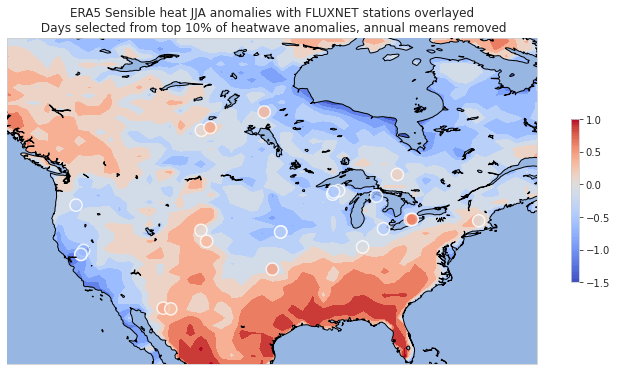

In [44]:
plt_anoms(flux_anoms.std_anoms_shflx, "Sensible heat", var="shflx", masked=True, cmin=-1.5, cmax=1, levels=20)

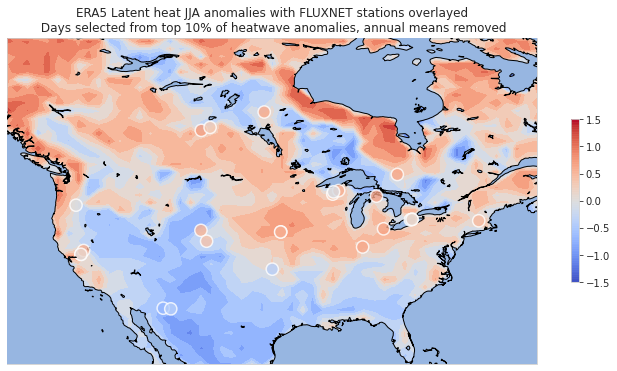

In [45]:
plt_anoms(flux_anoms.std_anoms_lhflx, "Latent heat", var="slhf", masked=True, cmin=-1.5, cmax=1.5, levels=20)

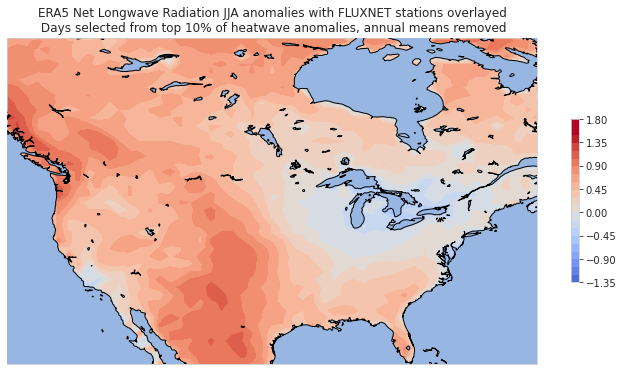

In [51]:
plt_anoms(df_2.std_anoms_lwrad, "Net Longwave Radiation", var="slhf", masked=False, cmin=-1.5, cmax=1.5, levels=20)

/home/dhruv/my_venv/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1508: UserWarning: The following kwargs were not used by contour: 'vcenter'
  result = matplotlib.axes.Axes.contourf(self, *args, **kwargs)


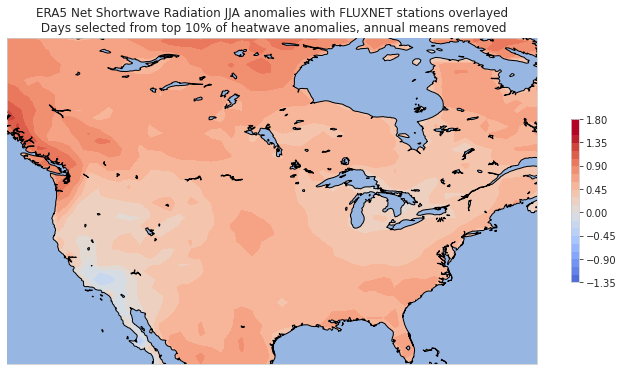

In [24]:
plt_anoms(-1*df_2.std_anoms_swrad, "Net Shortwave Radiation", var="slhf", masked=False, cmin=-1.5, cmax=1.5, levels=20)

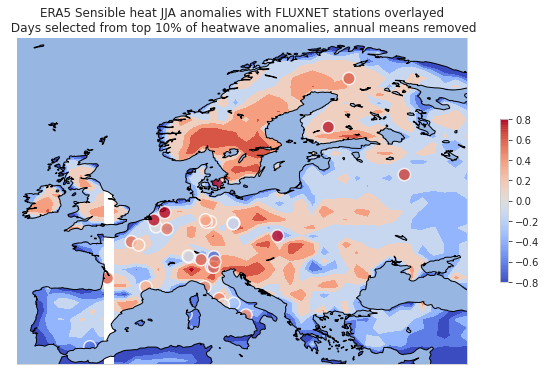

In [56]:
plt_anoms(flux_anoms.std_anoms_shflx, "Sensible heat", focus='eu', var="shflx", masked=True, cmin=-0.8, cmax=0.8, levels=20)

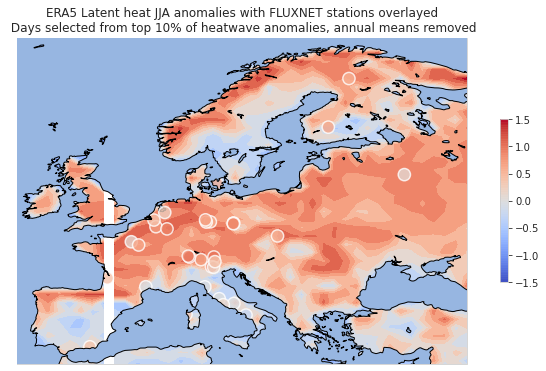

In [57]:
plt_anoms(flux_anoms.std_anoms_lhflx, "Latent heat", focus='eu', var="slhf", masked=True, cmin=-1.5, cmax=1.5, levels=20)

/home/dhruv/my_venv/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1508: UserWarning: The following kwargs were not used by contour: 'vcenter'
  result = matplotlib.axes.Axes.contourf(self, *args, **kwargs)


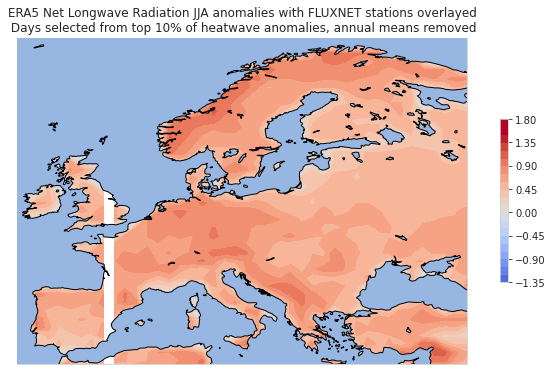

In [58]:
plt_anoms(df_2.std_anoms_lwrad, "Net Longwave Radiation", focus='eu', var="slhf", masked=False, cmin=-1.5, cmax=1.5, levels=20)

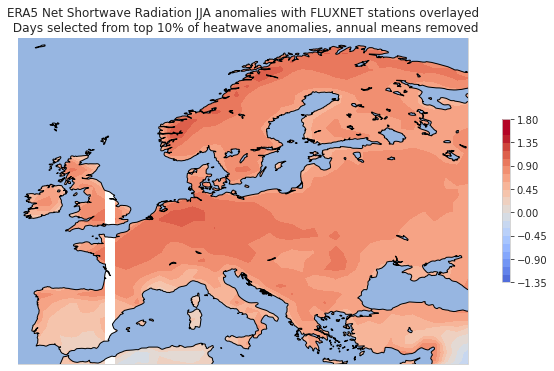

In [25]:
plt_anoms(-1*df_2.std_anoms_swrad, "Net Shortwave Radiation", focus='eu', var="slhf", masked=False, cmin=-1.5, cmax=1.5, levels=20)

europe quadrant

In [60]:
df_shflx = calc_heatwave_anoms('shflx')
df_slhf = calc_heatwave_anoms('slhf')
df_slhf=df_slhf.rename(columns={"lat": "lat", "lon": "lon", "hw_anom":"LH_anom"})
df_shflx=df_shflx.rename(columns={"lat": "lat", "lon": "lon", "hw_anom":"SH_anom"})

all_lats = np.array(df_shflx.lat)
all_lons = np.array(df_shflx.lon)
lats = []
lons = []
corrs = [] # 'a' =  ++ , 'b' = '+-' , 'c' ='-+' , d='--' (assum shflx first)

for lat in range(25):
    if(df_shflx[df_shflx['lat']==all_lats[lat]].SH_anom.item()>0):
        if(df_slhf[df_slhf['lat']==all_lats[lat]].LH_anom.item()>0):
            corrs.append(1)
        else:
            corrs.append(.5)
            
    if(df_shflx[df_shflx['lat']==all_lats[lat]].SH_anom.item()<0):
        if(df_slhf[df_slhf['lat']==all_lats[lat]].LH_anom.item()>0):
            corrs.append(-.5)
        else:
            corrs.append(-1)
    lats.append(all_lats[lat])
    lons.append(all_lons[lat])

corr_df_stations = pd.DataFrame({'lats':lats, 'lons':lons, 'corrs':corrs})

In [61]:
all_lats = flux_anoms.lat.data
all_lons = flux_anoms.lon.data
lats = []
lons = []
corr = [] # 'a' =  ++ , 'b' = '+-' , 'c' ='-+' , d='--' (assum shflx first)
for lat in all_lats:
    for lon in all_lons:
        if(flux_anoms.std_anoms_shflx.sel({'lat':lat, 'lon':lon}).data.item()>0):
            if(flux_anoms.std_anoms_lhflx.sel({'lat':lat, 'lon':lon}).data.item()>0):
                corr.append(1)
            else:
                corr.append(.5)
        if(flux_anoms.std_anoms_shflx.sel({'lat':lat, 'lon':lon}).data.item()<0):
            if(flux_anoms.std_anoms_lhflx.sel({'lat':lat, 'lon':lon}).data.item()>0):
                corr.append(-.5)
            else:
                corr.append(-1)
        lats.append(lat)
        lons.append(lon)

era_corr_df = pd.DataFrame({'lat':lats, 'lon':lons, 'corrs':corr})

In [62]:
era_corr_xr = era_corr_df.set_index(['lat', 'lon']).to_xarray()

Text(0.5, 1.0, 'ERA5 Quadrant Graph\n Red = ++, Salmon = +shflx,  Light Blue = +lhflx, Blue= --')

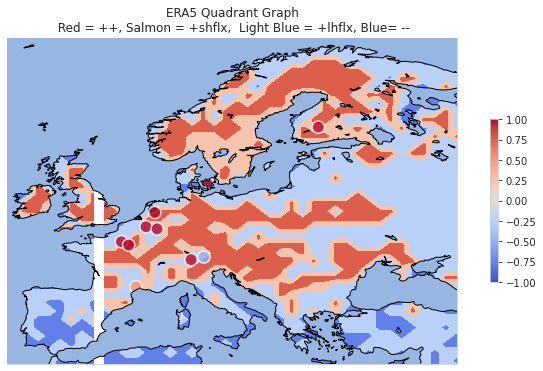

In [63]:
extent = [-11, 40, 35, 72]
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(1,1,1,projection=ccrs.PlateCarree())

ax.set_extent(extent, crs=ccrs.PlateCarree())
plt.contourf(era_corr_xr.lon, era_corr_xr.lat,era_corr_xr.corrs,cmap='coolwarm',levels=2)
plt.scatter(x = corr_df_stations.lons, y = corr_df_stations.lats, c = corr_df_stations.corrs,
            cmap = 'coolwarm',s=150, alpha=.8, linewidths=1.5,
            edgecolors='white' ,transform=ccrs.PlateCarree(),zorder = 5)
plt.colorbar(shrink = 0.5)
    

ax.add_feature(cfeature.OCEAN, zorder=100, edgecolor='k')
ax.add_feature(cfeature.LAKES, edgecolor='black')
plt.title('ERA5 Quadrant Graph\n Red = ++, Salmon = +shflx,  Light Blue = +lhflx, Blue= --')